In [12]:
import pandas as pd
import itertools
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('Solarize_Light2')

pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
import seaborn as sns

import statsmodels.api as sm
from scipy.stats import boxcox, jarque_bera, probplot
from scipy.special import inv_boxcox
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_breusch_godfrey
from pmdarima import auto_arima

from datetime import timedelta
from math import sqrt
import random

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error

import os
print(os.listdir("/Users/yc00027/Documents/air-quality-madrid/"))

import warnings
warnings.filterwarnings("ignore")

['.DS_Store', 'new_data', 'csvs_per_year', 'stations.csv', 'madrid.h5', '.ipynb_checkpoints']


In [13]:
# Define functions to fit an auto ARIMA model and generate predictions

def fit_autoARIMA(train):
    model = auto_arima(train.rename(None), trace=True, error_action='ignore', suppress_warnings=True) 
    model_fit = model.fit(train, transparams=False, disp=-1)
    return model_fit

def predict_autoARIMA(model_fit, test):
    predictions = model_fit.predict(n_periods=len(test))
    return predictions[0]

# Define function to plot actuals vs predictions

def plot_actuals_predictions(target, predictions_final, results_df):
    fig, ax = plt.subplots(figsize=(21,7))
    actuals = plt.plot(target, label='Actuals')
    predictions = plt.plot(predictions_final, label='Predictions')
    error = results_df['rmse'].mean()
    plt.legend(loc='best')
    plt.title('RMSE: %.2f'% error)
    plt.show()

# Define model evaluation function

def evaluate_forecast(target, predictions_final, model_name):
    results = {'models': model_name}
    results['r2_score'] = r2_score(target, predictions_final)
    results['mean_abs_error'] = mean_absolute_error(target, predictions_final)
    results['median_abs_error'] = median_absolute_error(target, predictions_final)
    results['mse'] = mean_squared_error(target, predictions_final)
    results['rmse'] = np.sqrt(results['mse'])
    return results

# Air quality Madrid - Rolling predictions

### Extracting the data

In [14]:
# Import full dataframe

df_full = pd.read_csv('full_madrid_air_quality.csv').set_index('date').sort_index()
df_full.index = pd.to_datetime(df_full.index)

# Select data for the time period, particles and stations of interest

first_date = '2012-01-01 00:00:00'
last_date = '2018-04-30 23:00:00'

particles_of_interest = ['NO_2', 'O_3', 'PM10', 'SO_2']

particle_of_interest = 'SO_2'

df_full['all_particles'] = df_full[particles_of_interest].sum(axis=1)

particles_of_interest = particles_of_interest + ['all_particles']

df_temp = df_full.loc[first_date:last_date][particles_of_interest + ['station']].sort_index()

print(f'The time period is from {first_date} to {last_date}')
print('')
print(f'The particle of interest is: {particle_of_interest}')
print('')
print(f'One particle DF shape: {df_temp.shape}')

df_temp.head()

The time period is from 2012-01-01 00:00:00 to 2018-04-30 23:00:00

The particle of interest is: SO_2

One particle DF shape: (2164032, 6)


,NO_2,O_3,PM10,SO_2,all_particles,station
date,,,,,,
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079001
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079022
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079019
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079021
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079012


## Rolling predictions

### Rolling autoARIMA: target = particle_of_interest

### Station nr 28079008 - Parque del Retiro/ Escuelas Aguirre

In [4]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079008

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079008

Missing values for particle and station of interest: 1.18%

One particle, one station DF shape: (54831, 9)


,SO_2,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,23.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,26.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,25.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,24.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,18.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1628.663, BIC=1651.121, Time=0.759 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1719.439, BIC=1726.925, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1637.379, BIC=1648.608, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1634.604, BIC=1645.833, Time=0.067 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1717.447, BIC=1721.190, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1634.483, BIC=1653.198, Time=0.159 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1627.562, BIC=1646.277, Time=0.274 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1634.337, BIC=1649.309, Time=0.146 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1636.308, BIC=1651.280, Time=0.128 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (5, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1289.640, BIC=1330.813, Time=1.476 seconds
Near non-invertible roots for order (5, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 11.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1275.057, BIC=1297.515, Time=0.622 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1303.645, BIC=1311.131, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1276.414, BIC=1287.643, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1276.645, BIC=1287.874, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1301.667, BIC=1305.410, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1279.974, BIC=1298.689, Time=0.211 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1278.856, BIC=1297.571, Ti

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1592.055, BIC=1607.027, Time=0.236 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1595.062, BIC=1617.520, Time=0.484 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1593.865, BIC=1612.580, Time=0.191 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1588.012, BIC=1614.213, Time=0.954 seconds
Total fit time: 4.234 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1634.596, BIC=1656.858, Time=1.123 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1714.831, BIC=1722.251, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1649.441, BIC=1660.573, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1640.030, BIC=1651.161, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1712.840, BIC=1716.551, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1524.850, BIC=1543.532, Time=0.259 seconds
Total fit time: 1.218 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1529.079, BIC=1551.479, Time=0.343 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1575.117, BIC=1582.583, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1543.405, BIC=1554.605, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1527.123, BIC=1538.323, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1573.129, BIC=1576.862, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1527.594, BIC=1542.527, Time=0.149 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1527.214, BIC=1542.147, Time=0.087 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1527.975, BIC=1546.641, Time=0.231 seconds
Total fit time: 0.992 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1933.368, BIC=1955.748, Time=0.476 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2035.952, BIC=2043.412, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1961.820, BIC=1973.010, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1932.195, BIC=1943.385, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2033.957, BIC=2037.687, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1933.926, BIC=1948.847, Time=0.185 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1933.983, BIC=1948.904, Time=0.150 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1933.504, BIC=1952.155, Time=0.203 seconds
Total fit time: 1.194 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1854.577, BIC=1876.958, Time=0.406 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1333.339, BIC=1348.259, Time=0.214 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1331.522, BIC=1353.903, Time=0.558 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1332.733, BIC=1351.384, Time=0.123 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1329.275, BIC=1347.926, Time=0.426 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1336.718, BIC=1351.639, Time=0.112 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1331.250, BIC=1353.631, Time=0.543 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1336.150, BIC=1354.801, Time=0.137 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1332.291, BIC=1358.402, Time=1.097 seconds
Total fit time: 4.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1264.538, BIC=1286.918, Time=0.722 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.125, BIC=1624.759, Time=0.455 seconds
Total fit time: 1.659 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1679.657, BIC=1701.959, Time=1.467 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1736.048, BIC=1743.482, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1698.807, BIC=1709.958, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1680.528, BIC=1691.679, Time=0.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1734.080, BIC=1737.797, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1677.009, BIC=1695.594, Time=1.586 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1680.431, BIC=1699.016, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1524.214, BIC=1539.121, Time=0.138 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1524.220, BIC=1539.127, Time=0.118 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1526.213, BIC=1544.847, Time=0.251 seconds
Total fit time: 0.929 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1517.300, BIC=1539.719, Time=0.265 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1574.358, BIC=1581.832, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1530.201, BIC=1541.411, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1514.963, BIC=1526.172, Time=0.068 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1572.401, BIC=1576.137, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1516.961, BIC=1531.908, Time=0.103 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1866.985, BIC=1885.652, Time=0.665 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1871.054, BIC=1889.721, Time=0.423 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1870.408, BIC=1896.541, Time=1.114 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1870.606, BIC=1896.739, Time=1.087 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1872.746, BIC=1887.679, Time=0.137 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1229.681, BIC=1252.081, Time=0.321 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1243.440, BIC=1250.906, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1232.102, BIC=1243.302, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1230.099, BIC=1241.299, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1241.489, BIC=1245.222, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1230.060, BIC=1248.727, Time=0.300 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1228.621, BIC=1247.288, Time=0.271 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1230.225, BIC=1245.159, Time=0.319 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1230.626, BIC=1245.560, Time=0.087 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1230.244, BIC=1252.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1705.015, BIC=1719.935, Time=0.137 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1705.019, BIC=1719.939, Time=0.147 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1706.977, BIC=1725.628, Time=0.431 seconds
Total fit time: 1.299 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1632.121, BIC=1654.502, Time=0.307 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1668.388, BIC=1675.848, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1644.048, BIC=1655.238, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1633.258, BIC=1644.449, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1666.532, BIC=1670.262, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1631.696, BIC=1650.346, Time=0.320 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1802.357, BIC=1824.738, Time=0.276 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1872.859, BIC=1880.319, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1826.908, BIC=1838.099, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1798.650, BIC=1809.840, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1870.901, BIC=1874.631, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1799.378, BIC=1814.298, Time=0.107 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1799.181, BIC=1814.102, Time=0.102 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1800.460, BIC=1819.110, Time=0.174 seconds
Total fit time: 0.833 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1859.150, BIC=1881.550, Time=0.240 seconds
F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1433.783, BIC=1456.125, Time=0.749 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1490.804, BIC=1498.251, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1438.117, BIC=1449.288, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1431.053, BIC=1442.224, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1488.944, BIC=1492.668, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1432.944, BIC=1447.839, Time=0.116 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1432.982, BIC=1447.876, Time=0.076 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1431.831, BIC=1450.449, Time=0.698 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1773.523, BIC=1799.634, Time=0.840 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1778.326, BIC=1804.437, Time=0.926 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1772.601, BIC=1787.522, Time=0.116 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1775.652, BIC=1798.033, Time=0.361 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1775.713, BIC=1798.093, Time=0.264 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1776.426, BIC=1806.267, Time=1.154 seconds
Total fit time: 5.379 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1684.606, BIC=1703.305, Time=0.189 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1676.671, BIC=1695.370, Time=0.534 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1683.009, BIC=1697.968, Time=0.111 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1684.912, BIC=1699.871, Time=0.113 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1676.192, BIC=1698.631, Time=0.585 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1686.911, BIC=1705.610, Time=0.145 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1676.416, BIC=1702.594, Time=0.578 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1676.581, BIC=1702.759, Time=0.652 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1682.653, BIC=1705.092, Time=0.157 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1678.872, BIC=1708.791, Time=0.882 seconds
Near non-invertible 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1558.876, BIC=1573.810, Time=0.141 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1559.048, BIC=1573.981, Time=0.115 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1560.838, BIC=1579.505, Time=0.214 seconds
Total fit time: 1.504 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1451.921, BIC=1474.321, Time=0.555 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1510.087, BIC=1517.554, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1456.459, BIC=1467.659, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1452.689, BIC=1463.889, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1508.170, BIC=1511.903, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1455.904, BIC=1474.571, Time=0.331 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1686.031, BIC=1708.431, Time=0.323 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1772.392, BIC=1779.858, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1694.722, BIC=1705.922, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1681.667, BIC=1692.867, Time=0.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1770.414, BIC=1774.147, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1682.107, BIC=1697.040, Time=0.104 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1682.393, BIC=1697.326, Time=0.103 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1684.076, BIC=1702.743, Time=0.202 seconds
Total fit time: 0.890 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1741.500, BIC=1763.919, Time=0.741 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1640.652, BIC=1659.351, Time=0.717 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1635.889, BIC=1662.068, Time=1.156 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1642.605, BIC=1668.783, Time=0.594 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1647.791, BIC=1670.230, Time=0.368 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1637.932, BIC=1667.850, Time=1.447 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1970.893, BIC=1989.608, Time=0.496 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1982.553, BIC=1997.525, Time=0.333 seconds
Total fit time: 3.207 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1924.238, BIC=1946.696, Time=1.209 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2020.384, BIC=2027.870, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1962.586, BIC=1973.815, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1926.873, BIC=1938.102, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2018.399, BIC=2022.142, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1922.238, BIC=1940.953, Time=0.740 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1924.616, BIC=1939.588, Time=0.179 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1313.792, BIC=1336.250, Time=0.829 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1332.956, BIC=1340.442, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1319.059, BIC=1330.288, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1314.869, BIC=1326.098, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1330.993, BIC=1334.736, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1312.206, BIC=1330.921, Time=0.389 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1314.041, BIC=1329.013, Time=0.084 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.080, BIC=1327.052, Time=0.165 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.659, BIC=1331.374, Time=0.293 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1316.151, BIC=1331.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1672.908, BIC=1695.366, Time=1.870 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1735.517, BIC=1743.003, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1684.787, BIC=1696.016, Time=0.136 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1674.936, BIC=1686.165, Time=0.359 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1733.593, BIC=1737.336, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1676.559, BIC=1695.274, Time=0.855 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1673.832, BIC=1692.548, Time=0.606 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1670.703, BIC=1696.904, Time=1.481 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2,

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1544.826, BIC=1567.284, Time=0.494 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1553.796, BIC=1572.511, Time=0.158 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1552.922, BIC=1571.637, Time=0.196 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1556.658, BIC=1582.859, Time=0.354 seconds
Total fit time: 2.477 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1675.425, BIC=1697.883, Time=0.280 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1735.575, BIC=1743.061, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1703.901, BIC=1715.130, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1678.467, BIC=1689.696, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1733.660, BIC=1737.403, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1600.018, BIC=1614.990, Time=0.106 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1601.356, BIC=1620.071, Time=0.375 seconds
Total fit time: 1.574 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1505.288, BIC=1527.629, Time=0.287 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1574.527, BIC=1581.975, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1513.898, BIC=1525.068, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1503.076, BIC=1514.246, Time=0.068 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1572.673, BIC=1576.396, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1505.068, BIC=1519.963, Time=0.125 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1505.071, BIC=1519.966, Time=0.092 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1376.489, BIC=1398.947, Time=0.317 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1376.874, BIC=1399.332, Time=0.333 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1377.499, BIC=1407.443, Time=0.474 seconds
Total fit time: 4.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1574.145, BIC=1596.603, Time=0.847 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1642.912, BIC=1650.398, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1583.515, BIC=1594.744, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1576.072, BIC=1587.301, Time=0.092 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1640.968, BIC=1644.711, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1579.557, BIC=1598.272, Time=0.549 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1595.560, BIC=1606.769, Time=0.162 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1669.402, BIC=1673.139, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1592.599, BIC=1611.282, Time=0.198 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1590.982, BIC=1609.665, Time=1.089 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1593.535, BIC=1619.691, Time=1.324 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1596.583, BIC=1622.739, Time=0.651 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1594.970, BIC=1609.916, Time=0.116 secon

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1710.436, BIC=1729.151, Time=0.243 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1710.958, BIC=1729.673, Time=0.289 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1702.218, BIC=1728.419, Time=1.175 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1705.300, BIC=1731.501, Time=0.613 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1708.637, BIC=1723.610, Time=0.142 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1702.468, BIC=1724.927, Time=0.948 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1701.557, BIC=1724.015, Time=0.893 second

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1791.309, BIC=1806.281, Time=0.135 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1781.009, BIC=1803.467, Time=0.517 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1792.421, BIC=1811.136, Time=0.243 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1782.315, BIC=1808.516, Time=0.767 seconds
Total fit time: 3.148 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1632.857, BIC=1655.334, Time=1.034 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1724.572, BIC=1732.064, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1641.819, BIC=1653.058, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1638.970, BIC=1650.209, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1722.574, BIC=1726.320, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1283.651, BIC=1302.382, Time=0.215 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1283.719, BIC=1302.450, Time=0.133 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1278.798, BIC=1305.021, Time=0.982 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1279.791, BIC=1306.014, Time=1.523 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1281.691, BIC=1296.676, Time=0.128 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1277.775, BIC=1300.252, Time=0.527 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1281.678, BIC=1300.409, Time=0.141 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1281.777, BIC=1308.000, Time=0.438 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=128

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1584.934, BIC=1611.158, Time=1.406 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1588.726, BIC=1611.204, Time=1.262 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1594.385, BIC=1624.355, Time=1.781 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1592.778, BIC=1622.748, Time=1.323 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1590.294, BIC=1616.518, Time=1.038 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1587.629, BIC=1621.345, Time=1.853 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1537.021, BIC=1555.623, Time=0.257 seconds
Total fit time: 1.176 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1535.896, BIC=1558.334, Time=0.379 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1577.707, BIC=1585.187, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1545.273, BIC=1556.492, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1531.951, BIC=1543.170, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1575.707, BIC=1579.447, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1532.153, BIC=1547.112, Time=0.131 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1532.298, BIC=1547.257, Time=0.100 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1533.928, BIC=1552.627, Time=0.243 seconds
Total fit time: 1.018 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2009.157, BIC=2024.091, Time=0.154 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2009.168, BIC=2024.102, Time=0.117 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2007.177, BIC=2025.843, Time=0.328 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2008.328, BIC=2030.728, Time=0.409 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2009.211, BIC=2027.877, Time=0.188 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2009.053, BIC=2027.719, Time=0.194 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2005.766, BIC=2031.900, Time=1.000 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 3.083 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1938.603, BIC=1961.003, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1367.325, BIC=1393.458, Time=0.618 seconds
Total fit time: 3.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1334.880, BIC=1357.280, Time=0.572 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1363.887, BIC=1371.354, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1339.990, BIC=1351.190, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1337.152, BIC=1348.352, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1361.893, BIC=1365.627, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1332.902, BIC=1351.568, Time=0.733 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1332.919, BIC=1351.585, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1612.084, BIC=1634.464, Time=0.515 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1669.733, BIC=1677.194, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1622.499, BIC=1633.689, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1606.542, BIC=1617.732, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1667.758, BIC=1671.488, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1608.314, BIC=1623.234, Time=0.166 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1608.329, BIC=1623.250, Time=0.120 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1610.321, BIC=1628.972, Time=0.638 seconds
Total fit time: 1.618 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1684.296, BIC=1706.618, Time=0.482 seconds
F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1531.663, BIC=1554.044, Time=0.254 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1586.414, BIC=1593.875, Time=0.166 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1536.269, BIC=1547.459, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1526.312, BIC=1537.502, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1584.461, BIC=1588.191, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1528.227, BIC=1543.148, Time=0.104 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1528.232, BIC=1543.152, Time=0.093 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1530.227, BIC=1548.877, Time=0.232 seconds
Total fit time: 0.980 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1521.172, BIC=1543.611, Time=0.246 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1982.947, BIC=2012.865, Time=1.293 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 7.474 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1873.914, BIC=1896.334, Time=0.941 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1971.974, BIC=1979.447, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1901.336, BIC=1912.546, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1876.365, BIC=1887.574, Time=0.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1969.992, BIC=1973.729, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1880.365, BIC=1899.048, Time=0.175 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1876.356, BIC=1895.039, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1295.422, BIC=1310.369, Time=0.340 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1299.490, BIC=1321.909, Time=0.454 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1297.801, BIC=1316.484, Time=0.132 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1297.041, BIC=1315.723, Time=0.229 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1296.871, BIC=1323.027, Time=1.062 seconds
Total fit time: 3.681 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1233.111, BIC=1255.531, Time=0.368 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1246.773, BIC=1254.246, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1235.410, BIC=1246.619, Time=0.036 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1233.313, BIC=1244.523, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1711.509, BIC=1730.176, Time=0.336 seconds
Total fit time: 3.148 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1636.862, BIC=1659.262, Time=0.365 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1672.791, BIC=1680.257, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1648.367, BIC=1659.567, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1637.704, BIC=1648.904, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1670.934, BIC=1674.668, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1636.449, BIC=1655.115, Time=0.476 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1635.787, BIC=1650.721, Time=0.149 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1637.490, BIC=1656.156, Time=0.191 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1804.452, BIC=1819.386, Time=0.123 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1804.270, BIC=1819.204, Time=0.113 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1805.644, BIC=1824.311, Time=0.228 seconds
Total fit time: 0.972 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1864.844, BIC=1887.263, Time=0.300 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1952.120, BIC=1959.593, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1897.060, BIC=1908.270, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1862.411, BIC=1873.620, Time=0.344 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1950.157, BIC=1953.893, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1864.181, BIC=1879.127, Time=0.419 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1436.646, BIC=1451.553, Time=0.125 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1436.680, BIC=1451.587, Time=0.079 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1435.480, BIC=1454.114, Time=0.750 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.155 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1348.635, BIC=1370.996, Time=0.924 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1396.554, BIC=1404.008, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1353.389, BIC=1364.570, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1346.396, BIC=1357.576, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1394.671, BIC=1398.398, Tim

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1780.393, BIC=1802.794, Time=0.452 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1780.458, BIC=1802.858, Time=0.364 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1781.086, BIC=1810.952, Time=1.859 seconds
Total fit time: 6.445 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1753.066, BIC=1775.486, Time=1.012 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1818.365, BIC=1825.838, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1767.058, BIC=1778.268, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1755.659, BIC=1766.868, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1816.411, BIC=1820.147, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1751.317, BIC=1770.000, Time=1.040 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1685.916, BIC=1697.145, Time=0.210 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1772.027, BIC=1775.770, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1689.022, BIC=1707.737, Time=0.495 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1681.033, BIC=1699.748, Time=1.482 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1687.427, BIC=1702.399, Time=0.315 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1689.376, BIC=1704.348, Time=0.266 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1680.539, BIC=1702.997, Time=1.166 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1691.375, BIC=1710.090, Time=0.434 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1680.760, BIC=1706.961, Time=1.686 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1680.927, BIC=1707.129, Time=1.462 seconds
Fit ARIMA: (4, 1, 0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1563.694, BIC=1586.114, Time=1.508 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1636.074, BIC=1643.547, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1570.933, BIC=1582.143, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1561.665, BIC=1572.875, Time=0.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1634.138, BIC=1637.874, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1562.893, BIC=1577.839, Time=0.289 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1563.065, BIC=1578.011, Time=0.823 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1564.855, BIC=1583.537, Time=0.515 seconds
Total fit time: 3.419 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1455.579, BIC=1477.998, Time=1.038 seconds
F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1577.200, BIC=1599.601, Time=0.903 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1646.884, BIC=1654.351, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1584.082, BIC=1595.282, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1575.224, BIC=1586.424, Time=0.136 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1644.901, BIC=1648.635, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1576.907, BIC=1591.840, Time=0.325 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1576.998, BIC=1591.932, Time=0.296 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1576.131, BIC=1594.798, Time=0.788 seconds
Total fit time: 2.555 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1691.234, BIC=1713.653, Time=0.733 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1585.744, BIC=1600.716, Time=0.499 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1587.318, BIC=1606.033, Time=0.444 seconds
Total fit time: 2.945 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1648.707, BIC=1671.165, Time=0.652 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1732.354, BIC=1739.840, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1654.598, BIC=1665.827, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1651.255, BIC=1662.484, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1730.390, BIC=1734.133, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1651.751, BIC=1670.466, Time=0.318 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1644.892, BIC=1663.607, Time=1.760 seconds
Near non-invertible roots for order (2, 1, 1

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1921.089, BIC=1943.566, Time=0.917 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1933.300, BIC=1952.031, Time=0.308 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1923.081, BIC=1949.305, Time=1.295 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1933.327, BIC=1948.312, Time=0.317 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1934.644, BIC=1957.121, Time=0.427 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1924.843, BIC=1954.813, Time=2.046 seconds
Total fit time: 13.390 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1976.758, BIC=1999.235, Time=0.600 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2068.563, BIC=2076.055, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2018.922, BIC=2030.161, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1457.309, BIC=1476.040, Time=0.369 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1456.561, BIC=1471.546, Time=0.124 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1458.558, BIC=1477.289, Time=0.242 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1456.084, BIC=1471.069, Time=0.188 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1457.768, BIC=1476.499, Time=0.373 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1461.907, BIC=1476.892, Time=0.158 seconds
Total fit time: 2.133 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1367.732, BIC=1390.210, Time=1.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1394.583, BIC=1402.076, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1376.744, BIC=1387.983, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1578.178, BIC=1604.401, Time=1.423 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.092 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1709.549, BIC=1732.026, Time=0.643 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1776.484, BIC=1783.977, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1728.105, BIC=1739.344, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1709.136, BIC=1720.374, Time=0.162 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1774.512, BIC=1778.258, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1710.310, BIC=1725.294, Time=0.148 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1710.387, BIC=1725.372, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1542.225, BIC=1557.210, Time=0.160 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1542.099, BIC=1557.084, Time=0.110 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1534.899, BIC=1553.630, Time=0.370 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1535.862, BIC=1558.339, Time=0.573 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1540.145, BIC=1558.876, Time=0.148 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1539.727, BIC=1558.458, Time=0.261 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1537.653, BIC=1563.876, Time=0.918 seconds
Total fit time: 3.351 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1560.031, BIC=1582.508, Time=0.465 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1622.102, BIC=1629.595, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1752.260, BIC=1774.737, Time=0.790 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1847.483, BIC=1854.976, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1779.980, BIC=1791.218, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1748.060, BIC=1759.299, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1845.563, BIC=1849.309, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1749.421, BIC=1764.406, Time=0.172 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1749.526, BIC=1764.511, Time=0.138 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1751.416, BIC=1770.147, Time=0.306 seconds
Total fit time: 1.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1605.109, BIC=1627.586, Time=0.789 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1348.393, BIC=1367.124, Time=0.363 seconds
Total fit time: 1.646 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1378.069, BIC=1400.546, Time=0.497 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1426.238, BIC=1433.730, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1383.149, BIC=1394.388, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1382.428, BIC=1393.666, Time=0.103 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1424.296, BIC=1428.042, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1380.314, BIC=1399.045, Time=0.398 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1379.611, BIC=1398.342, Time=0.686 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1379.213, BIC=1405.437, Time=0.607 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1718.437, BIC=1740.914, Time=1.208 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1722.251, BIC=1752.221, Time=1.758 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 10.059 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1595.823, BIC=1618.262, Time=1.231 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1675.815, BIC=1683.295, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1603.366, BIC=1614.585, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1600.058, BIC=1611.277, Time=0.110 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1558.744, BIC=1573.716, Time=0.167 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1558.745, BIC=1573.717, Time=0.118 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1559.611, BIC=1578.326, Time=0.425 seconds
Total fit time: 1.344 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1707.265, BIC=1729.742, Time=0.879 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1804.014, BIC=1811.506, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1720.409, BIC=1731.647, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1713.963, BIC=1725.202, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1802.028, BIC=1805.774, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1715.253, BIC=1733.984, Time=0.337 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1785.966, BIC=1808.444, Time=0.781 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1880.072, BIC=1887.565, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1800.834, BIC=1812.072, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1789.450, BIC=1800.689, Time=0.171 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1878.077, BIC=1881.824, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1792.498, BIC=1811.229, Time=0.298 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1784.683, BIC=1803.414, Time=0.391 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1791.370, BIC=1806.355, Time=0.184 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1796.081, BIC=1811.066, Time=0.179 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1785.890, BIC=1808.

Fit ARIMA: (5, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1303.202, BIC=1336.947, Time=1.800 seconds
Fit ARIMA: (5, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1296.009, BIC=1337.252, Time=2.930 seconds
Near non-invertible roots for order (5, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 23.262 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1280.939, BIC=1303.435, Time=1.239 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1311.049, BIC=1318.548, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1283.252, BIC=1294.500, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1283.503, BIC=1294.751, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1309.057, BIC=1312.806, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1286.817, BIC=1305.564, Ti

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1589.399, BIC=1615.645, Time=2.226 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1593.662, BIC=1616.158, Time=1.804 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1598.969, BIC=1628.964, Time=2.155 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1597.601, BIC=1627.596, Time=1.983 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1595.430, BIC=1621.676, Time=1.102 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1592.245, BIC=1625.989, Time=1.655 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1536.887, BIC=1551.859, Time=0.214 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1536.973, BIC=1551.945, Time=0.163 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1538.544, BIC=1557.259, Time=0.343 seconds
Total fit time: 1.482 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1538.649, BIC=1561.088, Time=0.632 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1585.407, BIC=1592.887, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1553.322, BIC=1564.541, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1536.546, BIC=1547.765, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1583.413, BIC=1587.153, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1536.809, BIC=1551.769, Time=0.251 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1943.932, BIC=1966.352, Time=0.604 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2047.236, BIC=2054.709, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1972.681, BIC=1983.891, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1942.734, BIC=1953.944, Time=0.752 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2045.239, BIC=2048.976, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1944.484, BIC=1959.430, Time=0.322 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1944.537, BIC=1959.483, Time=0.166 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1944.012, BIC=1962.695, Time=0.336 seconds
Total fit time: 2.283 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1864.839, BIC=1887.259, Time=0.603 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1336.182, BIC=1354.865, Time=1.350 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1336.198, BIC=1354.880, Time=0.538 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.230, BIC=1355.176, Time=0.267 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1344.264, BIC=1359.211, Time=0.225 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1338.175, BIC=1360.595, Time=0.600 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1343.372, BIC=1362.055, Time=0.164 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1339.158, BIC=1365.314, Time=1.063 seconds
Total fit time: 5.290 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1270.733, BIC=1293.153, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1614.887, BIC=1633.554, Time=0.812 seconds
Total fit time: 1.850 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1689.025, BIC=1711.367, Time=0.650 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1745.968, BIC=1753.415, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1708.562, BIC=1719.733, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1690.054, BIC=1701.225, Time=0.097 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1743.987, BIC=1747.711, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1686.341, BIC=1704.959, Time=1.165 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1689.806, BIC=1708.424, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1610.691, BIC=1625.638, Time=0.141 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1610.687, BIC=1625.633, Time=0.116 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1611.161, BIC=1629.844, Time=0.355 seconds
Total fit time: 1.264 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1536.014, BIC=1558.414, Time=0.525 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1590.659, BIC=1598.125, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1540.638, BIC=1551.838, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1530.475, BIC=1541.675, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1588.698, BIC=1592.431, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1532.419, BIC=1547.352, Time=0.159 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1988.140, BIC=2010.598, Time=1.146 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1988.401, BIC=2018.345, Time=1.680 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 12.218 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1878.686, BIC=1901.125, Time=1.121 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1977.353, BIC=1984.832, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1906.492, BIC=1917.711, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1881.416, BIC=1892.635, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1298.696, BIC=1313.655, Time=0.696 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1303.060, BIC=1325.499, Time=0.631 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1301.274, BIC=1319.973, Time=0.160 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1300.704, BIC=1319.403, Time=0.344 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1300.543, BIC=1326.722, Time=1.752 seconds
Total fit time: 6.174 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1236.569, BIC=1259.007, Time=0.542 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1250.102, BIC=1257.582, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1238.863, BIC=1250.083, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1236.761, BIC=1247.980, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1663.208, BIC=1693.049, Time=1.676 seconds
Total fit time: 10.871 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1682.295, BIC=1704.695, Time=0.299 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1739.576, BIC=1747.043, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1690.943, BIC=1702.143, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1676.320, BIC=1687.520, Time=0.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1737.627, BIC=1741.361, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1678.308, BIC=1693.242, Time=0.167 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1678.308, BIC=1693.241, Time=0.200 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1680.303, BIC=1698.969, Time=0.234 seconds
Total fit time: 1.106 seconds
Performing st

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1607.616, BIC=1630.055, Time=1.232 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1670.109, BIC=1677.588, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1621.144, BIC=1632.364, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1608.933, BIC=1620.153, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1668.115, BIC=1671.855, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1612.933, BIC=1631.632, Time=0.182 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1612.781, BIC=1631.480, Time=0.290 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1609.413, BIC=1635.591, Time=1.229 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=16

Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1809.755, BIC=1832.155, Time=0.406 seconds
Fit ARIMA: (5, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1802.200, BIC=1832.067, Time=0.920 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1801.835, BIC=1831.702, Time=1.593 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1801.004, BIC=1827.137, Time=0.633 seconds
Fit ARIMA: (5, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1810.164, BIC=1836.297, Time=0.548 seconds
Fit ARIMA: (5, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1803.587, BIC=1837.187, Time=1.869 seconds
Total fit time: 9.501 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1676.625, BIC=1699.025, Time=0.785 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1770.155, BIC=1777.622, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1694.798, BIC=1705.998, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1596.064, BIC=1618.484, Time=0.449 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1655.657, BIC=1663.130, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1603.399, BIC=1614.609, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1592.808, BIC=1604.018, Time=0.097 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1653.725, BIC=1657.462, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1594.609, BIC=1609.555, Time=0.232 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1594.680, BIC=1609.626, Time=0.219 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1592.841, BIC=1611.524, Time=1.415 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.502 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1573.274, BIC=1591.956, Time=0.275 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1581.546, BIC=1596.492, Time=0.136 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1581.658, BIC=1596.604, Time=0.355 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1574.977, BIC=1597.397, Time=0.602 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1582.048, BIC=1600.731, Time=0.164 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1581.393, BIC=1600.076, Time=0.208 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1573.842, BIC=1599.998, Time=1.583 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.054 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1585.582, BIC=1608.059, Time

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1983.038, BIC=1986.777, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1887.790, BIC=1902.750, Time=0.184 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1887.778, BIC=1902.737, Time=0.158 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1886.963, BIC=1905.662, Time=0.163 seconds
Total fit time: 1.038 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1892.532, BIC=1914.971, Time=0.748 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1995.492, BIC=2002.971, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1925.457, BIC=1936.677, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1890.652, BIC=1901.871, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1993.505, BIC=1997.245, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1352.091, BIC=1370.790, Time=1.142 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.816 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1291.819, BIC=1314.258, Time=1.234 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1321.042, BIC=1328.522, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1290.349, BIC=1301.568, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1290.067, BIC=1301.286, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1319.198, BIC=1322.938, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1291.510, BIC=1306.469, Time=0.189 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1291.686, BIC=1306.645, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1820.853, BIC=1843.330, Time=0.440 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1911.334, BIC=1918.827, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1832.108, BIC=1843.346, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1817.828, BIC=1829.066, Time=0.120 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1909.347, BIC=1913.093, Time=0.010 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1819.037, BIC=1834.022, Time=0.153 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1819.216, BIC=1834.201, Time=0.222 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1819.496, BIC=1838.227, Time=0.246 seconds
Total fit time: 1.259 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1808.672, BIC=1831.150, Time=0.409 seconds
F

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1759.498, BIC=1785.744, Time=0.586 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1765.835, BIC=1788.331, Time=0.360 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1756.055, BIC=1786.050, Time=1.513 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1760.101, BIC=1790.096, Time=0.765 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1760.785, BIC=1787.031, Time=0.645 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1755.276, BIC=1789.021, Time=1.771 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 8.639 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1783.223, BIC=1805.720, Time=0.618 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1856.544, BIC=1864.043, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1820.398, BIC=1831.646, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1788.474, BIC=1799.722, Time=0.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1854.549, BIC=1858.299, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1781.253, BIC=1800.000, Time=0.418 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1780.033, BIC=1795.031, Time=0.199 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1781.684, BIC=1800.431, Time=0.313 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1779.276, BIC=1794.274, Time=0.255 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1781.261, BIC=1800.008, Time=0.335 seconds
Fit ARIMA: (2, 1, 0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1310.720, BIC=1329.467, Time=1.647 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.175, BIC=1330.922, Time=0.398 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.522, BIC=1327.519, Time=0.212 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1316.719, BIC=1331.716, Time=0.116 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.687, BIC=1335.184, Time=1.076 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1317.672, BIC=1336.419, Time=0.152 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1315.227, BIC=1341.472, Time=1.226 second

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1680.098, BIC=1706.344, Time=1.901 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1682.729, BIC=1708.975, Time=1.265 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1686.221, BIC=1701.218, Time=0.154 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1682.107, BIC=1704.603, Time=1.052 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1681.574, BIC=1704.070, Time=1.062 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1686.450, BIC=1705.197, Time=0.274 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1683.029, BIC=1701.776, Time=0.269 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1687.567, BIC=1702.565, Time=0.187 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1682.102, BIC=1697.099, Time=0.181 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1682.718, BIC=1701.465, Time=0.266 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1683.683, BIC=1706.179, Time=0.604 seconds
Total fit time: 2.502 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1819.216, BIC=1841.712, Time=0.458 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1892.412, BIC=1899.911, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1847.844, BIC=1859.092, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1462.672, BIC=1485.168, Time=0.408 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1514.048, BIC=1521.547, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1481.043, BIC=1492.291, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1461.735, BIC=1472.984, Time=0.114 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1512.148, BIC=1515.898, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1460.959, BIC=1475.956, Time=0.157 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1462.829, BIC=1481.576, Time=0.460 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1460.672, BIC=1479.419, Time=0.276 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1460.569, BIC=1475.566, Time=0.106 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1462.049, BIC=1480.796, Time=0.154 seconds
Fit ARIMA: (1, 1, 3

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1707.359, BIC=1729.836, Time=0.448 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1766.636, BIC=1774.129, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1717.504, BIC=1728.743, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1708.801, BIC=1720.040, Time=0.116 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1764.693, BIC=1768.439, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1704.748, BIC=1723.479, Time=0.990 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1705.457, BIC=1724.188, Time=0.269 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1709.084, BIC=1724.069, Time=0.196 seconds
Fit ARIMA: (2,

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1550.039, BIC=1568.754, Time=0.447 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1554.478, BIC=1569.450, Time=0.125 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1553.676, BIC=1568.648, Time=0.209 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1550.070, BIC=1572.528, Time=1.219 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1554.761, BIC=1573.476, Time=0.205 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1549.727, BIC=1568.442, Time=0.829 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1547.837, BIC=1574.038, Time=1.634 second

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1822.184, BIC=1844.680, Time=1.104 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1825.186, BIC=1855.181, Time=1.367 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 9.022 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1920.745, BIC=1943.242, Time=1.162 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2009.207, BIC=2016.705, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1945.477, BIC=1956.725, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1926.551, BIC=1937.799, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1578.720, BIC=1593.717, Time=0.170 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1569.374, BIC=1591.871, Time=0.553 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1576.529, BIC=1595.276, Time=0.201 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1564.922, BIC=1591.168, Time=0.712 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.955 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1540.418, BIC=1562.934, Time=0.476 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1602.259, BIC=1609.764, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1547.233, BIC=1558.491, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1534.616, BIC=1545.874, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1255.377, BIC=1281.645, Time=1.387 seconds
Total fit time: 5.987 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1268.978, BIC=1291.493, Time=0.775 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1292.394, BIC=1299.899, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1270.756, BIC=1282.014, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1270.566, BIC=1281.823, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1290.409, BIC=1294.161, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1274.181, BIC=1292.944, Time=0.383 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1266.543, BIC=1285.306, Time=1.128 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1651.073, BIC=1669.491, Time=0.383 seconds
Total fit time: 1.641 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1658.341, BIC=1680.361, Time=0.669 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1723.659, BIC=1730.999, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1676.768, BIC=1687.778, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1652.940, BIC=1663.950, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1721.659, BIC=1725.329, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1654.387, BIC=1669.067, Time=0.196 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1654.375, BIC=1669.055, Time=0.124 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1656.347, BIC=1674.697, Time=0.308 seconds
Total fit time: 1.483 seconds
Performing ste

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2034.881, BIC=2038.621, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1954.082, BIC=1972.781, Time=0.933 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1957.406, BIC=1976.105, Time=0.402 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1958.109, BIC=1984.288, Time=1.161 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1955.852, BIC=1982.031, Time=1.366 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1958.820, BIC=1973.779, Time=0.181 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1955.364, BIC=1977.803, Time=1.085 secon

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1373.696, BIC=1396.134, Time=0.693 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1404.613, BIC=1412.092, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1380.474, BIC=1391.694, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1380.127, BIC=1391.346, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1402.613, BIC=1406.353, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1373.812, BIC=1392.511, Time=0.910 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1372.561, BIC=1391.260, Time=0.585 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1380.183, BIC=1395.142, Time=0.294 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=13

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1451.257, BIC=1469.939, Time=1.099 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1454.105, BIC=1472.788, Time=0.563 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1454.780, BIC=1480.936, Time=1.051 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1453.666, BIC=1479.822, Time=1.623 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1454.869, BIC=1469.815, Time=0.223 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1459.285, BIC=1481.705, Time=0.490 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1452.608, BIC=1475.027, Time=1.125 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1625.884, BIC=1644.502, Time=1.510 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1627.611, BIC=1646.229, Time=1.582 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1629.868, BIC=1655.933, Time=2.432 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1637.753, BIC=1663.818, Time=1.980 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1723.360, BIC=1757.076, Time=2.489 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1718.967, BIC=1748.936, Time=2.216 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1717.480, BIC=1747.449, Time=2.071 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1707.181, BIC=1744.643, Time=1.958 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 21.759 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1879.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1747.066, BIC=1765.765, Time=0.186 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1747.427, BIC=1766.126, Time=0.221 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1738.515, BIC=1764.694, Time=1.008 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1736.186, BIC=1758.625, Time=1.056 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1739.085, BIC=1769.003, Time=1.612 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1736.267, BIC=1766.185, Time=1.319 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1741.984, BIC=1768.162, Time=1.563 second

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1302.114, BIC=1317.086, Time=0.306 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1300.020, BIC=1322.478, Time=0.981 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1304.900, BIC=1323.615, Time=0.170 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1304.365, BIC=1323.080, Time=0.308 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1303.890, BIC=1330.091, Time=1.256 seconds
Total fit time: 4.879 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1239.992, BIC=1262.450, Time=0.497 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1253.428, BIC=1260.914, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1242.312, BIC=1253.541, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1240.270, BIC=1251.499, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1668.423, BIC=1687.090, Time=0.191 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1667.832, BIC=1686.499, Time=0.316 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1665.386, BIC=1691.519, Time=1.171 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1665.885, BIC=1692.019, Time=1.339 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1666.388, BIC=1681.321, Time=0.129 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1669.264, BIC=1691.664, Time=0.781 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1663.171, BIC=1685.572, Time=1.359 second

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1556.753, BIC=1579.211, Time=0.930 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1619.680, BIC=1627.166, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1566.933, BIC=1578.162, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1553.476, BIC=1564.705, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1617.695, BIC=1621.438, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1555.476, BIC=1570.448, Time=0.157 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1555.476, BIC=1570.448, Time=0.175 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1555.403, BIC=1574.118, Time=0.683 seconds
Total fit time: 2.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1612.335, BIC=1634.793, Time=1.279 seconds
F

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1923.667, BIC=1927.403, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1815.824, BIC=1834.507, Time=0.267 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1815.649, BIC=1834.332, Time=0.472 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1806.859, BIC=1833.015, Time=0.575 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1806.903, BIC=1829.322, Time=0.610 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1808.050, BIC=1837.943, Time=1.652 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1808.619, BIC=1838.512, Time=0.975 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1814.760, BIC=1840.916, Time=0.913 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1806.414, BIC=1832.570, Time=0.678 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1816.164, BIC=1838.583, Time=0.304 seconds
Fit ARIMA: (5, 1, 1

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1427.216, BIC=1442.150, Time=0.162 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1427.233, BIC=1442.166, Time=0.128 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1429.275, BIC=1447.941, Time=0.154 seconds
Total fit time: 1.914 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1600.181, BIC=1622.620, Time=0.446 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1660.058, BIC=1667.537, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1607.558, BIC=1618.777, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1596.985, BIC=1608.205, Time=0.126 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1658.135, BIC=1661.875, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1598.773, BIC=1613.732, Time=0.203 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1577.392, BIC=1596.091, Time=0.328 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1585.672, BIC=1600.631, Time=0.128 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1585.782, BIC=1600.742, Time=0.297 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1579.083, BIC=1601.522, Time=0.527 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1586.141, BIC=1604.840, Time=0.188 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1585.475, BIC=1604.174, Time=0.821 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1578.179, BIC=1604.358, Time=1.585 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.535 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1589.614, BIC=1612.110, Time

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1891.669, BIC=1902.898, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1990.278, BIC=1994.021, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1893.418, BIC=1908.390, Time=0.181 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1893.407, BIC=1908.379, Time=0.172 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1892.845, BIC=1911.560, Time=0.297 seconds
Total fit time: 1.281 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1898.431, BIC=1920.889, Time=0.819 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2003.157, BIC=2010.643, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1931.451, BIC=1942.680, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1896.205, BIC=1907.434, Time=0.141 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1355.695, BIC=1374.410, Time=0.887 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.369 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1294.856, BIC=1317.314, Time=1.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1324.501, BIC=1331.987, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1293.501, BIC=1304.730, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1293.205, BIC=1304.434, Time=0.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1322.679, BIC=1326.422, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1294.647, BIC=1309.619, Time=0.161 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1294.822, BIC=1309.794, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1826.773, BIC=1849.269, Time=0.379 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1921.030, BIC=1928.529, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1839.104, BIC=1850.352, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1823.743, BIC=1834.992, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1919.083, BIC=1922.833, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1824.820, BIC=1839.818, Time=0.141 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1825.015, BIC=1840.012, Time=0.126 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1825.257, BIC=1844.004, Time=0.224 seconds
Total fit time: 1.059 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1814.108, BIC=1836.604, Time=0.408 seconds
F

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1764.059, BIC=1790.327, Time=0.546 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1770.435, BIC=1792.950, Time=0.347 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1760.290, BIC=1790.311, Time=1.393 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1764.666, BIC=1794.687, Time=0.714 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1765.367, BIC=1791.635, Time=0.487 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1759.738, BIC=1793.511, Time=1.672 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 7.431 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1786.400, BIC=1805.163, Time=0.231 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1784.008, BIC=1799.018, Time=0.206 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1785.994, BIC=1804.757, Time=0.284 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1806.350, BIC=1821.361, Time=0.180 seconds
Total fit time: 2.081 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1704.309, BIC=1726.824, Time=1.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1774.459, BIC=1781.964, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1744.457, BIC=1755.715, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1715.488, BIC=1726.746, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1772.468, BIC=1776.221, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1376.519, BIC=1399.035, Time=1.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1407.888, BIC=1415.393, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1381.203, BIC=1392.460, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1377.643, BIC=1388.901, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1405.890, BIC=1409.643, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1373.916, BIC=1392.679, Time=1.056 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1374.375, BIC=1393.138, Time=0.910 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1686.011, BIC=1712.279, Time=1.517 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1691.814, BIC=1718.082, Time=1.634 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1693.783, BIC=1708.793, Time=0.257 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1688.897, BIC=1711.413, Time=1.892 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1688.403, BIC=1710.918, Time=1.368 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1572.988, BIC=1595.504, Time=0.386 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1633.627, BIC=1641.132, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1597.985, BIC=1609.243, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1574.286, BIC=1585.544, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1631.671, BIC=1635.424, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1560.432, BIC=1579.194, Time=0.383 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1575.104, BIC=1590.114, Time=0.115 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1575.576, BIC=1590.586, Time=0.148 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1561.447, BIC=1583.962, Time=0.489 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1571.943, BIC=1590.706, Time=0.145 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1760.828, BIC=1779.590, Time=0.313 seconds
Total fit time: 1.384 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1613.368, BIC=1635.884, Time=0.689 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1695.299, BIC=1702.804, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1625.677, BIC=1636.935, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1610.734, BIC=1621.991, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1693.410, BIC=1697.163, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1612.733, BIC=1627.743, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1612.733, BIC=1627.743, Time=0.130 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1614.078, BIC=1632.841, Time=0.695 seconds
Total fit time: 1.869 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1388.841, BIC=1407.603, Time=0.350 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1386.752, BIC=1405.515, Time=0.986 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1387.374, BIC=1413.642, Time=0.447 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1386.879, BIC=1413.147, Time=1.654 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1392.726, BIC=1407.737, Time=0.189 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1388.497, BIC=1411.012, Time=0.421 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1388.390, BIC=1410.905, Time=0.509 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1388.277, BIC=1418.298, Time=1.752 seconds
Total fit time: 7.057 seconds
Performing stepwise search t

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.145, BIC=1624.876, Time=0.440 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1604.534, BIC=1623.265, Time=0.920 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.532, BIC=1632.755, Time=1.188 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1609.120, BIC=1635.343, Time=0.852 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1609.060, BIC=1624.045, Time=0.149 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1608.141, BIC=1630.619, Time=0.524 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1604.835, BIC=1627.312, Time=1.325 second

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1719.513, BIC=1749.534, Time=1.781 seconds
Total fit time: 8.674 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1827.733, BIC=1850.249, Time=1.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1927.859, BIC=1935.364, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1845.019, BIC=1856.276, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1835.364, BIC=1846.622, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1925.865, BIC=1929.617, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1837.701, BIC=1856.464, Time=0.297 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1828.293, BIC=1847.056, Time=1.236 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1652.332, BIC=1663.599, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1736.404, BIC=1740.160, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1652.395, BIC=1671.173, Time=0.311 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1645.089, BIC=1663.868, Time=0.480 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1652.304, BIC=1667.327, Time=0.214 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1654.444, BIC=1669.467, Time=0.142 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1646.156, BIC=1668.691, Time=1.150 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1654.363, BIC=1673.142, Time=0.166 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=16

Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1301.045, BIC=1338.602, Time=2.109 seconds
Total fit time: 14.084 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1287.083, BIC=1309.617, Time=1.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1317.640, BIC=1325.151, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1289.683, BIC=1300.951, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1289.971, BIC=1301.238, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1315.643, BIC=1319.399, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1293.261, BIC=1312.040, Time=0.271 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1292.022, BIC=1310.801, Time=0.472 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1288.038, BIC=1314.329, Time=1.636 seconds
Near non-invertible roots for order (3, 1, 

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1613.150, BIC=1631.929, Time=0.254 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.021, BIC=1632.311, Time=1.178 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.344 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1648.667, BIC=1670.989, Time=1.119 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1730.607, BIC=1738.047, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1665.012, BIC=1676.173, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1654.420, BIC=1665.581, Time=0.101 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1728.608, BIC=1732.329, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1657.900, BIC=1676.502, Tim

Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1546.519, BIC=1580.090, Time=1.438 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1548.751, BIC=1578.591, Time=1.481 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1546.151, BIC=1583.452, Time=1.680 seconds
Fit ARIMA: (5, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1547.834, BIC=1588.865, Time=2.023 seconds
Fit ARIMA: (4, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1550.295, BIC=1591.326, Time=1.913 seconds
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1547.596, BIC=1584.897, Time=1.212 seconds
Fit ARIMA: (5, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1554.280, BIC=1591.581, Time=1.565 seconds
Near non-invertible roots for order (5, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (5, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1549.969, BIC=1594.730, Time=1.744 seconds
Total fit time: 23.455 seconds
Performing stepwise search 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2025.024, BIC=2047.482, Time=0.573 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2150.849, BIC=2158.335, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2059.319, BIC=2070.548, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2023.786, BIC=2035.015, Time=0.107 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2148.850, BIC=2152.593, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2025.731, BIC=2040.703, Time=0.176 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2025.743, BIC=2040.715, Time=0.163 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2023.875, BIC=2042.590, Time=0.423 seconds
Total fit time: 1.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1955.683, BIC=1978.141, Time=0.453 seconds
F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1345.631, BIC=1364.346, Time=0.554 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1350.444, BIC=1365.416, Time=0.108 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1348.738, BIC=1363.710, Time=0.212 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1347.359, BIC=1369.817, Time=0.770 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1347.931, BIC=1366.646, Time=0.153 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1345.079, BIC=1363.794, Time=0.540 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1352.824, BIC=1367.796, Time=0.144 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1347.054, BIC=1369.512, Time=0.595 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1351.718, BIC=1370.433, Time=0.171 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1347.919, BIC=1374.120, Time=1.074 seconds
Total fit time: 5.21

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1622.440, BIC=1637.400, Time=0.159 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1622.465, BIC=1637.424, Time=0.129 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1624.470, BIC=1643.169, Time=0.760 seconds
Total fit time: 1.816 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1700.107, BIC=1722.487, Time=0.605 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1757.710, BIC=1765.170, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1720.219, BIC=1731.409, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1701.385, BIC=1712.576, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1755.732, BIC=1759.463, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1697.382, BIC=1716.033, Time=0.931 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1624.176, BIC=1639.148, Time=0.142 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1624.164, BIC=1639.136, Time=0.123 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1624.182, BIC=1642.897, Time=0.331 seconds
Total fit time: 1.135 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1556.872, BIC=1579.310, Time=0.572 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1615.079, BIC=1622.559, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1562.262, BIC=1573.482, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1551.603, BIC=1562.822, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1613.131, BIC=1616.871, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1553.559, BIC=1568.518, Time=0.145 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1936.981, BIC=1955.712, Time=1.085 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1943.878, BIC=1962.609, Time=0.242 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1939.981, BIC=1966.204, Time=1.125 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1939.638, BIC=1965.862, Time=1.431 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1941.879, BIC=1956.864, Time=0.140 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (5, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1744.382, BIC=1785.555, Time=1.966 seconds
Total fit time: 17.454 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1631.989, BIC=1654.467, Time=0.749 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1709.350, BIC=1716.842, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1647.472, BIC=1658.710, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1634.545, BIC=1645.784, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1707.369, BIC=1711.115, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.388, BIC=1657.119, Time=0.435 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1631.055, BIC=1649.786, Time=0.342 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1636.483, BIC=1651.468, Time=0.385 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1295.858, BIC=1318.335, Time=0.355 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1324.371, BIC=1331.864, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1302.241, BIC=1313.480, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1296.400, BIC=1307.639, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1322.411, BIC=1326.157, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1294.182, BIC=1312.913, Time=0.245 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1297.529, BIC=1312.514, Time=0.090 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1297.530, BIC=1312.515, Time=0.180 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1296.011, BIC=1318.489, Time=0.387 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1299.240, BIC=1317.

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1651.460, BIC=1677.661, Time=0.455 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1651.906, BIC=1678.107, Time=0.387 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1648.947, BIC=1663.919, Time=0.130 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1649.544, BIC=1664.516, Time=0.140 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1656.000, BIC=1670.972, Time=0.153 seconds
Total fit time: 2.470 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1583.189, BIC=1605.666, Time=0.586 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1609.531, BIC=1617.023, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1589.262, BIC=1600.501, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1583.441, BIC=1594.680, Time=0.109 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1694.613, BIC=1724.582, Time=0.613 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1692.615, BIC=1718.838, Time=0.575 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1691.927, BIC=1725.643, Time=1.464 seconds
Total fit time: 7.826 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1825.463, BIC=1847.921, Time=0.419 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1896.756, BIC=1904.242, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1850.386, BIC=1861.615, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1821.569, BIC=1832.798, Time=0.115 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1894.772, BIC=1898.515, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1822.045, BIC=1837.017, Time=0.179 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1567.297, BIC=1585.996, Time=0.227 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1565.721, BIC=1591.900, Time=1.200 seconds
Total fit time: 3.144 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1450.482, BIC=1472.901, Time=0.961 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1508.089, BIC=1515.562, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1455.472, BIC=1466.682, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1447.698, BIC=1458.908, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1506.228, BIC=1509.965, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1449.666, BIC=1464.613, Time=0.155 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1449.678, BIC=1464.624, Time=0.111 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1791.436, BIC=1810.151, Time=0.877 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1795.310, BIC=1814.025, Time=0.237 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1795.136, BIC=1821.337, Time=1.189 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1796.303, BIC=1822.504, Time=0.825 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1793.956, BIC=1808.928, Time=0.170 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1797.180, BIC=1819.638, Time=0.386 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1797.196, BIC=1819.654, Time=0.354 second

Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1653.273, BIC=1679.541, Time=0.378 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1660.597, BIC=1675.607, Time=0.126 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1660.171, BIC=1682.687, Time=0.268 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1653.371, BIC=1683.392, Time=0.810 seconds
Total fit time: 4.380 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1695.389, BIC=1717.904, Time=0.965 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1788.789, BIC=1796.294, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1711.255, BIC=1722.513, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1699.753, BIC=1711.011, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1786.801, BIC=1790.554, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1672.616, BIC=1695.093, Time=0.370 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1671.536, BIC=1690.267, Time=0.171 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1671.798, BIC=1694.275, Time=0.251 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1673.454, BIC=1699.678, Time=0.655 seconds
Total fit time: 3.151 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1579.767, BIC=1602.244, Time=0.932 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1656.430, BIC=1663.923, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1591.507, BIC=1602.745, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1580.289, BIC=1591.527, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1654.493, BIC=1658.239, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1438.407, BIC=1464.630, Time=1.266 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1441.512, BIC=1467.736, Time=0.743 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1438.919, BIC=1453.904, Time=0.154 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1440.083, BIC=1462.560, Time=1.043 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1436.873, BIC=1459.351, Time=1.194 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1440.548, BIC=1470.518, Time=1.602 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1599.640, BIC=1614.650, Time=0.133 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1599.623, BIC=1614.634, Time=0.117 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1599.779, BIC=1618.542, Time=0.301 seconds
Total fit time: 1.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1602.833, BIC=1625.348, Time=1.037 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1680.405, BIC=1687.910, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1611.000, BIC=1622.258, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1598.911, BIC=1610.169, Time=0.109 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1678.427, BIC=1682.179, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1599.768, BIC=1614.778, Time=0.177 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1938.948, BIC=1957.726, Time=0.386 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1974.322, BIC=2000.612, Time=1.177 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1939.700, BIC=1965.991, Time=1.694 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1937.956, BIC=1952.978, Time=0.244 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1937.143, BIC=1959.678, Time=1.268 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1475.546, BIC=1494.325, Time=0.306 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1473.780, BIC=1488.803, Time=0.121 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1475.771, BIC=1494.549, Time=0.168 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1473.359, BIC=1488.382, Time=0.178 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.226, BIC=1494.005, Time=0.281 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1480.438, BIC=1495.461, Time=0.126 seconds
Total fit time: 1.830 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1383.882, BIC=1406.417, Time=1.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1410.697, BIC=1418.209, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1393.757, BIC=1405.024, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1612.791, BIC=1631.570, Time=0.211 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1611.685, BIC=1630.464, Time=0.679 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1605.437, BIC=1631.727, Time=1.336 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.737 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1728.678, BIC=1751.213, Time=0.336 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1797.894, BIC=1805.405, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1748.349, BIC=1759.616, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1728.725, BIC=1739.992, Time=0.115 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1795.941, BIC=1799.697, Tim

Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1599.725, BIC=1637.283, Time=1.846 seconds
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1605.992, BIC=1643.549, Time=2.536 seconds
Near non-invertible roots for order (3, 1, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1603.268, BIC=1637.070, Time=1.682 seconds
Near non-invertible roots for order (2, 1, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1603.355, BIC=1637.157, Time=1.762 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (4, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1605.279, BIC=1646.593, Time=1.973 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1922.572, BIC=1937.595, Time=0.321 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1922.573, BIC=1937.596, Time=0.157 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1924.211, BIC=1942.990, Time=0.420 seconds
Total fit time: 1.400 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1924.142, BIC=1946.676, Time=0.462 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2007.620, BIC=2015.131, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1951.756, BIC=1963.024, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1921.593, BIC=1932.860, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2005.689, BIC=2009.445, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1921.273, BIC=1936.296, Time=0.150 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1346.644, BIC=1369.178, Time=1.019 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1397.688, BIC=1405.199, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1347.602, BIC=1358.869, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1347.947, BIC=1359.215, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1395.741, BIC=1399.497, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1349.911, BIC=1368.690, Time=0.243 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1344.521, BIC=1363.300, Time=0.954 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1348.491, BIC=1374.781, Time=1.131 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1726.345, BIC=1741.355, Time=0.119 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1717.146, BIC=1739.662, Time=0.361 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1726.466, BIC=1745.229, Time=0.198 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1719.242, BIC=1745.510, Time=0.472 seconds
Total fit time: 3.173 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1791.185, BIC=1813.720, Time=0.437 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1862.556, BIC=1870.068, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1799.747, BIC=1811.014, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1792.666, BIC=1803.933, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1860.600, BIC=1864.356, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1559.004, BIC=1581.500, Time=1.059 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1560.066, BIC=1590.061, Time=1.410 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 8.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1527.857, BIC=1550.372, Time=0.951 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1590.611, BIC=1598.116, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1539.815, BIC=1551.073, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1529.195, BIC=1540.453, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1834.682, BIC=1864.728, Time=1.687 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 8.990 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1931.046, BIC=1953.581, Time=0.999 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2020.349, BIC=2027.860, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1955.992, BIC=1967.259, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1937.150, BIC=1948.418, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2018.349, BIC=2022.105, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1940.844, BIC=1959.623, Time=0.483 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1932.765, BIC=1951.544, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1576.439, BIC=1602.729, Time=0.858 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1543.648, BIC=1566.202, Time=0.969 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1613.495, BIC=1621.013, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1557.553, BIC=1568.829, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1544.945, BIC=1556.222, Time=0.099 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1611.507, BIC=1615.266, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1548.836, BIC=1567.631, Time=0.298 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1543.126, BIC=1561.921, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1282.698, BIC=1301.493, Time=0.208 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1275.968, BIC=1294.762, Time=1.449 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.914, BIC=1295.950, Time=0.181 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1281.016, BIC=1296.052, Time=0.091 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1277.782, BIC=1300.336, Time=0.825 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1282.549, BIC=1301.343, Time=0.146 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1279.968, BIC=1306.280, Time=0.778 seconds
Total fit time: 4.574 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1448.498, BIC=1471.051, Time=1.044 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1498.556, BIC=1506.074, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1620.044, BIC=1623.754, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1568.986, BIC=1583.828, Time=0.175 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1569.010, BIC=1583.852, Time=0.181 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1567.321, BIC=1585.873, Time=0.654 seconds
Total fit time: 1.994 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1551.895, BIC=1574.295, Time=1.000 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1600.296, BIC=1607.763, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1563.481, BIC=1574.681, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1554.806, BIC=1566.006, Time=0.103 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1598.301, BIC=1602.034, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1776.124, BIC=1798.601, Time=1.152 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1782.008, BIC=1800.739, Time=0.188 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1776.762, BIC=1795.493, Time=0.492 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1775.662, BIC=1801.885, Time=1.362 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.426 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1966.744, BIC=1989.221, Time=1.014 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2048.342, BIC=2055.835, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1485.086, BIC=1507.563, Time=0.831 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1532.301, BIC=1539.793, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1493.620, BIC=1504.859, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1490.680, BIC=1501.919, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1530.311, BIC=1534.057, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1485.376, BIC=1504.107, Time=0.490 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1483.164, BIC=1501.895, Time=0.503 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1491.429, BIC=1506.414, Time=0.218 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1494.350, BIC=1509.335, Time=0.138 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1485.075, BIC=1507.

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1465.449, BIC=1491.650, Time=1.404 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.308 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1630.407, BIC=1652.865, Time=0.627 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1688.959, BIC=1696.445, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1641.498, BIC=1652.727, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1624.988, BIC=1636.217, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1686.989, BIC=1690.732, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1626.662, BIC=1641.634, Time=0.153 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1626.687, BIC=1641.659, Tim

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1629.993, BIC=1659.808, Time=0.755 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1634.161, BIC=1660.249, Time=0.599 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1631.636, BIC=1665.178, Time=1.393 seconds
Total fit time: 10.055 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1624.925, BIC=1647.383, Time=0.357 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1687.485, BIC=1694.971, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1639.794, BIC=1651.023, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1622.235, BIC=1633.464, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1685.521, BIC=1689.264, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1624.176, BIC=1639.148, Time=0.151 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1949.703, BIC=1968.450, Time=0.228 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1949.692, BIC=1968.438, Time=0.300 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1947.692, BIC=1962.690, Time=0.130 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1949.692, BIC=1968.439, Time=0.221 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1948.106, BIC=1970.603, Time=0.828 seconds
Total fit time: 2.306 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2006.130, BIC=2028.645, Time=0.983 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2105.487, BIC=2112.993, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2038.629, BIC=2049.887, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2008.834, BIC=2020.092, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1590.240, BIC=1605.238, Time=0.208 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1587.187, BIC=1609.683, Time=0.495 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1592.078, BIC=1610.825, Time=0.196 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1586.242, BIC=1604.989, Time=0.427 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1587.867, BIC=1614.112, Time=0.818 seconds
Total fit time: 3.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1497.571, BIC=1520.067, Time=0.750 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1547.262, BIC=1554.760, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1510.703, BIC=1521.951, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1499.324, BIC=1510.573, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1489.556, BIC=1508.303, Time=0.970 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1490.775, BIC=1509.522, Time=0.349 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1493.368, BIC=1508.365, Time=0.164 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1497.137, BIC=1512.134, Time=0.160 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1492.056, BIC=1514.553, Time=0.517 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1497.907, BIC=1516.654, Time=0.183 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1493.268, BIC=1519.513, Time=1.120 seconds
Total fit time: 4.305 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1623.218, BIC=1645.695, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1583.953, BIC=1602.700, Time=0.948 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1587.110, BIC=1602.108, Time=0.119 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1592.757, BIC=1607.755, Time=0.119 seconds
Total fit time: 2.244 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1543.279, BIC=1565.756, Time=0.424 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1598.818, BIC=1606.310, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1551.261, BIC=1562.500, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1539.101, BIC=1550.340, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1596.851, BIC=1600.597, Tim

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1958.519, BIC=1980.997, Time=0.347 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2058.358, BIC=2065.850, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1998.824, BIC=2010.063, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1956.560, BIC=1967.798, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2056.386, BIC=2060.132, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1957.443, BIC=1972.428, Time=0.189 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1957.385, BIC=1972.370, Time=0.164 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1957.106, BIC=1975.837, Time=0.240 seconds
Total fit time: 1.114 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1825.643, BIC=1848.101, Time=0.417 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1315.941, BIC=1338.360, Time=1.042 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1351.860, BIC=1359.333, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1317.896, BIC=1329.106, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.540, BIC=1323.750, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1349.999, BIC=1353.736, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1314.524, BIC=1329.470, Time=0.165 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1314.526, BIC=1329.473, Time=0.101 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1316.536, BIC=1335.219, Time=0.174 seconds
Total fit time: 1.638 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1435.632, BIC=1458.071, Time=1.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1670.831, BIC=1693.327, Time=0.267 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1746.903, BIC=1754.402, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1687.249, BIC=1698.497, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1666.480, BIC=1677.728, Time=0.121 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1744.951, BIC=1748.700, Time=0.022 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1668.311, BIC=1683.308, Time=0.142 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1668.276, BIC=1683.274, Time=0.127 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1670.211, BIC=1688.958, Time=0.374 seconds
Total fit time: 1.116 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1587.875, BIC=1610.352, Time=0.437 seconds
F

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1810.416, BIC=1829.195, Time=0.224 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1798.243, BIC=1824.533, Time=0.448 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1808.655, BIC=1823.678, Time=0.140 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1804.104, BIC=1826.639, Time=0.292 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1799.056, BIC=1829.102, Time=0.659 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 5.112 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1856.045, BIC=1878.560, Time=0.223 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1936.290, BIC=1943.795, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1879.501, BIC=1890.758, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1475.874, BIC=1494.621, Time=0.903 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.191 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1364.615, BIC=1387.111, Time=1.005 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1408.235, BIC=1415.734, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1365.662, BIC=1376.910, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1363.146, BIC=1374.395, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1406.357, BIC=1410.106, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1364.735, BIC=1379.732, Time=0.150 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1364.854, BIC=1379.852, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1767.145, BIC=1789.660, Time=1.035 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1770.513, BIC=1800.534, Time=1.443 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.661 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1836.523, BIC=1859.058, Time=0.334 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1931.924, BIC=1939.435, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1849.133, BIC=1860.400, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1833.710, BIC=1844.977, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1782.461, BIC=1801.256, Time=0.258 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1792.214, BIC=1811.009, Time=0.309 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1770.460, BIC=1796.772, Time=0.876 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1786.720, BIC=1809.274, Time=1.117 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1775.176, BIC=1805.247, Time=0.808 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1771.917, BIC=1801.989, Time=1.594 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1774.632, BIC=1800.944, Time=0.626 second

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1796.649, BIC=1815.443, Time=0.240 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1794.344, BIC=1809.380, Time=0.199 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1796.343, BIC=1815.138, Time=0.272 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1816.656, BIC=1831.691, Time=0.170 seconds
Total fit time: 2.166 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1713.990, BIC=1736.543, Time=1.017 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1784.930, BIC=1792.448, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1755.181, BIC=1766.458, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1725.532, BIC=1736.808, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1782.946, BIC=1786.705, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1389.651, BIC=1404.687, Time=0.221 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1390.291, BIC=1405.326, Time=0.122 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1386.384, BIC=1405.179, Time=1.199 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.703 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1455.499, BIC=1478.052, Time=1.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1495.949, BIC=1503.467, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1466.604, BIC=1477.881, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1457.225, BIC=1468.502, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1493.967, BIC=1497.726, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1651.083, BIC=1669.877, Time=0.591 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1651.006, BIC=1669.800, Time=0.255 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1650.057, BIC=1676.369, Time=1.271 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1650.446, BIC=1676.759, Time=1.412 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1649.107, BIC=1664.143, Time=0.110 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1651.550, BIC=1674.104, Time=0.431 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1646.926, BIC=1669.479, Time=1.007 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1593.514, BIC=1608.549, Time=0.158 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1579.108, BIC=1601.661, Time=0.427 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1589.596, BIC=1608.391, Time=0.152 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1581.020, BIC=1607.332, Time=0.719 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1580.930, BIC=1607.242, Time=0.604 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1586.231, BIC=1608.784, Time=0.241 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1577.401, BIC=1607.473, Time=1.409 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 4.831 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1707.131, BIC=1729.685, Time

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1622.861, BIC=1637.897, Time=0.166 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1622.862, BIC=1637.898, Time=0.127 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1624.288, BIC=1643.083, Time=0.525 seconds
Total fit time: 1.964 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1527.850, BIC=1550.289, Time=0.398 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1598.181, BIC=1605.661, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1536.830, BIC=1548.049, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1525.424, BIC=1536.643, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1596.354, BIC=1600.094, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1527.413, BIC=1542.372, Time=0.176 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1605.417, BIC=1624.211, Time=0.645 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1600.016, BIC=1618.811, Time=0.296 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1603.793, BIC=1618.828, Time=0.162 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1606.811, BIC=1621.846, Time=0.142 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1600.378, BIC=1622.932, Time=1.059 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1608.114, BIC=1626.908, Time=0.157 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1603.159, BIC=1629.471, Time=1.737 seconds
Total fit time: 5.490 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1723.627, BIC=1746.161, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1565.354, BIC=1587.870, Time=1.045 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1650.139, BIC=1657.644, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1572.251, BIC=1583.509, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1570.748, BIC=1582.006, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1648.162, BIC=1651.915, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1564.770, BIC=1583.533, Time=0.312 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1569.996, BIC=1585.006, Time=0.142 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1568.967, BIC=1583.978, Time=0.171 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1565.513, BIC=1588.028, Time=1.162 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score t

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1846.907, BIC=1858.184, Time=0.186 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1938.550, BIC=1942.309, Time=0.090 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1849.126, BIC=1867.920, Time=0.378 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1839.771, BIC=1858.565, Time=1.328 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1839.692, BIC=1866.004, Time=1.984 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1841.401, BIC=1867.713, Time=1.320 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1658.332, BIC=1680.904, Time=0.536 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1665.347, BIC=1684.158, Time=0.176 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1660.372, BIC=1686.706, Time=0.491 seconds
Total fit time: 3.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1584.182, BIC=1606.736, Time=0.688 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1649.033, BIC=1656.551, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1595.482, BIC=1606.759, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1585.763, BIC=1597.040, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1647.041, BIC=1650.800, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1586.429, BIC=1605.223, Time=0.237 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1298.337, BIC=1328.433, Time=0.840 seconds
Total fit time: 6.703 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1266.285, BIC=1288.857, Time=1.118 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1282.921, BIC=1290.445, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1268.422, BIC=1279.708, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1266.786, BIC=1278.072, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1280.945, BIC=1284.707, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1270.320, BIC=1289.131, Time=0.471 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1264.355, BIC=1283.165, Time=492.231 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1267.153, BIC=1282.201, Time=0.335 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constan

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1738.354, BIC=1742.034, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1671.754, BIC=1686.475, Time=0.172 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1671.740, BIC=1686.461, Time=0.151 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1673.719, BIC=1692.120, Time=0.360 seconds
Total fit time: 1.436 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1611.778, BIC=1634.021, Time=0.512 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1652.227, BIC=1659.641, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1618.428, BIC=1629.549, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1611.464, BIC=1622.585, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1650.486, BIC=1654.193, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1790.819, BIC=1802.067, Time=0.173 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1835.598, BIC=1839.347, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1779.930, BIC=1798.677, Time=1.180 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1786.692, BIC=1801.690, Time=0.254 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1783.092, BIC=1798.090, Time=0.395 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1781.276, BIC=1803.772, Time=2.592 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1786.822, BIC=1805.569, Time=0.456 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1781.630, BIC=1800.377, Time=0.757 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=17

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1495.019, BIC=1506.267, Time=0.194 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1534.711, BIC=1538.461, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1490.164, BIC=1508.911, Time=1.430 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1487.794, BIC=1506.541, Time=0.984 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1495.888, BIC=1510.885, Time=0.557 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1498.601, BIC=1513.598, Time=0.348 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1489.658, BIC=1512.154, Time=1.346 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1499.247, BIC=1517.994, Time=0.532 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1490.227, BIC=1516.473, Time=2.280 seconds
Total fit time: 9.566 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1646.329, BIC=1657.568, Time=0.147 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1630.206, BIC=1641.445, Time=0.235 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1692.083, BIC=1695.829, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1631.926, BIC=1646.911, Time=0.337 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1631.950, BIC=1646.934, Time=0.299 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1634.179, BIC=1652.910, Time=0.898 seconds
Total fit time: 3.494 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1711.441, BIC=1733.861, Time=1.497 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1769.200, BIC=1776.673, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1731.423, BIC=1742.632, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1631.917, BIC=1646.902, Time=0.324 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1631.871, BIC=1646.856, Time=0.229 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1631.989, BIC=1650.720, Time=0.704 seconds
Total fit time: 2.170 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1565.700, BIC=1588.177, Time=2.432 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1634.523, BIC=1642.015, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1575.425, BIC=1586.664, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1567.221, BIC=1578.460, Time=0.199 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1632.599, BIC=1636.346, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1570.740, BIC=1589.471, Time=0.660 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2016.413, BIC=2027.681, Time=0.294 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2110.224, BIC=2113.980, Time=0.025 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2012.268, BIC=2031.047, Time=1.885 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2017.791, BIC=2036.570, Time=0.514 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2016.593, BIC=2042.883, Time=2.397 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2015.286, BIC=2041.576, Time=2.843 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1509.074, BIC=1531.589, Time=0.577 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1506.899, BIC=1525.662, Time=0.442 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1507.739, BIC=1526.502, Time=0.606 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1503.516, BIC=1529.784, Time=3.455 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 10.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1390.782, BIC=1413.297, Time=0.679 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1414.127, BIC=1421.632, Time=0.260 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1396.437, BIC=1407.695, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1390.475, BIC=1401.733, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1698.971, BIC=1710.210, Time=0.304 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1760.318, BIC=1764.064, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1700.853, BIC=1715.837, Time=0.439 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1700.858, BIC=1715.843, Time=0.335 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1697.678, BIC=1716.409, Time=2.994 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.679 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1737.503, BIC=1760.000, Time=3.181 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1810.656, BIC=1818.155, Time=0.034 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1752.672, BIC=1763.920, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1634.683, BIC=1653.446, Time=1.300 seconds
Total fit time: 4.430 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1704.747, BIC=1727.262, Time=1.918 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1771.504, BIC=1779.009, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1715.721, BIC=1726.979, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1703.513, BIC=1714.771, Time=0.252 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1769.609, BIC=1773.362, Time=0.030 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1705.382, BIC=1720.392, Time=0.501 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1705.414, BIC=1720.425, Time=0.379 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1704.671, BIC=1723.434, Time=1.930 seconds
Total fit time: 5.149 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1572.012, BIC=1590.743, Time=0.935 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1577.137, BIC=1592.122, Time=0.344 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1576.969, BIC=1591.953, Time=0.400 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1573.518, BIC=1595.995, Time=1.074 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1575.888, BIC=1594.619, Time=0.519 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1575.482, BIC=1594.213, Time=0.602 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1573.595, BIC=1599.818, Time=3.488 seconds
Total fit time: 9.830 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1457.806, BIC=1480.264, Time=2.753 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1515.937, BIC=1523.423, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1803.761, BIC=1826.257, Time=1.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1874.204, BIC=1881.703, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1826.169, BIC=1837.417, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1804.523, BIC=1815.771, Time=0.181 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1872.245, BIC=1875.994, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1801.174, BIC=1819.921, Time=1.305 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1805.525, BIC=1824.272, Time=0.388 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1804.890, BIC=1831.135, Time=1.715 seconds
Near non-inver

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1669.486, BIC=1680.763, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1761.190, BIC=1764.949, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1672.935, BIC=1691.729, Time=0.456 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1675.313, BIC=1694.107, Time=0.516 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1665.736, BIC=1692.049, Time=2.170 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1664.648, BIC=1687.202, Time=3.373 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1667.198, BIC=1697.269, Time=1.595 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1665.340, BIC=1695.412, Time=1.985 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=16

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1875.435, BIC=1890.445, Time=0.404 seconds
Total fit time: 4.418 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1682.253, BIC=1704.768, Time=0.820 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1756.602, BIC=1764.107, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1703.795, BIC=1715.053, Time=0.118 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1682.949, BIC=1694.207, Time=0.204 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1754.649, BIC=1758.401, Time=0.024 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1680.969, BIC=1699.732, Time=1.254 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1682.294, BIC=1697.305, Time=0.287 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1681.065, BIC=1696.075, Time=0.397 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1445.595, BIC=1468.110, Time=2.425 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1509.137, BIC=1516.642, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1447.289, BIC=1458.546, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1448.260, BIC=1459.517, Time=0.203 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1507.174, BIC=1510.927, Time=0.024 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1448.393, BIC=1467.156, Time=0.673 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1444.363, BIC=1463.126, Time=1.474 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1447.609, BIC=1462.620, Time=0.388 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1448.124, BIC=1463.134, Time=0.312 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1445.536, BIC=1468.051, Time=2.947 seconds
Near non-invertible

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1611.166, BIC=1633.719, Time=1.334 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1684.307, BIC=1691.825, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1627.792, BIC=1639.069, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1608.357, BIC=1619.633, Time=0.279 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1682.329, BIC=1686.088, Time=0.037 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1610.244, BIC=1625.280, Time=0.377 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1610.218, BIC=1625.254, Time=0.312 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1610.914, BIC=1629.709, Time=0.828 seconds
Total fit time: 3.312 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1611.564, BIC=1634.118, Time=1.920 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1948.646, BIC=1971.218, Time=2.097 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2027.365, BIC=2034.889, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1978.542, BIC=1989.828, Time=0.108 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1951.290, BIC=1962.576, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2025.386, BIC=2029.148, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1946.445, BIC=1965.256, Time=2.134 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1949.471, BIC=1968.281, Time=0.527 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1950.436, BIC=1976.770, Time=1.824 seconds
Fit ARIMA: (2,

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1554.913, BIC=1569.961, Time=0.381 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1556.907, BIC=1575.718, Time=0.582 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1565.862, BIC=1580.910, Time=0.381 seconds
Total fit time: 4.376 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1483.264, BIC=1505.836, Time=1.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1528.774, BIC=1536.298, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1500.725, BIC=1512.011, Time=0.173 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1484.945, BIC=1496.232, Time=0.628 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1526.796, BIC=1530.558, Time=0.028 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1482.984, BIC=1501.794, Time=0.670 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1620.035, BIC=1638.846, Time=1.571 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1620.945, BIC=1647.279, Time=1.194 seconds
Total fit time: 8.844 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1737.816, BIC=1760.388, Time=0.626 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1808.789, BIC=1816.313, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1757.527, BIC=1768.813, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1737.773, BIC=1749.059, Time=0.284 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1806.815, BIC=1810.577, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1739.003, BIC=1754.051, Time=0.346 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1739.092, BIC=1754.141, Time=0.269 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1568.790, BIC=1598.887, Time=3.108 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 13.551 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1576.226, BIC=1598.798, Time=1.407 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1658.044, BIC=1665.568, Time=0.032 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1610.281, BIC=1621.567, Time=0.125 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1582.925, BIC=1594.211, Time=0.250 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1656.063, BIC=1659.825, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1576.410, BIC=1595.220, Time=1.260 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1581.426, BIC=1600.237, Ti

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1866.804, BIC=1889.376, Time=1.459 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1944.975, BIC=1952.499, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1893.121, BIC=1904.407, Time=0.097 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1866.261, BIC=1877.547, Time=0.286 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1943.010, BIC=1946.772, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1864.247, BIC=1879.295, Time=0.377 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1864.848, BIC=1883.658, Time=0.721 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1864.120, BIC=1882.930, Time=2.794 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=18

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1344.855, BIC=1356.141, Time=0.181 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1383.407, BIC=1387.170, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1346.855, BIC=1361.903, Time=0.375 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1346.855, BIC=1361.903, Time=0.173 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1348.688, BIC=1367.499, Time=0.541 seconds
Total fit time: 2.293 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1366.823, BIC=1389.396, Time=1.675 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1412.722, BIC=1420.246, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1368.475, BIC=1379.761, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1365.866, BIC=1377.152, Time=0.189 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1746.760, BIC=1769.332, Time=0.890 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1743.717, BIC=1766.289, Time=3.129 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1746.995, BIC=1777.091, Time=2.918 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 23.199 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1622.223, BIC=1644.758, Time=2.425 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1703.712, BIC=1711.223, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1631.022, BIC=1642.289, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1733.464, BIC=1756.036, Time=2.296 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1832.439, BIC=1839.963, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1747.210, BIC=1758.496, Time=0.105 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1739.647, BIC=1750.933, Time=0.189 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1830.453, BIC=1834.215, Time=0.272 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1741.180, BIC=1759.990, Time=0.576 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1734.060, BIC=1752.870, Time=1.246 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1734.108, BIC=1760.443, Time=3.325 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2,

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1819.301, BIC=1838.111, Time=0.959 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1811.723, BIC=1830.533, Time=0.875 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1817.994, BIC=1833.042, Time=0.427 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1823.834, BIC=1838.883, Time=0.353 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1813.098, BIC=1835.671, Time=1.281 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1824.676, BIC=1843.486, Time=0.782 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1814.544, BIC=1840.878, Time=1.927 seconds
Total fit time: 9.104 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1663.723, BIC=1686.314, Time=3.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1755.470, BIC=1763.000, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1308.032, BIC=1319.328, Time=0.160 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1334.147, BIC=1337.912, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1311.681, BIC=1330.507, Time=0.998 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1310.580, BIC=1329.406, Time=1.204 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1306.264, BIC=1332.620, Time=2.909 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1307.585, BIC=1333.941, Time=2.930 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1309.731, BIC=1324.792, Time=0.432 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1305.589, BIC=1328.180, Time=1.385 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=13

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1632.633, BIC=1651.459, Time=0.611 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1625.972, BIC=1652.328, Time=2.904 seconds
Total fit time: 14.482 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1667.131, BIC=1689.511, Time=2.817 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1748.985, BIC=1756.445, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1684.096, BIC=1695.286, Time=0.135 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1672.337, BIC=1683.528, Time=0.374 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1746.985, BIC=1750.715, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1675.967, BIC=1694.618, Time=0.881 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1668.571, BIC=1687.222, Time=1.466 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1569.757, BIC=1588.455, Time=1.005 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1570.891, BIC=1597.070, Time=2.855 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1571.585, BIC=1597.764, Time=3.459 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1574.296, BIC=1589.255, Time=0.582 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1569.299, BIC=1591.738, Time=3.028 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1569.366, BIC=1591.804, Time=2.883 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1982.926, BIC=2001.689, Time=1.048 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1983.513, BIC=2009.781, Time=5.269 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1981.847, BIC=2008.115, Time=3.527 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1984.403, BIC=1999.414, Time=0.388 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1980.868, BIC=2003.383, Time=2.096 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1982.209, BIC=2004.725, Time=1.497 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1989.703, BIC=2019.723, Time=2.697 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1398.905, BIC=1417.668, Time=2.594 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1397.429, BIC=1416.192, Time=1.370 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.524, BIC=1420.534, Time=1.090 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1407.468, BIC=1422.479, Time=0.329 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1398.441, BIC=1420.957, Time=1.462 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1406.457, BIC=1425.220, Time=0.439 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1399.200, BIC=1425.468, Time=2.565 seconds
Total fit time: 12.639 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1365.958, BIC=1388.473, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1481.638, BIC=1492.886, Time=0.245 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1520.122, BIC=1523.872, Time=0.303 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1478.626, BIC=1497.373, Time=2.464 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1481.947, BIC=1496.944, Time=0.341 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1481.096, BIC=1496.093, Time=0.460 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1485.086, BIC=1507.582, Time=0.987 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1483.311, BIC=1502.058, Time=0.433 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1480.614, BIC=1499.361, Time=1.100 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1482.139, BIC=1508.384, Time=3.143 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1641.811, BIC=1664.307, Time=0.717 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1707.477, BIC=1714.976, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1660.453, BIC=1671.701, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1640.238, BIC=1651.486, Time=0.202 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1705.486, BIC=1709.235, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1642.142, BIC=1657.140, Time=0.305 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.114, BIC=1657.112, Time=0.246 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.244, BIC=1660.991, Time=0.995 seconds
Total fit time: 2.571 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1572.138, BIC=1594.634, Time=2.360 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1903.810, BIC=1922.604, Time=0.444 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1902.170, BIC=1917.205, Time=0.352 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1905.342, BIC=1927.895, Time=1.198 seconds
Total fit time: 3.914 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1964.799, BIC=1987.333, Time=1.289 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2046.669, BIC=2054.181, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1998.290, BIC=2009.557, Time=0.117 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1961.745, BIC=1973.012, Time=0.471 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2044.674, BIC=2048.429, Time=0.022 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1960.846, BIC=1975.869, Time=0.364 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1656.044, BIC=1674.823, Time=0.363 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1650.415, BIC=1676.705, Time=1.815 seconds
Total fit time: 7.872 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1596.980, BIC=1619.514, Time=1.618 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1655.650, BIC=1663.161, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1612.696, BIC=1623.963, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1600.587, BIC=1611.854, Time=0.515 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1653.673, BIC=1657.429, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1595.404, BIC=1614.182, Time=1.485 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1601.267, BIC=1616.290, Time=0.356 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1307.335, BIC=1326.114, Time=0.688 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1305.700, BIC=1331.990, Time=3.593 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.756 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1501.899, BIC=1524.434, Time=2.536 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1552.818, BIC=1560.330, Time=0.038 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1510.016, BIC=1521.283, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1501.915, BIC=1513.183, Time=0.200 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1550.833, BIC=1554.588, Time=0.023 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1500.213, BIC=1518.992, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1603.389, BIC=1614.656, Time=0.214 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1630.953, BIC=1634.709, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1601.141, BIC=1616.164, Time=0.552 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1602.018, BIC=1620.797, Time=0.961 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1599.386, BIC=1618.165, Time=3.645 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1602.919, BIC=1617.942, Time=0.355 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1608.560, BIC=1623.583, Time=0.328 seconds
Total fit time: 7.114 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1559.706, BIC=1582.221, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1900.676, BIC=1923.210, Time=0.777 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1990.691, BIC=1998.203, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1934.318, BIC=1945.586, Time=0.131 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1897.824, BIC=1909.091, Time=0.468 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1988.711, BIC=1992.467, Time=0.036 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1899.501, BIC=1914.524, Time=0.562 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1899.417, BIC=1914.440, Time=0.353 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1899.821, BIC=1918.600, Time=0.579 seconds
Total fit time: 2.938 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1981.600, BIC=2004.115, Time=1.042 seconds
F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1372.452, BIC=1394.929, Time=3.015 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1420.316, BIC=1427.808, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1377.116, BIC=1388.355, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1369.337, BIC=1380.576, Time=0.190 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1418.432, BIC=1422.178, Time=0.035 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1371.335, BIC=1386.320, Time=0.556 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1371.335, BIC=1386.320, Time=0.321 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1373.337, BIC=1392.068, Time=0.389 seconds
Total fit time: 4.624 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1312.657, BIC=1335.135, Time=1.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1791.198, BIC=1802.465, Time=0.435 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1854.003, BIC=1857.759, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1786.541, BIC=1805.320, Time=2.208 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1789.048, BIC=1807.827, Time=1.200 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1792.832, BIC=1819.122, Time=2.235 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1790.479, BIC=1816.770, Time=3.387 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1792.254, BIC=1807.277, Time=0.450 secon

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1709.935, BIC=1728.745, Time=1.387 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1717.083, BIC=1732.132, Time=0.428 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1719.122, BIC=1734.170, Time=0.341 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1709.321, BIC=1731.893, Time=1.694 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1721.118, BIC=1739.929, Time=0.453 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1709.694, BIC=1736.028, Time=1.549 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1709.836, BIC=1736.170, Time=1.633 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1717.126, BIC=1739.699, Time=0.702 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1725.362, BIC=1755.459, Time=4.943 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1593.850, BIC=1605.117, Time=0.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1669.069, BIC=1672.825, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1597.441, BIC=1616.220, Time=0.711 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1593.576, BIC=1612.355, Time=1.152 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1594.048, BIC=1620.338, Time=2.283 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1594.840, BIC=1621.131, Time=2.517 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1595.539, BIC=1610.562, Time=0.405 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1592.733, BIC=1615.267, Time=1.639 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1596.265, BIC=1615.044, Time=0.497 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1594.551, BIC=1620.841, Time=2.667 seconds
Fit ARIMA: (0, 1, 2

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1604.698, BIC=1615.956, Time=0.214 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1675.915, BIC=1679.667, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1606.390, BIC=1621.401, Time=0.348 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.480, BIC=1621.491, Time=0.256 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1605.194, BIC=1623.957, Time=0.764 seconds
Total fit time: 2.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1723.312, BIC=1745.846, Time=1.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1813.234, BIC=1820.745, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1732.718, BIC=1743.986, Time=0.099 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1718.982, BIC=1730.250, Time=0.260 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1616.919, BIC=1635.729, Time=0.716 seconds
Total fit time: 3.181 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1679.076, BIC=1701.648, Time=0.814 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1764.700, BIC=1772.224, Time=0.032 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1685.140, BIC=1696.426, Time=0.095 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1681.214, BIC=1692.500, Time=0.278 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1762.725, BIC=1766.487, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1681.910, BIC=1700.720, Time=0.588 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1674.441, BIC=1693.251, Time=2.257 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2009.648, BIC=2032.239, Time=1.343 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2104.026, BIC=2111.556, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2053.834, BIC=2065.130, Time=0.118 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2011.171, BIC=2022.467, Time=0.262 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2102.042, BIC=2105.808, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2009.186, BIC=2028.012, Time=1.280 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2007.557, BIC=2022.618, Time=0.316 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2009.544, BIC=2028.370, Time=0.442 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2007.455, BIC=2022.516, Time=1.026 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2009.334, BIC=2028.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1398.606, BIC=1409.902, Time=0.175 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1421.293, BIC=1425.058, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1394.736, BIC=1413.562, Time=0.827 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1395.402, BIC=1410.463, Time=0.217 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1393.407, BIC=1408.468, Time=0.626 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1394.871, BIC=1413.697, Time=0.769 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1400.364, BIC=1415.425, Time=0.301 seconds
Total fit time: 5.256 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1346.376, BIC=1368.967, Time=2.479 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1367.817, BIC=1375.348, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1743.318, BIC=1765.909, Time=0.711 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1746.025, BIC=1764.851, Time=0.477 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1745.130, BIC=1763.956, Time=0.965 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1738.673, BIC=1765.029, Time=3.211 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 7.722 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1713.313, BIC=1735.904, Time=2.792 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1779.356, BIC=1786.886, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1727.498, BIC=1738.794, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1715.321, BIC=1726.617, Time

Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1581.462, BIC=1604.053, Time=0.757 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1573.465, BIC=1603.587, Time=4.931 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 15.169 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1582.788, BIC=1605.379, Time=1.421 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1669.734, BIC=1677.264, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1620.963, BIC=1632.258, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1591.611, BIC=1602.907, Time=0.192 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1667.818, BIC=1671.583, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1583.566, BIC=1602.392, Ti

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1871.675, BIC=1894.266, Time=1.667 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1950.111, BIC=1957.642, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1898.072, BIC=1909.368, Time=0.099 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1871.220, BIC=1882.516, Time=0.249 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1948.150, BIC=1951.916, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1869.137, BIC=1884.198, Time=0.345 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1869.721, BIC=1888.547, Time=0.539 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1869.094, BIC=1887.920, Time=2.274 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1870.064, BIC=1885.125, Time=0.452 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1871.670, BIC=1894.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1366.047, BIC=1388.638, Time=0.578 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1364.280, BIC=1386.871, Time=1.266 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1368.168, BIC=1398.290, Time=0.796 seconds
Total fit time: 7.707 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1353.291, BIC=1375.882, Time=0.557 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1390.690, BIC=1398.220, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1354.739, BIC=1366.035, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1350.835, BIC=1362.130, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1388.746, BIC=1392.511, Tim

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1805.242, BIC=1824.068, Time=1.030 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1810.938, BIC=1837.295, Time=0.606 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1810.856, BIC=1837.212, Time=0.753 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1811.858, BIC=1826.919, Time=0.163 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1809.043, BIC=1831.635, Time=0.454 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1808.999, BIC=1831.590, Time=0.394 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1815.376, BIC=1834.202, Time=0.183 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1810.851, BIC=1837.208, Time=0.543 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=181

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1553.222, BIC=1575.794, Time=1.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1617.582, BIC=1625.106, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1567.582, BIC=1578.868, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1554.361, BIC=1565.647, Time=0.126 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1615.583, BIC=1619.345, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1551.585, BIC=1570.395, Time=0.953 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1557.112, BIC=1575.923, Time=0.739 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1553.498, BIC=1579.832, Time=1.218 seconds
Near non-inver

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1950.970, BIC=1977.326, Time=1.164 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1955.155, BIC=1981.512, Time=1.555 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1957.343, BIC=1972.404, Time=0.178 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1950.231, BIC=1972.822, Time=1.157 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1949.657, BIC=1972.248, Time=1.044 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1434.379, BIC=1456.989, Time=0.748 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1492.567, BIC=1500.103, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1439.793, BIC=1451.098, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1437.230, BIC=1448.535, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1490.571, BIC=1494.340, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1440.337, BIC=1459.179, Time=0.268 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1432.539, BIC=1451.380, Time=0.645 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1438.661, BIC=1453.734, Time=0.167 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1439.386, BIC=1454.459, Time=0.140 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1434.339, BIC=1456.948, Time=0.625 seconds
Fit ARIMA: (3, 1, 0

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1295.253, BIC=1321.631, Time=1.279 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1296.045, BIC=1322.423, Time=1.298 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1297.983, BIC=1313.056, Time=0.189 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1294.094, BIC=1316.704, Time=0.824 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1293.683, BIC=1316.293, Time=1.083 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1290.111, BIC=1320.258, Time=1.564 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1293.440, BIC=1327.355, Time=1.704 second

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1669.620, BIC=1695.500, Time=1.422 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1677.999, BIC=1692.788, Time=0.220 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1669.806, BIC=1691.988, Time=1.272 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1669.389, BIC=1691.572, Time=1.164 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1673.107, BIC=1702.684, Time=1.542 seconds
Near non-invertible roots for order 

Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1573.028, BIC=1610.458, Time=2.118 seconds
Fit ARIMA: (5, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1574.451, BIC=1615.624, Time=2.258 seconds
Fit ARIMA: (4, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1572.967, BIC=1614.140, Time=3.211 seconds
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1573.996, BIC=1611.426, Time=1.904 seconds
Fit ARIMA: (5, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1576.608, BIC=1621.524, Time=1.728 seconds
Total fit time: 31.329 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1572.624, BIC=1595.196, Time=1.533 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1630.446, BIC=1637.970, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1586.880, BIC=1598.166, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1573.828, BIC=1585.114, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2048.111, BIC=2059.378, Time=0.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2175.354, BIC=2179.110, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2050.055, BIC=2065.078, Time=0.217 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2050.067, BIC=2065.090, Time=0.189 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2048.358, BIC=2067.136, Time=0.648 seconds
Total fit time: 2.022 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1980.300, BIC=2002.835, Time=0.674 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2084.693, BIC=2092.205, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2010.095, BIC=2021.363, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1979.010, BIC=1990.277, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1370.849, BIC=1389.628, Time=0.993 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1375.766, BIC=1390.789, Time=0.129 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1374.575, BIC=1389.598, Time=0.261 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1372.391, BIC=1394.925, Time=1.040 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1372.294, BIC=1391.073, Time=0.159 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1369.877, BIC=1388.656, Time=0.649 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1378.175, BIC=1393.198, Time=0.170 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1371.779, BIC=1394.314, Time=0.718 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1376.156, BIC=1394.934, Time=0.181 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1372.038, BIC=1398.328, Time=1.006 seconds
Total fit time: 6.58

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1650.628, BIC=1669.391, Time=0.705 seconds
Total fit time: 2.003 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1720.569, BIC=1743.008, Time=0.628 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1780.835, BIC=1788.315, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1741.173, BIC=1752.393, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1721.758, BIC=1732.977, Time=0.138 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1778.840, BIC=1782.580, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1717.855, BIC=1736.554, Time=1.338 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1724.921, BIC=1743.620, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1582.111, BIC=1600.874, Time=0.610 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1577.437, BIC=1596.199, Time=0.589 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1579.740, BIC=1606.008, Time=1.412 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1579.040, BIC=1605.308, Time=1.583 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1580.340, BIC=1595.350, Time=0.182 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1576.730, BIC=1599.245, Time=1.230 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1968.492, BIC=1987.287, Time=0.248 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1967.122, BIC=1989.675, Time=1.037 seconds
Total fit time: 3.067 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2025.285, BIC=2047.857, Time=1.278 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2124.528, BIC=2132.052, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2057.709, BIC=2068.995, Time=0.098 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2027.337, BIC=2038.623, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2122.539, BIC=2126.301, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2023.290, BIC=2042.100, Time=1.140 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1508.584, BIC=1527.378, Time=1.759 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1513.113, BIC=1528.149, Time=0.267 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1512.500, BIC=1527.536, Time=1.141 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1517.113, BIC=1539.667, Time=0.511 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1514.928, BIC=1533.722, Time=0.186 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1515.849, BIC=1534.644, Time=0.293 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1512.160, BIC=1538.472, Time=2.053 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 7.522 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1395.268, BIC=1417.821, Time

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1707.287, BIC=1711.043, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1643.667, BIC=1662.445, Time=0.337 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1639.378, BIC=1658.156, Time=0.258 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1642.200, BIC=1657.223, Time=0.202 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1647.363, BIC=1662.386, Time=0.148 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1640.797, BIC=1663.332, Time=0.850 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1645.296, BIC=1664.075, Time=0.198 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.832, BIC=1669.122, Time=1.498 seconds
Total fit time: 4.914 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1690.827, BIC=1713.324, Time=1.264 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1564.092, BIC=1582.902, Time=0.368 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1559.099, BIC=1577.909, Time=0.532 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1562.752, BIC=1589.086, Time=1.395 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1561.621, BIC=1587.956, Time=1.446 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1562.630, BIC=1577.679, Time=0.141 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1559.088, BIC=1581.660, Time=1.328 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1558.984, BIC=1581.556, Time=1.187 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1973.825, BIC=1992.603, Time=0.318 seconds
Total fit time: 1.302 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1840.667, BIC=1863.182, Time=0.444 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1952.904, BIC=1960.409, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1882.015, BIC=1893.273, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1841.171, BIC=1852.429, Time=0.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1950.958, BIC=1954.711, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1841.087, BIC=1859.850, Time=0.280 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1841.481, BIC=1860.244, Time=0.304 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1833.188, BIC=1859.456, Time=0.776 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1326.735, BIC=1345.466, Time=0.209 seconds
Total fit time: 1.974 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1447.360, BIC=1469.856, Time=1.148 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1495.398, BIC=1502.896, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1453.274, BIC=1464.522, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1444.428, BIC=1455.676, Time=0.105 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1493.504, BIC=1497.253, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1446.316, BIC=1461.314, Time=0.170 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.338, BIC=1461.336, Time=0.140 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1448.390, BIC=1467.137, Time=0.185 seconds
Total fit time: 1.844 seconds
Performing ste

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1759.792, BIC=1763.551, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1682.256, BIC=1697.292, Time=0.167 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1682.220, BIC=1697.256, Time=0.156 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1684.152, BIC=1702.946, Time=0.476 seconds
Total fit time: 1.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1601.517, BIC=1624.052, Time=0.594 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1674.984, BIC=1682.495, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1630.540, BIC=1641.807, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1606.834, BIC=1618.101, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1673.063, BIC=1676.818, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1868.685, BIC=1879.972, Time=0.119 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1952.484, BIC=1956.246, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1870.004, BIC=1885.052, Time=0.187 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1870.057, BIC=1885.105, Time=0.186 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1871.169, BIC=1889.979, Time=0.258 seconds
Total fit time: 1.142 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1922.012, BIC=1944.565, Time=0.349 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2021.944, BIC=2029.462, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1959.605, BIC=1970.882, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1919.928, BIC=1931.205, Time=0.121 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1376.074, BIC=1387.351, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1420.284, BIC=1424.043, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1377.786, BIC=1392.822, Time=0.275 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1377.863, BIC=1392.898, Time=0.165 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1376.614, BIC=1395.409, Time=1.421 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.346 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1316.350, BIC=1338.903, Time=1.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1346.343, BIC=1353.861, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1315.046, BIC=1326.323, Tim

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1947.307, BIC=1951.072, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1851.148, BIC=1866.209, Time=0.181 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1851.341, BIC=1866.401, Time=0.152 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1851.571, BIC=1870.397, Time=0.253 seconds
Total fit time: 1.179 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1841.676, BIC=1864.267, Time=0.594 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1942.161, BIC=1949.691, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1866.666, BIC=1877.962, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1837.593, BIC=1848.889, Time=0.110 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1940.205, BIC=1943.971, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1786.918, BIC=1817.064, Time=1.805 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1789.753, BIC=1816.131, Time=0.760 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1792.298, BIC=1818.677, Time=0.936 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1792.270, BIC=1826.185, Time=1.116 seconds
Total fit time: 9.437 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1877.914, BIC=1900.524, Time=1.180 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1974.206, BIC=1981.743, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1903.179, BIC=1914.484, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1878.885, BIC=1890.190, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1730.390, BIC=1749.232, Time=0.331 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1730.407, BIC=1749.248, Time=0.442 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1730.069, BIC=1756.447, Time=1.569 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1730.049, BIC=1756.427, Time=1.583 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1728.717, BIC=1743.791, Time=0.228 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1728.626, BIC=1751.236, Time=1.315 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1398.304, BIC=1417.146, Time=1.441 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1399.325, BIC=1418.167, Time=1.312 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1401.656, BIC=1416.730, Time=0.240 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1405.400, BIC=1420.473, Time=0.190 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1401.248, BIC=1423.858, Time=0.653 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1403.563, BIC=1422.405, Time=0.183 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1403.083, BIC=1429.461, Time=1.163 seconds
Total fit time: 6.635 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1470.355, BIC=1492.965, Time

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1666.492, BIC=1689.102, Time=0.342 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1740.513, BIC=1748.050, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1674.964, BIC=1686.269, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1661.024, BIC=1672.329, Time=0.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1738.581, BIC=1742.349, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1662.492, BIC=1677.565, Time=0.434 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1662.512, BIC=1677.585, Time=0.165 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1664.489, BIC=1683.330, Time=0.364 seconds
Total fit time: 1.554 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1625.877, BIC=1648.487, Time=0.434 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1721.789, BIC=1744.399, Time=1.219 seconds
Total fit time: 4.033 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1851.949, BIC=1874.559, Time=0.656 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1928.397, BIC=1935.933, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1883.128, BIC=1894.433, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1850.484, BIC=1861.789, Time=0.157 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1926.514, BIC=1930.282, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1851.811, BIC=1866.885, Time=0.240 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1851.559, BIC=1866.632, Time=0.193 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1849.754, BIC=1868.596, Time=0.825 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1489.905, BIC=1501.210, Time=0.161 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1541.271, BIC=1545.039, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1488.673, BIC=1503.746, Time=0.258 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1490.403, BIC=1509.244, Time=0.467 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1488.017, BIC=1506.858, Time=0.380 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1488.126, BIC=1503.199, Time=0.164 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1490.017, BIC=1512.627, Time=0.637 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1489.441, BIC=1508.282, Time=0.347 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1491.330, BIC=1517.708, Time=1.489 seconds
Total fit time: 4.722 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1618.506, BIC=1633.579, Time=0.328 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1616.526, BIC=1639.136, Time=0.908 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1614.893, BIC=1637.503, Time=1.648 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1613.965, BIC=1644.112, Time=2.076 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1615.454, BIC=1649.369, Time=2.618 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1613.916, BIC=1647.831, Time=2.796 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1614.977, BIC=1645.123, Time=1.894 second

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1637.071, BIC=1663.405, Time=2.276 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1641.953, BIC=1657.001, Time=0.344 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1637.553, BIC=1660.126, Time=2.329 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1637.645, BIC=1660.217, Time=1.754 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1642.126, BIC=1672.222, Time=2.250 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1751.760, BIC=1774.370, Time=1.655 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1752.611, BIC=1782.758, Time=1.202 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1749.547, BIC=1783.462, Time=2.580 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1748.813, BIC=1782.728, Time=2.521 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1754.244, BIC=1784.391, Time=1.142 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2014.116, BIC=2044.263, Time=2.312 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 13.932 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1823.813, BIC=1846.422, Time=1.569 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1919.066, BIC=1926.603, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1840.562, BIC=1851.867, Time=0.095 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1826.690, BIC=1837.995, Time=0.229 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1917.067, BIC=1920.836, Time=0.030 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1830.125, BIC=1848.966, Time=0.731 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1822.560, BIC=1841.402, Ti

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1337.860, BIC=1360.488, Time=1.842 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1342.963, BIC=1361.820, Time=0.314 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1338.470, BIC=1364.871, Time=2.020 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 8.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1317.195, BIC=1339.823, Time=1.747 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1346.675, BIC=1354.218, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1319.928, BIC=1331.242, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1671.989, BIC=1694.389, Time=1.768 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1671.682, BIC=1694.082, Time=1.782 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1675.628, BIC=1705.495, Time=2.228 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 13.721 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1688.983, BIC=1711.186, Time=0.952 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1750.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1583.364, BIC=1605.955, Time=0.549 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1634.666, BIC=1642.197, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1591.477, BIC=1602.772, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1578.099, BIC=1589.394, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1632.678, BIC=1636.443, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1579.469, BIC=1594.530, Time=0.291 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1579.580, BIC=1594.641, Time=0.212 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1574.847, BIC=1593.673, Time=1.522 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1902.246, BIC=1917.282, Time=0.310 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1902.297, BIC=1917.333, Time=0.280 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1903.882, BIC=1922.677, Time=1.247 seconds
Total fit time: 2.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1715.779, BIC=1738.333, Time=1.357 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1785.497, BIC=1793.014, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1737.686, BIC=1748.963, Time=0.100 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1718.944, BIC=1730.221, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1783.504, BIC=1787.262, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1713.790, BIC=1732.584, Time=0.813 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1309.571, BIC=1332.124, Time=2.247 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1340.280, BIC=1347.798, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1312.575, BIC=1323.852, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1309.715, BIC=1320.992, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1338.300, BIC=1342.059, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1313.715, BIC=1332.509, Time=0.234 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1313.750, BIC=1332.545, Time=0.659 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1311.009, BIC=1337.321, Time=1.974 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2,

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1667.912, BIC=1697.727, Time=2.402 seconds
Total fit time: 11.386 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1670.273, BIC=1692.692, Time=1.640 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1719.365, BIC=1726.838, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1683.654, BIC=1694.864, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1672.108, BIC=1683.317, Time=0.165 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1717.414, BIC=1721.151, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1668.280, BIC=1686.963, Time=1.390 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1673.998, BIC=1692.681, Ti

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1684.483, BIC=1703.309, Time=0.508 seconds
Total fit time: 1.828 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1759.192, BIC=1781.783, Time=1.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1833.729, BIC=1841.260, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1773.701, BIC=1784.996, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1755.257, BIC=1766.553, Time=0.177 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1831.747, BIC=1835.512, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1757.090, BIC=1772.150, Time=0.259 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1757.129, BIC=1772.190, Time=0.242 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1750.143, BIC=1768.969, Time=1.487 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1776.484, BIC=1791.520, Time=0.325 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1780.012, BIC=1802.565, Time=0.631 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1771.806, BIC=1801.877, Time=2.622 seconds
Total fit time: 11.266 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1656.297, BIC=1678.869, Time=1.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1734.141, BIC=1741.665, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1672.089, BIC=1683.375, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1658.049, BIC=1669.335, Time=0.206 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1732.174, BIC=1735.936, Time=0.025 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1661.935, BIC=1680.746, Time=0.892 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1314.639, BIC=1337.212, Time=0.631 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1344.000, BIC=1351.524, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1320.592, BIC=1331.878, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1314.816, BIC=1326.102, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1342.020, BIC=1345.782, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1312.994, BIC=1331.804, Time=0.454 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1316.047, BIC=1331.096, Time=0.175 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1315.992, BIC=1331.040, Time=0.296 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1314.823, BIC=1337.395, Time=0.595 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1317.931, BIC=1336.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1679.433, BIC=1698.228, Time=0.779 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1679.415, BIC=1698.209, Time=0.391 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1679.314, BIC=1705.626, Time=0.741 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1680.101, BIC=1706.413, Time=1.125 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1677.632, BIC=1692.668, Time=0.269 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1678.327, BIC=1693.362, Time=0.244 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1684.924, BIC=1699.960, Time=0.246 seconds
Total fit time: 4.805 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1613.479, BIC=1636.051, Time=0.652 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1644.684, BIC=1652.208, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1721.413, BIC=1740.224, Time=0.800 seconds
Total fit time: 2.466 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1856.838, BIC=1879.391, Time=0.734 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1932.557, BIC=1940.075, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1881.944, BIC=1893.220, Time=0.095 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1852.500, BIC=1863.776, Time=0.175 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1930.593, BIC=1934.352, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1853.383, BIC=1868.419, Time=0.247 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1853.283, BIC=1868.319, Time=0.267 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1854.850, BIC=1873.645, Time=0.623 seconds
Total fit time: 2.187 seconds
Performing ste

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1468.931, BIC=1491.446, Time=1.705 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1527.732, BIC=1535.237, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1474.095, BIC=1485.353, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1466.129, BIC=1477.387, Time=0.130 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1525.856, BIC=1529.609, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1468.101, BIC=1483.111, Time=0.263 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1468.111, BIC=1483.121, Time=0.186 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1466.828, BIC=1485.591, Time=1.506 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 3.930 seconds
Performing stepwise search 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1820.822, BIC=1839.617, Time=0.433 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1820.214, BIC=1846.527, Time=1.988 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1824.282, BIC=1850.595, Time=2.575 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1819.545, BIC=1834.580, Time=0.258 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1822.705, BIC=1845.258, Time=0.839 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1822.731, BIC=1845.284, Time=0.626 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1823.158, BIC=1853.229, Time=2.871 second

Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1689.661, BIC=1712.271, Time=0.452 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1683.618, BIC=1713.764, Time=1.430 seconds
Total fit time: 9.456 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1723.302, BIC=1745.912, Time=1.042 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1817.378, BIC=1824.915, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1739.865, BIC=1751.170, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1727.566, BIC=1738.871, Time=0.202 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1815.393, BIC=1819.161, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1730.968, BIC=1749.809, Time=0.493 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1723.009, BIC=1741.851, Time=0.969 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1708.504, BIC=1727.314, Time=0.317 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1697.608, BIC=1723.942, Time=2.042 seconds
Total fit time: 6.024 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1602.069, BIC=1624.641, Time=1.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1679.999, BIC=1687.523, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1614.479, BIC=1625.765, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1602.364, BIC=1613.651, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1678.053, BIC=1681.815, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.003, BIC=1624.813, Time=0.492 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1602.523, BIC=1621.333, Time=0.786 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1614.960, BIC=1626.236, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1687.568, BIC=1691.326, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1616.716, BIC=1631.751, Time=0.261 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1616.784, BIC=1631.819, Time=0.235 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1615.799, BIC=1634.594, Time=0.666 seconds
Total fit time: 2.388 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1734.246, BIC=1756.819, Time=0.688 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1824.675, BIC=1832.200, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1744.035, BIC=1755.321, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1729.885, BIC=1741.171, Time=0.172 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1688.164, BIC=1710.774, Time=0.599 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1774.028, BIC=1781.564, Time=0.273 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1694.097, BIC=1705.402, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1690.145, BIC=1701.450, Time=0.156 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1772.063, BIC=1775.832, Time=0.023 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1690.827, BIC=1709.668, Time=0.379 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1684.034, BIC=1702.876, Time=1.236 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1689.024, BIC=1704.097, Time=0.226 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1690.003, BIC=1705.076, Time=0.268 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1683.533, BIC=1706.143, Time=1.830 seconds
Near non-invertible

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1975.369, BIC=1986.683, Time=0.182 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2070.084, BIC=2073.856, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1971.816, BIC=1986.901, Time=0.313 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1972.142, BIC=1990.999, Time=0.517 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1971.002, BIC=1989.859, Time=1.421 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1972.857, BIC=1987.943, Time=0.327 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1972.950, BIC=1995.578, Time=1.478 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1973.748, BIC=1992.605, Time=0.446 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1974.383, BIC=2000.783, Time=1.867 seconds
Total fit time: 7.479 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1351.460, BIC=1370.318, Time=0.799 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1353.300, BIC=1368.386, Time=0.189 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1350.960, BIC=1366.045, Time=0.396 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1351.698, BIC=1370.555, Time=0.535 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1356.476, BIC=1371.561, Time=0.197 seconds
Total fit time: 4.148 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1341.806, BIC=1364.435, Time=1.840 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1365.639, BIC=1373.182, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1348.804, BIC=1360.118, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1343.739, BIC=1355.053, Time=0.184 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1722.638, BIC=1745.267, Time=1.773 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1722.356, BIC=1752.528, Time=2.477 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 15.002 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1712.186, BIC=1734.815, Time=0.632 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1799.799, BIC=1807.342, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1721.949, BIC=1733.263, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1710.885, BIC=1722.200, Time=0.175 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1616.357, BIC=1631.443, Time=0.270 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1599.834, BIC=1622.463, Time=0.717 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1610.782, BIC=1629.639, Time=0.229 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1601.714, BIC=1628.114, Time=1.286 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1601.543, BIC=1627.943, Time=1.913 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1606.470, BIC=1629.099, Time=0.409 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1599.200, BIC=1629.372, Time=2.875 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 9.860 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1727.276, BIC=1749.905, Time

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1640.235, BIC=1651.550, Time=0.166 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1724.796, BIC=1728.567, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1642.225, BIC=1657.310, Time=0.296 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.228, BIC=1657.314, Time=0.236 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1643.753, BIC=1662.610, Time=0.833 seconds
Total fit time: 2.649 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1546.379, BIC=1568.894, Time=0.609 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1617.554, BIC=1625.060, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1556.551, BIC=1567.809, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1543.549, BIC=1554.807, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1619.629, BIC=1638.486, Time=1.539 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1621.070, BIC=1639.927, Time=0.531 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1624.043, BIC=1639.129, Time=0.288 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1627.996, BIC=1643.082, Time=0.265 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1621.395, BIC=1644.024, Time=1.739 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1628.886, BIC=1647.743, Time=0.286 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1623.846, BIC=1650.246, Time=1.983 second

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1645.221, BIC=1675.343, Time=3.426 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1649.862, BIC=1676.218, Time=0.898 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1647.401, BIC=1681.287, Time=2.988 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 20.533 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1596.713, BIC=1619.304, Time=2.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1682.174, BIC=1689.704, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1606.152, BIC=1617.448, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(

Fit ARIMA: (4, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1759.614, BIC=1801.100, Time=3.634 seconds
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1757.813, BIC=1795.527, Time=3.369 seconds
Near non-invertible roots for order (3, 1, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (5, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1758.878, BIC=1796.592, Time=2.974 seconds
Near non-invertible roots for order (5, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (5, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1757.823, BIC=1803.080, Time=3.786 seconds
Total fit time: 44.056 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1864.949, BIC=1887.578, Time=1.937 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1967.911, BIC=1975.454, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1684.670, BIC=1695.993, Time=0.186 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1769.548, BIC=1773.323, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1685.727, BIC=1704.600, Time=0.535 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1679.640, BIC=1698.513, Time=0.621 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1685.768, BIC=1700.866, Time=0.313 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1689.238, BIC=1704.336, Time=0.206 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1681.430, BIC=1704.078, Time=0.954 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1688.092, BIC=1706.965, Time=0.316 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1683.572, BIC=1709.993, Time=0.850 seconds
Total fit time: 5.412 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1292.968, BIC=1315.616, Time=1.750 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1296.902, BIC=1315.774, Time=0.291 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1294.549, BIC=1320.971, Time=1.474 seconds
Total fit time: 9.798 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1305.443, BIC=1328.090, Time=1.180 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1328.509, BIC=1336.058, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1307.904, BIC=1319.227, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1306.300, BIC=1317.624, Time=0.116 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1326.530, BIC=1330.305, Time=0.024 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1310.299, BIC=1329.172, Time=0.236 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1638.847, BIC=1650.008, Time=0.190 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1682.166, BIC=1685.887, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1640.402, BIC=1655.284, Time=0.336 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1640.462, BIC=1655.343, Time=0.252 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.621, BIC=1657.223, Time=1.681 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 3.762 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1594.699, BIC=1617.040, Time=0.937 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1655.094, BIC=1662.541, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1601.614, BIC=1612.785, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1584.802, BIC=1603.612, Time=0.484 seconds
Total fit time: 1.825 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1635.885, BIC=1658.476, Time=1.634 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1687.034, BIC=1694.564, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1644.761, BIC=1656.056, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1631.774, BIC=1643.069, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1685.041, BIC=1688.806, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1632.559, BIC=1647.619, Time=0.447 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1632.937, BIC=1647.998, Time=0.226 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1626.555, BIC=1645.381, Time=1.842 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1719.895, BIC=1738.705, Time=0.623 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1721.462, BIC=1747.797, Time=2.580 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 8.419 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1607.295, BIC=1629.868, Time=1.827 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1668.149, BIC=1675.673, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1621.068, BIC=1632.354, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1613.654, BIC=1624.940, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1666.156, BIC=1669.918, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1607.461, BIC=1626.272, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1316.838, BIC=1335.648, Time=0.249 seconds
Total fit time: 2.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1327.506, BIC=1350.059, Time=1.880 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1365.463, BIC=1372.981, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1329.495, BIC=1340.772, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1327.568, BIC=1338.844, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1363.499, BIC=1367.258, Time=0.024 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1331.253, BIC=1350.048, Time=0.497 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1326.317, BIC=1345.112, Time=0.848 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1329.368, BIC=1344.404, Time=0.297 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1676.786, BIC=1702.965, Time=1.919 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1677.544, BIC=1692.503, Time=0.287 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1679.883, BIC=1702.322, Time=0.910 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1674.054, BIC=1696.493, Time=2.038 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1678.952, BIC=1708.871, Time=2.372 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 13.573 seconds
Perfo

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1921.533, BIC=1932.838, Time=0.196 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1992.107, BIC=1995.875, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1919.677, BIC=1938.518, Time=0.470 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1918.174, BIC=1933.247, Time=0.294 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1920.075, BIC=1938.917, Time=0.344 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1918.306, BIC=1933.379, Time=0.287 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1921.610, BIC=1944.220, Time=1.292 seconds
Total fit time: 3.753 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1981.040, BIC=2003.632, Time=1.037 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2063.471, BIC=2071.002, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1660.513, BIC=1683.104, Time=0.965 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1668.724, BIC=1687.550, Time=0.362 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1663.213, BIC=1689.570, Time=1.660 seconds
Total fit time: 6.641 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1609.224, BIC=1631.815, Time=1.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1668.403, BIC=1675.933, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1625.169, BIC=1636.464, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1612.865, BIC=1624.161, Time=0.170 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1666.432, BIC=1670.197, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1607.640, BIC=1626.466, Time=1.024 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1316.884, BIC=1335.710, Time=0.488 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1315.090, BIC=1341.446, Time=2.458 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1513.318, BIC=1535.909, Time=1.365 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1564.631, BIC=1572.161, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1521.762, BIC=1533.058, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1513.360, BIC=1524.655, Time=0.195 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1562.651, BIC=1566.416, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1511.583, BIC=1530.409, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1617.234, BIC=1628.530, Time=0.157 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1646.966, BIC=1650.731, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1615.384, BIC=1630.445, Time=0.329 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1616.066, BIC=1634.892, Time=0.603 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1613.991, BIC=1632.817, Time=1.570 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1617.048, BIC=1632.109, Time=0.216 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1622.625, BIC=1637.686, Time=0.224 seconds
Total fit time: 3.927 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1573.824, BIC=1596.396, Tim

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1916.269, BIC=1938.860, Time=0.995 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2007.358, BIC=2014.889, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1949.803, BIC=1961.099, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1913.263, BIC=1924.559, Time=0.487 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2005.391, BIC=2009.156, Time=0.035 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1914.988, BIC=1930.049, Time=0.276 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1914.919, BIC=1929.980, Time=0.446 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1915.392, BIC=1934.218, Time=0.589 seconds
Total fit time: 2.953 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1997.846, BIC=2020.419, Time=0.835 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1382.576, BIC=1405.111, Time=1.784 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1430.877, BIC=1438.389, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1387.266, BIC=1398.533, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1379.389, BIC=1390.657, Time=0.195 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1428.993, BIC=1432.749, Time=0.034 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1381.387, BIC=1396.410, Time=0.388 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1381.387, BIC=1396.410, Time=0.240 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1383.389, BIC=1402.168, Time=0.378 seconds
Total fit time: 3.191 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1322.112, BIC=1344.647, Time=1.044 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1803.441, BIC=1826.032, Time=1.681 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1871.012, BIC=1878.542, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1819.106, BIC=1830.401, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1805.740, BIC=1817.035, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1869.062, BIC=1872.827, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1801.477, BIC=1820.303, Time=1.565 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1803.828, BIC=1822.654, Time=0.638 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1807.564, BIC=1833.920, Time=2.092 seconds
Fit ARIMA: (2,

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1736.582, BIC=1751.668, Time=0.284 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1727.041, BIC=1749.670, Time=1.423 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1738.545, BIC=1757.403, Time=0.809 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1727.532, BIC=1753.932, Time=2.844 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1727.596, BIC=1753.996, Time=2.440 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1733.892, BIC=1756.521, Time=1.554 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1729.064, BIC=1759.236, Time=4.083 seconds
Total fit time: 18.660 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1825.206, BIC=1847.834, Time=3.516 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1908.112, BIC=1915.655, Time=0.053 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1607.467, BIC=1633.823, Time=2.360 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1608.205, BIC=1623.266, Time=0.344 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1605.806, BIC=1628.397, Time=1.327 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1608.999, BIC=1627.825, Time=0.393 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1607.561, BIC=1633.917, Time=1.577 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1608.276, BIC=1623.337, Time=0.253 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1607.040, BIC=1629.631, Time=0.428 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1609.231, BIC=1639.352, Time=1.219 seconds
Total fit time: 14.015 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1497.011, BIC=1519.603, Time=1.554 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1734.901, BIC=1749.962, Time=0.320 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1735.203, BIC=1750.263, Time=0.272 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1736.866, BIC=1755.692, Time=0.503 seconds
Total fit time: 1.970 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1793.340, BIC=1815.950, Time=1.759 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1887.816, BIC=1895.353, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1803.649, BIC=1814.954, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1794.236, BIC=1805.541, Time=0.174 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1885.888, BIC=1889.656, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1795.438, BIC=1814.280, Time=0.433 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1696.201, BIC=1715.058, Time=0.386 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1683.493, BIC=1709.893, Time=2.139 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 8.201 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1802.848, BIC=1825.495, Time=0.496 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1919.215, BIC=1926.764, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1833.932, BIC=1845.255, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1813.833, BIC=1825.156, Time=0.154 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1917.235, BIC=1921.010, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1806.931, BIC=1825.803, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1979.505, BIC=2005.927, Time=1.748 seconds
Total fit time: 7.279 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1822.034, BIC=1844.681, Time=0.766 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1897.877, BIC=1905.426, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1861.143, BIC=1872.467, Time=0.109 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1827.488, BIC=1838.811, Time=0.216 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1895.894, BIC=1899.669, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1820.157, BIC=1839.030, Time=0.582 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1818.645, BIC=1833.743, Time=0.343 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1820.411, BIC=1839.284, Time=0.476 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1347.132, BIC=1358.456, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1367.145, BIC=1370.919, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1344.520, BIC=1363.393, Time=0.857 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1346.298, BIC=1361.397, Time=0.173 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1344.521, BIC=1359.619, Time=0.349 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1345.221, BIC=1367.868, Time=2.115 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1347.089, BIC=1365.962, Time=0.310 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1345.033, BIC=1363.906, Time=0.742 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=13

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1727.379, BIC=1750.027, Time=2.028 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1726.986, BIC=1749.633, Time=1.957 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1726.527, BIC=1756.723, Time=2.348 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 15.302 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1716.484, BIC=1739.131, Time=0.672 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1804.

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1605.488, BIC=1631.909, Time=1.738 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1610.500, BIC=1633.148, Time=0.471 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1603.293, BIC=1633.489, Time=2.449 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 9.513 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1731.684, BIC=1754.331, Time=0.830 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1796.550, BIC=1804.099, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1761.372, BIC=1772.695, Time=0.109 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1734.122, BIC=1745.446, Time=0.210 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1794.648, BIC=1798.423, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1646.529, BIC=1661.627, Time=0.253 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1648.080, BIC=1666.953, Time=1.131 seconds
Total fit time: 2.831 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1550.328, BIC=1572.862, Time=0.732 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1621.676, BIC=1629.187, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1560.550, BIC=1571.817, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1547.542, BIC=1558.809, Time=0.192 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1619.818, BIC=1623.574, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1549.479, BIC=1564.502, Time=0.319 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1549.502, BIC=1564.525, Time=0.248 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1752.016, BIC=1774.645, Time=0.699 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1812.312, BIC=1819.854, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1764.602, BIC=1775.916, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1753.320, BIC=1764.635, Time=0.228 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1810.373, BIC=1814.145, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1751.520, BIC=1770.377, Time=0.759 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1753.852, BIC=1768.937, Time=0.195 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1752.351, BIC=1767.437, Time=0.288 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1751.353, BIC=1773.981, Time=0.665 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1750.153, BIC=1769.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1601.483, BIC=1620.325, Time=0.656 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1604.547, BIC=1619.620, Time=0.262 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1604.058, BIC=1619.131, Time=0.286 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1601.115, BIC=1623.725, Time=1.987 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1605.292, BIC=1624.134, Time=0.351 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1602.788, BIC=1621.629, Time=1.411 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1599.844, BIC=1626.222, Time=2.072 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1872.550, BIC=1902.746, Time=2.674 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 18.396 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1967.253, BIC=1989.900, Time=2.195 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2058.326, BIC=2065.875, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1992.857, BIC=2004.181, Time=0.098 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1972.337, BIC=1983.660, Time=0.293 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2056.333, BIC=2060.108, Time=0.037 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1975.913, BIC=1994.786, Time=0.977 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1969.066, BIC=1987.939, Ti

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1573.177, BIC=1584.510, Time=0.227 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1641.297, BIC=1645.074, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1574.749, BIC=1589.860, Time=0.331 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1574.892, BIC=1590.003, Time=0.254 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1576.847, BIC=1595.735, Time=0.445 seconds
Total fit time: 2.142 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.927, BIC=1469.593, Time=1.669 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1504.326, BIC=1511.881, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1452.507, BIC=1463.840, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1448.895, BIC=1460.228, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.400, BIC=1494.288, Time=0.869 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1480.417, BIC=1495.528, Time=0.370 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1481.641, BIC=1496.752, Time=0.245 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1476.815, BIC=1499.481, Time=1.181 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1482.980, BIC=1501.868, Time=0.414 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1478.804, BIC=1505.248, Time=2.260 seconds
Total fit time: 8.087 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1646.957, BIC=1669.622, Time=1.835 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1718.385, BIC=1725.940, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1659.616, BIC=1670.949, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1599.258, BIC=1610.439, Time=0.194 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1657.498, BIC=1661.224, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1598.597, BIC=1617.232, Time=0.906 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1601.153, BIC=1616.060, Time=0.201 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1601.099, BIC=1616.006, Time=0.357 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1598.995, BIC=1621.356, Time=0.674 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1601.664, BIC=1620.298, Time=0.529 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1595.888, BIC=1614.523, Time=1.748 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1603.979, BIC=1618.886, Time=0.330 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1598.171, BIC=1620.532, Time=1.031 seconds
Fit ARIMA: (3, 1, 0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1812.458, BIC=1835.049, Time=1.995 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1872.039, BIC=1879.569, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1839.232, BIC=1850.527, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1822.099, BIC=1833.394, Time=0.203 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1870.041, BIC=1873.807, Time=0.028 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1810.996, BIC=1829.822, Time=0.966 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1817.755, BIC=1832.816, Time=0.299 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1814.193, BIC=1829.254, Time=0.431 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1812.159, BIC=1834.751, Time=1.873 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score t

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1631.009, BIC=1657.366, Time=1.425 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 8.147 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1516.990, BIC=1539.581, Time=1.622 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1567.833, BIC=1575.363, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1526.340, BIC=1537.635, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1522.742, BIC=1534.038, Time=0.195 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1565.839, BIC=1569.604, Time=0.023 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1517.410, BIC=1536.236, Time=0.897 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1515.099, BIC=1533.925, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1330.668, BIC=1353.241, Time=1.897 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1335.071, BIC=1353.881, Time=0.258 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1333.307, BIC=1359.641, Time=1.009 seconds
Total fit time: 7.516 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1496.346, BIC=1518.919, Time=1.932 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1540.980, BIC=1548.504, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1507.634, BIC=1518.920, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1497.281, BIC=1508.567, Time=0.154 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1538.991, BIC=1542.753, Tim

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1674.865, BIC=1697.343, Time=3.223 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1672.310, BIC=1702.280, Time=2.902 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1668.773, BIC=1698.742, Time=1.924 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1672.870, BIC=1699.093, Time=0.905 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1670.346, BIC=1704.062, Time=2.462 seconds
Total fit time: 20.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1665.918, BIC=1688.491, Time=0.711 seconds
Fit ARIMA: (0, 1, 0)x(

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1987.970, BIC=2010.580, Time=0.662 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2070.653, BIC=2078.190, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2021.644, BIC=2032.949, Time=0.147 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1984.926, BIC=1996.231, Time=0.231 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2068.654, BIC=2072.422, Time=0.028 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1983.990, BIC=1999.064, Time=0.284 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1985.983, BIC=2004.824, Time=0.479 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1985.976, BIC=2004.818, Time=0.566 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1983.986, BIC=1999.059, Time=0.277 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1985.979, BIC=2004.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1524.666, BIC=1535.971, Time=0.174 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1571.896, BIC=1575.665, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1520.799, BIC=1539.641, Time=1.472 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1525.749, BIC=1540.823, Time=0.382 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1525.128, BIC=1540.201, Time=0.623 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1522.569, BIC=1545.179, Time=2.024 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1527.524, BIC=1546.366, Time=0.334 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1528.549, BIC=1547.390, Time=0.445 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1524.178, BIC=1550.556, Time=2.914 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1655.906, BIC=1682.262, Time=2.419 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1657.777, BIC=1672.838, Time=0.335 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1654.981, BIC=1677.572, Time=2.776 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1656.114, BIC=1678.705, Time=1.289 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1658.608, BIC=1688.729, Time=3.074 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 15.889 seconds
Perfo

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1580.585, BIC=1591.899, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1650.183, BIC=1653.954, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1582.827, BIC=1601.684, Time=0.584 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1577.340, BIC=1596.198, Time=1.673 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1581.068, BIC=1607.468, Time=2.621 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1579.210, BIC=1605.611, Time=2.568 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1989.973, BIC=2001.268, Time=0.191 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2091.473, BIC=2095.238, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1990.848, BIC=2005.908, Time=0.342 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1990.795, BIC=2005.856, Time=0.277 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1990.499, BIC=2009.325, Time=0.456 seconds
Total fit time: 1.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1856.290, BIC=1878.862, Time=0.658 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1969.429, BIC=1976.953, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1897.831, BIC=1909.117, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1856.643, BIC=1867.929, Time=0.209 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1333.419, BIC=1344.686, Time=0.184 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1372.051, BIC=1375.807, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1335.403, BIC=1350.426, Time=0.397 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.405, BIC=1350.428, Time=0.270 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1337.414, BIC=1356.193, Time=0.350 seconds
Total fit time: 3.795 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1458.131, BIC=1480.685, Time=2.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1507.417, BIC=1514.934, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1464.923, BIC=1476.200, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1456.064, BIC=1467.341, Time=0.180 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1698.003, BIC=1720.613, Time=0.749 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1775.709, BIC=1783.245, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1714.944, BIC=1726.249, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1693.615, BIC=1704.920, Time=0.228 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1773.750, BIC=1777.518, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1695.456, BIC=1710.529, Time=0.263 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1695.424, BIC=1710.497, Time=0.277 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1697.360, BIC=1716.201, Time=0.679 seconds
Total fit time: 2.327 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1613.833, BIC=1636.424, Time=0.908 seconds
F

Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1836.485, BIC=1859.132, Time=0.555 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1831.468, BIC=1861.664, Time=2.003 seconds
Total fit time: 11.785 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1888.085, BIC=1910.713, Time=0.746 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1969.991, BIC=1977.533, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1912.010, BIC=1923.325, Time=0.145 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1883.648, BIC=1894.962, Time=0.213 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1968.058, BIC=1971.829, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1884.879, BIC=1899.965, Time=0.334 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1884.940, BIC=1900.026, Time=0.323 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1504.153, BIC=1519.227, Time=0.333 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1500.781, BIC=1523.390, Time=1.267 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1506.096, BIC=1524.938, Time=0.373 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1502.368, BIC=1528.746, Time=1.818 seconds
Total fit time: 9.234 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1388.368, BIC=1410.978, Time=1.541 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1433.389, BIC=1440.926, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1390.232, BIC=1401.537, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1386.967, BIC=1398.272, Time=0.103 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1431.478, BIC=1435.246, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1891.201, BIC=1894.973, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1800.430, BIC=1819.287, Time=0.281 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1799.035, BIC=1817.893, Time=0.339 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1801.612, BIC=1828.012, Time=1.584 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1802.404, BIC=1828.804, Time=1.206 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1799.551, BIC=1814.637, Time=0.191 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1800.638, BIC=1823.266, Time=0.640 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1798.311, BIC=1820.940, Time=1.365 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=18

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1813.833, BIC=1825.156, Time=0.331 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1917.235, BIC=1921.010, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1806.931, BIC=1825.803, Time=0.349 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1816.097, BIC=1834.970, Time=0.340 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1795.295, BIC=1821.717, Time=1.005 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1810.943, BIC=1833.590, Time=1.555 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1800.105, BIC=1830.301, Time=1.228 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1796.667, BIC=1826.863, Time=2.253 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0)

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1825.508, BIC=1844.396, Time=0.319 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1823.247, BIC=1838.358, Time=0.296 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1825.246, BIC=1844.135, Time=0.455 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1846.251, BIC=1861.362, Time=0.249 seconds
Total fit time: 2.795 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1741.812, BIC=1764.478, Time=1.381 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1814.293, BIC=1821.848, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1784.590, BIC=1795.923, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1753.896, BIC=1765.229, Time=0.160 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1812.300, BIC=1816.078, Time=0.028 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1349.285, BIC=1371.951, Time=1.266 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1351.582, BIC=1370.470, Time=0.160 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1349.425, BIC=1368.313, Time=0.397 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1352.677, BIC=1379.121, Time=0.710 seconds
Total fit time: 4.851 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1412.439, BIC=1435.105, Time=1.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1445.048, BIC=1452.603, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1418.273, BIC=1429.606, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1413.728, BIC=1425.061, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1721.783, BIC=1744.449, Time=0.658 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1809.645, BIC=1817.200, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1731.681, BIC=1743.014, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1720.324, BIC=1731.657, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1807.678, BIC=1811.456, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1720.998, BIC=1736.108, Time=0.176 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1721.294, BIC=1736.405, Time=0.202 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1722.834, BIC=1741.722, Time=0.326 seconds
Total fit time: 1.635 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1680.253, BIC=1702.919, Time=0.337 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1624.862, BIC=1639.972, Time=0.201 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1608.652, BIC=1631.318, Time=0.533 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1619.438, BIC=1638.326, Time=0.196 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1618.460, BIC=1637.348, Time=0.275 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1610.555, BIC=1636.999, Time=0.815 seconds
Total fit time: 3.486 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1736.607, BIC=1759.273, Time=0.444 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1801.395, BIC=1808.950, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1766.248, BIC=1777.581, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1738.880, BIC=1750.213, Time=0.107 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1733.604, BIC=1737.381, Time=0.028 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1650.613, BIC=1665.723, Time=0.187 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1650.620, BIC=1665.730, Time=0.195 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1652.172, BIC=1671.060, Time=0.811 seconds
Total fit time: 1.982 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1554.261, BIC=1576.815, Time=0.552 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1625.910, BIC=1633.427, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1564.612, BIC=1575.889, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1551.455, BIC=1562.732, Time=0.105 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1624.039, BIC=1627.798, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1628.235, BIC=1647.123, Time=1.085 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.234 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1756.435, BIC=1779.082, Time=0.427 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1817.012, BIC=1824.561, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1769.161, BIC=1780.485, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1757.764, BIC=1769.088, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1815.067, BIC=1818.841, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1755.946, BIC=1774.819, Time=0.640 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1758.299, BIC=1773.398, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1608.536, BIC=1619.851, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1688.806, BIC=1692.577, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1605.454, BIC=1624.311, Time=0.417 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1606.767, BIC=1625.624, Time=0.659 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1608.730, BIC=1635.130, Time=1.415 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1603.742, BIC=1630.142, Time=1.516 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1608.052, BIC=1623.138, Time=0.174 secon

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1972.484, BIC=1995.150, Time=1.237 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2063.823, BIC=2071.378, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1998.120, BIC=2009.453, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1977.450, BIC=1988.783, Time=0.130 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2061.827, BIC=2065.605, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1981.026, BIC=1999.914, Time=0.368 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1974.146, BIC=1993.034, Time=0.589 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1973.652, BIC=2000.096, Time=0.894 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1975.894, BIC=2002.338, Time=1.464 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1978.812, BIC=1993.923, Time=0.195 seconds
Fit ARIMA: (1, 1, 3

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1580.044, BIC=1595.167, Time=0.164 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1582.032, BIC=1600.936, Time=0.300 seconds
Total fit time: 1.137 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1451.189, BIC=1473.873, Time=0.944 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1508.634, BIC=1516.195, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1457.123, BIC=1468.465, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1453.380, BIC=1464.722, Time=0.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1506.636, BIC=1510.416, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1456.811, BIC=1475.715, Time=0.340 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1449.421, BIC=1468.325, Time=0.506 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1485.856, BIC=1512.321, Time=922.029 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 927.770 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1653.035, BIC=1675.720, Time=1.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1724.810, BIC=1732.371, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1666.752, BIC=1678.094, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1658.569, BIC=1669.912, Time=0.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1722.810, BIC=1726.591, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1661.874, BIC=1680.778, Time=0.452 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1653.152, BIC=1672.056,

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1603.030, BIC=1621.680, Time=0.441 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1605.902, BIC=1620.823, Time=0.115 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1605.858, BIC=1620.778, Time=0.161 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1603.306, BIC=1625.686, Time=0.355 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1606.448, BIC=1625.099, Time=0.191 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1600.556, BIC=1619.207, Time=1.002 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1608.925, BIC=1623.845, Time=0.639 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1602.403, BIC=1624.784, Time=1.955 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1604.834, BIC=1623.485, Time=0.838 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1602.114, BIC=1628.225, Time=2.759 seconds
Total fit time: 9.41

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1816.812, BIC=1843.190, Time=4.534 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 1652.529 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2008.438, BIC=2031.048, Time=2.489 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2093.659, BIC=2101.196, Time=0.040 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2047.612, BIC=2058.917, Time=0.186 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2017.820, BIC=2029.125, Time=0.248 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2091.660, BIC=2095.429, Time=0.044 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2007.610, BIC=2026.452, Time=318.038 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2013.520, BIC=2028.594

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1521.652, BIC=1548.030, Time=0.876 seconds
Total fit time: 4.153 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1418.575, BIC=1441.185, Time=1.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1453.430, BIC=1460.967, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1425.713, BIC=1437.018, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1424.843, BIC=1436.148, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1451.431, BIC=1455.199, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1419.527, BIC=1438.369, Time=0.545 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1417.589, BIC=1436.430, Time=0.529 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1425.303, BIC=1440.377, Time=0.301 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1505.228, BIC=1524.054, Time=0.903 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1500.773, BIC=1519.599, Time=0.342 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1502.394, BIC=1528.750, Time=0.932 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1502.517, BIC=1528.874, Time=1.238 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1501.012, BIC=1516.072, Time=0.187 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1499.881, BIC=1522.472, Time=1.093 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1500.474, BIC=1523.065, Time=0.700 second

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1673.338, BIC=1699.583, Time=1.157 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1679.366, BIC=1701.863, Time=1.143 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1676.359, BIC=1706.354, Time=1.179 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1673.581, BIC=1703.576, Time=0.890 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1677.274, BIC=1703.520, Time=0.528 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1675.171, BIC=1708.916, Time=0.995 seconds
Total fit time: 9.343 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1934.007, BIC=1956.655, Time=0.567 seconds
Total fit time: 2.347 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1993.188, BIC=2015.817, Time=0.236 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2076.776, BIC=2084.319, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2027.047, BIC=2038.361, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1990.113, BIC=2001.427, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2074.781, BIC=2078.553, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1989.210, BIC=2004.295, Time=0.149 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1991.201, BIC=2010.058, Time=0.287 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1991.194, BIC=2010.051, Time=0.291 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1524.617, BIC=1543.474, Time=0.808 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1529.696, BIC=1544.782, Time=0.127 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1529.059, BIC=1544.145, Time=0.209 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1526.400, BIC=1549.029, Time=1.294 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1531.483, BIC=1550.341, Time=0.151 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1532.464, BIC=1551.321, Time=0.229 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1528.064, BIC=1554.464, Time=1.324 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.177 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1409.861, BIC=1432.489, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1664.824, BIC=1683.665, Time=0.294 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1660.111, BIC=1678.952, Time=0.404 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1663.639, BIC=1690.017, Time=1.291 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1662.468, BIC=1688.846, Time=1.297 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1663.337, BIC=1678.410, Time=0.171 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1660.589, BIC=1683.199, Time=1.028 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1661.429, BIC=1684.039, Time=0.703 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1589.574, BIC=1608.415, Time=0.285 seconds
Total fit time: 1.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1582.927, BIC=1605.574, Time=1.044 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1661.178, BIC=1668.727, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1592.315, BIC=1603.639, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1585.940, BIC=1597.264, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1659.223, BIC=1662.997, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1587.805, BIC=1606.678, Time=0.256 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1583.393, BIC=1602.266, Time=0.568 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1585.832, BIC=1612.254, Time=1.281 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1861.262, BIC=1880.088, Time=0.244 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1862.030, BIC=1880.856, Time=0.239 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1853.314, BIC=1879.670, Time=0.603 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1853.197, BIC=1875.788, Time=0.556 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1862.030, BIC=1880.856, Time=0.184 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1853.022, BIC=1879.378, Time=0.799 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1862.308, BIC=1884.900, Time=0.362 seconds
Fit ARIMA: (5, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1854.848, BIC=1884.970, Time=0.856 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1854.967, BIC=1885.089, Time=2.237 seconds
Fit ARIMA: (5, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1862.829, BIC=1889.185, Time=0.506 seconds
Fit ARIMA: (5, 1, 2)

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1461.693, BIC=1476.741, Time=0.236 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1461.715, BIC=1476.763, Time=0.166 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1463.768, BIC=1482.578, Time=0.217 seconds
Total fit time: 2.939 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.951, BIC=1661.561, Time=0.618 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1700.732, BIC=1708.269, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1646.882, BIC=1658.187, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1635.812, BIC=1647.117, Time=0.113 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1698.809, BIC=1702.577, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1637.557, BIC=1652.630, Time=0.229 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1617.988, BIC=1640.598, Time=0.586 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1692.399, BIC=1699.935, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1647.434, BIC=1658.739, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1623.452, BIC=1634.757, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1690.452, BIC=1694.220, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1616.258, BIC=1635.099, Time=0.367 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1624.915, BIC=1639.988, Time=0.172 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1625.044, BIC=1640.117, Time=0.179 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1617.981, BIC=1640.591, Time=0.600 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1625.361, BIC=1644.202, Time=0.219 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1890.947, BIC=1909.820, Time=0.313 seconds
Total fit time: 1.739 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1942.471, BIC=1965.099, Time=0.482 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2043.547, BIC=2051.089, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1980.474, BIC=1991.788, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1940.406, BIC=1951.721, Time=0.140 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2041.609, BIC=2045.381, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1942.047, BIC=1957.133, Time=0.210 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1942.027, BIC=1957.113, Time=0.190 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1940.818, BIC=1959.675, Time=0.330 seconds
Total fit time: 1.477 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1392.791, BIC=1407.876, Time=0.215 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1392.862, BIC=1407.948, Time=0.164 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1391.095, BIC=1409.952, Time=1.273 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.301 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1330.089, BIC=1352.718, Time=1.487 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1360.577, BIC=1368.120, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1329.505, BIC=1340.820, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1328.316, BIC=1339.630, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1358.708, BIC=1362.480, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1869.642, BIC=1880.975, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1967.869, BIC=1971.647, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1870.789, BIC=1885.900, Time=0.229 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1870.971, BIC=1886.082, Time=0.204 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1871.136, BIC=1890.024, Time=0.350 seconds
Total fit time: 1.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1856.552, BIC=1879.199, Time=1.216 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1957.586, BIC=1965.135, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1881.530, BIC=1892.854, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1852.300, BIC=1863.624, Time=0.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1898.646, BIC=1909.988, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1993.116, BIC=1996.897, Time=0.027 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1901.022, BIC=1919.925, Time=0.857 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1901.013, BIC=1919.916, Time=0.361 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1900.573, BIC=1927.038, Time=1.469 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1901.498, BIC=1927.963, Time=1.580 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1900.593, BIC=1915.716, Time=0.243 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1902.423, BIC=1925.107, Time=0.709 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1898.976, BIC=1921.661, Time=1.460 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1746.935, BIC=1762.058, Time=0.260 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1746.788, BIC=1769.472, Time=1.516 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1750.608, BIC=1773.292, Time=0.396 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1746.373, BIC=1776.619, Time=1.401 seconds
Total fit time: 9.703 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1583.447, BIC=1606.131, Time=1.225 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1638.677, BIC=1646.239, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1610.957, BIC=1622.299, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1589.136, BIC=1600.478, Time

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1416.835, BIC=1439.519, Time=0.839 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1419.439, BIC=1438.342, Time=0.388 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1418.708, BIC=1445.173, Time=1.818 seconds
Total fit time: 7.087 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1486.199, BIC=1508.883, Time=1.511 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1529.154, BIC=1536.716, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1497.613, BIC=1508.955, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1488.106, BIC=1499.448, Time=0.121 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1527.166, BIC=1530.947, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1484.675, BIC=1503.579, Time=1.260 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1680.498, BIC=1695.621, Time=0.162 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1681.848, BIC=1700.752, Time=0.501 seconds
Total fit time: 1.504 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1643.219, BIC=1665.903, Time=0.442 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1720.585, BIC=1728.146, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1665.430, BIC=1676.772, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1640.110, BIC=1651.452, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1718.652, BIC=1722.433, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1642.098, BIC=1657.221, Time=0.220 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.094, BIC=1657.217, Time=0.154 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1743.467, BIC=1758.590, Time=0.239 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1738.158, BIC=1753.281, Time=0.228 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1739.017, BIC=1757.921, Time=0.293 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1734.102, BIC=1756.786, Time=1.717 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.438 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1871.637, BIC=1894.322, Time=0.747 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1948.915, BIC=1956.477, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1903.074, BIC=1914.416, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1870.017, BIC=1881.359, Time

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1506.077, BIC=1528.761, Time=0.496 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1560.390, BIC=1567.952, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1527.960, BIC=1539.302, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1506.421, BIC=1517.764, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1558.453, BIC=1562.233, Time=0.023 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1504.078, BIC=1522.982, Time=0.292 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1504.177, BIC=1519.299, Time=0.143 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1504.852, BIC=1519.975, Time=0.189 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1506.077, BIC=1528.762, Time=0.535 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1505.409, BIC=1524.312, Time=0.327 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1761.399, BIC=1776.510, Time=0.250 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1760.393, BIC=1783.059, Time=0.575 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1759.140, BIC=1778.028, Time=0.248 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1760.104, BIC=1782.770, Time=0.292 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1761.179, BIC=1787.623, Time=0.734 seconds
Total fit time: 3.803 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1835.271, BIC=1857.956, Time=0.581 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1907.598, BIC=1915.160, Time=0.029 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1845.347, BIC=1856.689, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1835.908, BIC=1847.250, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1611.859, BIC=1634.506, Time=1.393 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1613.241, BIC=1643.437, Time=1.927 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 11.155 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1580.849, BIC=1603.515, Time=1.525 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1649.735, BIC=1657.290, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1596.336, BIC=1607.668, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1581.086, BIC=1592.419, Time=0.115 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1986.316, BIC=2005.220, Time=0.550 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1979.323, BIC=1998.226, Time=0.636 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1978.499, BIC=2004.965, Time=1.671 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1980.994, BIC=2007.459, Time=2.113 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1984.079, BIC=1999.202, Time=0.482 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1977.442, BIC=2000.127, Time=1.827 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1977.089, BIC=1999.774, Time=1.392 second

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1455.167, BIC=1477.870, Time=1.061 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1512.442, BIC=1520.010, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1461.235, BIC=1472.587, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1457.632, BIC=1468.983, Time=0.125 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1510.443, BIC=1514.227, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1461.071, BIC=1479.990, Time=0.365 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1453.389, BIC=1472.308, Time=0.595 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1459.401, BIC=1474.536, Time=0.234 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1460.513, BIC=1475.648, Time=0.185 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1455.131, BIC=1477.834, Time=1.126 seconds
Fit ARIMA: (3, 1, 0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1486.384, BIC=1505.303, Time=0.433 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1491.968, BIC=1507.103, Time=0.329 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1493.439, BIC=1508.574, Time=0.126 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1487.215, BIC=1509.917, Time=1.078 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1494.462, BIC=1513.381, Time=0.186 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1489.870, BIC=1516.357, Time=1.255 seconds
Total fit time: 5.093 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1653.035, BIC=1675.720, Time=1.071 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1724.810, BIC=1732.371, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1609.098, BIC=1631.498, Time=0.576 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1671.756, BIC=1679.223, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1617.234, BIC=1628.434, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1610.406, BIC=1621.606, Time=0.114 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1669.776, BIC=1673.510, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1608.712, BIC=1627.379, Time=0.459 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1612.261, BIC=1627.194, Time=0.134 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1612.194, BIC=1627.127, Time=0.146 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1609.109, BIC=1631.509, Time=0.383 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1612.973, BIC=1631.

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2015.349, BIC=2037.978, Time=1.028 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2100.080, BIC=2107.622, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2053.777, BIC=2065.092, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2023.798, BIC=2035.113, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2098.087, BIC=2101.859, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2014.008, BIC=2032.865, Time=0.544 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2019.567, BIC=2034.653, Time=0.140 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2017.645, BIC=2032.731, Time=0.164 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2015.112, BIC=2037.741, Time=1.064 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1427.326, BIC=1446.184, Time=0.561 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1433.820, BIC=1448.906, Time=0.115 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1432.480, BIC=1447.566, Time=0.281 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1427.498, BIC=1450.127, Time=0.742 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1428.392, BIC=1447.249, Time=0.319 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1425.401, BIC=1444.259, Time=1.139 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1434.793, BIC=1449.879, Time=0.155 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1426.696, BIC=1449.325, Time=0.553 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1433.431, BIC=1452.288, Time=0.187 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1427.753, BIC=1454.153, Time=1.167 seconds
Total fit time: 6.11

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1748.603, BIC=1771.137, Time=0.591 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1812.522, BIC=1820.033, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1770.771, BIC=1782.038, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1749.655, BIC=1760.922, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1810.567, BIC=1814.323, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1752.651, BIC=1771.430, Time=0.283 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1749.830, BIC=1768.609, Time=0.395 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1750.492, BIC=1776.782, Time=0.641 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1750.185, BIC=1776.475, Time=0.912 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1748.308, BIC=1763.

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1636.267, BIC=1658.933, Time=0.423 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1704.793, BIC=1712.349, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1650.080, BIC=1661.413, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1631.380, BIC=1642.713, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1702.826, BIC=1706.604, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1633.370, BIC=1648.481, Time=0.160 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1633.368, BIC=1648.479, Time=0.100 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1635.344, BIC=1654.233, Time=0.171 seconds
Total fit time: 1.024 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1711.146, BIC=1733.812, Time=0.326 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1791.967, BIC=1810.825, Time=0.510 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1790.194, BIC=1816.594, Time=0.881 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1788.383, BIC=1811.011, Time=0.673 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1798.569, BIC=1817.426, Time=0.165 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1789.892, BIC=1816.292, Time=0.743 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1797.002, BIC=1812.087, Time=0.157 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1800.495, BIC=1823.124, Time=0.263 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1792.292, BIC=1822.463, Time=1.124 seconds
Total fit time: 5.736 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1676.601, BIC=1699.248, Time=0.705 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1282.841, BIC=1301.714, Time=0.256 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1284.233, BIC=1299.331, Time=0.109 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1284.737, BIC=1307.384, Time=0.325 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1283.766, BIC=1302.639, Time=0.274 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1284.616, BIC=1303.489, Time=0.125 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1279.879, BIC=1306.301, Time=1.133 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.019 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.698, BIC=1358.345, Time=0.392 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1367.120, BIC=1374.669, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1781.753, BIC=1804.382, Time=0.337 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1855.263, BIC=1862.806, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1796.527, BIC=1807.841, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1778.288, BIC=1789.602, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1853.351, BIC=1857.123, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1780.187, BIC=1795.272, Time=0.143 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1780.204, BIC=1795.289, Time=0.152 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1779.852, BIC=1798.709, Time=0.224 seconds
Total fit time: 1.052 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1703.242, BIC=1725.870, Time=0.387 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1749.752, BIC=1764.850, Time=0.163 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1749.766, BIC=1764.864, Time=0.133 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1749.157, BIC=1768.030, Time=0.345 seconds
Total fit time: 1.318 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1880.767, BIC=1903.396, Time=0.451 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1957.900, BIC=1965.443, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1907.323, BIC=1918.637, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1876.505, BIC=1887.819, Time=0.109 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1955.949, BIC=1959.720, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1877.263, BIC=1892.349, Time=0.150 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1607.796, BIC=1622.869, Time=0.121 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1604.276, BIC=1626.886, Time=0.318 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1606.747, BIC=1625.589, Time=0.141 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1606.328, BIC=1625.169, Time=0.217 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1604.333, BIC=1630.711, Time=0.976 seconds
Total fit time: 2.987 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1487.619, BIC=1510.211, Time=0.548 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1547.115, BIC=1554.645, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1493.310, BIC=1504.606, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1484.669, BIC=1495.965, Time=0.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1838.191, BIC=1860.819, Time=0.777 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1911.052, BIC=1918.595, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1861.753, BIC=1873.067, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1839.612, BIC=1850.926, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1909.114, BIC=1912.885, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1836.715, BIC=1855.572, Time=0.651 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1840.558, BIC=1859.415, Time=0.203 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1840.890, BIC=1867.290, Time=0.912 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=18

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1700.631, BIC=1723.316, Time=0.559 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1710.839, BIC=1729.743, Time=0.171 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1701.170, BIC=1727.636, Time=0.406 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1708.848, BIC=1723.971, Time=0.111 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1708.029, BIC=1730.714, Time=0.244 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1702.507, BIC=1732.753, Time=0.833 seconds
Total fit time: 4.729 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1742.094, BIC=1764.779, Time=0.576 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1837.088, BIC=1844.650, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1758.629, BIC=1769.971, Time=0.105 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1713.285, BIC=1728.383, Time=0.164 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1712.728, BIC=1731.601, Time=0.202 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1729.154, BIC=1744.252, Time=0.113 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1714.722, BIC=1737.369, Time=0.272 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1727.574, BIC=1746.446, Time=0.144 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1716.411, BIC=1742.833, Time=0.883 seconds
Total fit time: 2.655 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1622.353, BIC=1645.000, Time=0.633 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1701.183, BIC=1708.732, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1635.384, BIC=1646.707, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1480.084, BIC=1498.957, Time=0.231 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1476.731, BIC=1495.604, Time=0.355 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1479.346, BIC=1494.444, Time=0.125 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1480.141, BIC=1495.240, Time=0.084 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1478.374, BIC=1501.021, Time=0.513 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1480.680, BIC=1499.553, Time=0.101 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1480.355, BIC=1506.777, Time=0.487 seconds
Total fit time: 2.711 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1635.110, BIC=1657.738, Time=0.421 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1708.641, BIC=1716.184, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.613, BIC=1657.501, Time=0.267 seconds
Total fit time: 0.989 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1641.152, BIC=1663.818, Time=0.228 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1722.784, BIC=1730.339, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1648.650, BIC=1659.983, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1636.648, BIC=1647.981, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1720.842, BIC=1724.620, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1637.152, BIC=1652.262, Time=0.123 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1637.242, BIC=1652.353, Time=0.109 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1639.143, BIC=1658.031, Time=0.349 seconds
Total fit time: 0.965 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2042.170, BIC=2061.090, Time=0.282 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2040.581, BIC=2055.717, Time=0.139 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2042.560, BIC=2061.479, Time=0.174 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2040.528, BIC=2055.664, Time=0.159 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2042.448, BIC=2061.367, Time=0.255 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2055.284, BIC=2070.419, Time=0.160 seconds
Total fit time: 1.671 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1997.105, BIC=2019.808, Time=0.376 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2094.803, BIC=2102.371, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2036.016, BIC=2047.367, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1420.556, BIC=1435.691, Time=0.146 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1422.205, BIC=1441.124, Time=0.244 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1428.054, BIC=1443.189, Time=0.104 seconds
Total fit time: 1.864 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1374.278, BIC=1396.981, Time=0.839 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1396.218, BIC=1403.786, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1381.960, BIC=1393.312, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1376.791, BIC=1388.142, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1394.264, BIC=1398.048, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1372.895, BIC=1391.815, Time=0.300 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1741.010, BIC=1767.497, Time=0.848 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1743.704, BIC=1770.191, Time=1.055 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1746.050, BIC=1761.186, Time=0.139 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1743.315, BIC=1766.018, Time=1.256 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1743.019, BIC=1765.722, Time=0.787 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1635.167, BIC=1650.302, Time=0.129 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1618.324, BIC=1641.027, Time=0.368 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1629.523, BIC=1648.442, Time=0.142 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1628.670, BIC=1647.589, Time=0.162 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1620.200, BIC=1646.687, Time=0.521 seconds
Total fit time: 2.262 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1746.859, BIC=1769.562, Time=0.297 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1812.115, BIC=1819.682, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1776.969, BIC=1788.321, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1749.219, BIC=1760.571, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1659.442, BIC=1674.578, Time=0.124 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1659.453, BIC=1674.588, Time=0.100 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1661.017, BIC=1679.936, Time=0.540 seconds
Total fit time: 1.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1558.839, BIC=1581.411, Time=0.291 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1630.460, BIC=1637.984, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1569.315, BIC=1580.601, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1556.040, BIC=1567.326, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1628.565, BIC=1632.327, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1557.962, BIC=1573.011, Time=0.113 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.613, BIC=1661.316, Time=0.822 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1709.400, BIC=1716.967, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1651.115, BIC=1662.466, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1639.967, BIC=1651.319, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1707.422, BIC=1711.206, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1637.082, BIC=1656.001, Time=0.748 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1638.690, BIC=1657.609, Time=0.227 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1640.016, BIC=1666.503, Time=0.913 seconds
Near non-inver

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1667.263, BIC=1693.707, Time=1.105 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1663.808, BIC=1690.251, Time=1.346 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1663.869, BIC=1686.535, Time=0.987 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1664.832, BIC=1695.053, Time=1.158 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1664.232, BIC=1694.453, Time=1.242 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1783.960, BIC=1810.447, Time=1.081 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1784.989, BIC=1800.125, Time=0.135 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1779.260, BIC=1801.963, Time=0.858 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1778.259, BIC=1800.962, Time=0.808 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1779.395, BIC=1809.666, Time=0.720 seconds
Total fit time: 6.339 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1884.786, BIC=1907.489, Time=0.807 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1710.222, BIC=1729.157, Time=0.218 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1704.525, BIC=1723.460, Time=0.605 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1710.160, BIC=1725.308, Time=0.203 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1714.831, BIC=1729.979, Time=0.145 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1706.307, BIC=1729.028, Time=0.705 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1712.835, BIC=1731.769, Time=0.173 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1708.463, BIC=1734.971, Time=0.379 seconds
Total fit time: 3.077 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1630.922, BIC=1653.625, Time=0.967 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1696.391, BIC=1703.959, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1332.038, BIC=1347.185, Time=0.203 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1336.777, BIC=1359.499, Time=1.318 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1332.976, BIC=1351.910, Time=0.123 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1329.886, BIC=1348.820, Time=0.409 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1332.911, BIC=1359.419, Time=0.461 seconds
Total fit time: 3.990 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1498.714, BIC=1521.436, Time=0.716 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1548.279, BIC=1555.853, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1506.014, BIC=1517.375, Time

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1609.098, BIC=1631.498, Time=0.402 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1671.756, BIC=1679.223, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1617.234, BIC=1628.434, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1610.406, BIC=1621.606, Time=0.068 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1669.776, BIC=1673.510, Time=0.023 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1608.712, BIC=1627.379, Time=0.331 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1612.261, BIC=1627.194, Time=0.101 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1612.194, BIC=1627.127, Time=0.111 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1609.109, BIC=1631.509, Time=0.316 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1612.973, BIC=1631.640, Time=0.154 seconds
Fit ARIMA: (2, 1, 1

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2020.865, BIC=2043.512, Time=0.800 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2105.608, BIC=2113.157, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2059.295, BIC=2070.619, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2029.335, BIC=2040.658, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2103.616, BIC=2107.390, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2019.686, BIC=2038.559, Time=0.474 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2025.017, BIC=2040.116, Time=0.123 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2023.092, BIC=2038.191, Time=0.136 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2021.053, BIC=2043.700, Time=0.887 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score t

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1533.093, BIC=1559.514, Time=0.890 seconds
Total fit time: 3.301 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1430.684, BIC=1453.332, Time=0.864 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1465.064, BIC=1472.613, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1436.897, BIC=1448.221, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1435.717, BIC=1447.041, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1463.085, BIC=1466.859, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1431.267, BIC=1450.140, Time=0.418 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1429.466, BIC=1448.339, Time=0.463 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1436.099, BIC=1451.197, Time=0.198 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1679.313, BIC=1705.713, Time=1.007 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.313 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1753.852, BIC=1776.405, Time=0.498 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1817.244, BIC=1824.762, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1775.863, BIC=1787.140, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1754.973, BIC=1766.250, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1815.289, BIC=1819.048, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1758.114, BIC=1776.908, Time=0.320 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1754.938, BIC=1773.732, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1638.058, BIC=1653.181, Time=0.126 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.057, BIC=1653.180, Time=0.084 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1640.036, BIC=1658.940, Time=0.281 seconds
Total fit time: 1.073 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1715.968, BIC=1738.652, Time=0.273 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1790.564, BIC=1798.126, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1725.270, BIC=1736.612, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1710.227, BIC=1721.570, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1788.585, BIC=1792.366, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1711.985, BIC=1727.108, Time=0.124 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1805.588, BIC=1828.235, Time=0.201 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1797.629, BIC=1827.825, Time=0.870 seconds
Total fit time: 4.626 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1681.602, BIC=1704.268, Time=0.553 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1759.804, BIC=1767.359, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1697.805, BIC=1709.137, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1682.906, BIC=1694.239, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1757.855, BIC=1761.633, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1686.906, BIC=1705.794, Time=0.160 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1680.549, BIC=1699.437, Time=0.232 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1337.850, BIC=1356.738, Time=0.209 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1341.514, BIC=1356.625, Time=0.076 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1341.404, BIC=1356.515, Time=0.143 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1339.738, BIC=1362.404, Time=0.251 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1343.387, BIC=1362.275, Time=0.110 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1339.064, BIC=1357.952, Time=0.234 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1337.823, BIC=1364.267, Time=0.810 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1337.988, BIC=1368.209, Time=0.908 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1337.907, BIC=1368.128, Time=0.632 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1338.701, BIC=1365.145, Time=0.336 seconds
Fit ARIMA: (3, 1, 2)

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1707.212, BIC=1722.310, Time=0.108 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1714.780, BIC=1729.878, Time=0.275 seconds
Total fit time: 4.680 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.972, BIC=1665.637, Time=0.311 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1675.318, BIC=1682.873, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1650.138, BIC=1661.471, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1643.188, BIC=1654.521, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1673.476, BIC=1677.254, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.006, BIC=1660.894, Time=0.244 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.411, BIC=1657.522, Time=0.093 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2019.569, BIC=2034.667, Time=0.103 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2019.520, BIC=2034.618, Time=0.103 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2020.812, BIC=2039.685, Time=0.215 seconds
Total fit time: 0.948 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2008.699, BIC=2031.346, Time=0.282 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2111.053, BIC=2118.602, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2050.331, BIC=2061.655, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2006.893, BIC=2018.217, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2109.094, BIC=2112.868, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2007.666, BIC=2022.765, Time=0.144 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.297, BIC=1355.370, Time=0.147 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1340.216, BIC=1355.289, Time=0.077 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1340.371, BIC=1359.213, Time=0.206 seconds
Total fit time: 0.915 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1352.470, BIC=1375.061, Time=0.851 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1389.704, BIC=1397.234, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1355.454, BIC=1366.750, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1349.163, BIC=1360.458, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1387.860, BIC=1391.625, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1351.058, BIC=1366.119, Time=0.148 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1824.550, BIC=1847.216, Time=0.922 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1825.445, BIC=1848.111, Time=0.510 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1827.898, BIC=1858.119, Time=1.080 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 7.098 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1713.108, BIC=1735.774, Time=0.295 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1790.964, BIC=1798.519, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1730.362, BIC=1741.695, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1708.683, BIC=1720.016, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1789.039, BIC=1792.817, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1845.577, BIC=1868.280, Time=0.415 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1859.237, BIC=1878.156, Time=0.167 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1846.738, BIC=1873.225, Time=0.391 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1857.718, BIC=1872.853, Time=0.113 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1851.848, BIC=1874.551, Time=0.218 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1847.705, BIC=1877.975, Time=0.929 seconds
Total fit time: 4.567 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1903.868, BIC=1926.552, Time=0.322 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1986.262, BIC=1993.823, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1928.115, BIC=1939.457, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1405.190, BIC=1427.856, Time=0.821 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1448.816, BIC=1456.371, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1406.343, BIC=1417.676, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1402.373, BIC=1413.706, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1446.970, BIC=1450.748, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1404.266, BIC=1419.377, Time=0.112 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1404.297, BIC=1419.407, Time=0.088 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1403.173, BIC=1422.061, Time=0.676 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1883.228, BIC=1905.931, Time=0.316 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1980.618, BIC=1988.186, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1896.645, BIC=1907.996, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1880.264, BIC=1891.615, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1978.699, BIC=1982.483, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1881.427, BIC=1896.563, Time=0.127 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1881.599, BIC=1896.735, Time=0.116 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1881.802, BIC=1900.721, Time=0.189 seconds
Total fit time: 0.906 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1866.852, BIC=1889.536, Time=0.518 seconds
F

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1812.599, BIC=1842.869, Time=1.629 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1814.715, BIC=1841.202, Time=0.499 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1817.141, BIC=1843.628, Time=0.591 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1817.077, BIC=1851.132, Time=0.800 seconds
Total fit time: 6.540 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1909.384, BIC=1932.105, Time=0.760 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2006.291, BIC=2013.865, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1934.358, BIC=1945.719, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1909.639, BIC=1921.000, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2004.320, BIC=2008.107, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1763.051, BIC=1789.559, Time=0.298 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1758.822, BIC=1785.331, Time=0.982 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1757.486, BIC=1772.633, Time=0.133 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1757.322, BIC=1780.044, Time=0.937 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1761.030, BIC=1783.752, Time=0.267 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1756.797, BIC=1787.093, Time=0.846 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1757.873, BIC=1791.955, Time=1.217 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1498.018, BIC=1516.953, Time=0.516 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1499.660, BIC=1514.808, Time=0.094 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1498.613, BIC=1513.760, Time=0.162 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1499.023, BIC=1521.745, Time=0.863 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1499.963, BIC=1518.897, Time=0.133 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1498.920, BIC=1517.855, Time=0.257 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1499.083, BIC=1525.592, Time=0.940 seconds
Total fit time: 4.027 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1662.476, BIC=1685.198, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1608.191, BIC=1627.125, Time=0.233 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1623.399, BIC=1638.547, Time=0.111 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1623.674, BIC=1638.821, Time=0.118 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1607.993, BIC=1630.714, Time=0.387 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1617.203, BIC=1636.137, Time=0.132 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1609.776, BIC=1636.285, Time=0.486 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1609.439, BIC=1635.947, Time=0.526 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1614.455, BIC=1637.176, Time=0.190 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1607.398, BIC=1637.694, Time=1.509 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1904.785, BIC=1919.933, Time=0.118 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1905.584, BIC=1924.519, Time=0.229 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1905.652, BIC=1924.586, Time=0.368 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1905.716, BIC=1920.864, Time=0.121 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1922.981, BIC=1938.128, Time=0.132 seconds
Total fit time: 1.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1860.941, BIC=1883.662, Time=0.347 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1956.517, BIC=1964.091, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1885.913, BIC=1897.273, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1860.086, BIC=1871.447, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.944, BIC=1421.091, Time=0.165 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1405.954, BIC=1421.102, Time=0.086 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1407.662, BIC=1426.597, Time=0.435 seconds
Total fit time: 1.210 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1438.680, BIC=1461.401, Time=0.355 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1488.059, BIC=1495.633, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1446.263, BIC=1457.624, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1442.523, BIC=1453.883, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1486.152, BIC=1489.939, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1441.807, BIC=1460.741, Time=0.248 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1673.184, BIC=1692.088, Time=0.373 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1672.449, BIC=1695.134, Time=0.897 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1676.634, BIC=1695.537, Time=0.139 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1674.292, BIC=1693.196, Time=0.346 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1670.830, BIC=1697.295, Time=1.003 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.393 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1624.255, BIC=1646.940, Time=0.856 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1890.662, BIC=1913.383, Time=0.779 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1894.061, BIC=1924.356, Time=0.910 seconds
Total fit time: 6.128 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1989.209, BIC=2011.930, Time=0.769 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2081.104, BIC=2088.678, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2015.224, BIC=2026.585, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1994.042, BIC=2005.402, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2079.115, BIC=2082.902, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1997.609, BIC=2016.543, Tim

Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1631.908, BIC=1665.990, Time=0.993 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1631.669, BIC=1665.751, Time=1.285 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1631.333, BIC=1661.628, Time=0.860 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1633.953, BIC=1671.822, Time=1.464 seconds
Total fit time: 11.290 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1599.844, BIC=1622.584, Time=0.353 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1664.384, BIC=1671.964, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1610.827, BIC=1622.197, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1594.712, BIC=1606.082, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1662.400, BIC=1666.190, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1502.069, BIC=1521.019, Time=0.623 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1506.341, BIC=1521.501, Time=0.092 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1506.281, BIC=1521.440, Time=0.137 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1503.507, BIC=1526.247, Time=0.544 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1506.094, BIC=1525.043, Time=0.130 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1502.051, BIC=1521.001, Time=0.303 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1508.589, BIC=1523.749, Time=0.102 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1503.519, BIC=1526.258, Time=0.423 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1509.210, BIC=1528.159, Time=0.137 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1505.479, BIC=1532.009, Time=0.919 seconds
Total fit time: 4.15

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1613.861, BIC=1632.544, Time=0.392 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1616.955, BIC=1631.902, Time=0.098 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1616.901, BIC=1631.847, Time=0.111 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1614.164, BIC=1636.583, Time=0.282 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1617.751, BIC=1636.434, Time=0.153 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1612.441, BIC=1631.123, Time=0.388 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1619.815, BIC=1634.762, Time=0.127 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1612.769, BIC=1635.188, Time=0.405 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1615.894, BIC=1634.577, Time=0.154 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1613.752, BIC=1639.908, Time=0.707 seconds
Total fit time: 3.38

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2025.158, BIC=2044.046, Time=0.431 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2030.409, BIC=2045.520, Time=0.126 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2028.470, BIC=2043.581, Time=0.132 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2026.679, BIC=2049.344, Time=0.601 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2030.718, BIC=2049.606, Time=0.184 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2027.824, BIC=2046.712, Time=0.294 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2027.509, BIC=2053.953, Time=1.096 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 3.858 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2088.895, BIC=2111.561, Time

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1434.173, BIC=1456.839, Time=0.390 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1440.648, BIC=1459.536, Time=0.138 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1435.125, BIC=1461.569, Time=0.893 seconds
Total fit time: 3.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1401.608, BIC=1424.274, Time=0.408 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1436.233, BIC=1443.788, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1407.115, BIC=1418.448, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1403.507, BIC=1414.840, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1434.255, BIC=1438.033, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1400.757, BIC=1419.645, Time=0.405 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1758.571, BIC=1773.619, Time=0.104 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1770.402, BIC=1785.450, Time=0.112 seconds
Total fit time: 2.697 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1699.421, BIC=1721.898, Time=0.464 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1748.609, BIC=1756.101, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1713.337, BIC=1724.576, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1701.577, BIC=1712.815, Time=0.071 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1746.683, BIC=1750.430, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1698.475, BIC=1717.206, Time=0.677 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1718.199, BIC=1737.119, Time=0.643 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.325 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1791.738, BIC=1814.441, Time=0.480 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1868.032, BIC=1875.600, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1807.771, BIC=1819.122, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1788.334, BIC=1799.686, Time=0.067 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1866.061, BIC=1869.845, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1790.069, BIC=1805.204, Time=0.133 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1790.129, BIC=1805.264, Tim

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1694.135, BIC=1709.258, Time=0.106 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1685.595, BIC=1708.279, Time=0.406 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1693.666, BIC=1712.570, Time=0.125 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1688.227, BIC=1714.692, Time=0.682 seconds
Total fit time: 2.531 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1632.428, BIC=1655.112, Time=0.441 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1692.348, BIC=1699.910, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1648.878, BIC=1660.220, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1635.995, BIC=1647.337, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1690.383, BIC=1694.164, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1541.556, BIC=1556.679, Time=0.227 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1542.055, BIC=1557.178, Time=0.172 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1538.938, BIC=1557.841, Time=0.569 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1540.802, BIC=1563.486, Time=0.785 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1541.603, BIC=1560.507, Time=0.201 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1539.246, BIC=1558.150, Time=0.395 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1544.469, BIC=1570.934, Time=0.684 seconds
Total fit time: 4.059 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1682.833, BIC=1705.499, Time=1.318 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1750.678, BIC=1758.233, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1605.588, BIC=1620.698, Time=0.211 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1605.596, BIC=1620.707, Time=0.178 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.709, BIC=1625.598, Time=0.443 seconds
Total fit time: 1.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1600.171, BIC=1622.874, Time=1.544 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1674.481, BIC=1682.049, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1608.792, BIC=1620.144, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1601.176, BIC=1612.527, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1672.550, BIC=1676.334, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1603.686, BIC=1622.605, Time=0.392 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1877.132, BIC=1896.004, Time=0.199 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1878.246, BIC=1897.118, Time=0.196 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1871.457, BIC=1897.879, Time=0.877 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1876.418, BIC=1902.840, Time=0.539 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1878.049, BIC=1900.696, Time=0.311 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1871.936, BIC=1902.132, Time=7.762 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1872.465, BIC=1906.436, Time=5.280 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1865.030, BIC=1899.001, Time=1.147 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=186

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1478.085, BIC=1500.714, Time=0.889 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1526.042, BIC=1533.585, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1484.136, BIC=1495.450, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1474.902, BIC=1486.217, Time=0.067 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1524.176, BIC=1527.948, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1476.680, BIC=1491.766, Time=0.126 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1476.725, BIC=1491.811, Time=0.099 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1475.869, BIC=1494.726, Time=0.866 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.136 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1716.865, BIC=1735.768, Time=0.385 seconds
Total fit time: 1.278 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1632.342, BIC=1655.008, Time=0.299 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1707.365, BIC=1714.920, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1662.250, BIC=1673.583, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1638.115, BIC=1649.448, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1705.462, BIC=1709.240, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1630.605, BIC=1649.493, Time=0.175 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1639.545, BIC=1654.656, Time=0.095 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1639.683, BIC=1654.794, Time=0.125 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1905.701, BIC=1920.836, Time=0.130 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1905.757, BIC=1920.893, Time=0.112 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1906.841, BIC=1925.760, Time=0.172 seconds
Total fit time: 0.879 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1958.517, BIC=1981.201, Time=0.246 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2060.078, BIC=2067.639, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1996.721, BIC=2008.063, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1956.525, BIC=1967.867, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2058.166, BIC=2061.947, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1958.165, BIC=1973.288, Time=0.131 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1324.961, BIC=1347.646, Time=0.961 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1364.046, BIC=1371.607, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1322.355, BIC=1333.698, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1324.330, BIC=1335.672, Time=0.068 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1362.275, BIC=1366.055, Time=0.014 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1324.072, BIC=1339.195, Time=0.110 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1324.033, BIC=1339.156, Time=0.135 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1322.917, BIC=1341.821, Time=0.642 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.030 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1868.673, BIC=1883.809, Time=0.116 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1868.495, BIC=1883.630, Time=0.136 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1869.905, BIC=1888.824, Time=0.284 seconds
Total fit time: 1.127 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1819.359, BIC=1842.080, Time=0.283 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1916.225, BIC=1923.799, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1838.494, BIC=1849.855, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1815.462, BIC=1826.823, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1914.285, BIC=1918.072, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1816.357, BIC=1831.505, Time=0.109 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1695.554, BIC=1710.714, Time=0.095 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1695.573, BIC=1710.733, Time=0.108 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1696.789, BIC=1715.739, Time=0.356 seconds
Total fit time: 2275.645 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1658.190, BIC=1680.930, Time=0.259 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1735.566, BIC=1743.146, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1680.662, BIC=1692.032, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1654.991, BIC=1666.360, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1733.681, BIC=1737.471, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1656.988, BIC=1672.148, Time=0.134 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (consta

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1984.941, BIC=2007.681, Time=0.293 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2087.359, BIC=2094.939, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2010.493, BIC=2021.863, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1979.954, BIC=1991.324, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2085.450, BIC=2089.240, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1981.953, BIC=1997.113, Time=0.125 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1981.953, BIC=1997.113, Time=0.119 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1983.695, BIC=2002.644, Time=0.331 seconds
Total fit time: 1.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1981.665, BIC=2004.405, Time=0.345 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1463.579, BIC=1478.739, Time=0.203 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1464.047, BIC=1479.207, Time=0.138 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1463.869, BIC=1482.819, Time=0.575 seconds
Total fit time: 1.541 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1401.292, BIC=1424.032, Time=0.526 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1450.476, BIC=1458.056, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1402.779, BIC=1414.149, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1399.817, BIC=1411.186, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1448.582, BIC=1452.372, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1401.688, BIC=1416.848, Time=0.200 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1804.089, BIC=1815.459, Time=0.237 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1882.878, BIC=1886.668, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1805.450, BIC=1824.399, Time=0.302 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1797.765, BIC=1816.714, Time=1.746 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1800.325, BIC=1826.855, Time=1.662 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1801.101, BIC=1827.631, Time=1.572 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1798.026, BIC=1816.976, Time=0.221 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1792.846, BIC=1811.796, Time=0.487 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1792.276, BIC=1818.806, Time=0.569 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1797.227, BIC=1823.757, Time=0.395 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1796.358, BIC=1811.518, Time=0.135 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1792.086, BIC=1814.826, Time=0.734 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1791.353, BIC=1814.093, Time=0.456 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1800.539, BIC=1819.489, Time=0.166 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1792.666, BIC=1819.196, Time=0.619 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1798.657, BIC=1813.817, Time=0.159 seconds
Fit ARIMA: (4, 1, 0)

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1803.678, BIC=1807.471, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1720.449, BIC=1739.414, Time=0.430 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1714.778, BIC=1733.743, Time=0.468 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1720.410, BIC=1735.582, Time=0.151 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1725.282, BIC=1740.454, Time=0.118 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1716.770, BIC=1739.528, Time=0.504 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1722.953, BIC=1741.918, Time=0.148 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1718.776, BIC=1745.328, Time=0.329 seconds
Total fit time: 2207.274 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1640.316, BIC=1663.056, Time=1.008 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (consta

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1321.958, BIC=1340.923, Time=0.609 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1324.962, BIC=1351.513, Time=1.674 seconds
Total fit time: 6.335 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1337.869, BIC=1360.627, Time=1.333 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1359.946, BIC=1367.532, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1341.133, BIC=1352.512, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1338.659, BIC=1350.038, Time=0.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1357.987, BIC=1361.780, Time=0.049 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1336.065, BIC=1355.030, Time=0.985 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1340.160, BIC=1355.332, Time=0.208 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1735.544, BIC=1757.827, Time=0.328 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1807.149, BIC=1814.576, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1759.244, BIC=1770.385, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1730.701, BIC=1741.842, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1805.161, BIC=1808.874, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1731.899, BIC=1746.754, Time=0.132 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1731.823, BIC=1746.677, Time=0.133 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1733.711, BIC=1752.279, Time=0.285 seconds
Total fit time: 1.074 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1667.281, BIC=1689.700, Time=0.530 seconds
F

Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1665.097, BIC=1687.800, Time=0.318 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1663.878, BIC=1694.149, Time=1.220 seconds
Total fit time: 15.732 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1838.791, BIC=1861.475, Time=0.820 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1898.102, BIC=1905.663, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1865.039, BIC=1876.381, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1847.687, BIC=1859.029, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1896.114, BIC=1899.895, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1837.181, BIC=1856.085, Time=0.362 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1843.287, BIC=1858.410, Time=0.269 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1540.030, BIC=1562.714, Time=0.646 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1591.008, BIC=1598.570, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1549.079, BIC=1560.421, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1545.144, BIC=1556.486, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1589.028, BIC=1592.808, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1540.406, BIC=1559.309, Time=0.452 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1538.154, BIC=1557.057, Time=0.390 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1545.746, BIC=1560.869, Time=0.165 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1549.559, BIC=1564.682, Time=0.113 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1540.029, BIC=1562.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1519.818, BIC=1542.483, Time=0.727 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1521.419, BIC=1540.307, Time=0.135 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1521.789, BIC=1548.232, Time=1.084 seconds
Total fit time: 4.420 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1691.438, BIC=1714.104, Time=0.448 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1754.483, BIC=1762.038, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1704.685, BIC=1716.018, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1686.139, BIC=1697.472, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1752.529, BIC=1756.306, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1687.674, BIC=1702.785, Time=0.110 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1618.265, BIC=1633.412, Time=0.165 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1618.251, BIC=1633.399, Time=0.121 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1620.245, BIC=1639.179, Time=0.418 seconds
Total fit time: 1.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1649.435, BIC=1672.157, Time=0.580 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1717.577, BIC=1725.150, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1662.477, BIC=1673.838, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1644.310, BIC=1655.671, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1715.610, BIC=1719.397, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1646.299, BIC=1661.446, Time=0.346 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1963.127, BIC=1989.613, Time=1.195 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1963.190, BIC=1989.676, Time=1.149 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1963.278, BIC=1978.414, Time=0.142 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1961.204, BIC=1983.907, Time=0.862 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1961.232, BIC=1983.935, Time=0.493 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1964.545, BIC=1994.816, Time=0.919 seconds
Total fit time: 7.661 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1805.340, BIC=1828.025, Time=0.776 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1890.722, BIC=1898.283, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1826.680, BIC=1838.022, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1353.805, BIC=1376.508, Time=0.482 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1357.964, BIC=1376.883, Time=0.105 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1358.157, BIC=1377.076, Time=0.185 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1356.183, BIC=1382.670, Time=1.030 seconds
Total fit time: 3.113 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1293.904, BIC=1316.607, Time=0.349 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1308.002, BIC=1315.569, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1295.280, BIC=1306.631, Time=0.036 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1292.904, BIC=1304.256, Time=0.061 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1306.063, BIC=1309.846, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1795.238, BIC=1810.361, Time=0.113 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1795.269, BIC=1810.392, Time=0.113 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1794.994, BIC=1813.897, Time=0.286 seconds
Total fit time: 1.168 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1716.899, BIC=1739.583, Time=822.006 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1758.028, BIC=1765.590, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1730.306, BIC=1741.648, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1718.152, BIC=1729.494, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1756.187, BIC=1759.968, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1717.185, BIC=1736.089, Time=0.404 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constan

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1893.964, BIC=1912.867, Time=0.237 seconds
Total fit time: 0.985 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1951.960, BIC=1974.663, Time=0.266 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2043.985, BIC=2051.553, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1986.457, BIC=1997.808, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1948.857, BIC=1960.209, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2042.029, BIC=2045.813, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1950.445, BIC=1965.580, Time=0.124 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1950.344, BIC=1965.479, Time=0.108 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1950.874, BIC=1969.793, Time=0.184 seconds
Total fit time: 0.861 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1498.272, BIC=1513.370, Time=0.128 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1498.273, BIC=1513.371, Time=0.100 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1497.234, BIC=1516.107, Time=0.726 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 1.586 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1409.176, BIC=1431.823, Time=0.808 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1457.542, BIC=1465.091, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1414.315, BIC=1425.638, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.803, BIC=1417.126, Time=0.067 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1455.691, BIC=1459.465, Tim

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1867.216, BIC=1882.339, Time=0.131 seconds
Total fit time: 2.361 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1833.584, BIC=1856.287, Time=0.880 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1901.103, BIC=1908.671, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1848.729, BIC=1860.081, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1835.114, BIC=1846.466, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1899.171, BIC=1902.954, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1831.568, BIC=1850.487, Time=0.789 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1833.761, BIC=1852.680, Tim

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1764.241, BIC=1779.401, Time=0.132 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1755.372, BIC=1778.112, Time=0.489 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1766.191, BIC=1785.141, Time=0.173 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1755.857, BIC=1782.387, Time=0.609 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1755.859, BIC=1782.389, Time=0.681 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1761.206, BIC=1783.946, Time=0.184 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1757.329, BIC=1787.649, Time=0.864 seconds
Total fit time: 4.702 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1855.818, BIC=1878.558, Time=0.829 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1938.972, BIC=1946.552, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1523.982, BIC=1546.685, Time=0.683 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1583.916, BIC=1591.484, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1530.419, BIC=1541.770, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1523.533, BIC=1534.885, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1582.008, BIC=1585.791, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1525.484, BIC=1540.619, Time=0.145 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1525.504, BIC=1540.639, Time=0.102 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1523.636, BIC=1542.555, Time=0.389 seconds
Total fit time: 1.479 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1412.243, BIC=1434.946, Time=0.934 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1824.880, BIC=1843.814, Time=0.204 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1823.542, BIC=1842.476, Time=0.222 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1827.389, BIC=1853.897, Time=0.626 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1826.988, BIC=1853.497, Time=0.815 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1824.020, BIC=1839.168, Time=0.147 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1825.197, BIC=1847.918, Time=0.486 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1825.433, BIC=1848.154, Time=0.364 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1827.308, BIC=1857.603, Time=1.425 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.852 seconds
Performing stepwise search t

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1826.905, BIC=1849.645, Time=0.287 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1944.855, BIC=1952.435, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1858.552, BIC=1869.922, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1838.305, BIC=1849.675, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1942.886, BIC=1946.676, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1831.084, BIC=1850.033, Time=0.242 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1840.595, BIC=1859.545, Time=0.267 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1820.359, BIC=1846.889, Time=0.732 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1836.401, BIC=1859.141, Time=1.070 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1765.956, BIC=1788.714, Time=1.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1838.912, BIC=1846.498, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1809.183, BIC=1820.562, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1778.209, BIC=1789.588, Time=0.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1836.940, BIC=1840.733, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1768.093, BIC=1787.059, Time=0.306 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1768.104, BIC=1787.069, Time=0.233 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1772.104, BIC=1798.655, Time=0.375 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1767.887, BIC=1794.438, Time=1.276 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score t

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1434.653, BIC=1453.618, Time=0.402 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1441.057, BIC=1456.229, Time=0.136 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1436.648, BIC=1459.406, Time=0.427 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1434.508, BIC=1453.473, Time=0.465 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1437.402, BIC=1452.574, Time=0.120 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1436.507, BIC=1459.265, Time=0.738 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1436.305, BIC=1455.270, Time=0.165 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1437.890, BIC=1464.441, Time=0.811 seconds
Total fit time: 4.438 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1506.683, BIC=1529.441, Time=1.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1737.975, BIC=1741.768, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1661.064, BIC=1676.236, Time=0.169 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1661.063, BIC=1676.235, Time=0.124 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1655.676, BIC=1674.641, Time=0.392 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1656.393, BIC=1679.151, Time=0.587 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1661.021, BIC=1679.986, Time=0.169 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1660.408, BIC=1679.373, Time=0.216 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1658.287, BIC=1684.838, Time=1.182 seconds
Total fit time: 3.401 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1616.721, BIC=1639.480, Time=0.468 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1987.060, BIC=2002.232, Time=0.164 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1988.799, BIC=2007.765, Time=0.425 seconds
Total fit time: 1.376 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1986.739, BIC=2009.497, Time=0.430 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2073.443, BIC=2081.029, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2016.086, BIC=2027.465, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1984.368, BIC=1995.747, Time=0.109 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2071.517, BIC=2075.310, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1983.811, BIC=1998.983, Time=0.163 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1985.206, BIC=2004.171, Time=0.405 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.043, BIC=1420.215, Time=0.163 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1405.123, BIC=1420.295, Time=0.108 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1406.423, BIC=1425.388, Time=0.263 seconds
Total fit time: 1.184 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1390.805, BIC=1413.563, Time=0.463 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1428.473, BIC=1436.059, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1393.277, BIC=1404.656, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1388.364, BIC=1399.743, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1426.605, BIC=1430.398, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1390.030, BIC=1405.203, Time=0.190 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1806.029, BIC=1828.787, Time=0.457 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1803.341, BIC=1826.099, Time=1.016 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1807.441, BIC=1837.785, Time=1.407 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 7.827 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1684.197, BIC=1706.919, Time=0.863 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1763.030, BIC=1770.603, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1693.059, BIC=1704.420, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1902.097, BIC=1924.855, Time=1.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2004.997, BIC=2012.583, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1920.126, BIC=1931.505, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1907.659, BIC=1919.038, Time=0.113 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2003.014, BIC=2006.807, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1910.425, BIC=1929.390, Time=0.284 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1903.182, BIC=1922.147, Time=0.584 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1902.884, BIC=1929.435, Time=1.162 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1909.661, BIC=1936.212, Time=0.801 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1908.821, BIC=1923.

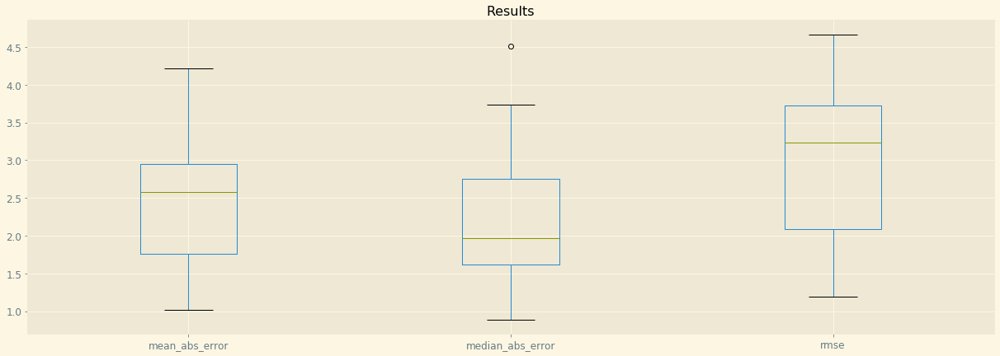

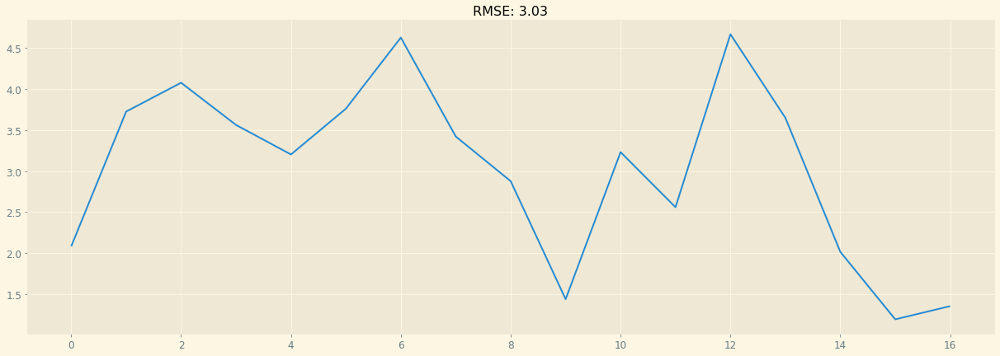

NameError: name 'plot_importance' is not defined

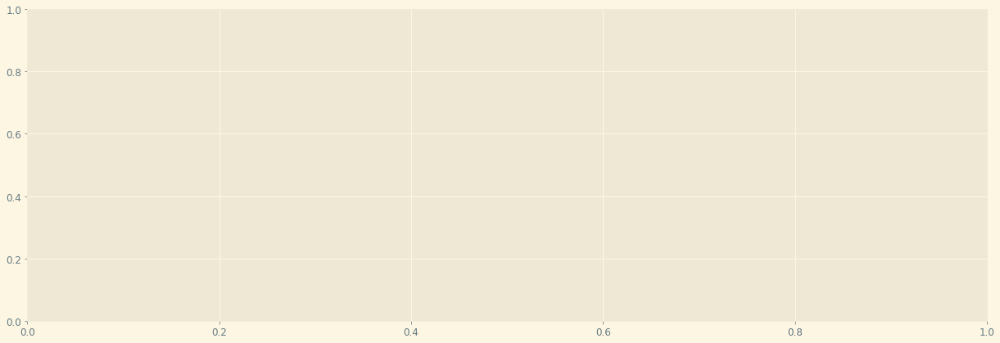

In [5]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_08 = pd.DataFrame(results_over_time)
predictions_over_time_08 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_08

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

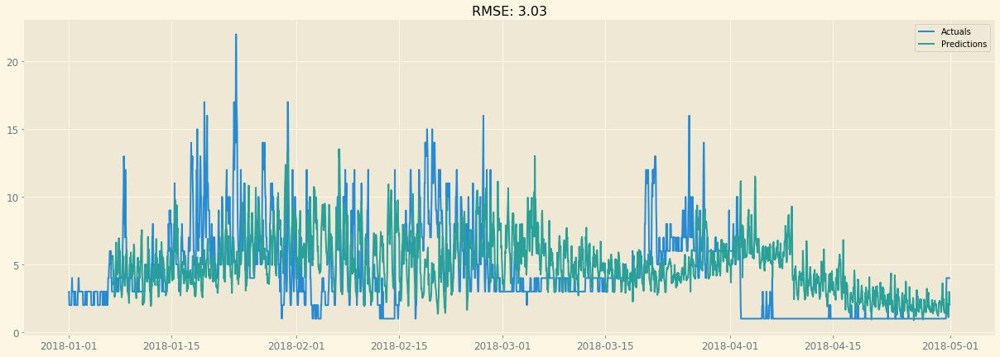

In [6]:
plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

### Station nr 28079018  - San Isidro/Calle Farolillo

In [15]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079018

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079018

Missing values for particle and station of interest: 1.58%

One particle, one station DF shape: (54610, 9)


,SO_2,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,13.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,45.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,19.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,12.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,11.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1264.461, BIC=1286.841, Time=0.351 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1319.688, BIC=1327.148, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1284.212, BIC=1295.402, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1264.351, BIC=1275.542, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1317.691, BIC=1321.421, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1260.962, BIC=1275.883, Time=0.117 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1257.739, BIC=1276.390, Time=0.795 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1253.845, BIC=1272.496, Time=0.681 se

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1081.242, BIC=1111.083, Time=1.289 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.896 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1041.547, BIC=1063.927, Time=0.706 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1070.870, BIC=1078.330, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1065.557, BIC=1076.748, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1061.140, BIC=1072.330, Time=0.046 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1068.877, BIC=1072.607, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1039.320, BIC=1057.971, Time=0.973 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.218, BIC=1353.852, Time=0.509 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1337.016, BIC=1355.650, Time=0.562 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1340.927, BIC=1367.015, Time=0.687 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1338.871, BIC=1364.959, Time=0.726 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1290.460, BIC=1312.860, Time=0.342 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1358.174, BIC=1365.640, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1311.373, BIC=1322.573, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1295.248, BIC=1306.448, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1356.185, BIC=1359.918, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1285.505, BIC=1304.172, Time=0.476 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1288.754, BIC=1307.420, Time=0.457 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1572.217, BIC=1590.900, Time=0.138 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1630.756, BIC=1645.702, Time=0.092 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1574.100, BIC=1589.047, Time=0.099 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1572.663, BIC=1595.082, Time=0.183 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1587.011, BIC=1605.694, Time=0.134 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1573.749, BIC=1592.432, Time=0.112 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1572.061, BIC=1598.217, Time=0.181 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1569.920, BIC=1599.812, Time=0.400 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1568.221, BIC=1594.377, Time=0.323 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1567.798, BIC=1590.218, Time=0.177 seconds
Fit ARIMA: (3, 0, 0)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1198.688, BIC=1217.306, Time=0.474 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1205.350, BIC=1223.968, Time=0.170 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1204.872, BIC=1230.937, Time=0.446 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1201.800, BIC=1227.865, Time=0.724 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1204.249, BIC=1219.143, Time=0.324 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1085.844, BIC=1108.205, Time=0.263 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1089.993, BIC=1112.354, Time=0.330 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1088.897, BIC=1118.712, Time=0.663 seconds
Total fit time: 3.798 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1125.025, BIC=1147.386, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1164.617, BIC=1172.071, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1144.942, BIC=1156.122, Time=0.035 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1130.512, BIC=1141.692, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1162.622, BIC=1166.349, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1117.122, BIC=1135.756, Time=0.493 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1452.363, BIC=1478.148, Time=0.257 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1448.387, BIC=1474.172, Time=0.294 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1450.500, BIC=1483.652, Time=0.565 seconds
Total fit time: 3.477 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1408.181, BIC=1430.302, Time=0.349 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1458.458, BIC=1465.832, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1428.429, BIC=1439.490, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1413.183, BIC=1424.244, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1456.459, BIC=1460.146, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1398.130, BIC=1416.565, Time=0.482 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1254.654, BIC=1269.600, Time=0.074 seconds
Total fit time: 3.592 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1194.979, BIC=1217.398, Time=0.382 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1230.908, BIC=1238.381, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1209.776, BIC=1220.986, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1197.663, BIC=1208.872, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1228.908, BIC=1232.644, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1183.824, BIC=1202.506, Time=0.488 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1186.474, BIC=1205.157, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1602.249, BIC=1620.932, Time=0.373 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1589.089, BIC=1607.772, Time=0.474 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1593.073, BIC=1619.229, Time=0.657 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1597.599, BIC=1623.755, Time=0.445 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1601.230, BIC=1616.176, Time=0.086 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1588.261, BIC=1610.680, Time=0.591 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1254.058, BIC=1272.740, Time=0.477 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1257.522, BIC=1283.678, Time=0.678 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1257.260, BIC=1283.416, Time=0.515 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1263.399, BIC=1278.345, Time=0.105 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1255.190, BIC=1277.610, Time=0.649 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1119.928, BIC=1149.795, Time=0.810 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.280 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1117.882, BIC=1140.282, Time=0.555 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1167.810, BIC=1175.276, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1136.793, BIC=1147.994, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1132.328, BIC=1143.528, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1165.815, BIC=1169.548, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1116.398, BIC=1135.064, Time=0.531 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.824, BIC=1469.066, Time=0.265 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1537.781, BIC=1545.195, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1479.138, BIC=1490.259, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1441.905, BIC=1453.027, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1535.781, BIC=1539.488, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1443.496, BIC=1458.325, Time=0.091 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1443.470, BIC=1458.299, Time=0.065 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1444.872, BIC=1463.408, Time=0.210 seconds
Total fit time: 0.772 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1538.182, BIC=1560.445, Time=0.331 seconds
F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1320.709, BIC=1343.090, Time=0.620 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1332.697, BIC=1362.537, Time=0.509 seconds
Total fit time: 4.463 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1244.601, BIC=1267.021, Time=0.686 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1310.730, BIC=1318.203, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1262.922, BIC=1274.131, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1254.536, BIC=1265.745, Time=0.061 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1308.731, BIC=1312.467, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1243.660, BIC=1262.343, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1414.493, BIC=1440.649, Time=0.622 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1410.728, BIC=1436.884, Time=0.745 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1415.000, BIC=1429.947, Time=0.099 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1408.457, BIC=1430.876, Time=0.651 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1408.601, BIC=1431.020, Time=0.521 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1322.545, BIC=1341.228, Time=0.179 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.636, BIC=1331.319, Time=4650.226 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1315.776, BIC=1341.932, Time=0.757 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1312.838, BIC=1338.994, Time=0.768 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1322.186, BIC=1337.132, Time=0.087 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0)

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1117.475, BIC=1139.875, Time=0.776 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1117.754, BIC=1147.621, Time=1.080 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 159.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1121.634, BIC=1144.034, Time=0.903 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1162.633, BIC=1170.100, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1143.478, BIC=1154.678, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1136.216, BIC=1147.416, Time=0.043 seconds
Fit ARIMA: (0, 1, 0)x

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1491.596, BIC=1510.247, Time=0.287 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1495.933, BIC=1510.853, Time=0.069 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1495.937, BIC=1510.857, Time=0.091 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1493.396, BIC=1515.777, Time=0.337 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1497.910, BIC=1516.560, Time=0.102 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1497.936, BIC=1516.587, Time=0.177 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1494.644, BIC=1520.755, Time=0.552 seconds
Total fit time: 2.076 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1512.065, BIC=1534.426, Time=0.329 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1600.161, BIC=1607.614, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1304.396, BIC=1323.063, Time=0.462 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1307.213, BIC=1325.879, Time=0.453 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1310.120, BIC=1336.254, Time=0.665 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1308.368, BIC=1334.502, Time=0.633 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1601.633, BIC=1620.315, Time=0.147 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1613.565, BIC=1628.512, Time=0.077 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1603.502, BIC=1625.922, Time=0.205 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1610.079, BIC=1628.762, Time=0.106 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1605.602, BIC=1631.758, Time=0.560 seconds
Total fit time: 2.052 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1482.912, BIC=1505.332, Time=0.566 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1619.314, BIC=1626.787, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1503.962, BIC=1515.172, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1494.621, BIC=1505.831, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1232.207, BIC=1258.363, Time=0.814 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1235.159, BIC=1261.315, Time=0.415 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1247.408, BIC=1262.355, Time=0.108 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1229.474, BIC=1251.894, Time=0.761 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1230.973, BIC=1253.393, Time=0.600 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1258.581, BIC=1281.001, Time=0.588 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1333.812, BIC=1341.286, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1278.444, BIC=1289.654, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.822, BIC=1283.032, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1331.812, BIC=1335.549, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1271.384, BIC=1290.067, Time=0.177 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1256.831, BIC=1275.513, Time=0.703 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1257.804, BIC=1283.960, Time=0.692 seconds
Near non-inver

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1566.799, BIC=1592.842, Time=0.407 seconds
Total fit time: 2.174 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1551.087, BIC=1573.429, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1687.488, BIC=1694.935, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1590.627, BIC=1601.797, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1635.639, BIC=1646.809, Time=0.070 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1987.803, BIC=1991.527, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1551.690, BIC=1570.308, Time=0.145 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1551.123, BIC=1569.741, Time=0.157 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1553.075, BIC=1579.140, Time=0.325 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1252.463, BIC=1274.863, Time=0.756 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1252.195, BIC=1274.595, Time=0.566 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1260.428, BIC=1290.294, Time=0.867 seconds
Total fit time: 5.127 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1274.701, BIC=1297.101, Time=0.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1317.897, BIC=1325.363, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1296.933, BIC=1308.133, Time=0.035 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1607.790, BIC=1626.457, Time=0.647 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1609.019, BIC=1635.152, Time=0.645 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1617.597, BIC=1643.730, Time=0.311 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1615.675, BIC=1630.609, Time=0.104 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1618.172, BIC=1640.572, Time=0.234 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1609.122, BIC=1631.522, Time=0.611 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one in

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1226.991, BIC=1249.391, Time=0.610 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1290.457, BIC=1297.924, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1248.550, BIC=1259.750, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1242.218, BIC=1253.418, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1288.458, BIC=1292.191, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1229.104, BIC=1247.770, Time=0.555 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1227.539, BIC=1246.205, Time=0.496 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1109.796, BIC=1132.196, Time=0.655 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1107.728, BIC=1137.595, Time=0.794 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.911 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1089.723, BIC=1112.123, Time=0.614 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1129.139, BIC=1136.606, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1111.470, BIC=1122.670, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1109.490, BIC=1120.690, Time=0.043 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1241.631, BIC=1260.297, Time=0.534 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1243.287, BIC=1261.954, Time=0.475 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1247.045, BIC=1273.178, Time=0.656 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1245.391, BIC=1271.525, Time=0.815 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1306.529, BIC=1325.195, Time=0.254 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1298.001, BIC=1316.668, Time=0.456 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1299.092, BIC=1325.225, Time=0.719 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1298.842, BIC=1324.976, Time=0.686 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1305.821, BIC=1320.755, Time=0.094 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1265.302, BIC=1287.722, Time=0.563 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1269.002, BIC=1298.894, Time=0.865 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.181 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1218.883, BIC=1241.284, Time=0.591 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1255.902, BIC=1263.368, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1235.705, BIC=1246.905, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1227.899, BIC=1239.099, Time=0.045 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1514.660, BIC=1529.606, Time=0.095 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1516.525, BIC=1535.208, Time=0.132 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1506.157, BIC=1524.840, Time=0.512 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1514.927, BIC=1529.873, Time=0.074 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1530.398, BIC=1545.345, Time=0.090 seconds
Total fit time: 1.315 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1416.878, BIC=1439.297, Time=0.302 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1496.674, BIC=1504.147, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1449.243, BIC=1460.453, Time

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1205.048, BIC=1219.916, Time=0.128 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1206.982, BIC=1225.567, Time=0.148 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1217.709, BIC=1232.578, Time=0.067 seconds
Total fit time: 1.553 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1210.687, BIC=1233.106, Time=0.437 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1247.109, BIC=1254.583, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1229.098, BIC=1240.308, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1218.146, BIC=1229.356, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1245.118, BIC=1248.855, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1204.230, BIC=1222.913, Time=0.548 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1138.328, BIC=1160.748, Time=0.335 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1171.755, BIC=1179.228, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1156.051, BIC=1167.260, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1146.469, BIC=1157.679, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1169.766, BIC=1173.503, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1130.870, BIC=1149.552, Time=0.459 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1132.132, BIC=1150.815, Time=0.510 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1378.777, BIC=1393.710, Time=0.110 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1379.129, BIC=1397.796, Time=0.238 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1379.559, BIC=1394.492, Time=0.083 seconds
Total fit time: 1.140 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.400, BIC=1357.800, Time=0.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1385.332, BIC=1392.799, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1361.463, BIC=1372.663, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1350.792, BIC=1361.992, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1383.338, BIC=1387.071, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1333.738, BIC=1352.405, Time=0.486 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1169.698, BIC=1192.078, Time=0.251 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1198.594, BIC=1206.054, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1191.639, BIC=1202.829, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1183.327, BIC=1194.517, Time=0.042 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1196.599, BIC=1200.329, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1167.778, BIC=1186.429, Time=0.137 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1167.071, BIC=1181.992, Time=0.072 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1167.883, BIC=1186.533, Time=0.106 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1167.381, BIC=1182.301, Time=0.139 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1169.077, BIC=1191.458, Time=0.591 seconds
Near non-invertible

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1260.999, BIC=1279.666, Time=0.246 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1269.984, BIC=1296.118, Time=0.308 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1269.898, BIC=1296.032, Time=0.485 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1264.576, BIC=1279.509, Time=0.095 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1265.681, BIC=1280.614, Time=0.081 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1280.064, BIC=1294.997, Time=0.058 seconds
Total fit time: 2.051 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1352.350, BIC=1374.750, Time=0.291 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1430.191, BIC=1437.658, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1043.845, BIC=1066.245, Time=0.636 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1073.332, BIC=1080.799, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1068.208, BIC=1079.408, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1063.997, BIC=1075.197, Time=0.046 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1071.339, BIC=1075.072, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1041.661, BIC=1060.328, Time=0.793 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1041.789, BIC=1060.456, Time=0.499 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1338.875, BIC=1357.526, Time=0.530 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.932, BIC=1359.582, Time=0.438 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1344.657, BIC=1370.768, Time=0.718 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1342.577, BIC=1368.687, Time=0.744 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1293.932, BIC=1316.351, Time=0.347 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1361.762, BIC=1369.235, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1314.686, BIC=1325.896, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1298.423, BIC=1309.633, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1359.779, BIC=1363.516, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1288.662, BIC=1307.345, Time=0.536 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1292.088, BIC=1310.770, Time=0.552 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1578.852, BIC=1597.551, Time=0.118 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.605, BIC=1653.564, Time=0.094 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1580.436, BIC=1595.395, Time=0.099 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1580.040, BIC=1602.479, Time=0.203 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1591.955, BIC=1610.654, Time=0.131 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1580.160, BIC=1598.859, Time=0.116 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1578.725, BIC=1604.904, Time=0.263 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1575.786, BIC=1605.704, Time=0.357 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1573.973, BIC=1600.152, Time=0.265 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1573.570, BIC=1596.009, Time=0.180 seconds
Fit ARIMA: (3, 0, 0)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1202.649, BIC=1221.284, Time=0.517 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1209.425, BIC=1228.059, Time=0.145 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1209.039, BIC=1235.127, Time=0.685 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1205.952, BIC=1232.040, Time=0.760 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1208.088, BIC=1222.996, Time=0.112 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1126.489, BIC=1145.139, Time=0.219 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1125.604, BIC=1140.525, Time=0.087 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1127.080, BIC=1145.731, Time=0.111 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1124.508, BIC=1139.428, Time=0.100 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1126.501, BIC=1145.151, Time=0.161 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1133.789, BIC=1148.710, Time=0.067 seconds
Total fit time: 1.171 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1224.537, BIC=1246.917, Time=0.387 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1281.127, BIC=1288.587, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1245.495, BIC=1256.685, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1406.374, BIC=1432.206, Time=0.779 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1412.234, BIC=1426.995, Time=0.090 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1414.192, BIC=1428.953, Time=0.070 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1426.344, BIC=1441.106, Time=0.071 seconds
Total fit time: 3.127 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1365.343, BIC=1387.665, Time=0.272 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1418.859, BIC=1426.299, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1383.067, BIC=1394.228, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1369.908, BIC=1381.069, Time

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1198.619, BIC=1217.318, Time=0.376 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1200.768, BIC=1226.947, Time=0.695 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1200.007, BIC=1226.186, Time=0.727 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1206.201, BIC=1221.161, Time=0.133 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1199.486, BIC=1221.925, Time=0.616 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1639.657, BIC=1665.835, Time=0.635 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1641.554, BIC=1663.993, Time=0.256 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1639.649, BIC=1669.568, Time=0.519 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1626.914, BIC=1660.572, Time=0.887 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1646.651, BIC=1680.309, Time=0.859 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1641.473, BIC=1671.392, Time=0.742 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1627.123, BIC=1657.042, Time=0.905 second

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1258.729, BIC=1281.167, Time=0.674 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1262.170, BIC=1292.088, Time=0.833 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 5.285 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1215.862, BIC=1238.282, Time=0.408 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1268.936, BIC=1276.409, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1232.378, BIC=1243.588, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1219.453, BIC=1230.663, Time=0.064 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1122.570, BIC=1152.463, Time=0.833 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.621 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1120.617, BIC=1143.037, Time=0.570 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1170.964, BIC=1178.437, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1140.206, BIC=1151.416, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1135.275, BIC=1146.485, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1168.976, BIC=1172.712, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1119.445, BIC=1138.128, Time=0.507 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1451.545, BIC=1473.808, Time=0.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1541.979, BIC=1549.400, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1483.032, BIC=1494.163, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1446.489, BIC=1457.620, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1539.980, BIC=1543.690, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1448.072, BIC=1462.913, Time=0.093 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1448.058, BIC=1462.899, Time=0.066 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1449.559, BIC=1468.111, Time=0.226 seconds
Total fit time: 0.789 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1535.056, BIC=1557.339, Time=0.570 seconds
F

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1393.979, BIC=1423.794, Time=0.639 seconds
Total fit time: 3.974 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1331.493, BIC=1353.893, Time=0.325 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1388.835, BIC=1396.302, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1347.738, BIC=1358.938, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1332.629, BIC=1343.829, Time=0.044 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1386.836, BIC=1390.569, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1321.926, BIC=1340.593, Time=0.508 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1324.673, BIC=1343.340, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1306.832, BIC=1333.011, Time=0.828 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1314.287, BIC=1329.246, Time=0.087 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1314.067, BIC=1336.506, Time=0.250 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1307.016, BIC=1329.455, Time=0.583 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1309.543, BIC=1339.462, Time=0.855 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 4.646 seconds
Perfor

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1476.043, BIC=1498.482, Time=0.279 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1588.238, BIC=1595.717, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1492.563, BIC=1503.782, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1474.678, BIC=1485.897, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1586.254, BIC=1589.994, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.383, BIC=1490.342, Time=0.095 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1475.780, BIC=1490.739, Time=0.073 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1470.830, BIC=1489.529, Time=0.210 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1472.692, BIC=1495.130, Time=0.235 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1474.187, BIC=1492.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1172.329, BIC=1191.012, Time=0.587 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1172.072, BIC=1190.755, Time=0.730 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1173.543, BIC=1199.699, Time=0.415 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1181.006, BIC=1207.162, Time=0.614 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1185.533, BIC=1200.479, Time=0.141 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1156.633, BIC=1175.316, Time=0.513 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1157.703, BIC=1176.386, Time=0.492 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1159.277, BIC=1185.433, Time=0.491 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1158.767, BIC=1184.923, Time=0.521 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1514.587, BIC=1533.237, Time=0.288 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 0.923 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1612.115, BIC=1634.476, Time=0.378 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1706.392, BIC=1713.845, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1636.699, BIC=1647.879, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1606.511, BIC=1617.691, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1704.400, BIC=1708.126, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1608.495, BIC=1623.402, Time=0.089 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1608.497, BIC=1623.404, Tim

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1323.179, BIC=1345.598, Time=0.611 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1323.717, BIC=1346.136, Time=0.579 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1331.223, BIC=1361.115, Time=0.874 seconds
Total fit time: 5.113 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1360.059, BIC=1382.497, Time=0.263 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1423.499, BIC=1430.978, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1375.989, BIC=1387.209, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1487.126, BIC=1513.304, Time=0.855 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1493.376, BIC=1519.555, Time=0.294 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1495.015, BIC=1509.974, Time=0.093 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1492.037, BIC=1514.476, Time=0.212 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1486.110, BIC=1508.549, Time=0.592 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1495.240, BIC=1525.158, Time=0.472 seconds
Total fit time: 3.537 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1235.166, BIC=1261.345, Time=0.887 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1239.337, BIC=1265.515, Time=0.403 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1251.353, BIC=1266.313, Time=0.224 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1232.723, BIC=1255.162, Time=0.849 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1234.278, BIC=1256.717, Time=0.622 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1266.392, BIC=1288.831, Time=0.567 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1340.824, BIC=1348.304, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1286.025, BIC=1297.244, Time=0.036 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1277.393, BIC=1288.612, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1338.836, BIC=1342.576, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1279.083, BIC=1297.782, Time=0.208 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1264.295, BIC=1282.994, Time=0.468 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1267.805, BIC=1293.983, Time=0.647 seconds
Near non-inver

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1570.723, BIC=1585.617, Time=0.088 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1571.598, BIC=1590.216, Time=0.251 seconds
Total fit time: 0.773 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1518.763, BIC=1541.085, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1647.513, BIC=1654.954, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1542.917, BIC=1554.077, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1582.517, BIC=1593.678, Time=0.062 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1949.092, BIC=1952.812, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1517.072, BIC=1535.673, Time=0.153 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1563.358, BIC=1578.239, Time=0.094 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1288.815, BIC=1311.235, Time=0.580 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1297.659, BIC=1327.552, Time=0.777 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 5.396 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1422.974, BIC=1445.394, Time=0.587 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1487.683, BIC=1495.157, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1447.765, BIC=1458.975, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1434.458, BIC=1445.668, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1452.681, BIC=1471.364, Time=0.155 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1452.221, BIC=1470.904, Time=0.183 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1451.503, BIC=1477.659, Time=0.254 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1452.073, BIC=1478.229, Time=0.313 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1454.726, BIC=1469.673, Time=0.101 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1450.082, BIC=1472.501, Time=0.208 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1450.794, BIC=1469.476, Time=0.110 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1452.069, BIC=1478.225, Time=0.280 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1454.727, BIC=1469.673, Time=0.074 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1450.810, BIC=1473.229, Time=0.115 seconds
Fit ARIMA: (2, 1, 4)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1144.282, BIC=1162.965, Time=0.192 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1124.701, BIC=1143.384, Time=0.511 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1128.497, BIC=1154.653, Time=0.732 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1129.130, BIC=1155.286, Time=0.858 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1135.644, BIC=1150.590, Time=0.140 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1176.043, BIC=1198.462, Time=0.599 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1230.237, BIC=1237.711, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1197.515, BIC=1208.724, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1188.588, BIC=1199.797, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1228.254, BIC=1231.991, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1173.811, BIC=1192.494, Time=0.485 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1173.950, BIC=1192.632, Time=0.478 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1403.019, BIC=1432.886, Time=0.666 seconds
Total fit time: 3.881 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1357.141, BIC=1379.541, Time=0.760 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1442.293, BIC=1449.760, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1379.794, BIC=1390.994, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1365.501, BIC=1376.701, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1440.293, BIC=1444.027, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1369.500, BIC=1388.167, Time=0.086 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1357.325, BIC=1375.992, Time=0.705 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1253.969, BIC=1268.928, Time=0.242 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1243.965, BIC=1266.404, Time=0.761 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1243.914, BIC=1266.353, Time=0.603 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1248.759, BIC=1278.678, Time=0.822 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 6.123 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1271.2

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.418, BIC=1468.857, Time=0.577 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1499.913, BIC=1507.393, Time=0.191 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1472.748, BIC=1483.967, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1455.562, BIC=1466.781, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1497.935, BIC=1501.675, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1441.481, BIC=1460.180, Time=0.544 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1450.524, BIC=1469.223, Time=0.159 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1443.352, BIC=1469.530, Time=0.708 seconds
Near non-inver

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1334.200, BIC=1352.899, Time=0.439 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.646, BIC=1350.605, Time=0.080 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1334.798, BIC=1349.757, Time=0.094 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1332.600, BIC=1355.039, Time=0.606 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1336.873, BIC=1355.572, Time=0.104 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1336.537, BIC=1355.236, Time=0.145 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1328.921, BIC=1355.100, Time=0.688 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1128.267, BIC=1146.966, Time=0.560 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1129.307, BIC=1148.006, Time=0.500 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1132.192, BIC=1158.370, Time=0.673 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1130.912, BIC=1157.091, Time=0.720 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1333.528, BIC=1352.194, Time=0.155 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1333.526, BIC=1352.192, Time=0.151 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1331.511, BIC=1357.644, Time=0.254 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1331.953, BIC=1358.086, Time=0.301 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1331.530, BIC=1346.463, Time=0.119 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1329.978, BIC=1352.378, Time=0.217 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1330.928, BIC=1349.595, Time=0.120 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1331.942, BIC=1358.075, Time=0.304 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1333.738, BIC=1348.672, Time=0.085 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1331.240, BIC=1353.640, Time=0.136 seconds
Fit ARIMA: (2, 1, 4)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1201.043, BIC=1219.710, Time=0.542 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1202.872, BIC=1221.538, Time=0.479 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1206.621, BIC=1232.755, Time=0.576 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1204.881, BIC=1231.015, Time=0.805 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1409.011, BIC=1431.411, Time=0.250 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1473.791, BIC=1481.258, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1426.531, BIC=1437.731, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1408.178, BIC=1419.378, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1471.791, BIC=1475.525, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1408.101, BIC=1423.035, Time=0.082 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1402.246, BIC=1420.913, Time=0.463 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1398.826, BIC=1417.493, Time=0.508 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1220.608, BIC=1231.818, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1203.919, BIC=1215.129, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1236.642, BIC=1240.379, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1185.616, BIC=1204.299, Time=0.611 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1187.229, BIC=1205.912, Time=0.570 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1190.720, BIC=1216.876, Time=0.779 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1050.436, BIC=1065.382, Time=0.443 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1050.953, BIC=1073.373, Time=0.717 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1050.780, BIC=1073.199, Time=0.562 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1054.176, BIC=1084.069, Time=0.849 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1421.306, BIC=1439.908, Time=0.164 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1424.822, BIC=1439.703, Time=0.074 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1424.623, BIC=1439.504, Time=0.092 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1422.085, BIC=1444.407, Time=0.221 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1425.104, BIC=1443.705, Time=0.102 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1423.746, BIC=1442.347, Time=0.192 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1415.014, BIC=1441.056, Time=0.795 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 1.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1381.063, BIC=1403.424, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1221.169, BIC=1247.325, Time=0.645 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1223.612, BIC=1249.768, Time=0.945 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1230.988, BIC=1245.934, Time=0.117 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1228.771, BIC=1251.190, Time=0.246 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1221.990, BIC=1244.410, Time=0.858 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1327.829, BIC=1350.229, Time=0.263 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1395.715, BIC=1403.182, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1350.478, BIC=1361.678, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1325.027, BIC=1336.227, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1393.716, BIC=1397.449, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1324.656, BIC=1339.590, Time=0.101 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1326.077, BIC=1344.744, Time=0.185 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1326.262, BIC=1344.928, Time=0.153 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1324.845, BIC=1339.778, Time=0.078 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1329.200, BIC=1344.

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1104.084, BIC=1130.172, Time=0.895 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1109.505, BIC=1124.413, Time=0.117 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1103.202, BIC=1125.563, Time=0.629 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1103.374, BIC=1125.735, Time=0.558 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1107.517, BIC=1137.332, Time=0.839 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1502.759, BIC=1517.666, Time=0.094 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1504.756, BIC=1523.391, Time=0.130 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1504.736, BIC=1523.370, Time=0.217 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1502.737, BIC=1517.644, Time=0.074 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1504.736, BIC=1523.371, Time=0.125 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1506.641, BIC=1529.002, Time=0.308 seconds
Total fit time: 1.346 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1506.835, BIC=1529.117, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1652.289, BIC=1659.717, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1523.542, BIC=1534.683, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1285.582, BIC=1304.281, Time=0.546 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1288.182, BIC=1306.881, Time=0.452 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1291.684, BIC=1317.863, Time=0.539 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1289.580, BIC=1315.758, Time=0.523 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1337.532, BIC=1356.247, Time=0.512 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1335.785, BIC=1354.500, Time=0.537 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1336.247, BIC=1362.448, Time=0.638 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1334.858, BIC=1361.059, Time=0.781 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1359.001, BIC=1377.716, Time=0.507 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1360.340, BIC=1386.541, Time=0.723 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1369.621, BIC=1395.822, Time=0.910 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1369.542, BIC=1384.514, Time=0.095 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1357.904, BIC=1380.362, Time=0.592 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1130.426, BIC=1149.125, Time=0.487 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1130.132, BIC=1148.831, Time=0.522 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1131.988, BIC=1158.167, Time=0.664 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1133.916, BIC=1160.095, Time=0.813 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1257.937, BIC=1272.896, Time=0.056 seconds
Total fit time: 3.097 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1391.442, BIC=1413.822, Time=0.340 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1460.674, BIC=1468.135, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1418.867, BIC=1430.057, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1389.610, BIC=1400.801, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1458.674, BIC=1462.404, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1388.113, BIC=1403.033, Time=0.089 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1390.096, BIC=1408.747, Time=0.118 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1390.096, BIC=1408.747, Time=0.177 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1386.641, BIC=1409.022, Time=0.616 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1391.235, BIC=1421.075, Time=0.857 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.130 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.282, BIC=1357.701, Time=0.338 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1392.510, BIC=1399.983, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1351.080, BIC=1362.290, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1335.942, BIC=1347.152, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1309.955, BIC=1328.670, Time=0.500 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1313.438, BIC=1339.639, Time=0.832 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1311.095, BIC=1337.296, Time=0.715 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1319.077, BIC=1334.049, Time=0.091 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1310.330, BIC=1332.788, Time=0.659 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1397.061, BIC=1415.776, Time=0.293 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1390.591, BIC=1409.306, Time=0.539 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1392.827, BIC=1419.028, Time=0.529 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1390.130, BIC=1416.331, Time=0.726 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1399.742, BIC=1414.714, Time=0.087 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1179.819, BIC=1205.998, Time=0.866 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1190.844, BIC=1205.803, Time=0.137 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1177.746, BIC=1200.185, Time=0.682 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1178.018, BIC=1200.457, Time=0.609 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1175.132, BIC=1205.050, Time=0.787 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1164.118, BIC=1186.556, Time=0.606 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1167.346, BIC=1197.264, Time=0.873 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.708 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1249.387, BIC=1271.826, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1297.824, BIC=1305.304, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1262.567, BIC=1273.787, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1246.541, BIC=1257.761, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1395.979, BIC=1410.938, Time=0.095 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1397.898, BIC=1416.597, Time=0.142 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1394.415, BIC=1413.114, Time=0.243 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1395.676, BIC=1410.636, Time=0.069 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1396.415, BIC=1418.854, Time=0.202 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1397.158, BIC=1415.857, Time=0.104 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1393.300, BIC=1419.479, Time=0.812 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1390.756, BIC=1420.675, Time=0.715 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1388.836, BIC=1415.015, Time=0.683 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1742.092, BIC=1757.076, Time=0.122 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1744.016, BIC=1762.747, Time=0.157 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1746.172, BIC=1761.156, Time=0.094 seconds
Total fit time: 1.294 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1731.585, BIC=1754.062, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1862.818, BIC=1870.310, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1763.096, BIC=1774.335, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1805.509, BIC=1816.747, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2111.381, BIC=2115.127, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1731.543, BIC=1750.275, Time=0.153 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1339.089, BIC=1357.804, Time=0.379 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1327.654, BIC=1346.369, Time=0.488 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1330.318, BIC=1356.519, Time=0.720 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1331.042, BIC=1357.243, Time=0.734 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.107, BIC=1355.079, Time=0.106 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1203.907, BIC=1233.851, Time=0.828 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.153 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1192.552, BIC=1215.010, Time=0.591 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1262.027, BIC=1269.513, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1210.895, BIC=1222.124, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1212.107, BIC=1223.336, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1260.043, BIC=1263.786, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1212.572, BIC=1231.287, Time=0.198 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1191.817, BIC=1210.532, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1449.548, BIC=1475.749, Time=0.723 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1449.065, BIC=1479.009, Time=0.872 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1449.875, BIC=1479.819, Time=0.869 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1455.494, BIC=1481.695, Time=0.241 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1449.780, BIC=1475.981, Time=0.602 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1304.776, BIC=1327.214, Time=0.219 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1354.680, BIC=1362.160, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1315.219, BIC=1326.438, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1303.836, BIC=1315.056, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1352.681, BIC=1356.421, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1304.032, BIC=1318.991, Time=0.101 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1304.708, BIC=1319.667, Time=0.067 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1302.873, BIC=1321.572, Time=0.121 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1304.860, BIC=1327.299, Time=0.176 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1305.726, BIC=1324.425, Time=0.113 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1617.010, BIC=1635.709, Time=0.520 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1626.900, BIC=1645.599, Time=0.141 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1625.679, BIC=1640.638, Time=0.107 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1626.912, BIC=1641.871, Time=0.080 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1643.875, BIC=1658.834, Time=0.074 seconds
Total fit time: 1.325 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1593.308, BIC=1615.746, Time=0.214 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1684.501, BIC=1691.980, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1617.570, BIC=1628.790, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1239.546, BIC=1265.725, Time=0.702 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1236.794, BIC=1262.972, Time=0.722 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1247.992, BIC=1262.951, Time=0.131 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1245.283, BIC=1267.722, Time=0.212 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1238.133, BIC=1260.571, Time=0.588 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1100.859, BIC=1127.038, Time=0.611 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1100.702, BIC=1126.880, Time=0.838 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1102.096, BIC=1117.055, Time=0.424 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1112.755, BIC=1135.193, Time=0.267 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1099.674, BIC=1122.113, Time=0.625 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1359.750, BIC=1378.449, Time=0.481 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1365.816, BIC=1384.515, Time=0.135 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1366.453, BIC=1392.631, Time=0.834 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1367.283, BIC=1393.461, Time=0.742 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1364.013, BIC=1378.972, Time=0.119 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1367.626, BIC=1390.065, Time=0.146 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1367.573, BIC=1390.012, Time=0.196 second

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1283.253, BIC=1309.454, Time=0.796 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1293.047, BIC=1308.019, Time=0.100 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1282.934, BIC=1305.392, Time=0.778 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1283.026, BIC=1305.484, Time=0.587 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1284.771, BIC=1314.715, Time=0.837 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1223.607, BIC=1253.526, Time=0.844 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1283.698, BIC=1306.156, Time=0.644 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1328.123, BIC=1335.609, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1309.672, BIC=1320.901, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1299.388, BIC=1310.617, Time=0.045 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1326.130, BIC=1329.873, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1282.650, BIC=1301.365, Time=0.478 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1394.336, BIC=1416.794, Time=0.431 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1473.226, BIC=1480.712, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1419.287, BIC=1430.516, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1390.813, BIC=1402.042, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1471.266, BIC=1475.009, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1391.502, BIC=1406.474, Time=0.102 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1391.597, BIC=1406.569, Time=0.086 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1385.338, BIC=1404.053, Time=0.538 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.291 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1249.299, BIC=1271.757, Time=0.582 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1250.374, BIC=1272.832, Time=0.556 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1252.334, BIC=1282.278, Time=0.898 seconds
Total fit time: 4.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1152.586, BIC=1175.044, Time=0.294 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1185.887, BIC=1193.373, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1174.677, BIC=1185.906, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1192.401, BIC=1214.820, Time=0.608 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1242.727, BIC=1250.200, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1217.497, BIC=1228.707, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1204.232, BIC=1215.442, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1240.752, BIC=1244.489, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1192.466, BIC=1211.149, Time=0.714 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1197.214, BIC=1215.897, Time=0.133 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1198.552, BIC=1224.708, Time=0.694 seconds
Near non-inver

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1283.349, BIC=1305.769, Time=0.442 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1330.505, BIC=1337.978, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1305.903, BIC=1317.113, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1289.192, BIC=1300.402, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1328.517, BIC=1332.254, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1284.255, BIC=1302.938, Time=0.156 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1284.261, BIC=1302.944, Time=0.129 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1284.922, BIC=1311.078, Time=0.646 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1277.241, BIC=1303.397, Time=0.603 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1282.200, BIC=1304.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1488.316, BIC=1503.275, Time=0.121 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1489.928, BIC=1512.366, Time=0.183 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1512.021, BIC=1530.719, Time=0.124 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1488.622, BIC=1507.321, Time=0.178 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1491.303, BIC=1517.482, Time=0.301 seconds
Total fit time: 1.497 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1469.232, BIC=1491.651, Time=0.587 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1541.821, BIC=1549.294, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1499.013, BIC=1510.223, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.988, BIC=1487.198, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1203.971, BIC=1222.670, Time=0.386 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1207.010, BIC=1233.188, Time=0.630 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1206.330, BIC=1232.508, Time=0.754 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1206.254, BIC=1221.213, Time=0.161 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1210.349, BIC=1225.308, Time=0.090 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1052.522, BIC=1078.701, Time=0.642 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1048.983, BIC=1075.162, Time=0.730 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1047.076, BIC=1062.035, Time=0.326 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1047.621, BIC=1070.060, Time=0.620 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1432.079, BIC=1450.697, Time=0.550 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 1.036 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1491.955, BIC=1514.258, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1615.006, BIC=1622.440, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1519.539, BIC=1530.690, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1558.984, BIC=1570.135, Time=0.060 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1976.095, BIC=1979.812, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1490.134, BIC=1508.720, Time=0.150 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1531.422, BIC=1546.290, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1310.312, BIC=1325.271, Time=0.227 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1319.428, BIC=1334.387, Time=0.216 seconds
Total fit time: 3.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1285.290, BIC=1307.748, Time=0.745 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1336.102, BIC=1343.588, Time=0.042 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1308.407, BIC=1319.636, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1288.943, BIC=1300.172, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1334.115, BIC=1337.858, Time=0.039 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1275.429, BIC=1294.144, Time=1.247 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1541.687, BIC=1564.125, Time=0.831 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1614.144, BIC=1621.624, Time=0.037 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1562.317, BIC=1573.536, Time=0.151 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1538.102, BIC=1549.321, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1612.169, BIC=1615.909, Time=0.032 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1538.430, BIC=1553.389, Time=0.244 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1538.694, BIC=1553.653, Time=0.164 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1528.715, BIC=1547.414, Time=1.535 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.164 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1141.419, BIC=1160.102, Time=0.452 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1142.472, BIC=1161.155, Time=0.712 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1146.447, BIC=1172.603, Time=1.513 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1146.361, BIC=1172.517, Time=1.999 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1140.934, BIC=1174.564, Time=2.331 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 13.326 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1235.264, BIC=1257.683, Time=0.954 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1292.815, BIC=1300.289, Time=0.035 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1254.352, BIC=1265.562, Time=0.094 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1234.624, BIC=1245.834, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1290.819, BIC=1294.555, Time=0.031 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1232.857, BIC=1247.803, Time=0.232 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1234.328, BIC=1253.011, Ti

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1421.921, BIC=1436.710, Time=0.330 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1423.847, BIC=1438.636, Time=0.172 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1435.478, BIC=1450.266, Time=0.188 seconds
Total fit time: 8.565 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1376.805, BIC=1399.166, Time=0.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1434.654, BIC=1442.108, Time=0.032 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1394.078, BIC=1405.259, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1380.549, BIC=1391.730, Time=0.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1432.654, BIC=1436.381, Time=0.031 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1368.272, BIC=1386.906, Time=1.242 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1220.288, BIC=1242.765, Time=1.468 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1262.930, BIC=1270.422, Time=0.043 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1240.989, BIC=1252.227, Time=0.119 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1233.584, BIC=1244.823, Time=0.120 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1260.939, BIC=1264.685, Time=0.029 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1218.305, BIC=1237.036, Time=1.315 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1219.212, BIC=1237.943, Time=1.409 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1611.385, BIC=1626.370, Time=0.198 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1611.404, BIC=1626.389, Time=0.181 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1613.375, BIC=1632.106, Time=0.448 seconds
Total fit time: 2.004 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1531.893, BIC=1554.370, Time=0.551 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1603.935, BIC=1611.428, Time=0.035 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1551.691, BIC=1562.929, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1527.091, BIC=1538.330, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1601.936, BIC=1605.682, Time=0.030 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1528.339, BIC=1543.324, Time=0.227 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1243.065, BIC=1258.037, Time=0.161 seconds
Total fit time: 4.705 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1174.257, BIC=1196.715, Time=1.444 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1242.994, BIC=1250.480, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1191.750, BIC=1202.979, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1188.046, BIC=1199.275, Time=0.121 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1240.995, BIC=1244.738, Time=0.032 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1190.604, BIC=1209.319, Time=0.395 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1172.131, BIC=1190.846, Time=1.291 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1147.650, BIC=1173.851, Time=1.229 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1147.503, BIC=1173.704, Time=1.372 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1153.711, BIC=1168.683, Time=0.320 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1145.573, BIC=1168.031, Time=1.549 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1145.588, BIC=1168.046, Time=1.441 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1534.968, BIC=1557.231, Time=1.253 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1536.528, BIC=1558.790, Time=0.735 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1534.514, BIC=1564.197, Time=2.144 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 10.663 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1465.460, BIC=1487.743, Time=1.632 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1543.427, BIC=1550.854, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1487.228, BIC=1498.370, Time=0.131 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1471.446, BIC=1482.587, Time=0.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1541.428, BIC=1545.142, Ti

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1258.093, BIC=1284.317, Time=1.770 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1267.525, BIC=1282.510, Time=0.232 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1256.561, BIC=1279.038, Time=1.527 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1256.516, BIC=1278.993, Time=1.428 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1260.243, BIC=1290.212, Time=1.582 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1604.749, BIC=1627.226, Time=0.648 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1723.662, BIC=1731.154, Time=0.051 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1629.960, BIC=1641.199, Time=0.094 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1600.801, BIC=1612.039, Time=0.150 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1721.662, BIC=1725.409, Time=0.032 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1601.282, BIC=1616.267, Time=0.175 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1601.480, BIC=1616.465, Time=0.180 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1603.003, BIC=1621.734, Time=0.338 seconds
Total fit time: 1.681 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1488.090, BIC=1510.568, Time=0.802 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1253.832, BIC=1283.776, Time=2.713 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 14.457 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1187.585, BIC=1210.043, Time=1.554 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1242.350, BIC=1249.836, Time=0.034 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1207.716, BIC=1218.945, Time=0.108 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1200.916, BIC=1212.145, Time=0.156 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1240.351, BIC=1244.094, Time=0.033 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1186.228, BIC=1204.943, Time=1.351 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1188.790, BIC=1200.019, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1217.601, BIC=1221.344, Time=0.030 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1171.856, BIC=1190.571, Time=1.287 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1172.982, BIC=1191.697, Time=1.134 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1172.676, BIC=1198.877, Time=1.629 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1497.957, BIC=1520.396, Time=0.527 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1577.238, BIC=1584.718, Time=0.034 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1534.064, BIC=1545.283, Time=0.144 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1498.011, BIC=1509.231, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1575.273, BIC=1579.013, Time=0.030 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1497.211, BIC=1515.910, Time=0.325 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1498.267, BIC=1513.226, Time=0.150 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1498.783, BIC=1513.742, Time=0.208 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1498.404, BIC=1520.843, Time=0.485 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1497.526, BIC=1516.224, Time=0.231 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1454.403, BIC=1469.387, Time=0.188 seconds
Total fit time: 2.901 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1752.678, BIC=1775.174, Time=0.959 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1862.514, BIC=1870.013, Time=0.036 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1770.634, BIC=1781.882, Time=0.166 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1805.306, BIC=1816.554, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2094.786, BIC=2098.536, Time=0.023 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1751.056, BIC=1769.803, Time=0.414 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1783.189, BIC=1798.186, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1749.214, BIC=1764.212, Time=0.319 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1396.010, BIC=1422.234, Time=2.030 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.173, BIC=1420.157, Time=0.192 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1403.143, BIC=1425.620, Time=0.661 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1394.546, BIC=1417.024, Time=1.540 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1404.625, BIC=1434.595, Time=2.513 seconds
Total fit time: 11.969 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1336.196, BIC=1358.674, Time=1.321 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1210.196, BIC=1228.927, Time=1.196 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1205.598, BIC=1224.329, Time=1.129 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1208.403, BIC=1234.626, Time=1.665 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1207.794, BIC=1234.018, Time=1.989 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1282.564, BIC=1312.533, Time=2.104 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 10.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1464.164, BIC=1486.641, Time=2.221 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1571.306, BIC=1578.799, Time=0.087 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1485.031, BIC=1496.270, Time=0.214 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1466.221, BIC=1477.459, Time=0.414 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1569.312, BIC=1573.058, Time=0.047 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1463.520, BIC=1482.251, Time=1.033 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1467.923, BIC=1482.908, Ti

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1539.545, BIC=1558.163, Time=0.145 seconds
Total fit time: 0.633 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1444.192, BIC=1466.572, Time=0.209 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1515.383, BIC=1522.843, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1467.447, BIC=1478.637, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1440.217, BIC=1451.408, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1513.393, BIC=1517.123, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1440.432, BIC=1455.352, Time=0.096 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1440.471, BIC=1455.392, Time=0.073 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1442.234, BIC=1460.884, Time=0.134 seconds
Total fit time: 0.659 seconds
Performing ste

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1627.073, BIC=1653.274, Time=0.831 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1626.718, BIC=1641.690, Time=0.123 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1614.404, BIC=1636.862, Time=0.659 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1614.328, BIC=1636.786, Time=0.573 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1632.260, BIC=1662.204, Time=0.836 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 5.566 seconds
Perfor

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1478.893, BIC=1508.837, Time=0.497 seconds
Total fit time: 3.079 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1367.789, BIC=1390.247, Time=0.304 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1447.771, BIC=1455.257, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1388.236, BIC=1399.465, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1368.382, BIC=1379.611, Time=0.061 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1445.779, BIC=1449.522, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1369.298, BIC=1388.013, Time=0.318 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1370.245, BIC=1388.960, Time=0.199 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1369.746, BIC=1395.947, Time=0.360 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1162.890, BIC=1181.605, Time=0.178 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1144.640, BIC=1163.355, Time=0.540 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1145.414, BIC=1171.615, Time=0.773 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1148.191, BIC=1174.392, Time=0.772 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1150.633, BIC=1165.605, Time=0.521 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1204.068, BIC=1222.783, Time=0.573 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1205.501, BIC=1224.216, Time=0.559 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1208.178, BIC=1234.379, Time=0.750 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1208.024, BIC=1234.226, Time=0.928 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1381.166, BIC=1396.125, Time=0.109 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1381.179, BIC=1396.138, Time=0.085 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1382.440, BIC=1401.139, Time=0.257 seconds
Total fit time: 0.938 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1329.077, BIC=1351.535, Time=0.442 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1397.875, BIC=1405.361, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1343.130, BIC=1354.359, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1324.619, BIC=1335.848, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1395.898, BIC=1399.641, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1326.526, BIC=1341.498, Time=0.103 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1286.844, BIC=1316.814, Time=1.081 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 5.964 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1234.167, BIC=1256.625, Time=0.666 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1271.248, BIC=1278.734, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1251.427, BIC=1262.656, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1243.062, BIC=1254.291, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1269.294, BIC=1273.037, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1227.064, BIC=1245.779, Time=0.566 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1524.020, BIC=1542.751, Time=0.615 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1533.572, BIC=1548.557, Time=0.090 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1548.375, BIC=1563.359, Time=0.097 seconds
Total fit time: 1.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1435.305, BIC=1457.782, Time=0.280 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1514.452, BIC=1521.945, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1466.487, BIC=1477.725, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1437.990, BIC=1449.228, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1512.474, BIC=1516.220, Tim

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1340.200, BIC=1370.170, Time=1.013 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1351.776, BIC=1385.492, Time=1.122 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1341.743, BIC=1375.458, Time=1.145 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1351.060, BIC=1381.030, Time=0.502 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1346.689, BIC=1376.659, Time=0.890 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1342.406, BIC=1379.868, Time=1.424 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1152.811, BIC=1171.542, Time=0.654 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1155.165, BIC=1181.389, Time=0.798 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1154.638, BIC=1180.861, Time=0.810 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1154.126, BIC=1169.111, Time=0.159 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1159.060, BIC=1174.044, Time=0.084 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1205.087, BIC=1227.526, Time=0.837 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1246.955, BIC=1254.435, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1221.751, BIC=1232.970, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1209.971, BIC=1221.191, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1245.004, BIC=1248.744, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1197.674, BIC=1216.373, Time=0.366 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1199.362, BIC=1218.061, Time=0.821 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1291.629, BIC=1314.067, Time=0.827 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1345.208, BIC=1352.688, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1314.381, BIC=1325.600, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1297.347, BIC=1308.566, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1343.215, BIC=1346.955, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1285.269, BIC=1303.968, Time=0.543 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1293.291, BIC=1311.990, Time=0.171 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1291.358, BIC=1317.536, Time=0.758 seconds
Fit ARIMA: (3,

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1275.403, BIC=1301.582, Time=0.811 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1282.051, BIC=1297.010, Time=0.119 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1285.639, BIC=1308.078, Time=0.245 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1275.732, BIC=1298.171, Time=0.639 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1274.980, BIC=1304.898, Time=0.937 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.189 seconds
Perfor

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1369.396, BIC=1388.111, Time=0.865 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1371.092, BIC=1389.807, Time=0.528 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1374.822, BIC=1401.023, Time=0.700 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1373.384, BIC=1399.585, Time=0.878 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1204.679, BIC=1219.651, Time=0.091 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1217.557, BIC=1232.529, Time=0.074 seconds
Total fit time: 3.843 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1101.078, BIC=1123.536, Time=0.694 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1133.404, BIC=1140.890, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1125.044, BIC=1136.273, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1119.739, BIC=1130.968, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1131.410, BIC=1135.153, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1097.923, BIC=1116.638, Time=0.382 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1176.601, BIC=1195.316, Time=0.571 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1177.477, BIC=1196.192, Time=0.572 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1181.389, BIC=1207.590, Time=0.752 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1179.678, BIC=1205.879, Time=0.818 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1400.525, BIC=1422.925, Time=0.257 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1505.700, BIC=1513.166, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1431.519, BIC=1442.719, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.007, BIC=1416.207, Time=0.061 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1503.701, BIC=1507.435, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1400.752, BIC=1419.419, Time=0.177 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1408.575, BIC=1427.241, Time=0.209 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1396.891, BIC=1423.024, Time=0.331 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1395.202, BIC=1417.602, Time=0.257 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1402.639, BIC=1421.

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1231.550, BIC=1261.494, Time=0.882 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 6.010 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1392.934, BIC=1415.392, Time=0.638 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1461.343, BIC=1468.829, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1415.763, BIC=1426.992, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1403.982, BIC=1415.211, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1459.343, BIC=1463.086, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1391.389, BIC=1410.104, Time=0.578 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1450.936, BIC=1465.908, Time=0.099 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1450.887, BIC=1465.859, Time=0.075 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1447.722, BIC=1466.437, Time=0.251 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1449.718, BIC=1472.176, Time=0.340 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1452.510, BIC=1471.225, Time=0.114 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1452.669, BIC=1471.384, Time=0.272 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1449.932, BIC=1476.133, Time=0.530 seconds
Total fit time: 2.225 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.569, BIC=1358.007, Time=0.289 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1408.182, BIC=1415.662, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1110.751, BIC=1136.884, Time=0.759 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1109.179, BIC=1135.312, Time=0.798 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1114.864, BIC=1129.797, Time=0.132 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1108.354, BIC=1130.754, Time=0.710 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1108.553, BIC=1130.953, Time=0.646 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1510.671, BIC=1525.604, Time=0.098 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1512.671, BIC=1531.338, Time=0.139 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1508.321, BIC=1526.988, Time=0.591 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1510.677, BIC=1525.610, Time=0.089 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1514.535, BIC=1536.935, Time=0.295 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1512.675, BIC=1531.342, Time=0.132 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1506.307, BIC=1532.440, Time=0.761 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 2.624 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1521.705, BIC=1544.007, Time

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1297.690, BIC=1316.421, Time=0.565 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1301.226, BIC=1327.449, Time=0.622 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1299.351, BIC=1325.574, Time=0.515 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1306.715, BIC=1321.700, Time=0.108 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1297.359, BIC=1319.836, Time=0.838 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1361.085, BIC=1387.331, Time=0.738 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1362.382, BIC=1388.628, Time=0.788 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1373.791, BIC=1388.788, Time=0.133 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1360.036, BIC=1382.532, Time=0.699 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1359.560, BIC=1382.056, Time=0.529 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1367.987, BIC=1394.233, Time=0.786 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1372.635, BIC=1398.881, Time=0.917 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1377.452, BIC=1392.449, Time=0.097 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1365.674, BIC=1388.170, Time=0.692 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1365.097, BIC=1387.594, Time=0.676 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1144.283, BIC=1170.506, Time=1.118 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1148.972, BIC=1163.956, Time=0.149 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1137.832, BIC=1160.309, Time=0.754 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1137.882, BIC=1160.359, Time=0.708 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1140.440, BIC=1170.410, Time=0.934 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 6.404 seconds
Perfor

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1399.515, BIC=1421.934, Time=0.433 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1470.094, BIC=1477.567, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1427.073, BIC=1438.282, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1397.463, BIC=1408.673, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1468.094, BIC=1471.831, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1396.043, BIC=1410.989, Time=0.119 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1398.036, BIC=1416.719, Time=0.130 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1398.037, BIC=1416.720, Time=0.195 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1396.093, BIC=1411.039, Time=0.089 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1411.389, BIC=1426.

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1398.240, BIC=1428.133, Time=0.918 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.567 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1343.663, BIC=1366.121, Time=0.386 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1400.238, BIC=1407.724, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1358.675, BIC=1369.904, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1343.534, BIC=1354.763, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1398.240, BIC=1401.983, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1343.405, BIC=1358.377, Time=0.105 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1335.107, BIC=1353.822, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1623.521, BIC=1646.017, Time=0.634 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1724.327, BIC=1731.826, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1648.375, BIC=1659.623, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1628.783, BIC=1640.031, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1722.328, BIC=1726.078, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1632.229, BIC=1650.976, Time=0.177 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1631.860, BIC=1650.607, Time=0.169 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1653.813, BIC=1680.059, Time=0.855 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1632.215, BIC=1658.461, Time=0.815 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score t

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1337.569, BIC=1363.814, Time=0.661 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1344.551, BIC=1370.797, Time=0.368 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1345.022, BIC=1360.020, Time=0.101 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1334.773, BIC=1357.269, Time=0.734 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1334.580, BIC=1357.077, Time=0.572 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1135.907, BIC=1165.877, Time=0.831 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.864 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1146.241, BIC=1168.719, Time=0.488 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1183.621, BIC=1191.113, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1162.965, BIC=1174.204, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1155.427, BIC=1166.665, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1181.621, BIC=1185.367, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1137.926, BIC=1156.657, Time=0.854 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1513.558, BIC=1536.016, Time=0.386 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1516.516, BIC=1535.231, Time=0.116 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1516.354, BIC=1535.069, Time=0.176 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1515.173, BIC=1541.374, Time=0.462 seconds
Total fit time: 2.466 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1530.196, BIC=1552.635, Time=0.423 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1618.661, BIC=1626.141, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1555.976, BIC=1567.195, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1529.782, BIC=1541.002, Time=0.061 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1616.666, BIC=1620.406, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1351.457, BIC=1377.680, Time=0.273 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1341.599, BIC=1367.823, Time=0.823 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1346.808, BIC=1361.793, Time=0.117 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1340.123, BIC=1362.600, Time=0.890 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.278, BIC=1362.755, Time=0.778 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1504.425, BIC=1526.922, Time=0.588 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1641.073, BIC=1648.571, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1525.986, BIC=1537.234, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1517.557, BIC=1528.805, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1639.139, BIC=1642.889, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1513.599, BIC=1532.346, Time=0.137 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1512.253, BIC=1531.000, Time=0.191 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1505.933, BIC=1532.178, Time=0.754 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2,

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1245.580, BIC=1268.076, Time=0.652 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1326.335, BIC=1333.834, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1262.792, BIC=1274.040, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1261.441, BIC=1272.689, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1324.364, BIC=1328.114, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1261.369, BIC=1280.116, Time=0.387 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1243.580, BIC=1262.327, Time=0.505 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1246.686, BIC=1272.931, Time=0.585 seconds
Near non-inver

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1209.489, BIC=1231.985, Time=0.784 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1209.268, BIC=1231.765, Time=0.652 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1212.403, BIC=1242.398, Time=0.987 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.021 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1291.588, BIC=1314.085, Time=0.291 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1358.3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1592.394, BIC=1611.061, Time=0.159 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.014, BIC=1652.947, Time=0.106 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1593.292, BIC=1608.226, Time=0.122 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1594.305, BIC=1616.705, Time=0.180 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1622.314, BIC=1640.981, Time=0.136 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1592.270, BIC=1610.937, Time=0.160 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1597.890, BIC=1612.823, Time=0.071 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1594.264, BIC=1616.664, Time=0.276 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1594.023, BIC=1612.689, Time=0.127 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1595.164, BIC=1621.298, Time=0.468 seconds
Total fit time: 2.22

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1439.338, BIC=1458.069, Time=0.691 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1440.678, BIC=1459.409, Time=0.661 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1443.674, BIC=1469.897, Time=0.847 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1450.454, BIC=1476.678, Time=0.871 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1602.691, BIC=1632.661, Time=0.905 seconds
Total fit time: 4.217 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1543.548, BIC=1566.025, Time=0.220 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1644.248, BIC=1651.740, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1575.994, BIC=1587.233, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1542.994, BIC=1554.233, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1642.248, BIC=1645.994, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1544.817, BIC=1559.802, Time=0.086 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1544.826, BIC=1559.811, Time=0.085 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1544.083, BIC=1562.814, Time=0.166 seconds
Total fit time: 0.709 seconds
Performing ste

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1262.393, BIC=1284.870, Time=0.217 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1265.102, BIC=1287.579, Time=0.295 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1264.944, BIC=1294.914, Time=0.656 seconds
Total fit time: 4.146 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1208.140, BIC=1230.617, Time=0.609 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1267.495, BIC=1274.987, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1234.683, BIC=1245.921, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1227.018, BIC=1238.257, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1265.495, BIC=1269.241, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1211.377, BIC=1230.108, Time=0.550 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1128.500, BIC=1150.977, Time=0.235 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1130.512, BIC=1152.989, Time=0.285 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1114.126, BIC=1144.096, Time=0.962 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.157 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1154.343, BIC=1176.820, Time=0.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1204.583, BIC=1212.076, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1182.064, BIC=1193.303, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1173.507, BIC=1184.746, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1202.584, BIC=1206.331, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1410.494, BIC=1429.209, Time=0.531 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1411.675, BIC=1430.390, Time=0.544 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1414.862, BIC=1441.063, Time=0.540 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1423.037, BIC=1449.238, Time=0.356 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1421.713, BIC=1436.685, Time=0.105 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1260.520, BIC=1286.766, Time=1.002 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1270.862, BIC=1285.860, Time=0.106 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1259.936, BIC=1282.433, Time=0.699 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1259.796, BIC=1282.293, Time=0.606 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1265.182, BIC=1295.178, Time=0.929 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1293.748, BIC=1316.245, Time=0.613 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1299.304, BIC=1329.299, Time=0.974 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 6.244 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1457.257, BIC=1479.753, Time=0.635 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1514.780, BIC=1522.279, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1488.070, BIC=1499.318, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1471.173, BIC=1482.421, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1703.353, BIC=1725.869, Time=0.352 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1774.345, BIC=1781.851, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1725.914, BIC=1737.172, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1746.528, BIC=1757.786, Time=0.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2017.746, BIC=2021.499, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1702.563, BIC=1721.326, Time=0.199 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1727.623, BIC=1742.633, Time=0.102 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1701.638, BIC=1716.649, Time=0.151 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1702.410, BIC=1721.172, Time=0.185 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1705.030, BIC=1720.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1257.430, BIC=1276.177, Time=0.439 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1258.395, BIC=1277.142, Time=0.556 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1262.481, BIC=1288.727, Time=0.567 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1260.827, BIC=1287.073, Time=0.763 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1177.540, BIC=1196.287, Time=0.263 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1178.407, BIC=1197.154, Time=0.460 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1182.349, BIC=1208.595, Time=0.740 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1181.233, BIC=1207.479, Time=0.565 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1364.146, BIC=1390.369, Time=0.722 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1360.860, BIC=1387.084, Time=1.048 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1365.726, BIC=1380.711, Time=0.114 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1369.914, BIC=1392.391, Time=0.243 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1361.748, BIC=1384.225, Time=0.634 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1279.564, BIC=1298.279, Time=0.612 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.662, BIC=1299.377, Time=0.502 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1284.659, BIC=1310.860, Time=0.737 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1280.894, BIC=1307.095, Time=0.831 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1374.344, BIC=1393.075, Time=0.619 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1375.717, BIC=1394.448, Time=0.604 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1379.074, BIC=1405.297, Time=0.906 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1377.736, BIC=1403.959, Time=0.841 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1104.040, BIC=1126.518, Time=0.454 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1136.022, BIC=1143.515, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1127.688, BIC=1138.927, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1122.542, BIC=1133.780, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1134.028, BIC=1137.774, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1100.954, BIC=1119.685, Time=0.527 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1101.170, BIC=1119.901, Time=0.539 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1182.025, BIC=1200.756, Time=0.610 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1182.693, BIC=1201.424, Time=0.483 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1186.409, BIC=1212.632, Time=1.121 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1185.791, BIC=1212.015, Time=0.777 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.204, BIC=1472.314, Time=0.345 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1436.699, BIC=1470.270, Time=1.003 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.741 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1409.274, BIC=1431.694, Time=0.251 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1511.676, BIC=1519.149, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1439.257, BIC=1450.467, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1418.172, BIC=1429.382, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1509.677, BIC=1513.414, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1411.456, BIC=1430.139, Tim

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1235.339, BIC=1254.070, Time=0.555 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1236.366, BIC=1262.590, Time=1.011 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1235.529, BIC=1261.752, Time=0.704 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1245.503, BIC=1260.488, Time=0.106 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1244.426, BIC=1266.903, Time=0.278 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1343.841, BIC=1366.299, Time=0.224 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1414.682, BIC=1422.168, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1367.119, BIC=1378.348, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.819, BIC=1352.048, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1412.684, BIC=1416.427, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1341.299, BIC=1356.271, Time=0.099 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1341.313, BIC=1356.285, Time=0.086 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1341.870, BIC=1360.585, Time=0.143 seconds
Total fit time: 0.690 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1454.523, BIC=1477.000, Time=0.138 seconds
F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1115.700, BIC=1138.119, Time=0.850 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1115.586, BIC=1138.006, Time=0.660 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1121.323, BIC=1151.216, Time=0.927 seconds
Total fit time: 6.259 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1117.890, BIC=1140.348, Time=0.410 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1159.285, BIC=1166.771, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1133.851, BIC=1145.080, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1530.525, BIC=1552.847, Time=0.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1602.166, BIC=1609.607, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1569.246, BIC=1580.407, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1532.578, BIC=1543.739, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1600.181, BIC=1603.901, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1529.115, BIC=1547.716, Time=0.138 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1528.308, BIC=1543.189, Time=0.069 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1528.851, BIC=1547.452, Time=0.128 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1529.891, BIC=1544.772, Time=0.117 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1530.824, BIC=1553.146, Time=0.221 seconds
Total fit time: 1.0

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1302.770, BIC=1325.267, Time=0.596 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1305.866, BIC=1335.861, Time=1.021 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 5.613 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1277.983, BIC=1300.498, Time=0.342 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1318.449, BIC=1325.954, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1293.845, BIC=1305.103, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.804, BIC=1292.062, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1370.894, BIC=1400.914, Time=0.898 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.282 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1626.709, BIC=1649.224, Time=0.647 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1718.100, BIC=1725.605, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1651.856, BIC=1663.114, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1637.483, BIC=1648.741, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1716.112, BIC=1719.864, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1641.352, BIC=1660.114, Time=0.115 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1626.834, BIC=1645.597, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1289.422, BIC=1311.937, Time=0.620 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1353.280, BIC=1360.785, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1311.939, BIC=1323.196, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1299.343, BIC=1310.601, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1351.299, BIC=1355.051, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1287.088, BIC=1305.851, Time=0.573 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1288.792, BIC=1307.555, Time=0.612 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1143.609, BIC=1162.356, Time=0.557 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1142.756, BIC=1161.503, Time=0.543 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1144.371, BIC=1170.616, Time=0.731 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1149.049, BIC=1175.295, Time=0.749 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1157.116, BIC=1172.113, Time=0.178 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1559.653, BIC=1578.288, Time=0.220 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1559.622, BIC=1578.256, Time=0.127 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1562.821, BIC=1588.909, Time=0.366 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1549.790, BIC=1575.878, Time=0.904 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1561.563, BIC=1583.924, Time=0.260 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1551.157, BIC=1580.972, Time=0.910 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1551.122, BIC=1580.937, Time=0.836 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1563.079, BIC=1589.167, Time=0.165 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1552.985, BIC=1586.527, Time=0.939 seconds
Total fit time: 5.530 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1353.988, BIC=1383.958, Time=0.854 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 4.891 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1264.477, BIC=1286.993, Time=0.630 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1332.852, BIC=1340.357, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1283.565, BIC=1294.822, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1274.442, BIC=1285.700, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1330.859, BIC=1334.612, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1263.406, BIC=1282.169, Time=0.666 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1439.994, BIC=1458.757, Time=0.155 seconds
Total fit time: 0.757 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1640.321, BIC=1662.836, Time=0.287 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1731.356, BIC=1738.861, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1655.367, BIC=1666.625, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1634.957, BIC=1646.215, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1729.370, BIC=1733.123, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1636.358, BIC=1651.368, Time=0.084 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1636.408, BIC=1651.418, Time=0.071 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1638.341, BIC=1657.104, Time=0.158 seconds
Total fit time: 0.761 seconds
Performing ste

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1343.833, BIC=1373.853, Time=0.932 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.378 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1263.508, BIC=1286.005, Time=0.614 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1335.830, BIC=1343.328, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1287.742, BIC=1298.990, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1274.520, BIC=1285.768, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1333.842, BIC=1337.592, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1275.048, BIC=1293.795, Time=0.584 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1145.282, BIC=1167.779, Time=0.686 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1144.018, BIC=1174.013, Time=0.855 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.719 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1152.177, BIC=1174.673, Time=0.470 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1189.916, BIC=1197.415, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1169.454, BIC=1180.702, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1161.081, BIC=1172.329, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1519.145, BIC=1534.130, Time=0.099 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1519.161, BIC=1534.146, Time=0.091 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1516.776, BIC=1535.507, Time=0.314 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1518.769, BIC=1541.247, Time=0.405 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1521.159, BIC=1539.890, Time=0.111 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1521.039, BIC=1539.770, Time=0.171 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1520.539, BIC=1546.762, Time=0.587 seconds
Total fit time: 2.389 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1535.739, BIC=1558.198, Time=0.396 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1623.698, BIC=1631.184, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1354.735, BIC=1377.231, Time=0.586 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1414.909, BIC=1422.408, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1374.702, BIC=1385.950, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1354.086, BIC=1365.334, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1412.919, BIC=1416.668, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1351.620, BIC=1366.617, Time=0.124 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1347.087, BIC=1365.834, Time=0.562 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1342.724, BIC=1361.471, Time=0.543 seconds
Near non-inver

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1518.590, BIC=1537.353, Time=0.145 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1517.133, BIC=1535.896, Time=0.182 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1510.342, BIC=1536.610, Time=0.719 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1517.023, BIC=1543.291, Time=0.353 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1516.926, BIC=1531.936, Time=0.100 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1515.844, BIC=1538.360, Time=0.215 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1508.433, BIC=1530.948, Time=0.607 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1252.877, BIC=1271.640, Time=0.585 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1247.026, BIC=1265.789, Time=0.487 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1250.507, BIC=1276.775, Time=0.601 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1255.670, BIC=1281.938, Time=0.527 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1266.212, BIC=1281.222, Time=0.083 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1212.710, BIC=1235.225, Time=0.592 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1216.212, BIC=1246.232, Time=0.896 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.598 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1294.849, BIC=1317.364, Time=0.263 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1361.898, BIC=1369.403, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1308.801, BIC=1320.059, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1297.991, BIC=1309.249, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1612.127, BIC=1630.794, Time=0.148 seconds
Total fit time: 0.803 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.169, BIC=1628.588, Time=0.366 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1713.485, BIC=1720.958, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1634.460, BIC=1645.669, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1601.335, BIC=1612.545, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1711.486, BIC=1715.222, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1603.150, BIC=1618.096, Time=0.084 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1603.165, BIC=1618.111, Time=0.089 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1605.223, BIC=1623.906, Time=0.296 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1445.569, BIC=1464.316, Time=0.472 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1449.090, BIC=1475.335, Time=0.566 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1455.270, BIC=1481.516, Time=0.816 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1457.231, BIC=1472.228, Time=0.117 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1445.901, BIC=1468.398, Time=0.681 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1485.077, BIC=1507.573, Time=0.357 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1604.724, BIC=1612.222, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1516.434, BIC=1527.682, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1492.647, BIC=1503.896, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1602.724, BIC=1606.473, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1486.239, BIC=1504.986, Time=0.248 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1494.071, BIC=1512.818, Time=0.172 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1485.327, BIC=1511.573, Time=0.280 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1485.099, BIC=1511.344, Time=0.292 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1494.334, BIC=1509.332, Time=0.089 seconds
Fit ARIMA: (1, 1, 3

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1214.151, BIC=1232.898, Time=0.499 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1212.314, BIC=1238.560, Time=0.732 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1211.287, BIC=1237.533, Time=0.815 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1228.147, BIC=1243.145, Time=0.261 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1220.350, BIC=1242.847, Time=0.210 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (c

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1205.788, BIC=1209.538, Time=0.209 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1178.360, BIC=1197.107, Time=0.159 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1160.160, BIC=1178.907, Time=0.404 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1159.017, BIC=1185.262, Time=0.702 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1165.727, BIC=1191.972, Time=0.300 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1164.697, BIC=1179.695, Time=0.464 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1465.491, BIC=1472.984, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1406.521, BIC=1417.760, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1389.142, BIC=1400.380, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1463.493, BIC=1467.240, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1390.965, BIC=1405.950, Time=0.096 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1391.014, BIC=1405.999, Time=0.084 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1391.757, BIC=1410.488, Time=0.167 seconds
Total fit time: 0.671 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1327.411, BIC=1349.907, Time=0.613 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1406.790, BIC=1414.289, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1285.833, BIC=1304.596, Time=0.519 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1287.835, BIC=1306.598, Time=0.528 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1290.973, BIC=1317.241, Time=0.684 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1289.640, BIC=1315.908, Time=0.785 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1459.668, BIC=1485.936, Time=0.536 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1468.211, BIC=1483.221, Time=0.122 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1460.671, BIC=1483.186, Time=0.704 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1460.768, BIC=1483.283, Time=0.583 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1470.929, BIC=1500.950, Time=0.900 seconds
Total fit time: 5.463 seconds
Perfor

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1352.017, BIC=1374.533, Time=0.633 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1359.384, BIC=1389.405, Time=0.932 seconds
Total fit time: 5.700 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1227.058, BIC=1249.458, Time=0.630 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1269.464, BIC=1276.931, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1251.951, BIC=1263.151, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1240.499, BIC=1251.699, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1267.575, BIC=1271.309, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1227.094, BIC=1245.761, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1160.823, BIC=1187.091, Time=0.714 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1161.272, BIC=1176.282, Time=0.209 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1167.096, BIC=1182.106, Time=0.076 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1173.417, BIC=1188.427, Time=0.069 seconds
Total fit time: 3.408 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1147.296, BIC=1169.812, Time=0.596 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1183.502, BIC=1191.007, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1169.505, BIC=1180.762, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1161.511, BIC=1172.769, Time

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1223.136, BIC=1238.121, Time=0.073 seconds
Total fit time: 3.966 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1347.435, BIC=1369.931, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1528.491, BIC=1535.990, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1355.117, BIC=1366.365, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1426.766, BIC=1438.014, Time=0.058 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1908.190, BIC=1911.939, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1346.374, BIC=1365.121, Time=0.153 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1379.430, BIC=1394.428, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1346.911, BIC=1361.909, Time=0.103 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1248.784, BIC=1267.515, Time=0.459 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1251.686, BIC=1270.417, Time=0.531 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1255.646, BIC=1281.870, Time=0.588 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1254.670, BIC=1280.893, Time=0.819 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1255.744, BIC=1270.728, Time=0.125 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1483.106, BIC=1498.103, Time=0.102 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1484.930, BIC=1503.676, Time=0.163 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1487.802, BIC=1502.800, Time=0.084 seconds
Total fit time: 0.900 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1429.962, BIC=1452.439, Time=0.214 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1492.186, BIC=1499.678, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1445.957, BIC=1457.195, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1429.050, BIC=1440.288, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1490.193, BIC=1493.940, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1429.222, BIC=1444.207, Time=0.100 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1216.647, BIC=1239.144, Time=0.681 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1217.825, BIC=1240.322, Time=0.605 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1213.937, BIC=1243.932, Time=0.895 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.828 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1499.644, BIC=1522.141, Time=0.437 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1585.5

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1062.325, BIC=1084.821, Time=0.667 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1092.076, BIC=1099.575, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1087.722, BIC=1098.970, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1084.005, BIC=1095.253, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1090.076, BIC=1093.826, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1060.614, BIC=1079.361, Time=0.503 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1060.660, BIC=1079.407, Time=0.488 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1369.751, BIC=1395.974, Time=0.613 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1366.998, BIC=1393.222, Time=0.794 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1375.103, BIC=1390.088, Time=0.108 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1376.488, BIC=1398.965, Time=0.209 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1366.461, BIC=1388.938, Time=0.582 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1415.181, BIC=1445.099, Time=0.643 seconds
Total fit time: 4.430 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1320.379, BIC=1342.894, Time=0.344 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1385.944, BIC=1393.449, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1342.545, BIC=1353.802, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1326.315, BIC=1337.573, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1383.945, BIC=1387.698, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1315.237, BIC=1334.000, Time=0.514 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1318.608, BIC=1337.371, Tim

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1240.419, BIC=1270.414, Time=0.878 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.505 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1402.008, BIC=1424.504, Time=0.634 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1469.321, BIC=1476.820, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1424.731, BIC=1435.979, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1412.859, BIC=1424.107, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1467.322, BIC=1471.071, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1416.225, BIC=1434.972, Time=0.570 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1467.413, BIC=1486.160, Time=0.103 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1466.067, BIC=1484.814, Time=0.149 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1464.586, BIC=1490.832, Time=0.534 seconds
Total fit time: 1.687 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1347.482, BIC=1369.960, Time=0.243 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1421.168, BIC=1428.661, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1371.788, BIC=1383.027, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1344.553, BIC=1355.792, Time=0.071 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1419.171, BIC=1422.917, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1345.008, BIC=1359.993, Time=0.103 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1118.976, BIC=1145.154, Time=0.715 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1125.592, BIC=1140.551, Time=0.114 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1119.003, BIC=1141.442, Time=0.629 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1118.279, BIC=1140.718, Time=0.587 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1125.480, BIC=1155.398, Time=0.779 seconds
Total fit time: 5.273 seconds
Perfor

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1534.001, BIC=1552.619, Time=0.130 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1533.227, BIC=1548.121, Time=0.071 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1533.766, BIC=1552.384, Time=0.093 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1534.673, BIC=1549.568, Time=0.097 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1535.722, BIC=1558.064, Time=0.187 seconds
Total fit time: 0.895 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1494.656, BIC=1516.859, Time=0.187 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1564.619, BIC=1572.020, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1530.063, BIC=1541.165, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1500.107, BIC=1511.208, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1281.025, BIC=1303.559, Time=0.320 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1321.888, BIC=1329.400, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1297.083, BIC=1308.350, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1283.849, BIC=1295.116, Time=0.046 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1319.892, BIC=1323.648, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1268.041, BIC=1286.820, Time=0.505 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1270.203, BIC=1288.982, Time=0.576 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1645.894, BIC=1664.673, Time=0.209 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1631.211, BIC=1649.990, Time=0.486 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1634.760, BIC=1661.050, Time=0.703 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1636.459, BIC=1662.749, Time=0.748 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1644.004, BIC=1659.027, Time=0.095 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1630.804, BIC=1653.339, Time=0.577 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1290.522, BIC=1309.301, Time=0.571 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1292.168, BIC=1310.947, Time=0.437 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1295.419, BIC=1321.709, Time=0.631 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1296.709, BIC=1322.999, Time=0.755 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1145.584, BIC=1164.347, Time=0.508 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1148.149, BIC=1174.417, Time=0.655 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1149.636, BIC=1175.904, Time=7208.450 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1160.039, BIC=1175.049, Time=0.187 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1147.117, BIC=1169.632, Time=0.793 seconds
Near non-invertible roots for ord

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1565.968, BIC=1580.888, Time=0.067 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1567.967, BIC=1586.618, Time=0.212 seconds
Total fit time: 0.621 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1557.860, BIC=1580.182, Time=0.504 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1659.297, BIC=1666.737, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1581.240, BIC=1592.401, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1553.386, BIC=1564.547, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1657.309, BIC=1661.029, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1554.734, BIC=1569.615, Time=0.070 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1554.736, BIC=1569.617, Time=0.072 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1267.593, BIC=1286.372, Time=0.615 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1267.200, BIC=1285.978, Time=0.442 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1271.152, BIC=1297.443, Time=0.639 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1270.438, BIC=1296.728, Time=0.672 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1643.900, BIC=1662.678, Time=0.132 seconds
Total fit time: 0.768 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1704.996, BIC=1727.530, Time=0.209 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1799.073, BIC=1806.584, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1730.859, BIC=1742.126, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1700.408, BIC=1711.675, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1797.109, BIC=1800.864, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1702.253, BIC=1717.276, Time=0.064 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1702.226, BIC=1717.249, Time=0.078 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1704.025, BIC=1722.804, Time=0.207 seconds
Total fit time: 0.698 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1278.914, BIC=1297.677, Time=0.467 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1266.842, BIC=1285.605, Time=0.538 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1266.424, BIC=1292.692, Time=0.503 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1266.804, BIC=1293.072, Time=0.697 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1151.368, BIC=1166.378, Time=0.312 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1148.526, BIC=1171.041, Time=0.574 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1147.790, BIC=1170.306, Time=0.609 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1148.431, BIC=1178.452, Time=0.810 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1632.494, BIC=1647.466, Time=0.077 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1632.499, BIC=1647.471, Time=0.077 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1634.538, BIC=1653.254, Time=0.113 seconds
Total fit time: 0.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1626.707, BIC=1649.241, Time=0.187 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1723.274, BIC=1730.786, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1656.024, BIC=1667.291, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1621.601, BIC=1632.869, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1721.293, BIC=1725.049, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1623.550, BIC=1638.573, Time=0.076 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1460.579, BIC=1479.358, Time=0.170 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1461.009, BIC=1479.787, Time=0.123 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1459.023, BIC=1474.046, Time=0.054 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1466.708, BIC=1481.731, Time=0.067 seconds
Total fit time: 0.758 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1767.300, BIC=1789.853, Time=0.394 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1877.501, BIC=1885.019, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1784.546, BIC=1795.822, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1819.544, BIC=1830.821, Time=0.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2112.667, BIC=2116.426, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1420.782, BIC=1439.561, Time=0.209 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1411.030, BIC=1429.809, Time=0.477 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1414.819, BIC=1441.110, Time=0.713 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1421.436, BIC=1447.726, Time=0.500 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1421.417, BIC=1436.440, Time=0.082 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1419.814, BIC=1442.348, Time=0.284 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1411.488, BIC=1434.023, Time=0.571 second

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1217.061, BIC=1239.595, Time=0.612 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1283.799, BIC=1291.310, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1236.034, BIC=1247.301, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1234.791, BIC=1246.058, Time=0.042 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1281.814, BIC=1285.570, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1219.928, BIC=1238.707, Time=0.505 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1215.426, BIC=1234.205, Time=0.475 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1291.826, BIC=1318.116, Time=0.708 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1301.892, BIC=1316.915, Time=0.092 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1300.098, BIC=1322.632, Time=0.245 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1290.350, BIC=1312.885, Time=0.591 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1293.239, BIC=1323.285, Time=0.819 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.260 seconds
Perfor

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1556.315, BIC=1574.982, Time=0.142 seconds
Total fit time: 0.656 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1458.640, BIC=1481.079, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1529.260, BIC=1536.740, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1482.599, BIC=1493.819, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1455.491, BIC=1466.711, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1527.260, BIC=1531.000, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1454.640, BIC=1469.599, Time=0.106 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1456.232, BIC=1474.931, Time=0.132 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1445.732, BIC=1464.431, Time=0.493 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1627.908, BIC=1646.671, Time=0.512 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1630.025, BIC=1648.788, Time=0.477 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1631.736, BIC=1658.004, Time=0.661 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1643.557, BIC=1669.825, Time=0.725 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1379.903, BIC=1398.666, Time=0.137 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1381.368, BIC=1400.130, Time=0.190 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1380.074, BIC=1406.342, Time=0.222 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1380.038, BIC=1406.306, Time=0.318 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1381.771, BIC=1396.782, Time=0.093 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1378.039, BIC=1400.555, Time=0.203 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1381.087, BIC=1399.850, Time=0.081 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1380.039, BIC=1406.307, Time=0.251 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1381.857, BIC=1396.867, Time=0.075 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1382.448, BIC=1404.964, Time=0.118 seconds
Fit ARIMA: (2, 1, 4)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1175.847, BIC=1194.610, Time=0.200 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1156.218, BIC=1174.981, Time=0.505 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1156.934, BIC=1183.202, Time=0.704 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1155.520, BIC=1181.788, Time=0.775 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1161.186, BIC=1176.196, Time=0.360 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1214.585, BIC=1233.348, Time=0.382 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1216.158, BIC=1234.921, Time=0.563 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1219.680, BIC=1245.948, Time=0.652 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1218.556, BIC=1244.824, Time=0.746 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1336.933, BIC=1359.430, Time=0.312 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1324.580, BIC=1347.077, Time=0.573 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1327.474, BIC=1357.469, Time=0.755 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 4.764 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1302.527, BIC=1325.062, Time=0.556 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1383.306, BIC=1390.818, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1327.785, BIC=1339.052, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1236.976, BIC=1255.739, Time=0.670 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1238.012, BIC=1256.775, Time=0.457 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1241.990, BIC=1268.258, Time=0.419 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1239.688, BIC=1265.956, Time=0.721 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1448.261, BIC=1470.795, Time=0.307 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1529.915, BIC=1537.427, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1482.368, BIC=1493.635, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1452.194, BIC=1463.461, Time=0.041 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1527.922, BIC=1531.678, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.698, BIC=1465.476, Time=0.218 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1451.844, BIC=1466.867, Time=0.068 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1451.880, BIC=1466.903, Time=0.085 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1448.337, BIC=1470.871, Time=0.256 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1453.806, BIC=1472.

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1247.028, BIC=1273.184, Time=0.649 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1248.790, BIC=1274.946, Time=0.722 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1247.505, BIC=1262.452, Time=0.112 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1250.024, BIC=1264.970, Time=0.076 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1263.349, BIC=1278.295, Time=0.064 seconds
Total fit time: 2.643 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1247.764, BIC=1270.299, Time=0.327 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1156.043, BIC=1182.334, Time=0.605 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1156.296, BIC=1171.319, Time=0.136 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1154.077, BIC=1176.612, Time=0.631 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1154.319, BIC=1176.853, Time=0.536 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1153.294, BIC=1183.340, Time=0.872 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1370.197, BIC=1388.944, Time=0.158 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1368.241, BIC=1394.487, Time=0.316 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1368.532, BIC=1394.778, Time=0.462 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1368.207, BIC=1383.205, Time=0.118 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1366.726, BIC=1389.222, Time=0.184 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1367.953, BIC=1386.700, Time=0.117 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1368.152, BIC=1394.398, Time=0.386 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1370.615, BIC=1385.613, Time=0.085 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1368.344, BIC=1390.840, Time=0.137 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1369.854, BIC=1399.849, Time=0.828 seconds
Total fit time: 3.56

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1252.901, BIC=1271.648, Time=0.482 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1255.954, BIC=1274.701, Time=0.485 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1259.843, BIC=1286.088, Time=0.551 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1264.724, BIC=1290.969, Time=0.435 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1259.379, BIC=1274.377, Time=0.112 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1433.602, BIC=1456.098, Time=0.209 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1497.271, BIC=1504.770, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1450.751, BIC=1461.999, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1432.909, BIC=1444.157, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1495.272, BIC=1499.021, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1432.961, BIC=1447.958, Time=0.093 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1433.403, BIC=1448.401, Time=0.074 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1422.574, BIC=1441.321, Time=0.498 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.005 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1219.558, BIC=1242.074, Time=0.632 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1220.774, BIC=1243.289, Time=0.552 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1217.146, BIC=1247.166, Time=0.804 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.458 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1503.084, BIC=1525.600, Time=0.915 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1590.0

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1112.573, BIC=1142.594, Time=1.021 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.812 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1064.686, BIC=1087.201, Time=0.627 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1094.540, BIC=1102.045, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1090.209, BIC=1101.467, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1086.534, BIC=1097.792, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1092.540, BIC=1096.292, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1063.001, BIC=1081.764, Time=0.448 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1379.388, BIC=1394.386, Time=0.090 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1379.944, BIC=1394.942, Time=0.071 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1382.904, BIC=1401.651, Time=0.190 seconds
Total fit time: 0.757 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1470.209, BIC=1492.628, Time=0.231 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1556.078, BIC=1563.551, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1502.945, BIC=1514.155, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1466.239, BIC=1477.449, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1554.091, BIC=1557.828, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1466.606, BIC=1481.552, Time=0.087 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1321.857, BIC=1340.635, Time=0.655 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1321.241, BIC=1347.531, Time=0.808 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1316.672, BIC=1342.962, Time=0.869 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1328.841, BIC=1343.864, Time=0.103 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1323.297, BIC=1345.831, Time=0.218 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1407.183, BIC=1433.451, Time=0.689 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1418.095, BIC=1433.105, Time=0.088 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1405.487, BIC=1428.002, Time=0.588 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.059, BIC=1427.574, Time=0.607 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1406.492, BIC=1436.513, Time=0.968 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1450.760, BIC=1469.523, Time=0.490 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1460.569, BIC=1479.332, Time=0.195 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1458.694, BIC=1473.705, Time=0.100 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1459.051, BIC=1474.061, Time=0.083 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1476.521, BIC=1491.531, Time=0.077 seconds
Total fit time: 1.410 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1240.170, BIC=1262.647, Time=0.621 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1301.737, BIC=1309.229, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1264.575, BIC=1275.813, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1116.708, BIC=1135.455, Time=0.599 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1118.847, BIC=1137.594, Time=0.515 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1122.483, BIC=1148.729, Time=0.759 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1120.108, BIC=1146.353, Time=0.746 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1539.427, BIC=1561.788, Time=0.220 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1613.917, BIC=1621.370, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1579.287, BIC=1590.467, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1541.313, BIC=1552.494, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1611.917, BIC=1615.644, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1537.988, BIC=1556.622, Time=0.149 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1537.227, BIC=1552.134, Time=0.083 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1537.748, BIC=1556.383, Time=0.105 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1538.720, BIC=1553.627, Time=0.107 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1539.705, BIC=1562.067, Time=0.205 seconds
Total fit time: 1.0

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1309.147, BIC=1331.681, Time=0.822 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1313.763, BIC=1343.809, Time=0.872 seconds
Total fit time: 6.287 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1284.046, BIC=1306.599, Time=0.306 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1325.324, BIC=1332.842, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1300.647, BIC=1311.923, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1287.184, BIC=1298.460, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1323.325, BIC=1327.084, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1271.109, BIC=1289.904, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1635.971, BIC=1658.525, Time=0.608 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1727.572, BIC=1735.090, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1660.623, BIC=1671.900, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1647.049, BIC=1658.325, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1725.584, BIC=1729.343, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1650.872, BIC=1669.666, Time=0.302 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1635.756, BIC=1654.550, Time=0.491 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1639.533, BIC=1665.846, Time=0.800 seconds
Near non-inver

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1295.528, BIC=1318.081, Time=0.606 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1360.326, BIC=1367.844, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1318.785, BIC=1330.061, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1305.904, BIC=1317.180, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1358.333, BIC=1362.092, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1293.571, BIC=1312.365, Time=0.537 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1295.256, BIC=1314.050, Time=0.576 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1149.429, BIC=1168.208, Time=0.562 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1148.649, BIC=1167.428, Time=0.503 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1150.246, BIC=1176.536, Time=0.683 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1154.628, BIC=1180.918, Time=0.918 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1162.856, BIC=1177.879, Time=0.165 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1563.246, BIC=1585.588, Time=0.487 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1663.722, BIC=1671.170, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1585.420, BIC=1596.591, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1558.549, BIC=1569.720, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1661.734, BIC=1665.458, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1559.894, BIC=1574.789, Time=0.071 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1559.912, BIC=1574.806, Time=0.068 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1561.391, BIC=1580.008, Time=0.508 seconds
Total fit time: 1.269 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1491.280, BIC=1513.641, Time=0.599 seconds
F

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1270.168, BIC=1288.963, Time=0.475 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1274.121, BIC=1300.433, Time=0.643 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1273.400, BIC=1299.713, Time=0.645 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1283.350, BIC=1298.386, Time=0.090 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1271.609, BIC=1294.162, Time=0.645 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1707.103, BIC=1722.138, Time=0.091 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1707.079, BIC=1722.115, Time=0.081 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1708.921, BIC=1727.715, Time=0.254 seconds
Total fit time: 0.793 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1705.247, BIC=1727.800, Time=0.325 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1830.205, BIC=1837.723, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1735.653, BIC=1746.930, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1701.963, BIC=1713.239, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1828.238, BIC=1831.997, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1701.649, BIC=1716.685, Time=0.078 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1347.353, BIC=1369.906, Time=0.597 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1351.014, BIC=1381.085, Time=0.848 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.028 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1270.300, BIC=1292.835, Time=0.597 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1342.306, BIC=1349.818, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1294.277, BIC=1305.544, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1281.458, BIC=1292.725, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1149.487, BIC=1168.265, Time=0.418 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1150.339, BIC=1169.117, Time=0.471 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1152.527, BIC=1178.818, Time=0.647 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1151.940, BIC=1178.230, Time=0.470 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1531.375, BIC=1553.891, Time=0.361 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1535.765, BIC=1554.527, Time=0.136 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1535.747, BIC=1554.509, Time=0.193 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1530.755, BIC=1557.023, Time=0.945 seconds
Total fit time: 2.575 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1548.130, BIC=1570.626, Time=0.381 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1638.526, BIC=1646.025, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1576.848, BIC=1588.096, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1548.627, BIC=1559.876, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1636.526, BIC=1640.276, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1361.736, BIC=1384.270, Time=0.561 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1422.086, BIC=1429.597, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1381.744, BIC=1393.012, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1360.992, BIC=1372.259, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1420.091, BIC=1423.847, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1358.590, BIC=1373.613, Time=0.106 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1353.884, BIC=1372.662, Time=0.481 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1349.490, BIC=1368.269, Time=0.493 seconds
Near non-inver

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1519.288, BIC=1541.842, Time=0.737 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1657.532, BIC=1665.050, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1543.433, BIC=1554.710, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1531.377, BIC=1542.654, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1655.590, BIC=1659.349, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1528.257, BIC=1547.051, Time=0.172 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1527.026, BIC=1545.821, Time=0.201 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1520.397, BIC=1546.710, Time=0.767 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2,

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1254.922, BIC=1277.475, Time=0.638 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1336.992, BIC=1344.510, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1273.313, BIC=1284.590, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.291, BIC=1282.568, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1335.005, BIC=1338.764, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1258.763, BIC=1277.558, Time=0.547 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1252.923, BIC=1271.717, Time=0.537 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1220.548, BIC=1246.860, Time=0.819 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1231.128, BIC=1246.164, Time=0.166 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1219.240, BIC=1241.794, Time=0.687 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1218.976, BIC=1241.530, Time=0.683 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1222.249, BIC=1252.321, Time=0.909 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1572.652, BIC=1595.110, Time=0.183 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1575.331, BIC=1594.046, Time=0.118 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1577.131, BIC=1595.846, Time=0.374 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1571.760, BIC=1597.961, Time=0.450 seconds
Total fit time: 1.897 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1625.175, BIC=1647.613, Time=0.342 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1747.727, BIC=1755.207, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1651.727, BIC=1662.947, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1622.056, BIC=1633.275, Time

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1336.779, BIC=1351.802, Time=0.074 seconds
Total fit time: 3.331 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1453.050, BIC=1475.585, Time=0.555 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1518.519, BIC=1526.031, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1480.403, BIC=1491.670, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1466.063, BIC=1477.330, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1516.521, BIC=1520.277, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1451.048, BIC=1469.826, Time=0.523 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1452.784, BIC=1471.563, Tim

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1591.158, BIC=1602.425, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1557.051, BIC=1568.319, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1656.595, BIC=1660.351, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1558.774, BIC=1573.797, Time=0.073 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1558.798, BIC=1573.821, Time=0.067 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1559.085, BIC=1577.864, Time=0.152 seconds
Total fit time: 0.620 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1498.075, BIC=1520.610, Time=0.400 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1614.581, BIC=1622.092, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1526.313, BIC=1537.580, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1227.375, BIC=1246.154, Time=0.964 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1227.105, BIC=1245.883, Time=0.514 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1222.388, BIC=1248.678, Time=0.657 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1221.842, BIC=1248.132, Time=0.811 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1164.261, BIC=1186.795, Time=0.782 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1215.292, BIC=1222.804, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1193.986, BIC=1205.253, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1184.975, BIC=1196.242, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1213.303, BIC=1217.058, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1187.062, BIC=1205.841, Time=0.188 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1167.267, BIC=1186.046, Time=0.488 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1165.984, BIC=1192.274, Time=0.767 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1424.893, BIC=1443.656, Time=0.491 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1426.217, BIC=1444.980, Time=0.417 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1428.859, BIC=1455.127, Time=0.539 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1436.871, BIC=1463.139, Time=0.314 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1435.817, BIC=1450.827, Time=0.099 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1270.664, BIC=1296.976, Time=0.784 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.930, BIC=1295.965, Time=0.104 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1270.012, BIC=1292.565, Time=0.785 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1269.943, BIC=1292.497, Time=0.657 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1274.118, BIC=1304.189, Time=1.280 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1303.910, BIC=1326.463, Time=0.735 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1310.053, BIC=1340.125, Time=0.855 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 6.223 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1468.855, BIC=1491.408, Time=0.758 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1527.076, BIC=1534.594, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1500.487, BIC=1511.763, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1483.313, BIC=1494.590, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1423.814, BIC=1450.126, Time=0.549 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1420.869, BIC=1435.905, Time=0.118 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1415.759, BIC=1438.313, Time=0.757 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1416.360, BIC=1438.913, Time=0.708 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1420.391, BIC=1450.462, Time=0.943 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.985 seconds
Perfor

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1272.887, BIC=1291.681, Time=0.537 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1276.077, BIC=1294.871, Time=0.189 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1277.810, BIC=1304.122, Time=0.647 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1275.707, BIC=1302.019, Time=0.716 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1275.552, BIC=1290.587, Time=0.122 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1162.547, BIC=1192.618, Time=0.908 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.587 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1196.257, BIC=1218.810, Time=0.557 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1244.784, BIC=1252.302, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1222.133, BIC=1233.409, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1210.913, BIC=1222.190, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1242.789, BIC=1246.548, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1193.100, BIC=1211.894, Time=0.476 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1415.223, BIC=1434.002, Time=0.182 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1449.392, BIC=1464.415, Time=0.102 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1414.731, BIC=1429.753, Time=0.106 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1414.545, BIC=1433.324, Time=0.276 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1415.869, BIC=1430.892, Time=0.103 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1416.545, BIC=1439.080, Time=0.386 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1416.994, BIC=1435.772, Time=0.116 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1416.386, BIC=1442.677, Time=0.364 seconds
Total fit time: 2.180 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1375.475, BIC=1398.009, Time=0.640 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1216.117, BIC=1234.879, Time=0.196 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1214.819, BIC=1229.829, Time=0.081 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1216.428, BIC=1235.191, Time=0.106 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1214.398, BIC=1229.408, Time=0.147 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1216.316, BIC=1235.079, Time=0.192 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1224.174, BIC=1239.184, Time=0.072 seconds
Total fit time: 1.200 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1214.065, BIC=1236.581, Time=0.256 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1247.301, BIC=1254.806, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1238.917, BIC=1250.175, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1298.740, BIC=1321.274, Time=0.910 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1361.720, BIC=1369.231, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1329.396, BIC=1340.663, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1311.957, BIC=1323.224, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1359.738, BIC=1363.494, Time=0.027 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1297.542, BIC=1316.320, Time=0.930 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1300.059, BIC=1318.837, Time=0.601 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1502.101, BIC=1528.391, Time=0.938 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1516.329, BIC=1542.619, Time=0.581 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1504.249, BIC=1519.272, Time=0.720 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1498.609, BIC=1521.143, Time=1.142 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1499.596, BIC=1522.131, Time=0.845 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1066.468, BIC=1089.003, Time=0.834 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1066.463, BIC=1088.998, Time=0.697 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1064.968, BIC=1095.014, Time=1.154 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1074.972, BIC=1097.507, Time=0.619 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1103.3

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.868, BIC=1494.567, Time=0.732 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1475.781, BIC=1494.480, Time=0.271 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1473.937, BIC=1488.897, Time=0.105 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1494.398, BIC=1509.357, Time=0.095 seconds
Total fit time: 1.890 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1537.417, BIC=1559.818, Time=0.387 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1652.815, BIC=1660.282, Time=0.226 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1560.189, BIC=1571.389, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1597.769, BIC=1608.969, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1326.678, BIC=1352.990, Time=0.675 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1321.690, BIC=1348.002, Time=0.835 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1333.903, BIC=1348.939, Time=0.096 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1327.811, BIC=1350.365, Time=0.235 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1334.755, BIC=1353.549, Time=0.113 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1329.808, BIC=1356.120, Time=0.295 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.072, BIC=1350.107, Time=0.083 second

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1409.932, BIC=1432.467, Time=1.169 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1409.533, BIC=1432.067, Time=1.164 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1410.487, BIC=1440.533, Time=0.963 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 8.734 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1626.666, BIC=1649.238, Time=0.339 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1774.7

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1454.344, BIC=1473.123, Time=1.239 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1464.174, BIC=1482.953, Time=0.175 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1462.297, BIC=1477.320, Time=0.100 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1462.656, BIC=1477.679, Time=0.079 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1480.404, BIC=1495.427, Time=0.078 seconds
Total fit time: 2.389 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1241.778, BIC=1264.274, Time=0.717 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1305.151, BIC=1312.650, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1267.727, BIC=1278.975, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1125.337, BIC=1151.605, Time=0.704 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1122.802, BIC=1149.070, Time=0.753 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1126.242, BIC=1141.253, Time=0.094 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1128.955, BIC=1143.965, Time=0.075 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1137.668, BIC=1152.678, Time=0.049 seconds
Total fit time: 3.570 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1164.234, BIC=1186.749, Time=0.160 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1503.561, BIC=1522.097, Time=0.127 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1501.584, BIC=1520.119, Time=0.106 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1507.188, BIC=1522.017, Time=0.118 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1499.595, BIC=1514.423, Time=0.093 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1501.586, BIC=1520.122, Time=0.115 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1488.414, BIC=1510.657, Time=0.651 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.543 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1448.809, BIC=1471.092, Time=0.472 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1501.722, BIC=1509.149, Time

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.783, BIC=1299.593, Time=0.599 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1280.910, BIC=1307.244, Time=0.676 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1279.177, BIC=1305.512, Time=0.778 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1287.733, BIC=1302.781, Time=0.116 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1290.589, BIC=1305.637, Time=0.076 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1641.276, BIC=1663.848, Time=0.839 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1733.877, BIC=1741.401, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1666.427, BIC=1677.714, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1652.328, BIC=1663.614, Time=0.066 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1731.878, BIC=1735.640, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1656.165, BIC=1674.975, Time=0.243 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1640.918, BIC=1659.729, Time=0.615 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.617, BIC=1668.952, Time=1.360 seconds
Near non-inver

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1300.728, BIC=1323.300, Time=0.839 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1365.741, BIC=1373.265, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1324.994, BIC=1336.280, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.006, BIC=1323.292, Time=0.067 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1363.741, BIC=1367.503, Time=0.023 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1298.763, BIC=1317.573, Time=0.838 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1300.315, BIC=1319.125, Time=0.817 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1161.060, BIC=1187.373, Time=0.666 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1165.131, BIC=1180.167, Time=0.154 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1153.892, BIC=1176.446, Time=0.599 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1153.971, BIC=1176.524, Time=0.766 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1157.324, BIC=1187.395, Time=0.939 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.414 seconds
Perfor

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1421.593, BIC=1444.089, Time=0.382 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1492.079, BIC=1499.578, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1450.929, BIC=1462.177, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1420.303, BIC=1431.552, Time=0.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1490.086, BIC=1493.836, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1418.339, BIC=1433.336, Time=0.093 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1420.288, BIC=1439.035, Time=0.130 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1420.295, BIC=1439.042, Time=0.184 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1418.324, BIC=1433.321, Time=0.075 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1420.294, BIC=1439.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1362.655, BIC=1385.190, Time=0.394 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1419.777, BIC=1427.288, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1379.361, BIC=1390.628, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1364.500, BIC=1375.767, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1417.778, BIC=1421.533, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1352.444, BIC=1371.223, Time=0.556 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1354.775, BIC=1373.554, Time=0.575 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1350.316, BIC=1372.888, Time=0.400 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1342.385, BIC=1364.957, Time=0.590 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1345.897, BIC=1375.993, Time=0.768 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.553 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1458.634, BIC=1481.206, Time=0.244 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1519.910, BIC=1527.434, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1472.559, BIC=1483.845, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1429.111, BIC=1447.921, Time=0.201 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1421.344, BIC=1440.154, Time=0.546 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1425.651, BIC=1451.986, Time=0.814 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1421.465, BIC=1447.799, Time=0.784 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1429.649, BIC=1444.698, Time=0.084 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1208.352, BIC=1230.905, Time=0.982 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1209.469, BIC=1239.541, Time=0.834 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 6.170 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1158.622, BIC=1181.175, Time=0.637 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1198.242, BIC=1205.760, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1177.928, BIC=1189.205, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1171.841, BIC=1183.118, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1274.673, BIC=1297.226, Time=0.444 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1327.157, BIC=1334.675, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1292.032, BIC=1303.309, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1273.767, BIC=1285.043, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1325.171, BIC=1328.929, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.578, BIC=1286.614, Time=0.148 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1273.124, BIC=1291.918, Time=0.195 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1274.188, BIC=1292.983, Time=0.162 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1272.032, BIC=1287.067, Time=0.076 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1277.824, BIC=1292.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1511.376, BIC=1533.911, Time=0.583 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1523.616, BIC=1542.395, Time=0.092 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1513.389, BIC=1539.679, Time=0.647 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.072 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1421.979, BIC=1444.533, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1494.252, BIC=1501.770, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1455.040, BIC=1466.316, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1774.779, BIC=1793.604, Time=0.168 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1806.956, BIC=1822.017, Time=0.104 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1772.891, BIC=1787.952, Time=0.107 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1774.782, BIC=1793.608, Time=0.156 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1777.057, BIC=1792.118, Time=0.093 seconds
Total fit time: 1.171 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1763.122, BIC=1785.713, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1893.060, BIC=1900.591, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1795.339, BIC=1806.634, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1836.186, BIC=1847.481, Time=0.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1371.788, BIC=1390.599, Time=0.244 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1360.148, BIC=1378.958, Time=0.627 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1363.735, BIC=1390.070, Time=1.430 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1363.084, BIC=1389.418, Time=0.865 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1371.239, BIC=1386.287, Time=0.105 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1222.859, BIC=1245.431, Time=0.736 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1224.680, BIC=1254.776, Time=1.136 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 6.859 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1214.736, BIC=1237.308, Time=1.012 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1284.752, BIC=1292.276, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1233.148, BIC=1244.434, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1234.059, BIC=1245.346, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1486.131, BIC=1508.703, Time=0.162 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1487.869, BIC=1506.679, Time=0.086 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1479.237, BIC=1498.047, Time=0.550 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1484.985, BIC=1511.319, Time=0.631 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1486.566, BIC=1516.662, Time=0.736 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1486.601, BIC=1516.697, Time=0.839 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1488.073, BIC=1514.407, Time=0.290 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1488.149, BIC=1514.483, Time=0.471 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=149

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1463.665, BIC=1478.650, Time=0.267 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1465.525, BIC=1484.256, Time=0.360 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1454.309, BIC=1473.040, Time=0.572 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1463.795, BIC=1478.780, Time=0.079 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1473.414, BIC=1488.399, Time=0.077 seconds
Total fit time: 1.963 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1372.180, BIC=1394.714, Time=0.286 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1425.718, BIC=1433.229, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1386.180, BIC=1397.447, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1640.572, BIC=1666.884, Time=0.527 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1652.356, BIC=1678.668, Time=0.798 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1651.413, BIC=1666.448, Time=0.115 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1638.834, BIC=1661.388, Time=1.282 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1638.706, BIC=1661.259, Time=1.569 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1315.193, BIC=1333.988, Time=0.192 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1300.835, BIC=1319.630, Time=0.583 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1303.082, BIC=1329.394, Time=1.047 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1304.430, BIC=1330.743, Time=0.973 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1316.164, BIC=1331.200, Time=0.218 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1169.292, BIC=1188.086, Time=0.200 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1148.922, BIC=1167.717, Time=0.687 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1149.915, BIC=1176.227, Time=0.771 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1159.181, BIC=1185.493, Time=0.536 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1153.229, BIC=1168.264, Time=0.403 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1326.876, BIC=1338.153, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1307.208, BIC=1318.485, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1352.600, BIC=1356.359, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1293.035, BIC=1311.829, Time=0.801 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1302.164, BIC=1320.959, Time=0.386 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1300.279, BIC=1315.315, Time=0.292 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1301.274, BIC=1316.309, Time=0.242 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1313.917, BIC=1328.953, Time=0.321 seconds
Total fit time: 2.390 seconds
Performing stepwise search 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1319.450, BIC=1345.784, Time=0.729 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1328.677, BIC=1343.725, Time=0.100 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1317.520, BIC=1340.093, Time=0.600 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1317.581, BIC=1340.153, Time=0.573 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1321.124, BIC=1351.220, Time=0.797 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1248.393, BIC=1278.464, Time=1.004 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 6.649 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1313.467, BIC=1336.039, Time=0.489 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1353.218, BIC=1360.742, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1334.988, BIC=1346.274, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1324.732, BIC=1336.018, Time=0.133 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1351.231, BIC=1354.993, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1306.785, BIC=1325.595, Time=0.581 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1433.495, BIC=1448.543, Time=0.099 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1433.679, BIC=1448.727, Time=0.079 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1435.191, BIC=1454.002, Time=0.215 seconds
Total fit time: 0.866 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1425.019, BIC=1447.592, Time=0.590 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1512.265, BIC=1519.789, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1455.112, BIC=1466.398, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1429.917, BIC=1441.203, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1510.269, BIC=1514.031, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1422.894, BIC=1441.704, Time=0.519 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1254.022, BIC=1280.356, Time=0.857 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1254.019, BIC=1280.353, Time=0.840 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1253.547, BIC=1268.595, Time=0.134 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1251.130, BIC=1273.702, Time=0.808 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1251.722, BIC=1274.295, Time=0.714 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1169.048, BIC=1187.858, Time=0.869 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1172.759, BIC=1199.093, Time=0.752 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1171.760, BIC=1198.095, Time=0.734 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1171.456, BIC=1186.504, Time=0.147 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1178.258, BIC=1193.306, Time=0.078 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1419.730, BIC=1438.524, Time=0.160 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1453.829, BIC=1468.865, Time=0.110 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1418.998, BIC=1434.033, Time=0.125 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1418.939, BIC=1437.733, Time=0.390 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1420.035, BIC=1435.071, Time=0.093 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1420.922, BIC=1443.476, Time=0.425 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1421.358, BIC=1440.153, Time=0.143 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1420.549, BIC=1446.861, Time=0.342 seconds
Total fit time: 2.323 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1378.875, BIC=1401.428, Time=0.762 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1216.880, BIC=1239.415, Time=0.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1250.246, BIC=1257.757, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1241.842, BIC=1253.109, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1231.454, BIC=1242.721, Time=0.044 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1248.255, BIC=1252.011, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1214.998, BIC=1233.777, Time=0.139 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1213.948, BIC=1228.971, Time=0.068 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1215.092, BIC=1233.870, Time=0.106 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1214.676, BIC=1229.699, Time=0.150 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1217.078, BIC=1239.612, Time=0.338 seconds
Near non-invertible

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1410.488, BIC=1429.267, Time=0.538 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1414.407, BIC=1433.185, Time=0.682 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1416.508, BIC=1442.799, Time=0.797 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1414.379, BIC=1440.670, Time=0.754 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1233.311, BIC=1255.864, Time=0.816 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1232.297, BIC=1262.369, Time=1.052 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.301 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1511.736, BIC=1534.289, Time=0.417 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1599.571, BIC=1607.089, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1552.539, BIC=1563.816, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1520.261, BIC=1531.537, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1074.235, BIC=1093.029, Time=0.578 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1078.202, BIC=1104.514, Time=0.731 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1075.692, BIC=1102.004, Time=0.954 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1072.569, BIC=1087.605, Time=0.507 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1484.912, BIC=1503.627, Time=0.156 seconds
Total fit time: 0.803 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1546.325, BIC=1568.745, Time=0.263 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1657.559, BIC=1665.032, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1572.663, BIC=1583.872, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1606.008, BIC=1617.217, Time=0.070 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2020.964, BIC=2024.701, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1545.537, BIC=1564.219, Time=0.152 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1580.406, BIC=1595.353, Time=0.090 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1543.895, BIC=1558.841, Time=0.131 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1340.798, BIC=1363.370, Time=0.147 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1325.311, BIC=1355.407, Time=0.921 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 4.901 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1338.761, BIC=1361.315, Time=0.360 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1398.012, BIC=1405.530, Time=0.198 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1362.422, BIC=1373.699, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1338.909, BIC=1350.186, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1396.012, BIC=1399.771, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1327.090, BIC=1345.885, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1626.969, BIC=1645.795, Time=0.120 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1625.064, BIC=1651.421, Time=0.273 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1623.643, BIC=1653.764, Time=0.384 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1621.842, BIC=1648.199, Time=0.293 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1620.470, BIC=1643.061, Time=0.192 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1621.787, BIC=1640.613, Time=0.118 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1622.022, BIC=1648.378, Time=0.352 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1632.049, BIC=1647.109, Time=0.087 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1620.218, BIC=1642.809, Time=0.170 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1621.905, BIC=1648.261, Time=0.206 seconds
Fit ARIMA: (5, 0, 1)

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1245.017, BIC=1267.532, Time=0.653 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1245.431, BIC=1267.946, Time=0.575 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1246.213, BIC=1276.233, Time=0.862 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.089 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1165.086, BIC=1187.620, Time=0.592 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1220.4

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1160.399, BIC=1179.178, Time=0.823 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1164.246, BIC=1190.537, Time=0.763 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1159.422, BIC=1185.712, Time=1.107 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1158.217, BIC=1180.752, Time=0.807 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1157.778, BIC=1187.824, Time=0.906 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1441.394, BIC=1459.980, Time=0.564 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1443.760, BIC=1462.345, Time=0.489 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.381, BIC=1472.400, Time=0.795 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1444.389, BIC=1470.408, Time=0.772 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1246.183, BIC=1265.009, Time=0.877 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1249.422, BIC=1268.248, Time=0.830 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1250.976, BIC=1277.333, Time=0.932 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1248.077, BIC=1274.434, Time=0.978 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1645.015, BIC=1667.606, Time=0.595 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1649.176, BIC=1679.298, Time=0.810 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.649 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1695.624, BIC=1718.215, Time=0.221 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1776.450, BIC=1783.980, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1719.476, BIC=1730.771, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1694.064, BIC=1705.359, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1304.939, BIC=1327.530, Time=0.754 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1304.900, BIC=1327.491, Time=0.558 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1313.456, BIC=1343.577, Time=0.794 seconds
Total fit time: 5.278 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1254.137, BIC=1276.709, Time=0.587 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1322.595, BIC=1330.119, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1278.235, BIC=1289.521, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1160.831, BIC=1179.641, Time=0.495 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1164.166, BIC=1190.500, Time=0.623 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1165.102, BIC=1191.436, Time=0.700 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1174.742, BIC=1189.790, Time=0.139 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1162.522, BIC=1185.094, Time=0.636 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1617.667, BIC=1628.886, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1580.412, BIC=1591.632, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1698.904, BIC=1702.643, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1581.581, BIC=1596.540, Time=0.084 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1581.557, BIC=1596.516, Time=0.074 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1583.553, BIC=1602.252, Time=0.193 seconds
Total fit time: 0.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1572.558, BIC=1594.939, Time=0.448 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1673.861, BIC=1681.321, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1596.207, BIC=1607.397, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1302.830, BIC=1321.656, Time=0.647 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1302.268, BIC=1321.094, Time=0.481 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1329.810, BIC=1356.166, Time=0.535 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1305.984, BIC=1332.340, Time=0.716 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1658.934, BIC=1677.760, Time=0.140 seconds
Total fit time: 0.550 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1719.554, BIC=1742.145, Time=0.199 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1814.626, BIC=1822.157, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1745.644, BIC=1756.940, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1714.902, BIC=1726.198, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1812.662, BIC=1816.427, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1716.712, BIC=1731.772, Time=0.071 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1716.680, BIC=1731.741, Time=0.077 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1718.477, BIC=1737.303, Time=0.236 seconds
Total fit time: 0.720 seconds
Performing ste

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1367.125, BIC=1397.246, Time=0.955 seconds
Total fit time: 5.095 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1280.777, BIC=1303.349, Time=0.620 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1353.693, BIC=1361.217, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1304.591, BIC=1315.877, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1291.399, BIC=1302.685, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1351.721, BIC=1355.483, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1279.328, BIC=1298.139, Time=0.551 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.551, BIC=1299.361, Tim

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1162.904, BIC=1181.714, Time=0.806 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1165.253, BIC=1191.588, Time=1.438 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1164.601, BIC=1190.935, Time=0.567 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1167.447, BIC=1182.496, Time=1.210 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1546.303, BIC=1576.374, Time=0.766 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1538.743, BIC=1568.814, Time=0.810 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1544.119, BIC=1581.708, Time=1.154 seconds
Total fit time: 9.177 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1560.756, BIC=1583.290, Time=0.337 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1652.318, BIC=1659.830, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1590.379, BIC=1601.646, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1561.285, BIC=1572.552, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1650.354, BIC=1654.109, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1362.226, BIC=1384.798, Time=0.672 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1431.561, BIC=1439.085, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1391.125, BIC=1402.411, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1370.037, BIC=1381.323, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1429.563, BIC=1433.325, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1358.175, BIC=1376.986, Time=0.648 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1362.556, BIC=1381.366, Time=0.790 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1648.317, BIC=1670.908, Time=0.213 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1778.624, BIC=1786.154, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1667.891, BIC=1679.187, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1648.458, BIC=1659.753, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1776.637, BIC=1780.402, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1646.447, BIC=1665.273, Time=0.191 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1647.993, BIC=1663.054, Time=0.077 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1647.162, BIC=1662.223, Time=0.108 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1648.169, BIC=1670.760, Time=0.199 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1646.918, BIC=1665.

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1322.666, BIC=1349.022, Time=0.785 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1337.741, BIC=1352.802, Time=0.088 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1320.904, BIC=1343.495, Time=0.663 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1320.419, BIC=1343.010, Time=0.647 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1323.783, BIC=1353.905, Time=0.969 seconds
Near non-invertible roots for order 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1226.351, BIC=1248.942, Time=0.627 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1284.392, BIC=1291.922, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1246.638, BIC=1257.934, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1241.201, BIC=1252.497, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1282.426, BIC=1286.192, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1225.996, BIC=1244.821, Time=0.547 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1224.278, BIC=1243.104, Time=0.619 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1582.228, BIC=1604.725, Time=0.199 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1584.613, BIC=1603.360, Time=0.141 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1584.419, BIC=1603.166, Time=0.249 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1582.028, BIC=1608.274, Time=0.501 seconds
Total fit time: 2.033 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1635.348, BIC=1657.825, Time=0.174 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1758.744, BIC=1766.237, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1662.264, BIC=1673.502, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1632.055, BIC=1643.293, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1756.761, BIC=1760.507, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1345.449, BIC=1360.497, Time=0.075 seconds
Total fit time: 3.100 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1462.680, BIC=1485.252, Time=0.590 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1528.930, BIC=1536.454, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1490.127, BIC=1501.413, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.544, BIC=1486.830, Time=0.046 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1526.937, BIC=1530.699, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1460.677, BIC=1479.487, Time=0.564 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1462.485, BIC=1481.295, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1571.966, BIC=1587.014, Time=0.080 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1572.433, BIC=1591.244, Time=0.186 seconds
Total fit time: 0.663 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1515.469, BIC=1538.041, Time=0.199 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1628.808, BIC=1636.332, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1543.159, BIC=1554.445, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1518.213, BIC=1529.499, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1626.816, BIC=1630.578, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1515.404, BIC=1534.214, Time=0.163 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1520.040, BIC=1535.088, Time=0.081 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1241.607, BIC=1264.180, Time=0.181 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1247.019, BIC=1269.591, Time=0.231 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1237.739, BIC=1267.836, Time=0.820 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 4.940 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1172.142, BIC=1194.714, Time=0.572 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1213.050, BIC=1220.574, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1192.690, BIC=1203.976, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1187.166, BIC=1198.453, Time=0.045 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1211.055, BIC=1214.817, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1187.503, BIC=1210.076, Time=0.280 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1183.907, BIC=1214.003, Time=0.465 seconds
Total fit time: 4.399 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1239.570, BIC=1262.142, Time=0.309 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1287.193, BIC=1294.717, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1258.875, BIC=1270.161, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1245.104, BIC=1256.390, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1285.201, BIC=1288.963, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1229.643, BIC=1248.453, Time=0.770 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1358.819, BIC=1381.373, Time=0.492 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1347.886, BIC=1370.440, Time=0.727 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1349.772, BIC=1379.843, Time=1.005 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.548 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1327.386, BIC=1349.977, Time=0.654 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1414.786, BIC=1422.317, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1353.090, BIC=1364.385, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1251.494, BIC=1270.304, Time=0.597 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1252.522, BIC=1271.332, Time=0.529 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1255.423, BIC=1281.757, Time=0.657 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1253.504, BIC=1279.838, Time=0.909 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1479.445, BIC=1498.270, Time=0.239 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1485.198, BIC=1500.259, Time=0.060 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1485.167, BIC=1500.228, Time=0.085 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1480.947, BIC=1503.538, Time=0.340 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1487.198, BIC=1506.024, Time=0.113 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1487.157, BIC=1505.983, Time=0.127 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1472.708, BIC=1499.064, Time=0.775 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.191 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1443.080, BIC=1465.671, Time

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1268.224, BIC=1294.447, Time=0.486 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1262.247, BIC=1277.232, Time=0.107 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1259.162, BIC=1281.639, Time=0.711 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1260.917, BIC=1283.394, Time=0.526 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1260.033, BIC=1290.003, Time=0.874 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1269.152, BIC=1302.868, Time=0.832 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1165.905, BIC=1184.731, Time=0.569 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1166.645, BIC=1185.471, Time=0.607 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1168.754, BIC=1195.110, Time=0.694 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1167.882, BIC=1194.238, Time=0.607 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1234.610, BIC=1257.163, Time=0.669 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1235.967, BIC=1258.520, Time=1.691 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1237.577, BIC=1267.648, Time=0.925 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.304 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1383.760, BIC=1406.314, Time=0.293 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1450.6

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1328.729, BIC=1355.041, Time=0.712 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1331.389, BIC=1346.424, Time=0.115 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1333.950, BIC=1348.986, Time=0.085 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1344.121, BIC=1359.157, Time=0.055 seconds
Total fit time: 3.133 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1296.859, BIC=1319.413, Time=0.133 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1337.748, BIC=1345.266, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1315.291, BIC=1326.568, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1300.929, BIC=1312.206, Time

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1503.335, BIC=1525.907, Time=0.398 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1678.467, BIC=1685.991, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1517.515, BIC=1528.801, Time=0.053 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1580.739, BIC=1592.025, Time=0.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1996.098, BIC=1999.860, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1501.373, BIC=1520.183, Time=0.141 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1550.121, BIC=1565.169, Time=0.106 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1499.686, BIC=1514.734, Time=0.090 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1501.390, BIC=1520.200, Time=0.148 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1504.361, BIC=1519.409, Time=0.077 seconds
Total fit time: 1.1

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1242.279, BIC=1264.851, Time=0.442 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1283.247, BIC=1290.771, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1271.332, BIC=1282.618, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1261.540, BIC=1272.827, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1281.251, BIC=1285.013, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1238.673, BIC=1257.483, Time=0.466 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1239.109, BIC=1257.919, Time=0.732 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1124.455, BIC=1150.789, Time=0.925 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1119.773, BIC=1134.822, Time=0.369 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1120.790, BIC=1143.363, Time=0.658 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1121.157, BIC=1143.729, Time=0.741 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1209.636, BIC=1239.733, Time=0.912 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.475 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1402.811, BIC=1425.365, Time=0.388 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1473.422, BIC=1480.940, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1423.692, BIC=1434.969, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1402.092, BIC=1413.368, Time=0.154 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1471.423, BIC=1475.182, Time=0.027 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1401.403, BIC=1416.439, Time=0.411 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1395.171, BIC=1413.966, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1428.242, BIC=1454.510, Time=0.612 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1428.948, BIC=1451.463, Time=0.284 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1430.075, BIC=1460.096, Time=0.689 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1430.120, BIC=1460.141, Time=0.580 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1429.870, BIC=1456.138, Time=0.254 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1433.420, BIC=1467.193, Time=0.784 seconds
Total fit time: 7.648 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1335.801, BIC=1358.392, Time=0.346 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1405.418, BIC=1412.949, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1360.501, BIC=1371.797, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1432.925, BIC=1451.735, Time=0.378 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1418.069, BIC=1436.879, Time=0.430 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1421.891, BIC=1448.226, Time=0.696 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1419.361, BIC=1445.695, Time=0.782 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1430.652, BIC=1445.700, Time=0.097 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1360.468, BIC=1379.263, Time=0.146 seconds
Total fit time: 0.689 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1474.991, BIC=1497.563, Time=0.330 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1554.564, BIC=1562.088, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1511.422, BIC=1522.708, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.084, BIC=1486.370, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1552.564, BIC=1556.326, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1463.153, BIC=1481.963, Time=0.547 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1473.019, BIC=1491.829, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1136.333, BIC=1158.887, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1177.852, BIC=1185.370, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1150.250, BIC=1161.527, Time=0.036 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1138.604, BIC=1149.881, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1175.864, BIC=1179.623, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1126.829, BIC=1145.624, Time=0.766 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1129.084, BIC=1147.879, Time=0.446 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1548.299, BIC=1566.998, Time=0.164 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1591.939, BIC=1606.898, Time=0.095 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1549.553, BIC=1564.512, Time=0.113 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1546.760, BIC=1569.199, Time=0.179 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1576.315, BIC=1595.014, Time=0.138 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1540.889, BIC=1567.068, Time=0.715 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1546.373, BIC=1576.292, Time=0.401 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1548.961, BIC=1578.879, Time=0.656 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1548.609, BIC=1574.787, Time=0.227 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1547.991, BIC=1574.170, Time=0.287 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1321.904, BIC=1344.495, Time=0.639 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1321.638, BIC=1344.229, Time=0.708 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1326.803, BIC=1356.925, Time=0.827 seconds
Total fit time: 5.189 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1296.055, BIC=1318.665, Time=0.629 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1346.606, BIC=1354.143, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1319.460, BIC=1330.765, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1385.049, BIC=1403.891, Time=0.571 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1383.906, BIC=1402.748, Time=0.477 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1386.952, BIC=1413.330, Time=0.654 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1386.678, BIC=1413.056, Time=0.531 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1393.827, BIC=1412.668, Time=0.514 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1397.008, BIC=1415.850, Time=0.494 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1398.831, BIC=1425.209, Time=0.689 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1407.940, BIC=1434.318, Time=0.755 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.805, BIC=1420.878, Time=0.096 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1211.939, BIC=1242.061, Time=0.848 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.204 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1167.185, BIC=1189.776, Time=0.989 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1218.137, BIC=1225.668, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1186.712, BIC=1198.008, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1179.557, BIC=1190.853, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1216.142, BIC=1219.907, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1165.345, BIC=1184.171, Time=0.698 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1280.024, BIC=1298.850, Time=0.557 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1292.149, BIC=1307.209, Time=0.069 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1300.378, BIC=1315.439, Time=0.065 seconds
Total fit time: 1.770 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1432.930, BIC=1455.465, Time=0.339 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1506.836, BIC=1514.347, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1463.189, BIC=1474.456, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1431.160, BIC=1442.427, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1504.840, BIC=1508.596, Tim

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1446.816, BIC=1476.862, Time=0.996 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 8.897 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1404.642, BIC=1427.215, Time=0.447 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1464.319, BIC=1471.843, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1423.437, BIC=1434.723, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1403.506, BIC=1414.792, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1462.338, BIC=1466.100, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1402.269, BIC=1417.317, Time=0.106 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1395.787, BIC=1414.597, Tim

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1373.987, BIC=1389.061, Time=0.070 seconds
Total fit time: 3.545 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1470.529, BIC=1493.139, Time=0.223 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1534.615, BIC=1542.152, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1485.719, BIC=1497.024, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1465.448, BIC=1476.753, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1532.669, BIC=1536.437, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1466.663, BIC=1481.736, Time=0.084 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1466.689, BIC=1481.763, Time=0.056 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1468.569, BIC=1487.411, Time=0.082 seconds
Total fit time: 0.582 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1362.403, BIC=1385.013, Time=0.609 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1451.184, BIC=1458.721, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1386.696, BIC=1398.001, Time=0.036 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1370.320, BIC=1381.625, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1449.212, BIC=1452.981, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1373.729, BIC=1392.570, Time=0.385 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1362.275, BIC=1381.117, Time=0.540 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1366.187, BIC=1392.566, Time=0.698 seconds
Near non-inver

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1167.425, BIC=1190.016, Time=0.738 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1167.099, BIC=1189.691, Time=0.772 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1160.832, BIC=1190.953, Time=1.133 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.585 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1174.300, BIC=1196.891, Time=0.557 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1211.5

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1552.569, BIC=1575.141, Time=0.372 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1557.127, BIC=1575.937, Time=0.119 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1557.199, BIC=1576.009, Time=0.164 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1551.300, BIC=1577.634, Time=0.955 seconds
Total fit time: 3.827 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1566.402, BIC=1588.956, Time=0.450 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1656.619, BIC=1664.137, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1594.960, BIC=1606.237, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1567.203, BIC=1578.479, Time=0.071 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1654.661, BIC=1658.420, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1367.469, BIC=1390.060, Time=0.577 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1435.243, BIC=1442.773, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1394.498, BIC=1405.794, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1373.492, BIC=1384.787, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1433.243, BIC=1437.009, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1361.537, BIC=1380.363, Time=0.639 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1365.859, BIC=1384.685, Time=0.578 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1724.897, BIC=1755.043, Time=0.593 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1722.901, BIC=1749.279, Time=0.360 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1722.929, BIC=1749.308, Time=0.420 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1724.409, BIC=1758.324, Time=1.190 seconds
Total fit time: 5.838 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1653.700, BIC=1676.310, Time=0.219 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1783.765, BIC=1791.301, Time=0.012 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1672.920, BIC=1684.225, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1653.847, BIC=1665.152, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1781.789, BIC=1785.558, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1341.016, BIC=1359.858, Time=0.274 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1323.907, BIC=1342.749, Time=0.633 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1327.752, BIC=1354.131, Time=0.687 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1329.003, BIC=1355.381, Time=0.792 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1342.555, BIC=1357.629, Time=0.109 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1223.072, BIC=1245.682, Time=0.792 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1226.695, BIC=1256.842, Time=1.031 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 6.209 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1237.517, BIC=1260.127, Time=0.655 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1287.701, BIC=1295.237, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1250.497, BIC=1261.802, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1245.092, BIC=1256.397, Time=0.047 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1579.488, BIC=1609.610, Time=0.745 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1580.987, BIC=1607.344, Time=0.838 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1585.159, BIC=1611.515, Time=0.860 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1580.711, BIC=1614.598, Time=3.576 seconds
Total fit time: 8.213 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1588.662, BIC=1611.178, Time=0.409 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1719.864, BIC=1727.369, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1622.685, BIC=1633.942, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1589.336, BIC=1600.594, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1717.883, BIC=1721.635, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1329.254, BIC=1348.080, Time=0.629 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1330.645, BIC=1349.471, Time=0.591 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1330.538, BIC=1356.894, Time=0.652 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1332.873, BIC=1359.229, Time=0.896 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1642.255, BIC=1664.846, Time=0.551 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1732.684, BIC=1740.214, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1665.835, BIC=1677.131, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1638.677, BIC=1649.973, Time=0.071 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1730.690, BIC=1734.455, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1639.834, BIC=1654.895, Time=0.095 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1640.003, BIC=1655.063, Time=0.086 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1641.377, BIC=1660.203, Time=0.218 seconds
Total fit time: 1.109 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1578.217, BIC=1600.808, Time=0.191 seconds
F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1238.242, BIC=1260.833, Time=0.731 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1298.308, BIC=1305.838, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1268.231, BIC=1279.526, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1259.864, BIC=1271.159, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1296.311, BIC=1300.077, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1259.339, BIC=1278.165, Time=0.169 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1243.669, BIC=1262.495, Time=0.550 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1246.937, BIC=1273.294, Time=0.677 seconds
Near non-inver

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1182.061, BIC=1200.887, Time=0.731 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1182.858, BIC=1201.684, Time=0.596 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1185.005, BIC=1211.361, Time=0.772 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1187.106, BIC=1213.463, Time=0.321 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1186.142, BIC=1201.203, Time=0.479 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1406.624, BIC=1429.196, Time=1.043 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1406.211, BIC=1428.784, Time=0.946 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1409.298, BIC=1439.394, Time=0.916 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 7.502 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1354.048, BIC=1376.620, Time=0.711 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1437.9

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1319.524, BIC=1338.366, Time=0.551 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1323.335, BIC=1349.714, Time=0.542 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1321.698, BIC=1348.076, Time=0.684 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1327.963, BIC=1343.037, Time=0.107 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1319.585, BIC=1342.194, Time=0.699 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1481.193, BIC=1503.803, Time=1.011 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1481.496, BIC=1504.106, Time=0.951 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1491.356, BIC=1521.503, Time=1.180 seconds
Total fit time: 7.745 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1571.788, BIC=1594.398, Time=0.120 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1648.622, BIC=1656.159, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1601.382, BIC=1612.687, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1393.505, BIC=1419.883, Time=0.854 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1384.073, BIC=1399.146, Time=0.099 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1387.210, BIC=1409.820, Time=0.144 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1383.539, BIC=1406.149, Time=0.671 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1385.281, BIC=1415.428, Time=1.337 seconds
Total fit time: 5.418 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1264.763, BIC=1287.259, Time=0.685 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1314.130, BIC=1321.628, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1292.713, BIC=1303.962, Time

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1188.761, BIC=1203.834, Time=0.098 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1197.855, BIC=1212.928, Time=0.077 seconds
Total fit time: 3.783 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1171.760, BIC=1194.370, Time=0.740 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1213.191, BIC=1220.728, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1198.348, BIC=1209.653, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1189.853, BIC=1201.158, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1211.235, BIC=1215.004, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1170.341, BIC=1189.183, Time=0.584 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1241.979, BIC=1264.551, Time=0.777 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1246.126, BIC=1276.223, Time=1.014 seconds
Total fit time: 5.955 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1391.564, BIC=1414.136, Time=0.597 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1454.939, BIC=1462.463, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1421.787, BIC=1433.073, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1402.254, BIC=1413.541, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1453.034, BIC=1456.796, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1395.192, BIC=1414.002, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1343.777, BIC=1358.825, Time=0.109 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1354.626, BIC=1369.674, Time=0.064 seconds
Total fit time: 4.691 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1311.676, BIC=1334.248, Time=0.433 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1365.486, BIC=1373.010, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1332.482, BIC=1343.768, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1313.013, BIC=1324.300, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1363.505, BIC=1367.267, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1300.124, BIC=1318.934, Time=0.679 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1528.144, BIC=1543.205, Time=0.135 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1528.863, BIC=1547.689, Time=0.173 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1531.004, BIC=1546.065, Time=0.110 seconds
Total fit time: 1.058 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1510.219, BIC=1532.810, Time=0.363 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1683.768, BIC=1691.298, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1524.148, BIC=1535.444, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1586.273, BIC=1597.568, Time=0.074 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2001.399, BIC=2005.165, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1508.260, BIC=1527.086, Time=0.160 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1245.635, BIC=1268.226, Time=0.578 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1286.268, BIC=1293.799, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1274.362, BIC=1285.658, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1264.881, BIC=1276.176, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1284.272, BIC=1288.037, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1242.157, BIC=1260.983, Time=0.591 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1242.547, BIC=1261.373, Time=0.621 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1127.638, BIC=1153.995, Time=0.598 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1122.696, BIC=1137.757, Time=0.441 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1123.840, BIC=1146.431, Time=0.749 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1124.232, BIC=1146.823, Time=0.629 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1212.961, BIC=1235.552, Time=0.651 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1212.865, BIC=1242.987, Time=0.949 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.697 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1407.100, BIC=1429.673, Time=0.521 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1477.056, BIC=1484.580, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1427.279, BIC=1438.565, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1406.851, BIC=1418.137, Time=0.064 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1434.177, BIC=1460.467, Time=0.539 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1435.066, BIC=1457.601, Time=0.242 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1431.872, BIC=1461.918, Time=1.015 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1426.549, BIC=1460.350, Time=1.161 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1438.580, BIC=1472.381, Time=1.117 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1435.988, BIC=1466.034, Time=0.733 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1424.173, BIC=1454.219, Time=1.175 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1264.227, BIC=1290.584, Time=0.775 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1261.652, BIC=1288.008, Time=0.850 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1273.017, BIC=1288.077, Time=0.111 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1272.289, BIC=1294.880, Time=0.358 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1263.730, BIC=1286.322, Time=0.642 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1488.349, BIC=1510.940, Time=0.212 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1579.547, BIC=1587.078, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1522.060, BIC=1533.355, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1486.864, BIC=1498.160, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1577.549, BIC=1581.314, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1488.703, BIC=1503.764, Time=0.098 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1488.664, BIC=1503.724, Time=0.072 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1487.490, BIC=1506.316, Time=0.168 seconds
Total fit time: 0.702 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1366.280, BIC=1388.852, Time=0.264 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1140.547, BIC=1155.570, Time=0.135 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1133.963, BIC=1156.497, Time=0.765 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1143.052, BIC=1161.830, Time=0.111 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1133.751, BIC=1152.529, Time=0.488 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1135.339, BIC=1161.630, Time=0.881 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.839 seconds
Perfor

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1555.427, BIC=1570.450, Time=0.114 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1557.357, BIC=1576.135, Time=0.146 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1557.227, BIC=1576.006, Time=0.266 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1555.307, BIC=1570.330, Time=0.103 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1557.259, BIC=1576.038, Time=0.124 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1559.225, BIC=1581.759, Time=0.376 seconds
Total fit time: 1.597 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1553.047, BIC=1575.505, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1700.566, BIC=1708.052, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1570.012, BIC=1581.241, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1329.154, BIC=1351.764, Time=0.713 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1383.928, BIC=1391.464, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1354.373, BIC=1365.678, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1341.584, BIC=1352.889, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1381.953, BIC=1385.722, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1327.035, BIC=1345.877, Time=0.736 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1329.103, BIC=1347.945, Time=0.663 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1263.176, BIC=1289.576, Time=0.740 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1264.011, BIC=1290.411, Time=0.881 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1272.863, BIC=1287.949, Time=0.153 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1262.851, BIC=1285.480, Time=0.825 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1262.568, BIC=1285.196, Time=0.727 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1566.384, BIC=1581.470, Time=0.112 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1566.325, BIC=1581.411, Time=0.071 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1567.493, BIC=1586.351, Time=0.154 seconds
Total fit time: 0.638 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1554.473, BIC=1577.102, Time=0.242 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1626.640, BIC=1634.183, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1587.111, BIC=1598.426, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1553.892, BIC=1565.206, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1624.648, BIC=1628.420, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1551.494, BIC=1566.580, Time=0.100 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1211.334, BIC=1233.944, Time=0.733 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1278.327, BIC=1285.863, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1228.768, BIC=1240.073, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1222.854, BIC=1234.159, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1276.336, BIC=1280.104, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1225.986, BIC=1244.828, Time=0.212 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1209.416, BIC=1228.258, Time=0.601 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1213.423, BIC=1239.801, Time=0.661 seconds
Near non-inver

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1186.794, BIC=1213.172, Time=0.840 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1191.839, BIC=1206.912, Time=0.122 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1184.933, BIC=1207.543, Time=0.668 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1185.154, BIC=1207.764, Time=0.586 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1191.847, BIC=1221.994, Time=0.886 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1444.168, BIC=1466.721, Time=0.624 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1516.283, BIC=1523.801, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1468.330, BIC=1479.607, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1453.088, BIC=1464.365, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1514.290, BIC=1518.049, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1441.922, BIC=1460.716, Time=0.752 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1443.640, BIC=1462.435, Time=0.651 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1318.159, BIC=1348.330, Time=0.895 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 6.051 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1367.537, BIC=1390.166, Time=0.319 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1428.955, BIC=1436.498, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1385.297, BIC=1396.612, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1368.485, BIC=1379.799, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1426.978, BIC=1430.749, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1357.054, BIC=1375.911, Time=0.855 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1531.421, BIC=1554.050, Time=0.242 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1529.547, BIC=1548.405, Time=0.103 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1529.658, BIC=1548.515, Time=0.144 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1526.760, BIC=1553.160, Time=0.835 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1535.357, BIC=1565.529, Time=0.318 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1533.136, BIC=1563.308, Time=0.942 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1533.268, BIC=1559.668, Time=0.525 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1533.445, BIC=1559.845, Time=0.230 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1529.092, BIC=1563.035, Time=1.243 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1223.084, BIC=1249.462, Time=0.812 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1223.942, BIC=1250.321, Time=0.962 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1234.638, BIC=1249.711, Time=0.149 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1223.375, BIC=1245.985, Time=0.804 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1223.203, BIC=1245.812, Time=0.713 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1205.685, BIC=1228.295, Time=2.116 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1204.883, BIC=1227.493, Time=0.719 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1206.954, BIC=1237.100, Time=0.977 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 8.157 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1290.283, BIC=1312.893, Time=0.357 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1340.8

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1539.500, BIC=1558.326, Time=0.157 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1538.063, BIC=1556.889, Time=0.142 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1541.335, BIC=1556.395, Time=0.107 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1538.314, BIC=1553.375, Time=0.088 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1526.163, BIC=1548.754, Time=0.741 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1538.609, BIC=1557.435, Time=0.284 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1528.136, BIC=1554.492, Time=0.753 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1788.679, BIC=1807.552, Time=0.193 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1821.220, BIC=1836.318, Time=0.123 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1786.789, BIC=1801.887, Time=0.134 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1788.682, BIC=1807.555, Time=0.197 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1791.055, BIC=1806.153, Time=0.105 seconds
Total fit time: 1.402 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1777.450, BIC=1800.097, Time=0.365 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1908.572, BIC=1916.121, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1809.669, BIC=1820.992, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1850.990, BIC=1862.313, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1435.625, BIC=1465.796, Time=1.249 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 6.183 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1374.171, BIC=1396.800, Time=0.679 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1465.493, BIC=1473.036, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1395.627, BIC=1406.941, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1382.060, BIC=1393.374, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1463.529, BIC=1467.300, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1384.649, BIC=1403.506, Time=0.241 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1373.736, BIC=1392.593, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1237.365, BIC=1263.765, Time=0.738 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1236.341, BIC=1262.741, Time=0.907 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1253.721, BIC=1268.807, Time=0.259 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1234.342, BIC=1256.971, Time=0.788 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1235.256, BIC=1257.884, Time=0.604 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1501.130, BIC=1519.987, Time=0.274 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1503.950, BIC=1519.036, Time=0.087 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1503.859, BIC=1518.945, Time=0.270 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1501.677, BIC=1524.305, Time=0.190 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1503.759, BIC=1522.616, Time=0.100 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1503.534, BIC=1522.391, Time=0.145 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1500.483, BIC=1526.883, Time=0.571 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1502.115, BIC=1532.287, Time=0.650 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1502.139, BIC=1532.311, Time=0.948 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1503.500, BIC=1529.900, Time=0.382 seconds
Fit ARIMA: (3, 1, 2)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1391.882, BIC=1414.473, Time=0.232 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1448.413, BIC=1455.943, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1406.369, BIC=1417.664, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1388.713, BIC=1400.008, Time=0.068 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1446.427, BIC=1450.192, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1388.505, BIC=1403.566, Time=0.095 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1380.150, BIC=1398.976, Time=0.673 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1390.286, BIC=1409.112, Time=0.173 seconds
Fit ARIMA: (0,

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1655.465, BIC=1678.075, Time=0.661 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1655.000, BIC=1677.610, Time=0.594 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1659.460, BIC=1689.606, Time=0.907 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1671.930, BIC=1694.540, Time=0.723 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1751.0

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1318.950, BIC=1345.328, Time=0.775 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1330.819, BIC=1345.892, Time=0.126 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1327.615, BIC=1350.225, Time=0.327 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1317.138, BIC=1339.748, Time=0.715 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1319.916, BIC=1350.063, Time=0.871 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 5.845 seconds
Perfor

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1169.542, BIC=1195.921, Time=0.454 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1165.014, BIC=1180.087, Time=0.549 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1168.133, BIC=1190.743, Time=0.191 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1172.740, BIC=1195.350, Time=0.249 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1163.212, BIC=1193.358, Time=0.971 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 4.677 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1142.262, BIC=1164.872, Time=0.597 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1427.492, BIC=1446.334, Time=0.288 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1425.604, BIC=1440.677, Time=0.079 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1427.501, BIC=1446.342, Time=0.102 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1425.557, BIC=1440.630, Time=0.096 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1427.486, BIC=1446.327, Time=0.129 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1441.404, BIC=1456.478, Time=0.071 seconds
Total fit time: 1.252 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1458.142, BIC=1480.733, Time=0.233 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1524.549, BIC=1532.079, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1475.958, BIC=1487.253, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1348.318, BIC=1378.490, Time=1.024 seconds
Total fit time: 6.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1302.593, BIC=1325.222, Time=0.649 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1373.404, BIC=1380.947, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1326.946, BIC=1338.261, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1313.548, BIC=1324.862, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1371.423, BIC=1375.194, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1300.807, BIC=1319.665, Time=0.601 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1301.973, BIC=1320.830, Tim

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1320.039, BIC=1338.897, Time=0.680 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1321.339, BIC=1347.739, Time=0.817 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1320.380, BIC=1346.780, Time=0.978 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1327.626, BIC=1342.712, Time=0.217 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1319.351, BIC=1341.979, Time=0.787 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1440.849, BIC=1459.706, Time=0.625 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.475 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1739.174, BIC=1761.821, Time=0.307 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1810.135, BIC=1817.684, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1761.487, BIC=1772.811, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1782.026, BIC=1793.350, Time=0.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2059.531, BIC=2063.305, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1738.408, BIC=1757.281, Time=0.213 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1762.864, BIC=1777.963, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1185.046, BIC=1211.446, Time=0.951 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1185.469, BIC=1211.869, Time=1.048 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1186.001, BIC=1201.086, Time=0.259 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1191.887, BIC=1206.973, Time=0.107 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1200.883, BIC=1215.969, Time=0.125 seconds
Total fit time: 4.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1176.253, BIC=1198.882, Time=0.883 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1246.265, BIC=1272.621, Time=0.847 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1246.160, BIC=1261.220, Time=0.113 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1248.898, BIC=1271.489, Time=0.354 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1245.563, BIC=1268.154, Time=0.786 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1250.034, BIC=1280.155, Time=1.024 seconds
Total fit time: 6.470 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1394.899, BIC=1417.490, Time=0.438 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1353.111, BIC=1379.467, Time=0.817 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1350.710, BIC=1377.066, Time=0.804 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1356.547, BIC=1371.608, Time=0.114 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1349.513, BIC=1372.104, Time=0.912 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1349.383, BIC=1371.975, Time=0.647 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1323.280, BIC=1342.106, Time=0.815 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1323.417, BIC=1349.773, Time=0.853 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1322.729, BIC=1349.085, Time=0.967 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1331.476, BIC=1346.537, Time=0.145 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1336.301, BIC=1358.892, Time=0.367 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1404.790, BIC=1423.631, Time=0.674 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1406.323, BIC=1425.165, Time=0.550 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1409.147, BIC=1435.526, Time=0.789 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1407.697, BIC=1434.075, Time=1.252 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1234.027, BIC=1260.405, Time=0.795 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1233.366, BIC=1248.439, Time=0.246 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1238.228, BIC=1253.301, Time=0.092 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1253.004, BIC=1268.077, Time=0.078 seconds
Total fit time: 3.426 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1133.455, BIC=1156.065, Time=0.544 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1168.935, BIC=1176.472, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1161.088, BIC=1172.393, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1155.399, BIC=1166.704, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1228.566, BIC=1251.176, Time=0.846 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1271.894, BIC=1279.431, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1248.592, BIC=1259.897, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1237.191, BIC=1248.495, Time=0.058 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1269.903, BIC=1273.672, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1219.242, BIC=1238.084, Time=0.745 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1220.169, BIC=1239.010, Time=0.629 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1476.803, BIC=1499.319, Time=0.212 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1484.416, BIC=1503.178, Time=0.118 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1478.727, BIC=1504.995, Time=0.311 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1485.698, BIC=1500.709, Time=0.090 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1485.295, BIC=1507.810, Time=0.168 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1480.613, BIC=1510.634, Time=0.642 seconds
Total fit time: 3.756 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1440.100, BIC=1462.653, Time=0.407 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1550.686, BIC=1558.204, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1473.052, BIC=1484.329, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1345.969, BIC=1368.579, Time=0.788 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1350.426, BIC=1380.573, Time=1.105 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 6.142 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1333.538, BIC=1356.167, Time=0.617 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1391.597, BIC=1399.140, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1355.594, BIC=1366.908, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1334.332, BIC=1345.646, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1639.741, BIC=1658.614, Time=0.139 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1638.000, BIC=1664.422, Time=0.299 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1636.472, BIC=1666.669, Time=0.417 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1634.822, BIC=1661.244, Time=0.322 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1633.405, BIC=1656.052, Time=0.228 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1634.652, BIC=1653.525, Time=0.137 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1635.007, BIC=1661.429, Time=0.407 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1644.848, BIC=1659.947, Time=0.108 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1633.237, BIC=1655.884, Time=0.190 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1634.870, BIC=1661.292, Time=0.325 seconds
Fit ARIMA: (5, 0, 1)

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1258.550, BIC=1281.122, Time=0.703 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1264.436, BIC=1294.533, Time=0.948 seconds
Total fit time: 6.881 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1176.890, BIC=1199.481, Time=0.654 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1232.618, BIC=1240.148, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1199.269, BIC=1210.564, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1188.028, BIC=1199.323, Time=0.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1230.619, BIC=1234.384, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1174.906, BIC=1193.732, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1172.848, BIC=1199.204, Time=1.133 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1175.500, BIC=1190.560, Time=0.125 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1176.936, BIC=1191.997, Time=0.088 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1183.216, BIC=1198.277, Time=0.067 seconds
Total fit time: 3.872 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1288.336, BIC=1310.927, Time=0.633 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1351.511, BIC=1359.041, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1309.373, BIC=1320.668, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1287.313, BIC=1298.609, Time

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1460.478, BIC=1486.566, Time=1.794 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1467.142, BIC=1482.050, Time=0.376 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1468.490, BIC=1483.398, Time=0.079 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1480.448, BIC=1495.355, Time=0.072 seconds
Total fit time: 4.973 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1418.086, BIC=1440.582, Time=0.341 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1478.016, BIC=1485.514, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1435.968, BIC=1447.216, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1420.895, BIC=1432.143, Time

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1265.014, BIC=1283.886, Time=0.673 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1267.149, BIC=1293.571, Time=0.904 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1265.328, BIC=1291.750, Time=0.964 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1273.849, BIC=1288.948, Time=0.127 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1264.667, BIC=1287.314, Time=0.739 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1663.140, BIC=1693.336, Time=2.196 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 7.337 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1709.466, BIC=1732.114, Time=0.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1791.302, BIC=1798.851, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1733.745, BIC=1745.068, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1708.237, BIC=1719.561, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1789.318, BIC=1793.093, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1709.846, BIC=1724.944, Time=0.092 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1709.870, BIC=1724.969, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1320.254, BIC=1342.901, Time=0.587 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1332.014, BIC=1362.211, Time=0.571 seconds
Total fit time: 4.995 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1280.485, BIC=1303.114, Time=0.425 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1336.632, BIC=1344.174, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1294.162, BIC=1305.476, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1279.146, BIC=1290.460, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1334.632, BIC=1338.403, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1278.637, BIC=1293.722, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1178.400, BIC=1201.029, Time=0.584 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1183.087, BIC=1213.258, Time=0.891 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 5.562 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1192.936, BIC=1215.564, Time=0.705 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1244.460, BIC=1252.003, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1216.342, BIC=1227.656, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1205.103, BIC=1216.418, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1591.985, BIC=1606.944, Time=0.076 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1593.949, BIC=1612.648, Time=0.284 seconds
Total fit time: 0.931 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1520.121, BIC=1542.579, Time=0.615 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1599.822, BIC=1607.308, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1547.125, BIC=1558.354, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1525.516, BIC=1536.745, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1597.822, BIC=1601.565, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1528.963, BIC=1547.678, Time=0.215 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1527.738, BIC=1546.453, Time=0.167 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1310.232, BIC=1332.879, Time=0.565 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1377.647, BIC=1385.196, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1336.325, BIC=1347.649, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1321.185, BIC=1332.508, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1375.648, BIC=1379.422, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1308.245, BIC=1327.118, Time=0.483 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1310.526, BIC=1329.399, Time=0.480 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1730.765, BIC=1753.413, Time=0.283 seconds
Total fit time: 1.185 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1657.151, BIC=1679.799, Time=0.325 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1772.868, BIC=1780.417, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1685.385, BIC=1696.708, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1651.967, BIC=1663.291, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1770.886, BIC=1774.660, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1653.290, BIC=1668.388, Time=0.080 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1653.325, BIC=1668.423, Time=0.071 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1655.172, BIC=1674.045, Time=0.186 seconds
Total fit time: 0.786 seconds
Performing ste

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1292.568, BIC=1315.196, Time=0.750 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1292.191, BIC=1314.820, Time=0.567 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1293.311, BIC=1323.482, Time=0.941 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.640 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1227.952, BIC=1250.581, Time=0.648 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1283.8

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1216.564, BIC=1239.193, Time=0.636 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1258.467, BIC=1266.010, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1236.056, BIC=1247.370, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1225.417, BIC=1236.731, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1256.485, BIC=1260.256, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1208.539, BIC=1227.397, Time=0.547 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1209.880, BIC=1228.738, Time=0.549 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1653.239, BIC=1675.886, Time=0.393 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1755.102, BIC=1762.651, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1685.914, BIC=1697.238, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1650.328, BIC=1661.652, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1753.121, BIC=1756.895, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1652.305, BIC=1667.403, Time=0.093 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1652.304, BIC=1667.402, Time=0.083 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1651.264, BIC=1670.137, Time=0.286 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1795.042, BIC=1817.708, Time=0.397 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1907.210, BIC=1914.765, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1812.704, BIC=1824.037, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1848.235, BIC=1859.568, Time=0.071 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2149.384, BIC=2153.162, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1793.227, BIC=1812.115, Time=0.170 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1825.881, BIC=1840.992, Time=0.110 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1791.340, BIC=1806.451, Time=0.106 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1793.230, BIC=1812.118, Time=0.171 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1795.607, BIC=1810.718, Time=0.093 seconds
Total fit time: 1.2

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1439.562, BIC=1469.758, Time=0.902 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.522 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1378.435, BIC=1401.083, Time=0.582 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1470.687, BIC=1478.236, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1401.020, BIC=1412.343, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1386.350, BIC=1397.673, Time=0.047 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1468.701, BIC=1472.475, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1388.996, BIC=1407.869, Time=0.224 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1377.838, BIC=1396.711, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1241.668, BIC=1268.090, Time=0.689 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1241.208, BIC=1267.630, Time=0.748 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1257.758, BIC=1272.856, Time=0.189 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1239.006, BIC=1261.653, Time=0.651 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1239.799, BIC=1262.446, Time=0.617 seconds
Near non-invertible roots for order 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1505.432, BIC=1528.079, Time=0.218 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1615.026, BIC=1622.575, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1527.461, BIC=1538.785, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1505.911, BIC=1517.235, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1613.029, BIC=1616.804, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1504.784, BIC=1523.656, Time=0.273 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1507.633, BIC=1522.732, Time=0.081 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1507.538, BIC=1522.636, Time=0.079 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1505.342, BIC=1527.989, Time=0.190 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1507.425, BIC=1526.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1477.376, BIC=1496.170, Time=0.536 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1486.926, BIC=1501.961, Time=0.078 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1496.958, BIC=1511.994, Time=0.082 seconds
Total fit time: 1.448 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1396.058, BIC=1418.668, Time=0.220 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1454.901, BIC=1462.437, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1410.195, BIC=1421.500, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1392.520, BIC=1403.825, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1452.901, BIC=1456.669, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1661.211, BIC=1687.611, Time=0.806 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1671.655, BIC=1698.055, Time=0.743 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1671.969, BIC=1687.055, Time=0.109 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1659.370, BIC=1681.999, Time=0.619 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1659.291, BIC=1681.920, Time=0.606 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1416.934, BIC=1443.334, Time=0.285 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1416.781, BIC=1431.867, Time=0.067 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1417.298, BIC=1439.926, Time=0.118 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1418.961, BIC=1449.133, Time=0.278 seconds
Total fit time: 3.192 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1329.470, BIC=1352.099, Time=0.341 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1391.368, BIC=1398.911, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1340.493, BIC=1351.807, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1334.112, BIC=1345.427, Time=0.047 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1389.371, BIC=1393.142, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1195.001, BIC=1217.630, Time=0.272 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1182.314, BIC=1212.486, Time=1.018 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.406 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1163.753, BIC=1186.381, Time=0.599 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1208.888, BIC=1216.431, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1189.991, BIC=1201.305, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1184.096, BIC=1195.411, Time=0.045 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1206.888, BIC=1210.659, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1186.216, BIC=1205.073, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1252.723, BIC=1267.809, Time=0.088 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1265.289, BIC=1280.375, Time=0.054 seconds
Total fit time: 3.034 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1323.765, BIC=1346.394, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1371.980, BIC=1379.523, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1346.724, BIC=1358.039, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1327.995, BIC=1339.309, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1369.981, BIC=1373.753, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1321.765, BIC=1340.622, Time=0.169 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1320.681, BIC=1335.767, Time=0.076 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1370.444, BIC=1400.590, Time=0.877 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.774 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1349.026, BIC=1371.673, Time=0.571 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1432.207, BIC=1439.756, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1378.667, BIC=1389.990, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1357.658, BIC=1368.981, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1430.213, BIC=1433.987, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1346.911, BIC=1365.784, Time=0.527 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1283.937, BIC=1310.338, Time=0.629 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1283.125, BIC=1309.525, Time=0.560 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1285.184, BIC=1300.270, Time=0.411 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1296.696, BIC=1319.325, Time=0.220 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1282.912, BIC=1305.540, Time=0.605 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1496.688, BIC=1519.336, Time=0.401 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1502.589, BIC=1521.462, Time=0.118 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1502.459, BIC=1521.332, Time=0.141 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1488.269, BIC=1514.691, Time=0.938 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.559 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1456.455, BIC=1479.102, Time=0.333 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1536.862, BIC=1544.411, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1484.242, BIC=1495.566, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1453.557, BIC=1464.881, Time

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1268.426, BIC=1291.074, Time=0.644 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1269.399, BIC=1292.046, Time=0.607 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1272.423, BIC=1302.619, Time=0.821 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.373 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1294.448, BIC=1317.095, Time=1.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1349.3

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1189.534, BIC=1215.956, Time=0.646 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1188.489, BIC=1214.911, Time=0.663 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1187.434, BIC=1202.532, Time=0.158 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1185.254, BIC=1207.901, Time=0.638 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1185.946, BIC=1208.593, Time=0.577 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1439.783, BIC=1458.640, Time=0.164 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1474.635, BIC=1489.721, Time=0.089 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1439.074, BIC=1454.160, Time=0.101 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1439.109, BIC=1457.966, Time=0.248 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1440.321, BIC=1455.406, Time=0.094 seconds
Total fit time: 1.178 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1405.233, BIC=1427.862, Time=0.539 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1466.054, BIC=1473.597, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1434.621, BIC=1445.935, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1421.014, BIC=1432.328, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1276.119, BIC=1302.498, Time=0.488 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1274.593, BIC=1300.972, Time=0.836 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.588, BIC=1295.661, Time=0.101 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1274.142, BIC=1296.752, Time=0.649 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1274.789, BIC=1297.399, Time=0.686 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1455.963, BIC=1474.804, Time=0.481 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1459.351, BIC=1478.193, Time=0.435 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1467.863, BIC=1494.241, Time=0.432 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1467.861, BIC=1494.239, Time=0.563 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1465.551, BIC=1480.625, Time=0.091 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1466.259, BIC=1481.332, Time=0.091 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1479.882, BIC=1494.955, Time=0.093 second

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1260.237, BIC=1282.866, Time=0.844 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1261.935, BIC=1284.564, Time=0.604 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1259.707, BIC=1289.878, Time=2.732 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1526.402, BIC=1549.030, Time=1.376 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1619.6

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1140.556, BIC=1170.727, Time=0.785 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.102 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1092.744, BIC=1115.373, Time=0.407 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1123.652, BIC=1131.195, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1120.143, BIC=1131.457, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1116.916, BIC=1128.231, Time=0.042 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1121.667, BIC=1125.438, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1090.756, BIC=1109.613, Time=0.501 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1420.122, BIC=1446.500, Time=0.257 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1420.047, BIC=1446.426, Time=0.364 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1417.327, BIC=1432.400, Time=0.094 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1418.471, BIC=1433.544, Time=0.074 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1435.751, BIC=1450.824, Time=0.069 seconds
Total fit time: 2.465 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1511.883, BIC=1534.417, Time=0.347 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1595.408, BIC=1602.920, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1549.495, BIC=1560.762, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1510.181, BIC=1521.448, Time=0.061 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1361.032, BIC=1379.905, Time=0.553 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1365.282, BIC=1384.155, Time=0.615 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1364.626, BIC=1391.048, Time=0.617 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1367.934, BIC=1394.355, Time=0.468 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1370.923, BIC=1386.021, Time=0.094 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1661.039, BIC=1679.927, Time=0.116 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1661.268, BIC=1687.711, Time=0.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1670.295, BIC=1685.406, Time=0.082 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1659.721, BIC=1682.387, Time=0.151 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1662.872, BIC=1693.093, Time=0.568 seconds
Total fit time: 3.437 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1702.169, BIC=1724.817, Time=0.166 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1811.281, BIC=1818.830, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1740.857, BIC=1752.181, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1700.651, BIC=1711.975, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1267.728, BIC=1294.085, Time=0.617 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1267.291, BIC=1293.647, Time=0.641 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.971, BIC=1287.032, Time=0.099 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1264.991, BIC=1287.582, Time=0.578 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1265.621, BIC=1288.212, Time=0.553 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1142.834, BIC=1165.444, Time=0.541 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1145.582, BIC=1175.729, Time=0.764 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.019 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1185.014, BIC=1207.624, Time=0.138 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1226.600, BIC=1234.137, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1203.521, BIC=1214.826, Time=0.036 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1189.209, BIC=1200.514, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1514.057, BIC=1540.145, Time=0.269 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1513.523, BIC=1535.884, Time=0.169 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1512.565, BIC=1531.200, Time=0.112 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1533.773, BIC=1548.681, Time=0.092 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1513.131, BIC=1535.492, Time=0.158 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1515.045, BIC=1541.133, Time=0.300 seconds
Total fit time: 1.767 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1472.540, BIC=1494.921, Time=0.343 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1525.938, BIC=1533.398, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1494.322, BIC=1505.512, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1303.384, BIC=1322.272, Time=0.587 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1305.469, BIC=1324.358, Time=0.652 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1306.260, BIC=1332.704, Time=0.706 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1304.271, BIC=1330.714, Time=0.758 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1399.934, BIC=1422.600, Time=0.793 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1399.595, BIC=1422.260, Time=0.701 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1402.018, BIC=1432.240, Time=0.976 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1663.617, BIC=1686.283, Time=0.757 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1758.1

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1407.568, BIC=1430.234, Time=0.642 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1406.814, BIC=1429.480, Time=0.543 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1411.790, BIC=1442.011, Time=0.863 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.607 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1323.057, BIC=1345.723, Time=0.619 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1389.2

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1189.461, BIC=1204.559, Time=0.216 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1180.098, BIC=1202.745, Time=0.736 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1180.076, BIC=1202.724, Time=0.586 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1185.330, BIC=1215.526, Time=0.854 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.794 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1181.0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1458.575, BIC=1473.636, Time=0.798 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1460.505, BIC=1479.331, Time=0.806 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1460.537, BIC=1479.363, Time=0.247 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1458.547, BIC=1473.608, Time=0.087 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1460.526, BIC=1479.352, Time=0.144 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1462.480, BIC=1485.071, Time=0.248 seconds
Total fit time: 5.453 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1535.222, BIC=1557.719, Time=0.295 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1636.548, BIC=1644.046, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1577.036, BIC=1588.285, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1402.164, BIC=1421.021, Time=0.532 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1413.599, BIC=1428.685, Time=0.074 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1426.223, BIC=1441.309, Time=0.063 seconds
Total fit time: 1.939 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1340.622, BIC=1363.287, Time=0.597 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1419.194, BIC=1426.749, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1366.341, BIC=1377.674, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1350.647, BIC=1361.980, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1417.196, BIC=1420.974, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1667.224, BIC=1686.127, Time=0.156 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1667.469, BIC=1686.373, Time=0.141 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1670.984, BIC=1697.449, Time=0.318 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1671.112, BIC=1697.578, Time=0.579 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1667.082, BIC=1682.205, Time=0.107 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1668.931, BIC=1691.615, Time=0.166 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1668.995, BIC=1691.680, Time=0.223 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1672.979, BIC=1703.225, Time=0.357 seconds
Total fit time: 2.793 seconds
Performing stepwise search t

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1377.777, BIC=1404.220, Time=0.629 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1379.300, BIC=1405.743, Time=0.618 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1384.608, BIC=1399.718, Time=0.112 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1374.462, BIC=1397.127, Time=0.649 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1374.635, BIC=1397.301, Time=0.582 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1184.561, BIC=1207.209, Time=0.418 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1223.460, BIC=1231.009, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1202.599, BIC=1213.922, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1193.851, BIC=1205.174, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1221.465, BIC=1225.239, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1175.882, BIC=1194.755, Time=0.520 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1176.788, BIC=1195.661, Time=0.613 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1569.278, BIC=1591.907, Time=0.399 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1573.933, BIC=1592.790, Time=0.126 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1573.796, BIC=1592.653, Time=0.216 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1568.108, BIC=1594.508, Time=0.756 seconds
Total fit time: 2.471 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1583.915, BIC=1606.525, Time=0.533 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1673.574, BIC=1681.111, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1613.097, BIC=1624.402, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1585.081, BIC=1596.386, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1671.575, BIC=1675.344, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1374.429, BIC=1393.302, Time=0.556 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1378.950, BIC=1397.823, Time=0.509 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1378.351, BIC=1404.773, Time=0.656 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1377.357, BIC=1403.778, Time=0.699 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1667.051, BIC=1685.939, Time=0.187 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1679.275, BIC=1694.385, Time=0.066 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1668.716, BIC=1691.382, Time=0.154 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1667.008, BIC=1685.896, Time=0.168 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1668.454, BIC=1683.565, Time=0.069 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1668.650, BIC=1691.316, Time=0.198 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1667.362, BIC=1686.250, Time=0.101 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1669.081, BIC=1695.525, Time=0.494 seconds
Total fit time: 1.810 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1547.765, BIC=1570.431, Time=0.525 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1341.306, BIC=1363.972, Time=0.641 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.812, BIC=1363.478, Time=0.575 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1344.741, BIC=1374.962, Time=0.921 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1280.173, BIC=1302.839, Time=0.586 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1360.8

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1243.092, BIC=1261.980, Time=0.488 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1241.531, BIC=1260.420, Time=0.345 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1244.772, BIC=1271.215, Time=0.481 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1245.175, BIC=1271.619, Time=0.693 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1608.457, BIC=1627.267, Time=0.355 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1603.370, BIC=1629.704, Time=0.438 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1605.139, BIC=1635.235, Time=0.398 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1605.170, BIC=1635.267, Time=0.727 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1605.659, BIC=1631.993, Time=0.194 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1606.433, BIC=1632.767, Time=0.311 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1607.077, BIC=1640.935, Time=0.758 seconds
Total fit time: 4.160 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1655.645, BIC=1678.198, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1345.797, BIC=1372.219, Time=0.652 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1348.136, BIC=1374.558, Time=0.676 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1355.048, BIC=1370.147, Time=0.114 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1357.843, BIC=1372.941, Time=0.067 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1365.235, BIC=1380.333, Time=0.070 seconds
Total fit time: 3.041 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1479.456, BIC=1502.103, Time=0.553 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1655.834, BIC=1674.707, Time=0.209 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1654.898, BIC=1673.771, Time=0.144 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1657.454, BIC=1683.876, Time=0.370 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1644.342, BIC=1670.764, Time=0.704 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1654.398, BIC=1669.496, Time=0.090 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1656.016, BIC=1678.663, Time=0.160 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1656.159, BIC=1678.807, Time=0.177 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1647.032, BIC=1677.228, Time=0.862 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0);

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1295.214, BIC=1321.636, Time=0.725 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1312.538, BIC=1327.636, Time=0.114 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1305.139, BIC=1327.786, Time=0.181 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1300.620, BIC=1323.268, Time=0.581 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1300.163, BIC=1330.359, Time=0.771 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.112 seconds
Perfor

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1154.634, BIC=1181.056, Time=0.695 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1154.419, BIC=1169.517, Time=0.286 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1165.023, BIC=1187.670, Time=0.238 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1169.928, BIC=1192.575, Time=0.274 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1153.932, BIC=1184.129, Time=0.757 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.199 seconds
Perfor

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1453.645, BIC=1472.502, Time=0.698 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1455.618, BIC=1474.476, Time=0.469 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1467.290, BIC=1493.690, Time=0.267 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1463.504, BIC=1489.904, Time=0.514 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1464.864, BIC=1487.493, Time=0.168 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1465.401, BIC=1495.572, Time=0.695 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1465.442, BIC=1495.614, Time=0.789 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1324.712, BIC=1343.600, Time=0.469 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1326.441, BIC=1345.330, Time=0.494 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1329.722, BIC=1356.165, Time=0.502 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1328.709, BIC=1355.153, Time=0.604 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1501.964, BIC=1524.630, Time=0.564 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1563.237, BIC=1570.792, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1535.153, BIC=1546.486, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1516.218, BIC=1527.551, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1561.279, BIC=1565.057, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1500.733, BIC=1519.621, Time=0.493 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1503.310, BIC=1522.198, Time=0.447 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1392.315, BIC=1411.203, Time=0.495 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1396.751, BIC=1415.639, Time=0.149 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1395.603, BIC=1410.713, Time=0.098 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1397.664, BIC=1412.775, Time=0.083 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1410.697, BIC=1425.807, Time=0.079 seconds
Total fit time: 1.350 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1281.962, BIC=1304.497, Time=0.636 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1327.094, BIC=1334.606, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1306.119, BIC=1317.386, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1185.961, BIC=1204.849, Time=0.541 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1186.362, BIC=1205.250, Time=0.501 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1188.358, BIC=1214.802, Time=0.650 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1188.262, BIC=1214.706, Time=0.652 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1414.879, BIC=1433.736, Time=0.172 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1414.733, BIC=1433.590, Time=0.170 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1412.637, BIC=1439.037, Time=0.281 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1410.737, BIC=1433.366, Time=0.150 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1420.747, BIC=1439.605, Time=0.090 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1412.682, BIC=1439.082, Time=0.226 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1440.202, BIC=1455.288, Time=0.079 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1416.922, BIC=1439.551, Time=0.120 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1413.966, BIC=1444.138, Time=0.523 seconds
Total fit time: 2.377 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1355.503, BIC=1374.360, Time=0.464 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1359.588, BIC=1385.989, Time=0.699 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1359.313, BIC=1385.713, Time=0.519 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1363.733, BIC=1386.362, Time=0.246 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1360.963, BIC=1391.135, Time=1.533 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1542.976, BIC=1565.605, Time=0.434 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1613.956, BIC=1621.499, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1574.499, BIC=1585.813, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1553.544, BIC=1564.858, Time=0.043 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1611.984, BIC=1615.756, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1541.455, BIC=1560.312, Time=0.449 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1552.997, BIC=1571.854, Time=0.151 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1544.999, BIC=1571.399, Time=0.607 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1440.001, BIC=1462.648, Time=0.558 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1441.557, BIC=1464.205, Time=0.470 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1444.272, BIC=1474.468, Time=0.760 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.823 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1271.057, BIC=1293.704, Time=0.409 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1316.2

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1246.131, BIC=1276.328, Time=0.777 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.277 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1139.544, BIC=1162.191, Time=0.462 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1175.110, BIC=1182.659, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1167.934, BIC=1179.258, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1162.681, BIC=1174.005, Time=0.041 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1173.116, BIC=1176.890, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1137.287, BIC=1156.159, Time=0.518 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1226.225, BIC=1245.098, Time=0.443 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1227.289, BIC=1246.161, Time=0.453 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1230.905, BIC=1257.327, Time=0.502 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1229.497, BIC=1255.919, Time=0.665 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1506.888, BIC=1533.200, Time=0.238 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1505.958, BIC=1532.270, Time=0.291 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1509.493, BIC=1524.529, Time=0.080 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1504.686, BIC=1527.240, Time=0.158 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1508.565, BIC=1527.360, Time=0.096 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1506.541, BIC=1532.853, Time=0.210 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1509.534, BIC=1524.570, Time=0.071 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1509.717, BIC=1532.271, Time=0.135 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1507.954, BIC=1538.025, Time=0.356 seconds
Total fit time: 2.650 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1386.502, BIC=1412.946, Time=0.573 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1386.262, BIC=1420.261, Time=1.044 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.341 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1344.967, BIC=1367.614, Time=0.276 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1402.547, BIC=1410.096, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1359.280, BIC=1370.604, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1343.129, BIC=1354.453, Time=0.057 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1568.511, BIC=1583.622, Time=0.096 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1570.436, BIC=1589.325, Time=0.140 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1570.091, BIC=1588.979, Time=0.163 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1568.361, BIC=1583.472, Time=0.073 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1570.259, BIC=1589.147, Time=0.091 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1570.213, BIC=1592.879, Time=0.544 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.545 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1507.977, BIC=1530.624, Time=0.184 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1599.398, BIC=1606.947, Time

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1185.073, BIC=1207.701, Time=0.609 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1184.996, BIC=1207.625, Time=0.577 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1189.299, BIC=1219.471, Time=0.787 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 4.901 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1149.749, BIC=1172.341, Time=0.559 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1197.7

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1295.055, BIC=1310.141, Time=0.100 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1295.756, BIC=1310.842, Time=0.076 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1305.840, BIC=1320.926, Time=0.059 seconds
Total fit time: 1.748 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1435.035, BIC=1457.645, Time=0.182 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1504.412, BIC=1511.949, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1467.445, BIC=1478.750, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1436.030, BIC=1447.335, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1502.413, BIC=1506.181, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1433.265, BIC=1452.106, Time=0.120 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1427.158, BIC=1453.448, Time=0.325 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1426.971, BIC=1441.994, Time=0.093 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1425.172, BIC=1447.706, Time=0.176 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1426.798, BIC=1445.577, Time=0.082 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1427.167, BIC=1453.457, Time=0.259 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1428.225, BIC=1443.248, Time=0.068 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1428.235, BIC=1450.770, Time=0.125 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1421.187, BIC=1451.233, Time=0.784 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.739 seconds
Performing stepwise search t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1273.059, BIC=1295.744, Time=0.435 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1325.052, BIC=1332.614, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1294.441, BIC=1305.783, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1286.582, BIC=1297.924, Time=0.041 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1323.053, BIC=1326.834, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1271.097, BIC=1290.001, Time=0.419 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.564, BIC=1290.468, Time=0.432 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1666.211, BIC=1681.334, Time=0.075 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1666.442, BIC=1685.346, Time=0.426 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 1.218 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1582.408, BIC=1605.092, Time=0.202 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1656.653, BIC=1664.215, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1605.302, BIC=1616.644, Time=0.035 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1578.151, BIC=1589.494, Time=0.044 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1654.658, BIC=1658.439, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1579.297, BIC=1594.420, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1223.461, BIC=1246.127, Time=0.719 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1292.687, BIC=1300.242, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1243.390, BIC=1254.723, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1236.201, BIC=1247.534, Time=0.052 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1290.687, BIC=1294.464, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1239.336, BIC=1258.224, Time=0.216 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1221.573, BIC=1240.462, Time=0.545 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1225.488, BIC=1251.932, Time=1.142 seconds
Near non-inver

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1200.247, BIC=1226.691, Time=0.809 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1198.558, BIC=1225.002, Time=0.902 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1204.120, BIC=1219.231, Time=0.119 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1196.770, BIC=1219.436, Time=0.747 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1197.225, BIC=1219.890, Time=0.697 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1538.492, BIC=1560.989, Time=0.312 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1527.010, BIC=1549.506, Time=0.649 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1532.523, BIC=1562.518, Time=0.864 seconds
Total fit time: 4.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1454.999, BIC=1477.609, Time=0.766 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1527.730, BIC=1535.267, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1479.739, BIC=1491.044, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1463.957, BIC=1475.262, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1525.734, BIC=1529.503, Tim

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1317.572, BIC=1340.256, Time=0.616 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1318.097, BIC=1340.781, Time=0.523 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1328.212, BIC=1358.458, Time=0.857 seconds
Total fit time: 4.972 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1378.419, BIC=1401.103, Time=0.318 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1440.903, BIC=1448.464, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1397.578, BIC=1408.921, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1662.216, BIC=1677.339, Time=0.095 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1662.257, BIC=1677.380, Time=0.076 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1664.058, BIC=1682.962, Time=0.189 seconds
Total fit time: 0.826 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1544.245, BIC=1566.929, Time=0.333 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1655.913, BIC=1663.475, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1563.845, BIC=1575.187, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1541.026, BIC=1552.368, Time=0.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1653.929, BIC=1657.710, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1542.371, BIC=1557.494, Time=0.082 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1298.178, BIC=1324.622, Time=0.762 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1311.776, BIC=1326.886, Time=0.097 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1298.910, BIC=1321.576, Time=0.635 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1298.585, BIC=1321.251, Time=0.549 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1301.640, BIC=1331.861, Time=0.768 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1180.262, BIC=1202.927, Time=0.584 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1181.965, BIC=1212.186, Time=0.814 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.989 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1222.278, BIC=1244.944, Time=0.666 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1264.630, BIC=1272.185, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1242.983, BIC=1254.316, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1232.974, BIC=1244.307, Time=0.048 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1585.952, BIC=1604.809, Time=0.421 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1592.545, BIC=1611.402, Time=0.126 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1586.658, BIC=1613.058, Time=0.640 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1590.397, BIC=1616.797, Time=0.670 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1590.754, BIC=1605.839, Time=0.092 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1416.520, BIC=1439.205, Time=0.264 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1482.468, BIC=1490.030, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1433.206, BIC=1444.548, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1412.911, BIC=1424.254, Time=0.056 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1480.469, BIC=1484.250, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1412.965, BIC=1428.088, Time=0.089 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1413.358, BIC=1428.481, Time=0.072 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1414.889, BIC=1433.793, Time=0.130 seconds
Total fit time: 0.688 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1493.739, BIC=1516.423, Time=0.396 seconds
F

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1561.746, BIC=1591.992, Time=0.457 seconds
Total fit time: 3.168 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1445.502, BIC=1468.186, Time=0.615 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1553.793, BIC=1561.355, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1467.355, BIC=1478.697, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1454.472, BIC=1465.814, Time=0.044 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1551.804, BIC=1555.585, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1455.138, BIC=1474.042, Time=0.326 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1445.021, BIC=1463.925, Time=0.572 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1301.763, BIC=1316.886, Time=0.259 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1281.523, BIC=1304.208, Time=0.952 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1283.072, BIC=1305.757, Time=0.736 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1283.255, BIC=1313.501, Time=1.062 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 7.108 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1248.0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1343.506, BIC=1362.409, Time=0.224 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1328.008, BIC=1346.912, Time=0.650 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1331.239, BIC=1357.704, Time=0.683 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1331.747, BIC=1358.213, Time=0.720 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1341.198, BIC=1356.321, Time=0.101 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1649.156, BIC=1671.747, Time=0.207 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1759.321, BIC=1766.852, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1678.761, BIC=1690.056, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1644.193, BIC=1655.489, Time=0.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1757.322, BIC=1761.087, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1646.045, BIC=1661.106, Time=0.080 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1646.054, BIC=1661.115, Time=0.084 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1647.258, BIC=1666.084, Time=0.172 seconds
Total fit time: 0.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1599.109, BIC=1621.663, Time=0.217 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1483.598, BIC=1502.487, Time=0.955 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1484.908, BIC=1503.796, Time=0.816 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1488.900, BIC=1515.344, Time=0.771 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1495.700, BIC=1522.144, Time=0.711 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1660.940, BIC=1683.606, Time=0.191 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1654.957, BIC=1685.178, Time=0.923 seconds
Total fit time: 3.904 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1597.747, BIC=1620.413, Time=0.172 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1695.518, BIC=1703.073, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1630.111, BIC=1641.444, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1596.320, BIC=1607.653, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1693.518, BIC=1697.296, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1597.729, BIC=1612.840, Time=0.095 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1597.778, BIC=1612.889, Time=0.113 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1302.024, BIC=1332.246, Time=0.929 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.922 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1251.936, BIC=1274.602, Time=0.568 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1314.661, BIC=1322.217, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1285.942, BIC=1297.275, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1278.548, BIC=1289.881, Time=0.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1312.676, BIC=1316.454, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1276.992, BIC=1295.880, Time=0.203 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1259.038, BIC=1277.927, Tim

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1169.193, BIC=1191.859, Time=0.270 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1173.861, BIC=1196.527, Time=0.417 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1157.285, BIC=1187.507, Time=1.074 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 6.009 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1194.567, BIC=1217.233, Time=0.780 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1245.082, BIC=1252.638, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1226.277, BIC=1237.610, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1218.335, BIC=1229.667, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1243.101, BIC=1246.878, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1438.979, BIC=1457.868, Time=0.513 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1447.705, BIC=1466.593, Time=0.122 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.522, BIC=1472.965, Time=0.708 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1451.689, BIC=1478.133, Time=0.303 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1445.727, BIC=1460.838, Time=0.139 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1449.702, BIC=1472.368, Time=0.359 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1449.705, BIC=1472.371, Time=0.188 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1413.438, BIC=1432.342, Time=0.466 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1401.977, BIC=1420.880, Time=0.501 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1405.417, BIC=1431.883, Time=0.655 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1405.294, BIC=1431.759, Time=0.748 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1413.019, BIC=1428.142, Time=0.107 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1337.531, BIC=1367.752, Time=0.812 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.907 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1388.213, BIC=1410.898, Time=0.617 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1435.751, BIC=1443.313, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1407.645, BIC=1418.987, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1400.365, BIC=1411.707, Time=0.051 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1433.803, BIC=1437.583, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1386.345, BIC=1405.249, Time=0.540 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1478.093, BIC=1500.778, Time=0.264 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1553.645, BIC=1561.207, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1502.486, BIC=1513.828, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1476.013, BIC=1487.355, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1551.661, BIC=1555.442, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1474.825, BIC=1489.948, Time=0.101 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1476.096, BIC=1495.000, Time=0.153 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1466.390, BIC=1485.294, Time=0.558 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (0,

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1277.081, BIC=1295.985, Time=0.272 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1277.899, BIC=1296.803, Time=0.306 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1280.040, BIC=1306.505, Time=0.437 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1280.032, BIC=1306.497, Time=0.511 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1202.401, BIC=1228.867, Time=0.438 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1200.769, BIC=1215.892, Time=0.082 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1207.460, BIC=1222.583, Time=0.044 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1220.721, BIC=1235.843, Time=0.038 seconds
Total fit time: 1.987 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1230.571, BIC=1253.255, Time=0.378 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1279.088, BIC=1286.650, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1257.301, BIC=1268.643, Time=0.035 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1246.497, BIC=1257.839, Time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1426.077, BIC=1444.966, Time=0.362 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1425.873, BIC=1444.761, Time=0.328 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1428.053, BIC=1454.496, Time=0.447 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1427.854, BIC=1454.297, Time=0.459 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1330.267, BIC=1368.012, Time=0.729 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 6.153 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1331.987, BIC=1354.634, Time=0.195 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1398.306, BIC=1405.856, Time=0.010 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1355.518, BIC=1366.842, Time=0.024 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1337.571, BIC=1348.895, Time=0.037 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1396.309, BIC=1400.084, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1341.388, BIC=1360.261, Time=0.086 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1329.895, BIC=1348.768, Tim

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1500.864, BIC=1519.737, Time=0.115 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1489.938, BIC=1508.811, Time=0.373 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1500.350, BIC=1515.448, Time=0.050 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1516.737, BIC=1531.836, Time=0.049 seconds
Total fit time: 0.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1477.126, BIC=1499.774, Time=0.181 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1553.950, BIC=1561.499, Time=0.012 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1505.845, BIC=1517.169, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.367, BIC=1486.691, Time

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1273.530, BIC=1303.751, Time=0.748 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.965 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1536.051, BIC=1558.717, Time=0.549 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1629.558, BIC=1637.113, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1584.244, BIC=1595.577, Time=0.025 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1550.564, BIC=1561.897, Time=0.035 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1627.559, BIC=1631.337, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1530.385, BIC=1549.273, Time=0.268 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1095.708, BIC=1114.596, Time=0.370 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1095.723, BIC=1114.611, Time=0.316 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1098.763, BIC=1125.207, Time=0.549 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1099.722, BIC=1126.165, Time=0.577 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1514.436, BIC=1533.231, Time=0.131 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1514.524, BIC=1533.319, Time=0.088 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1512.559, BIC=1527.594, Time=0.040 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1514.468, BIC=1533.263, Time=0.067 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1515.413, BIC=1537.966, Time=0.139 seconds
Total fit time: 0.890 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1578.973, BIC=1601.507, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1687.250, BIC=1694.762, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1600.226, BIC=1611.493, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1633.437, BIC=1644.705, Time=0.047 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1386.396, BIC=1412.861, Time=0.544 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1383.533, BIC=1409.998, Time=0.603 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1393.015, BIC=1408.138, Time=0.070 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1391.820, BIC=1414.505, Time=0.258 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1384.722, BIC=1407.406, Time=0.398 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1711.629, BIC=1734.314, Time=0.110 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1829.013, BIC=1836.574, Time=0.012 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1751.567, BIC=1762.910, Time=0.032 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1710.168, BIC=1721.510, Time=0.034 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1827.022, BIC=1830.803, Time=0.008 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1711.862, BIC=1726.985, Time=0.046 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1711.824, BIC=1726.947, Time=0.042 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1713.090, BIC=1731.994, Time=0.076 seconds
Total fit time: 0.363 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1624.751, BIC=1647.417, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.761, BIC=1294.390, Time=0.340 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1274.081, BIC=1304.252, Time=0.598 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 3.224 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1188.596, BIC=1211.243, Time=0.330 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1243.340, BIC=1250.889, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1211.280, BIC=1222.604, Time=0.021 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1200.991, BIC=1212.314, Time=0.031 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1180.005, BIC=1198.877, Time=0.373 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1182.974, BIC=1201.847, Time=0.343 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1186.859, BIC=1213.281, Time=0.409 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1184.013, BIC=1210.435, Time=0.508 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1533.083, BIC=1555.464, Time=0.378 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 0.873 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1504.369, BIC=1526.788, Time=0.356 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1557.407, BIC=1564.880, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1530.206, BIC=1541.415, Time=0.027 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1514.551, BIC=1525.761, Time=0.029 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1555.460, BIC=1559.197, Time=0.009 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1497.979, BIC=1516.662, Time=0.383 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1415.366, BIC=1434.285, Time=0.465 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1416.030, BIC=1434.949, Time=0.373 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1414.359, BIC=1440.846, Time=0.433 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1414.175, BIC=1440.661, Time=0.612 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1682.193, BIC=1701.096, Time=0.235 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1667.656, BIC=1686.560, Time=0.475 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1671.514, BIC=1697.979, Time=0.395 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1670.097, BIC=1696.562, Time=0.557 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1681.350, BIC=1696.473, Time=0.068 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1324.126, BIC=1343.030, Time=0.293 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1326.567, BIC=1345.471, Time=0.273 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1330.209, BIC=1356.674, Time=0.336 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1328.053, BIC=1354.518, Time=0.415 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1182.429, BIC=1201.317, Time=0.400 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1181.919, BIC=1200.807, Time=0.300 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1185.667, BIC=1212.110, Time=0.414 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1186.423, BIC=1212.866, Time=0.347 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1621.289, BIC=1643.823, Time=0.249 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1740.583, BIC=1748.094, Time=0.012 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1659.408, BIC=1670.675, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1616.406, BIC=1627.673, Time=0.029 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1738.585, BIC=1742.341, Time=0.009 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1617.791, BIC=1632.814, Time=0.043 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1617.725, BIC=1632.748, Time=0.044 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1619.604, BIC=1638.382, Time=0.122 seconds
Total fit time: 0.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1604.818, BIC=1627.295, Time=0.307 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1347.861, BIC=1374.326, Time=0.428 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1346.514, BIC=1372.979, Time=0.508 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1354.773, BIC=1369.896, Time=0.051 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1344.251, BIC=1366.935, Time=0.362 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1344.444, BIC=1367.129, Time=0.296 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1672.667, BIC=1695.351, Time=0.358 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1672.427, BIC=1695.111, Time=0.348 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1676.507, BIC=1706.753, Time=0.462 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1744.583, BIC=1767.268, Time=0.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1839.7

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1377.503, BIC=1400.187, Time=0.327 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1467.145, BIC=1474.707, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1403.340, BIC=1414.682, Time=0.021 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1386.668, BIC=1398.010, Time=0.032 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1465.150, BIC=1468.931, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1376.268, BIC=1395.172, Time=0.315 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1377.088, BIC=1395.992, Time=0.350 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1179.538, BIC=1205.982, Time=0.490 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1182.861, BIC=1197.972, Time=0.224 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1180.729, BIC=1203.395, Time=0.451 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1180.586, BIC=1203.252, Time=0.407 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1465.764, BIC=1484.652, Time=0.633 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1477.244, BIC=1496.132, Time=0.114 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1469.027, BIC=1495.471, Time=0.486 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1473.059, BIC=1499.502, Time=0.557 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1475.594, BIC=1490.704, Time=0.070 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1452.490, BIC=1475.156, Time=0.210 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1529.733, BIC=1537.288, Time=0.010 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1490.307, BIC=1501.640, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1456.327, BIC=1467.660, Time=0.039 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1527.733, BIC=1531.511, Time=0.010 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1450.897, BIC=1469.785, Time=0.103 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1454.226, BIC=1469.336, Time=0.064 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1455.197, BIC=1470.307, Time=0.067 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1452.669, BIC=1475.335, Time=0.138 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1453.780, BIC=1472.668, Time=0.089 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1743.191, BIC=1762.110, Time=0.112 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1747.590, BIC=1762.725, Time=0.050 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1746.852, BIC=1761.987, Time=0.073 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1745.171, BIC=1767.874, Time=0.230 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1746.323, BIC=1765.242, Time=0.085 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1745.747, BIC=1764.666, Time=0.183 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1739.703, BIC=1766.189, Time=0.601 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1741.542, BIC=1771.812, Time=0.669 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=174

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1392.426, BIC=1415.129, Time=0.332 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1395.512, BIC=1425.783, Time=0.479 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.421 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1347.975, BIC=1370.678, Time=0.402 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1439.204, BIC=1446.772, Time=0.008 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1368.720, BIC=1380.071, Time=0.021 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1364.149, BIC=1375.500, Time=0.032 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1243.351, BIC=1262.270, Time=0.432 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1245.979, BIC=1272.466, Time=0.394 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1246.453, BIC=1272.939, Time=0.446 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1263.837, BIC=1278.972, Time=0.144 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1244.448, BIC=1267.151, Time=0.374 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1614.216, BIC=1629.327, Time=0.049 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1613.985, BIC=1629.096, Time=0.048 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1607.597, BIC=1630.263, Time=0.106 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1614.886, BIC=1633.774, Time=0.073 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1599.587, BIC=1626.031, Time=0.287 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1601.708, BIC=1631.929, Time=0.263 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1601.769, BIC=1631.991, Time=0.231 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1603.821, BIC=1630.265, Time=0.109 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1608.020, BIC=1634.464, Time=0.175 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1603.586, BIC=1637.585, Time=0.390 seconds
Total fit time: 2.13

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1368.147, BIC=1383.270, Time=0.067 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1357.590, BIC=1376.494, Time=0.192 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1376.130, BIC=1391.253, Time=0.047 seconds
Total fit time: 0.710 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1358.833, BIC=1381.517, Time=0.418 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1409.900, BIC=1417.462, Time=0.010 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1386.748, BIC=1398.090, Time=0.025 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1375.134, BIC=1386.477, Time=0.028 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1407.903, BIC=1411.684, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1690.689, BIC=1709.593, Time=0.294 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1702.523, BIC=1721.427, Time=0.083 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1695.122, BIC=1721.587, Time=0.240 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1692.432, BIC=1718.897, Time=0.503 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1700.960, BIC=1716.083, Time=0.062 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1335.792, BIC=1362.257, Time=0.422 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1349.074, BIC=1364.197, Time=0.071 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1345.200, BIC=1367.884, Time=0.167 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1334.548, BIC=1357.233, Time=0.462 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1335.603, BIC=1365.849, Time=0.586 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 2.964 seconds
Perfor

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1177.883, BIC=1204.348, Time=0.401 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1177.654, BIC=1204.119, Time=0.464 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1182.137, BIC=1197.260, Time=0.227 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1186.739, BIC=1209.423, Time=0.099 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1193.086, BIC=1215.770, Time=0.167 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1327.910, BIC=1346.814, Time=0.422 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1330.418, BIC=1349.322, Time=0.500 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1333.555, BIC=1360.020, Time=0.432 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1331.153, BIC=1357.618, Time=0.547 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1423.738, BIC=1442.626, Time=0.394 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1453.414, BIC=1479.858, Time=0.293 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1432.170, BIC=1458.614, Time=0.451 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1433.291, BIC=1448.401, Time=0.049 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1422.673, BIC=1445.339, Time=0.408 seconds
Near non-invertible roots for order 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1368.595, BIC=1391.279, Time=0.142 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1355.053, BIC=1377.738, Time=0.335 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1354.859, BIC=1385.105, Time=0.495 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1406.757, BIC=1429.460, Time=0.382 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1477.325, BIC=1484.893, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1430.141, BIC=1441.493, Time=0.029 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1517.028, BIC=1543.515, Time=0.436 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 1.264 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1484.541, BIC=1507.244, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1568.853, BIC=1576.421, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1511.691, BIC=1523.043, Time=0.027 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1481.839, BIC=1493.190, Time=0.031 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1566.857, BIC=1570.641, Time=0.008 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1481.209, BIC=1496.344, Time=0.058 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1482.559, BIC=1501.478, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1280.890, BIC=1299.809, Time=0.313 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1281.659, BIC=1300.578, Time=0.247 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1283.884, BIC=1310.371, Time=0.387 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1283.798, BIC=1310.285, Time=0.414 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1201.342, BIC=1220.261, Time=0.334 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1202.044, BIC=1220.963, Time=0.327 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1205.908, BIC=1232.395, Time=0.323 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1204.796, BIC=1231.283, Time=0.396 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1470.213, BIC=1492.897, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1643.665, BIC=1651.226, Time=0.009 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1476.871, BIC=1488.214, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1546.070, BIC=1557.412, Time=0.036 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2002.781, BIC=2006.561, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1468.950, BIC=1487.854, Time=0.086 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1500.758, BIC=1515.881, Time=0.059 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1467.183, BIC=1482.306, Time=0.058 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1468.496, BIC=1487.400, Time=0.142 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1467.821, BIC=1482.944, Time=0.052 seconds
Total fit time: 0.7

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1365.735, BIC=1392.178, Time=0.207 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1350.348, BIC=1376.791, Time=0.168 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1360.354, BIC=1383.020, Time=0.126 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1367.868, BIC=1398.090, Time=0.255 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1352.157, BIC=1382.378, Time=0.300 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1358.787, BIC=1385.231, Time=0.373 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1345.839, BIC=1379.837, Time=0.701 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1346.838, BIC=1384.614, Time=0.675 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=135

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1557.077, BIC=1575.965, Time=0.317 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1560.252, BIC=1579.141, Time=0.291 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1559.824, BIC=1586.268, Time=0.424 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1557.473, BIC=1583.917, Time=0.448 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1277.199, BIC=1299.883, Time=0.370 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1323.016, BIC=1330.578, Time=0.010 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1310.486, BIC=1321.828, Time=0.033 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1299.659, BIC=1311.002, Time=0.034 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1321.020, BIC=1324.801, Time=0.010 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1273.925, BIC=1292.829, Time=0.372 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1274.254, BIC=1293.157, Time=0.265 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1142.873, BIC=1161.776, Time=0.441 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1143.001, BIC=1161.905, Time=0.398 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1146.789, BIC=1173.254, Time=0.625 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1146.753, BIC=1173.218, Time=0.431 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1237.624, BIC=1264.089, Time=0.469 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1236.695, BIC=1263.161, Time=0.505 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1241.406, BIC=1256.529, Time=0.105 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1244.176, BIC=1266.860, Time=0.162 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1235.905, BIC=1258.590, Time=0.516 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1513.861, BIC=1540.217, Time=0.320 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1517.532, BIC=1532.592, Time=0.050 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1512.549, BIC=1535.140, Time=0.106 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1516.210, BIC=1535.036, Time=0.067 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1514.461, BIC=1540.817, Time=0.126 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1517.608, BIC=1532.668, Time=0.049 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1517.441, BIC=1540.032, Time=0.098 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1515.849, BIC=1545.970, Time=0.224 seconds
Total fit time: 1.713 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1474.888, BIC=1497.517, Time=0.162 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1363.460, BIC=1386.145, Time=0.373 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1362.799, BIC=1385.484, Time=0.357 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1366.360, BIC=1396.606, Time=0.513 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 3.010 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1487.895, BIC=1510.579, Time=0.349 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1571.0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1517.278, BIC=1536.182, Time=0.080 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1516.538, BIC=1543.003, Time=0.301 seconds
Total fit time: 1.022 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1393.304, BIC=1415.970, Time=0.140 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1467.142, BIC=1474.697, Time=0.010 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1418.727, BIC=1430.060, Time=0.025 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1390.940, BIC=1402.273, Time=0.036 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1465.151, BIC=1468.929, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1390.901, BIC=1406.012, Time=0.094 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1392.564, BIC=1411.452, Time=0.106 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1155.156, BIC=1181.556, Time=0.295 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1153.593, BIC=1179.993, Time=0.472 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1162.092, BIC=1177.178, Time=0.080 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1153.598, BIC=1176.226, Time=0.335 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1153.499, BIC=1176.127, Time=0.438 seconds
Near non-invertible roots for order 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1447.588, BIC=1470.236, Time=0.164 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1516.334, BIC=1523.883, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1479.025, BIC=1490.348, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1449.072, BIC=1460.395, Time=0.042 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1514.336, BIC=1518.110, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1446.055, BIC=1464.927, Time=0.099 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1444.896, BIC=1459.995, Time=0.044 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1446.597, BIC=1465.469, Time=0.070 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1445.535, BIC=1460.633, Time=0.060 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1447.718, BIC=1470.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1503.919, BIC=1526.491, Time=0.170 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1494.235, BIC=1516.807, Time=0.342 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1494.166, BIC=1524.263, Time=0.476 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.626 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1458.331, BIC=1481.034, Time=0.417 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1550.175, BIC=1557.742, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1488.160, BIC=1499.512, Time=0.024 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1287.478, BIC=1317.749, Time=0.470 seconds
Total fit time: 3.074 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1411.357, BIC=1434.060, Time=0.332 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1472.891, BIC=1480.458, Time=0.008 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1431.368, BIC=1442.720, Time=0.026 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1424.846, BIC=1436.198, Time=0.028 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1470.905, BIC=1474.689, Time=0.007 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1425.985, BIC=1444.904, Time=0.114 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1409.341, BIC=1428.260, Time=0.279 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1571.982, BIC=1594.685, Time=0.138 seconds
Total fit time: 0.710 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1415.111, BIC=1437.814, Time=0.331 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1500.014, BIC=1507.582, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1442.342, BIC=1453.694, Time=0.023 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1424.395, BIC=1435.747, Time=0.031 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1498.019, BIC=1501.803, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1413.630, BIC=1432.549, Time=0.230 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1416.901, BIC=1435.820, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1186.185, BIC=1208.869, Time=0.328 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1239.003, BIC=1246.564, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1207.501, BIC=1218.843, Time=0.023 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1199.510, BIC=1210.852, Time=0.028 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1237.003, BIC=1240.784, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1184.098, BIC=1203.002, Time=0.310 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1184.403, BIC=1203.306, Time=0.327 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1304.586, BIC=1327.270, Time=0.346 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1307.083, BIC=1337.329, Time=0.482 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1469.884, BIC=1492.513, Time=0.172 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1550.686, BIC=1558.229, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1502.116, BIC=1513.431, Time=0.027 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1466.781, BIC=1478.096, Time=0.032 seconds
Fit ARIMA: (0, 1, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1426.222, BIC=1448.888, Time=0.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1488.162, BIC=1495.717, Time=0.010 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1444.143, BIC=1455.476, Time=0.026 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1424.098, BIC=1435.431, Time=0.029 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1486.181, BIC=1489.959, Time=0.010 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1423.126, BIC=1438.236, Time=0.056 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1416.440, BIC=1435.328, Time=0.260 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1412.533, BIC=1431.421, Time=0.287 seconds
Near non-inver

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1483.165, BIC=1505.868, Time=0.343 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1561.523, BIC=1569.090, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1510.926, BIC=1522.277, Time=0.027 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1489.761, BIC=1501.112, Time=0.028 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1559.576, BIC=1563.359, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1481.147, BIC=1500.066, Time=0.298 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1492.760, BIC=1511.679, Time=0.068 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1490.180, BIC=1516.667, Time=0.452 seconds
Near non-inver

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1460.989, BIC=1479.908, Time=0.092 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1456.366, BIC=1482.853, Time=0.345 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1452.677, BIC=1479.164, Time=0.464 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1461.401, BIC=1476.536, Time=0.054 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1463.199, BIC=1485.902, Time=0.179 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1454.046, BIC=1476.749, Time=0.358 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one in

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1191.187, BIC=1213.871, Time=0.339 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1231.342, BIC=1238.904, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1209.980, BIC=1221.323, Time=0.026 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1203.529, BIC=1214.872, Time=0.031 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1229.361, BIC=1233.142, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1184.929, BIC=1203.832, Time=0.354 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1185.182, BIC=1204.086, Time=0.306 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1297.303, BIC=1316.207, Time=0.298 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1306.734, BIC=1325.638, Time=0.086 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1304.943, BIC=1320.066, Time=0.058 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1305.492, BIC=1320.615, Time=0.042 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1313.010, BIC=1328.133, Time=0.043 seconds
Total fit time: 0.797 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1474.113, BIC=1496.798, Time=0.347 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1564.896, BIC=1572.457, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1506.357, BIC=1517.699, Time

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1562.191, BIC=1573.524, Time=0.033 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1649.621, BIC=1653.399, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1561.384, BIC=1580.272, Time=0.076 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1559.770, BIC=1578.659, Time=0.066 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1563.514, BIC=1578.625, Time=0.043 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1559.493, BIC=1574.604, Time=0.044 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1560.247, BIC=1579.136, Time=0.052 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1547.306, BIC=1569.972, Time=0.308 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 0.782 seconds
Performing stepwise search 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1814.011, BIC=1829.171, Time=0.053 seconds
Total fit time: 0.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1800.196, BIC=1822.936, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1933.336, BIC=1940.916, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1832.886, BIC=1844.256, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1874.812, BIC=1886.182, Time=0.047 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2197.095, BIC=2200.885, Time=0.006 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1800.309, BIC=1819.259, Time=0.091 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1800.312, BIC=1819.261, Time=0.094 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1802.169, BIC=1828.698, Time=0.133 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1397.674, BIC=1420.395, Time=0.367 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1488.125, BIC=1495.699, Time=0.010 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1421.747, BIC=1433.108, Time=0.022 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1406.020, BIC=1417.380, Time=0.033 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1486.152, BIC=1489.939, Time=0.007 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1408.924, BIC=1427.858, Time=0.117 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1397.195, BIC=1416.129, Time=0.283 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1401.012, BIC=1427.520, Time=0.434 seconds
Near non-inver

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1260.067, BIC=1282.788, Time=0.392 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1260.226, BIC=1282.947, Time=0.336 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1262.764, BIC=1293.059, Time=0.408 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.845 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1250.153, BIC=1272.874, Time=0.322 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1317.1

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1525.276, BIC=1551.785, Time=0.317 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1528.011, BIC=1550.732, Time=0.093 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1526.522, BIC=1556.817, Time=0.387 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1526.583, BIC=1556.879, Time=0.439 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1529.855, BIC=1556.363, Time=0.104 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1530.889, BIC=1564.971, Time=0.590 seconds
Total fit time: 2.533 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1617.132, BIC=1639.816, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1753.891, BIC=1761.453, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1654.002, BIC=1665.344, Time=0.026 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1416.521, BIC=1439.205, Time=0.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1474.521, BIC=1482.083, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1432.647, BIC=1443.989, Time=0.026 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1413.902, BIC=1425.244, Time=0.031 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1472.535, BIC=1476.316, Time=0.008 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1412.928, BIC=1428.051, Time=0.058 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1405.151, BIC=1424.054, Time=0.303 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1415.394, BIC=1434.298, Time=0.076 seconds
Fit ARIMA: (0,

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1696.647, BIC=1723.134, Time=0.215 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1692.847, BIC=1707.982, Time=0.062 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1680.724, BIC=1703.427, Time=0.333 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1680.786, BIC=1703.489, Time=0.318 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1685.912, BIC=1716.183, Time=0.461 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 2.691 seconds
Perfor

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.878, BIC=1359.797, Time=0.304 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1341.631, BIC=1368.118, Time=0.373 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1344.029, BIC=1370.516, Time=0.414 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1355.417, BIC=1370.553, Time=0.060 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1351.776, BIC=1374.479, Time=0.148 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1187.305, BIC=1206.224, Time=0.233 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1187.392, BIC=1206.311, Time=0.268 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1186.887, BIC=1213.373, Time=0.393 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1186.880, BIC=1213.366, Time=0.424 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1344.927, BIC=1367.630, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1393.414, BIC=1400.982, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1370.129, BIC=1381.480, Time=0.023 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1351.919, BIC=1363.270, Time=0.029 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1391.426, BIC=1395.210, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1342.937, BIC=1361.856, Time=0.090 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1342.276, BIC=1357.412, Time=0.043 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1343.217, BIC=1362.136, Time=0.055 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.938, BIC=1356.074, Time=0.061 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1342.937, BIC=1361.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1436.270, BIC=1458.954, Time=0.325 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1446.510, BIC=1476.755, Time=0.505 seconds
Total fit time: 2.825 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1434.449, BIC=1457.170, Time=0.356 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1530.296, BIC=1537.870, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1469.457, BIC=1480.817, Time=0.026 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1443.830, BIC=1455.191, Time=0.031 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1528.308, BIC=1532.095, Time=0.007 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1432.468, BIC=1451.402, Tim

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1368.384, BIC=1387.304, Time=0.267 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1369.726, BIC=1396.213, Time=0.602 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1369.252, BIC=1395.738, Time=0.492 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1381.779, BIC=1396.914, Time=0.071 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1370.336, BIC=1393.039, Time=0.356 seconds
Near non-invertible roots for order 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1533.836, BIC=1556.558, Time=0.180 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1623.594, BIC=1631.168, Time=0.008 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1575.005, BIC=1586.366, Time=0.029 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1541.782, BIC=1553.142, Time=0.029 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1621.617, BIC=1625.404, Time=0.008 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1533.152, BIC=1552.087, Time=0.138 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1539.413, BIC=1554.561, Time=0.041 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1539.117, BIC=1554.265, Time=0.054 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1534.152, BIC=1556.873, Time=0.188 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1541.224, BIC=1560.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1287.188, BIC=1309.909, Time=0.312 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1333.203, BIC=1340.776, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1314.104, BIC=1325.465, Time=0.029 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1303.078, BIC=1314.438, Time=0.028 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1331.235, BIC=1335.021, Time=0.009 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1283.847, BIC=1302.782, Time=0.317 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1284.620, BIC=1303.554, Time=0.373 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1195.016, BIC=1225.312, Time=0.536 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.136 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1205.500, BIC=1228.221, Time=0.316 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1250.269, BIC=1257.843, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1234.743, BIC=1246.104, Time=0.029 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1225.414, BIC=1236.775, Time=0.028 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1248.270, BIC=1252.057, Time=0.009 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1204.010, BIC=1222.944, Time=0.291 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1525.997, BIC=1541.133, Time=0.056 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1488.884, BIC=1504.019, Time=0.068 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1489.465, BIC=1508.384, Time=0.105 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1494.045, BIC=1509.181, Time=0.050 seconds
Total fit time: 0.636 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1475.524, BIC=1498.227, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1647.770, BIC=1655.337, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1482.925, BIC=1494.276, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1551.016, BIC=1562.367, Time=0.033 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2008.844, BIC=2012.628, Time=0.006 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1365.385, BIC=1388.069, Time=0.108 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1370.167, BIC=1400.413, Time=0.437 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1359.523, BIC=1389.769, Time=0.272 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1364.296, BIC=1390.762, Time=0.186 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1355.260, BIC=1389.287, Time=0.569 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.585 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1357.777, BIC=1380.462, Time=0.173 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1567.280, BIC=1586.184, Time=0.247 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1571.309, BIC=1597.775, Time=0.247 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1565.766, BIC=1592.231, Time=0.437 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1576.828, BIC=1591.951, Time=0.057 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1578.670, BIC=1601.354, Time=0.111 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (c

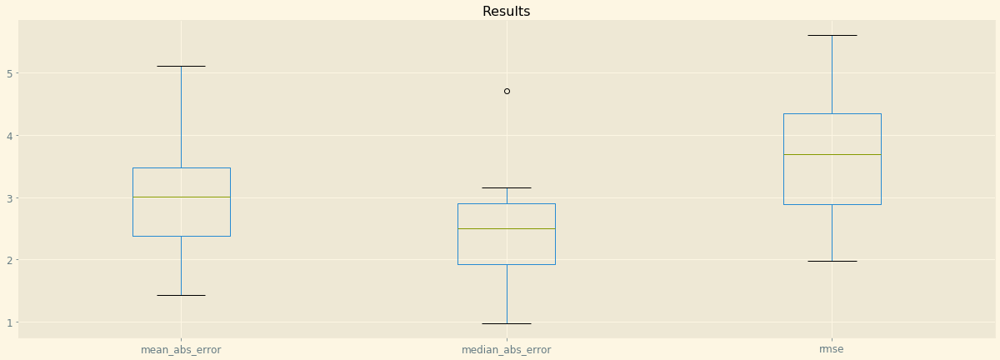

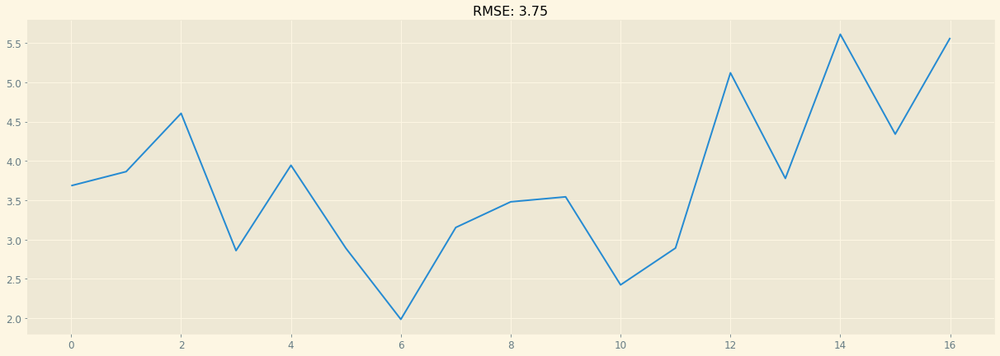

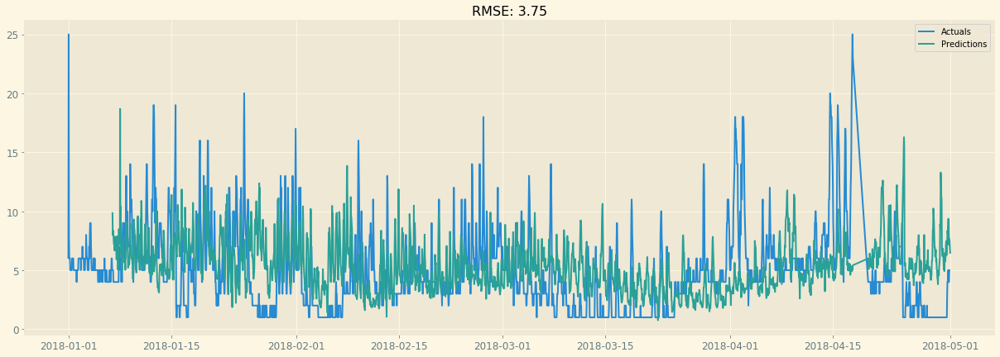

In [16]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_18 = pd.DataFrame(results_over_time)
predictions_over_time_18 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_18

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_18, results_over_time_18)

### Station nr 28079024 - Casa de Campo

In [17]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079024

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079024

Missing values for particle and station of interest: 1.23%

One particle, one station DF shape: (54807, 9)


,SO_2,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,3.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,3.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,3.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,3.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,4.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=680.147, BIC=702.567, Time=0.592 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=815.811, BIC=823.284, Time=0.082 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=714.953, BIC=726.162, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=683.468, BIC=694.678, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=813.815, BIC=817.551, Time=0.027 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=686.035, BIC=704.718, Time=0.252 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=679.680, BIC=698.363, Time=0.251 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=685.122, BIC=700.068, Time=0.139 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=698.254, BIC=713.200, Time=0.077 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=680.131, BIC=702.

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=407.158, BIC=425.841, Time=0.314 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=417.003, BIC=443.159, Time=0.729 seconds
Total fit time: 3.194 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=364.334, BIC=386.753, Time=1.277 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=467.671, BIC=475.145, Time=0.239 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=400.679, BIC=411.889, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=361.862, BIC=373.072, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=465.684, BIC=469.420, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=362.760, BIC=377.706, Time=0.157 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=362.957, BIC=377.903, Time=0.121 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=362.362

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1081.527, BIC=1100.178, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1083.493, BIC=1102.144, Time=0.176 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1085.861, BIC=1111.972, Time=0.942 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1083.077, BIC=1109.188, Time=0.514 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1085.828, BIC=1100.748, Time=0.308 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1081.318, BIC=1103.698, Time=0.194 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1085.058, BIC=1103.708, Time=0.188 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1078.855, BIC=1104.966, Time=0.531 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1079.336, BIC=1101.716, Time=0.166 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1080.304, BIC=1110.145, Time=0.478 seconds
Fit ARIMA: (1, 0, 5)

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=821.850, BIC=848.029, Time=0.896 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=825.257, BIC=851.435, Time=0.953 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=831.088, BIC=846.047, Time=0.165 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=820.049, BIC=842.487, Time=0.490 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=819.767, BIC=842.206, Time=0.680 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=804.897, BIC=827.297, Time=0.644 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=950.452, BIC=957.919, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=856.077, BIC=867.277, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=809.360, BIC=820.560, Time=0.115 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=948.455, BIC=952.188, Time=0.023 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=812.872, BIC=831.539, Time=0.146 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=808.973, BIC=827.640, Time=0.220 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=807.577, BIC=833.711, Time=0.790 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=812.694, BIC=838.828, Time=0.953 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of t

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=439.249, BIC=454.182, Time=0.276 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=440.088, BIC=458.755, Time=0.294 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=438.910, BIC=457.577, Time=0.281 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=439.422, BIC=454.355, Time=0.139 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=440.743, BIC=463.143, Time=0.460 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=441.411, BIC=460.078, Time=0.199 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=436.807, BIC=462.940, Time=1.300 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.764 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=422.499, BIC=444.899, Time=0.253 seconds
F

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1175.218, BIC=1204.768, Time=0.811 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1172.351, BIC=1201.901, Time=0.782 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1176.476, BIC=1202.332, Time=0.267 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1173.920, BIC=1207.164, Time=0.979 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1173.422, BIC=1206.666, Time=1.084 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1178.302, BIC=1207.851, Time=0.642 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1172.788, BIC=1209.725, Time=0.945 seconds
Total fit time: 7.309 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1215.599, BIC=1237.861, Time=0.492 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1300.961, BIC=1308.382, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=860.787, BIC=886.943, Time=0.761 seconds
Near non-invertible roots for order (4, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=861.419, BIC=887.575, Time=0.734 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=883.583, BIC=906.003, Time=0.097 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=860.749, BIC=890.642, Time=0.796 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.266 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=807.583, BIC=829.983, Time=0.224 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=934.899, BIC=942.366, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=874.462, BIC=893.129, Time=0.539 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=877.912, BIC=896.579, Time=0.258 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=880.897, BIC=907.030, Time=0.693 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=881.511, BIC=907.644, Time=0.521 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=878.062, BIC=892.996, Time=0.118 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=876.367, BIC=898.767, Time=0.648 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=878.909, BIC=901.309, Time=0.374 seconds
Fit ARIMA: (

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=693.021, BIC=696.751, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=579.212, BIC=594.133, Time=0.156 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=579.508, BIC=594.429, Time=0.178 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=582.157, BIC=600.808, Time=0.284 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 1.314 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=521.971, BIC=544.351, Time=0.495 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=628.542, BIC=636.002, Time=0.062 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=557.159, BIC=568.350, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=518.175, BIC=529.365, Time=0.105 seconds


Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1273.685, BIC=1288.513, Time=0.247 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1273.209, BIC=1295.451, Time=0.273 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1288.092, BIC=1306.628, Time=0.119 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.958, BIC=1290.493, Time=0.222 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1273.608, BIC=1299.557, Time=0.537 seconds
Total fit time: 2.338 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1277.911, BIC=1300.272, Time=0.605 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1356.510, BIC=1363.964, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1289.394, BIC=1300.575, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1311.142, BIC=1322.323, Time=0.064 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=822.669, BIC=848.802, Time=0.949 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=829.223, BIC=855.356, Time=0.805 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=827.905, BIC=850.306, Time=0.127 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=823.060, BIC=852.927, Time=0.858 seconds
Total fit time: 4.460 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=871.890, BIC=894.309, Time=0.277 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=985.094, BIC=992.567, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=886.487, BIC=897.697, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=871.444, BIC=882.654, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=983.178, BIC=986.914, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=868.646

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=620.195, BIC=638.878, Time=0.203 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=622.200, BIC=644.620, Time=0.201 seconds
Total fit time: 1.712 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=601.331, BIC=623.750, Time=0.248 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=723.709, BIC=731.183, Time=0.054 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=637.371, BIC=648.581, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=596.447, BIC=607.657, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=721.715, BIC=725.451, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=597.787, BIC=612.734, Time=0.107 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=597.789, BIC=612.736, Time=0.104 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=599.784

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1326.949, BIC=1353.060, Time=0.695 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1326.949, BIC=1353.060, Time=0.445 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1325.442, BIC=1340.362, Time=0.170 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1327.997, BIC=1350.378, Time=0.352 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1327.998, BIC=1350.378, Time=0.416 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1330.738, BIC=1360.579, Time=0.765 seconds
Total fit time: 3.980 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1378.504, BIC=1400.846, Time=0.338 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1425.047, BIC=1432.494, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1379.512, BIC=1390.683, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=822.000, BIC=833.229, Time=0.101 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=972.642, BIC=976.385, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=823.973, BIC=838.945, Time=0.147 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=823.970, BIC=838.942, Time=0.171 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=825.996, BIC=844.711, Time=0.129 seconds
Total fit time: 0.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=858.481, BIC=880.919, Time=0.413 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1007.619, BIC=1015.099, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=910.327, BIC=921.547, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=854.299, BIC=865.518, Time=0.113 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1005

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=781.824, BIC=796.783, Time=0.182 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=781.967, BIC=796.926, Time=0.182 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=778.977, BIC=797.676, Time=0.632 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 1.907 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=709.620, BIC=732.058, Time=0.427 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=817.396, BIC=824.875, Time=0.096 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=739.056, BIC=750.275, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=705.385, BIC=716.605, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=815.432, BIC=819.172, Time=0.068 seconds


Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=957.969, BIC=976.652, Time=0.127 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=952.131, BIC=970.814, Time=0.246 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=953.508, BIC=968.454, Time=0.288 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1001.847, BIC=1016.793, Time=0.055 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=953.770, BIC=976.190, Time=0.389 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=990.676, BIC=1009.359, Time=0.076 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=955.738, BIC=981.894, Time=0.652 seconds
Total fit time: 2.333 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1067.618, BIC=1090.018, Time=0.309 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1209.510, BIC=1216.977, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1120.895, BIC=1139.610, Time=0.789 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1172.715, BIC=1198.916, Time=0.892 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1118.818, BIC=1145.019, Time=0.932 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1124.699, BIC=1139.671, Time=0.373 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=908.922, BIC=931.360, Time=0.566 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1039.794, BIC=1047.273, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=956.859, BIC=968.079, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=913.984, BIC=925.203, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1037.796, BIC=1041.535, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=907.101, BIC=925.800, Time=0.578 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=908.609, BIC=927.308, Time=0.225 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=913.683, BIC=928.642, Time=0.135 seconds
Fit ARIMA: (2, 1, 0)x(0, 0

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=715.956, BIC=730.915, Time=0.167 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=715.330, BIC=734.029, Time=0.476 seconds
Total fit time: 1.678 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=654.450, BIC=676.889, Time=0.541 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=776.082, BIC=783.562, Time=0.073 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=706.374, BIC=717.593, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=649.850, BIC=661.070, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=774.082, BIC=777.822, Time=0.027 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=650.496, BIC=665.455, Time=0.262 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=650.520, BIC=665.480, Time=0.173 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=652.486

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1142.259, BIC=1157.231, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1146.012, BIC=1164.727, Time=0.256 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1144.515, BIC=1159.487, Time=0.080 seconds
Total fit time: 1.515 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1166.837, BIC=1189.295, Time=0.449 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1313.837, BIC=1321.323, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1227.642, BIC=1238.872, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1167.658, BIC=1178.887, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1311.837, BIC=1315.580, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1163.441, BIC=1182.156, Time=0.608 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=785.397, BIC=804.096, Time=0.853 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=787.482, BIC=806.181, Time=0.236 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=792.613, BIC=807.572, Time=0.183 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=816.497, BIC=831.456, Time=0.059 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=787.404, BIC=809.843, Time=0.612 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=812.044, BIC=830.743, Time=0.273 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=789.389, BIC=815.568, Time=1.567 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=791.662, BIC=817.840, Time=0.863 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score t

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=723.342, BIC=738.288, Time=0.123 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=723.362, BIC=738.308, Time=0.107 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=724.685, BIC=743.368, Time=0.208 seconds
Total fit time: 1.199 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=681.787, BIC=704.207, Time=0.283 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=837.448, BIC=844.921, Time=0.055 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=727.349, BIC=738.558, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=682.275, BIC=693.484, Time=0.241 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=835.452, BIC=839.188, Time=0.038 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=683.519, BIC=702.202, Time=0.351 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=680.565

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=442.295, BIC=457.241, Time=0.180 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=442.295, BIC=457.242, Time=0.154 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=443.647, BIC=462.330, Time=0.524 seconds
Total fit time: 1.657 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=434.285, BIC=456.705, Time=0.489 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=545.166, BIC=552.639, Time=0.037 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=468.902, BIC=480.112, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=433.478, BIC=444.687, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=543.166, BIC=546.902, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=434.574, BIC=449.520, Time=0.356 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=434.862

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1074.952, BIC=1097.371, Time=0.727 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1196.423, BIC=1203.896, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1119.612, BIC=1130.822, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1091.601, BIC=1102.810, Time=0.071 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1194.428, BIC=1198.164, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1076.999, BIC=1095.682, Time=0.552 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1073.506, BIC=1092.188, Time=0.484 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=766.625, BIC=789.045, Time=0.215 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=766.726, BIC=792.882, Time=0.596 seconds
Total fit time: 2.592 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=802.862, BIC=825.282, Time=0.467 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=940.262, BIC=947.735, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=847.371, BIC=858.580, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=806.435, BIC=817.644, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=938.262, BIC=941.998, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=810.427, BIC=829.109, Time=0.146 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=802.488, BIC=821.171, Time=0.235 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=807.867

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=546.436, BIC=572.614, Time=0.780 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=555.171, BIC=570.130, Time=0.115 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=558.636, BIC=581.074, Time=0.344 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=554.001, BIC=576.440, Time=0.761 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=566.396, BIC=585.095, Time=0.435 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=555.970, BIC=582.149, Time=0.853 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=570.311, BIC=585.270, Time=0.091 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=565.773, BIC=588.212, Time=0.155 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=555.301, BIC=585.21

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=827.372, BIC=842.306, Time=0.060 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=789.727, BIC=812.128, Time=0.296 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=812.777, BIC=831.444, Time=0.093 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=792.214, BIC=818.348, Time=0.295 seconds
Total fit time: 2.564 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=853.557, BIC=875.918, Time=0.471 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=996.683, BIC=1004.136, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=903.954, BIC=915.134, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=862.980, BIC=874.161, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=994.691, BIC=998.418, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=861.27

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1012.015, BIC=1034.453, Time=0.718 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1011.636, BIC=1034.074, Time=0.591 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1016.231, BIC=1046.149, Time=0.784 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 6.276 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=984.495, BIC=1006.953, Time=0.882 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1086.07

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=876.573, BIC=902.774, Time=0.949 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=898.198, BIC=913.170, Time=0.317 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=875.035, BIC=897.493, Time=1.353 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=878.420, BIC=897.135, Time=0.522 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=876.446, BIC=902.647, Time=0.976 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=899.776, BIC=914.748, Time=0.144 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=876.693, BIC=899.151, Time=0.260 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=878.972, BIC=908.916, Time=0.504 seconds
Total fit time: 7.037 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=990.279, BIC=1012.737, Time=0.676 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1116.93

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=649.046, BIC=671.484, Time=0.929 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=762.965, BIC=770.445, Time=0.092 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=704.712, BIC=715.931, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=653.561, BIC=664.780, Time=0.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=760.970, BIC=764.710, Time=0.029 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=647.207, BIC=665.906, Time=0.568 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=650.015, BIC=664.974, Time=0.151 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=648.580, BIC=663.539, Time=0.193 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=649.011, BIC=671.450, Time=0.818 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=650.632, BIC=669.331, Time=0.383 seco

Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=545.488, BIC=567.908, Time=0.145 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=547.340, BIC=573.496, Time=0.328 seconds
Total fit time: 2.220 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=996.220, BIC=1018.639, Time=0.389 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1167.791, BIC=1175.264, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1088.249, BIC=1099.458, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=990.667, BIC=1001.877, Time=0.099 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1165.792, BIC=1169.529, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=992.535, BIC=1007.481, Time=0.179 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=992.531, BIC=1007.477, Time=0.150 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=929.416, BIC=948.067, Time=0.221 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=928.386, BIC=943.307, Time=0.137 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=930.190, BIC=948.840, Time=0.178 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=928.874, BIC=943.795, Time=0.128 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=930.667, BIC=953.048, Time=0.352 seconds
Total fit time: 1.449 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=868.449, BIC=890.888, Time=0.481 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=989.501, BIC=996.981, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=923.549, BIC=934.769, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=869.972, BIC=881.191, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=987.504

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=956.770, BIC=975.453, Time=0.385 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=958.798, BIC=977.481, Time=0.360 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=957.259, BIC=972.206, Time=0.214 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=982.768, BIC=997.715, Time=0.065 seconds
Total fit time: 1.894 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=877.913, BIC=900.332, Time=0.692 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=986.616, BIC=994.090, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=926.603, BIC=937.812, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=883.559, BIC=894.769, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=984.616, BIC=988.353, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=876.258

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=643.536, BIC=673.402, Time=1.200 seconds
Total fit time: 7.536 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=585.001, BIC=607.401, Time=0.275 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=696.263, BIC=703.730, Time=0.057 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=629.132, BIC=640.332, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=581.812, BIC=593.012, Time=0.140 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=694.263, BIC=697.997, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=581.522, BIC=596.455, Time=0.186 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=581.108, BIC=599.775, Time=0.243 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=597.900, BIC=612.833, Time=0.079 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=577.341

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1155.893, BIC=1174.478, Time=0.446 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1160.966, BIC=1175.834, Time=0.082 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1154.481, BIC=1169.349, Time=0.313 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1155.863, BIC=1174.448, Time=0.372 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1157.125, BIC=1171.993, Time=0.116 seconds
Total fit time: 1.954 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1278.574, BIC=1300.837, Time=0.462 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1317.892, BIC=1325.313, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1304.184, BIC=1315.316, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1309.079, BIC=1320.211, Time=0.060 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=830.966, BIC=845.912, Time=0.115 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=827.891, BIC=846.573, Time=0.299 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=834.546, BIC=849.492, Time=0.080 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=825.239, BIC=847.659, Time=0.611 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=832.753, BIC=851.436, Time=0.107 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=826.995, BIC=853.151, Time=0.921 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=836.118, BIC=862.274, Time=0.565 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=834.442, BIC=856.861, Time=0.144 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=828.089, BIC=857.981, Time=0.958 seconds
Total fit time: 4.426 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=876.452,

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=621.309, BIC=632.528, Time=0.120 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=765.403, BIC=769.142, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=621.154, BIC=636.113, Time=0.128 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=622.904, BIC=641.603, Time=0.218 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=622.988, BIC=641.687, Time=0.283 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=621.019, BIC=635.978, Time=0.144 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=622.960, BIC=641.659, Time=0.195 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=620.497, BIC=642.936, Time=0.709 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=616.020, BIC=642.198, Time=0.974 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=621.548, BIC=651.466, Time=1.325 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (cons

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1129.887, BIC=1148.537, Time=0.410 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1144.135, BIC=1159.055, Time=0.085 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1127.997, BIC=1142.917, Time=0.248 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1129.892, BIC=1148.542, Time=0.399 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1133.756, BIC=1148.676, Time=0.128 seconds
Total fit time: 2.108 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1328.674, BIC=1351.074, Time=0.332 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1372.199, BIC=1379.666, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1336.688, BIC=1347.888, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1344.826, BIC=1356.026, Time=0.053 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1027.502, BIC=1042.487, Time=0.156 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1027.550, BIC=1042.535, Time=0.119 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1024.602, BIC=1043.333, Time=0.499 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 1.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=829.654, BIC=852.131, Time=0.360 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=976.741, BIC=984.234, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=895.647, BIC=906.885, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=824.017, BIC=835.256, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=974.751, BIC=978.497, Time=0.221 se

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=904.918, BIC=908.661, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=809.760, BIC=824.732, Time=0.167 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=809.768, BIC=824.740, Time=0.135 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=811.335, BIC=830.050, Time=0.227 seconds
Total fit time: 1.216 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=782.959, BIC=805.417, Time=0.662 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=891.360, BIC=898.846, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=822.266, BIC=833.495, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=782.974, BIC=794.203, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=889.411, BIC=893.154, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=780.38

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=720.960, BIC=724.703, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=606.382, BIC=625.097, Time=0.243 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=599.779, BIC=618.494, Time=0.287 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=604.698, BIC=619.670, Time=0.140 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=625.573, BIC=640.545, Time=0.084 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=601.519, BIC=623.977, Time=0.303 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=620.050, BIC=638.765, Time=0.107 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=603.727, BIC=629.928, Time=0.647 seconds
Total fit time: 2.464 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=731.882, BIC=754.302, Time=0.532 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=880.724

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1339.817, BIC=1354.789, Time=0.198 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1339.864, BIC=1358.579, Time=0.322 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1339.378, BIC=1354.350, Time=0.299 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1340.466, BIC=1359.181, Time=0.158 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1340.915, BIC=1363.374, Time=0.607 seconds
Total fit time: 2.781 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1216.086, BIC=1238.564, Time=0.858 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1268.837, BIC=1276.329, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1218.712, BIC=1229.951, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1233.430, BIC=1244.669, Time=0.055 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=874.798, BIC=893.513, Time=0.380 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=882.159, BIC=897.131, Time=0.148 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=908.321, BIC=923.293, Time=0.081 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=876.619, BIC=899.077, Time=0.350 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=900.163, BIC=918.878, Time=0.086 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=878.797, BIC=904.998, Time=0.620 seconds
Total fit time: 3.218 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=908.275, BIC=930.733, Time=0.902 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1049.393, BIC=1056.879, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=953.757, BIC=964.986, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=912.84

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=789.893, BIC=804.865, Time=0.147 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=790.085, BIC=805.057, Time=0.166 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=793.302, BIC=812.017, Time=0.310 seconds
Total fit time: 1.211 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=718.640, BIC=741.098, Time=0.664 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=854.535, BIC=862.021, Time=0.048 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=774.785, BIC=786.014, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=715.697, BIC=726.926, Time=0.118 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=852.539, BIC=856.282, Time=0.040 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=717.205, BIC=732.177, Time=0.160 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=717.233

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=947.767, BIC=962.726, Time=0.137 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=997.747, BIC=1012.707, Time=0.066 seconds
Total fit time: 1.270 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1153.570, BIC=1176.047, Time=0.410 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1189.821, BIC=1197.314, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1160.760, BIC=1171.999, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1169.657, BIC=1180.896, Time=0.056 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1653.970, BIC=1657.716, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1150.821, BIC=1169.552, Time=0.557 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1156.486, BIC=1171.470, Time=0.089 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=Tru

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=883.110, BIC=905.568, Time=0.688 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=885.827, BIC=915.772, Time=0.939 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 5.709 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=788.990, BIC=811.448, Time=0.752 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=924.380, BIC=931.866, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=840.717, BIC=851.946, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=794.969, BIC=806.198, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=734.325, BIC=745.544, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=862.837, BIC=866.577, Time=0.038 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=729.493, BIC=748.192, Time=0.619 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=731.650, BIC=750.349, Time=0.239 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=735.031, BIC=749.990, Time=0.174 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=760.070, BIC=775.029, Time=0.071 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=732.246, BIC=754.684, Time=0.433 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=753.183, BIC=771.882, Time=0.134 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=733.903, BIC=760.0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=558.256, BIC=576.955, Time=0.268 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=562.904, BIC=577.863, Time=0.152 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=583.450, BIC=598.410, Time=0.094 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=560.250, BIC=582.689, Time=0.452 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=579.998, BIC=598.697, Time=0.167 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=560.896, BIC=587.075, Time=0.853 seconds
Total fit time: 3.443 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=517.562, BIC=539.981, Time=0.704 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=630.591, BIC=638.064, Time=0.029 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=564.014, BIC=575.224, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=515.355,

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1085.307, BIC=1111.508, Time=0.883 seconds
Total fit time: 5.592 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1226.117, BIC=1248.556, Time=0.462 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1281.711, BIC=1289.191, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1227.254, BIC=1238.473, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1243.978, BIC=1255.198, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1671.637, BIC=1675.377, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1224.376, BIC=1243.075, Time=0.292 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1225.621, BIC=1240.581, Time=0.124 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1222.569, BIC=1237.528, Time=0.312 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=738.880, BIC=761.319, Time=0.405 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=827.263, BIC=834.743, Time=0.091 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=776.344, BIC=787.563, Time=0.109 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=752.216, BIC=763.436, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=825.267, BIC=829.007, Time=0.068 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=738.349, BIC=757.048, Time=0.325 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=745.602, BIC=760.562, Time=0.126 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=739.130, BIC=754.089, Time=0.155 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=737.796, BIC=760.235, Time=0.375 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=736.182, BIC=754.881, Time=0.185 seco

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=590.206, BIC=612.664, Time=0.545 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=745.955, BIC=753.441, Time=0.042 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=633.293, BIC=644.522, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=590.595, BIC=601.824, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=743.960, BIC=747.703, Time=0.027 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=591.604, BIC=610.319, Time=0.313 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=590.216, BIC=608.932, Time=0.178 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=592.047, BIC=618.248, Time=0.690 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=591.159, BIC=617.360, Time=0.847 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least on

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=364.961, BIC=387.419, Time=0.712 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=468.656, BIC=476.142, Time=0.044 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=402.197, BIC=413.426, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=362.574, BIC=373.803, Time=0.175 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=466.669, BIC=470.412, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=363.306, BIC=378.278, Time=0.171 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=363.528, BIC=378.500, Time=0.130 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=362.973, BIC=381.688, Time=0.721 seconds
Total fit time: 2.058 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=378.595, BIC=401.034, Time=0.649 seconds
Fit ARIMA: (0, 1, 0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1092.566, BIC=1111.249, Time=0.159 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1111.063, BIC=1126.009, Time=0.089 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1095.869, BIC=1110.815, Time=0.167 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1092.329, BIC=1114.749, Time=0.193 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1096.017, BIC=1114.700, Time=0.114 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1094.250, BIC=1120.406, Time=0.419 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1089.300, BIC=1115.456, Time=0.481 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1090.404, BIC=1112.824, Time=0.137 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1091.115, BIC=1121.007, Time=0.583 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=1094.115, BIC=1124.008, Time=1.025 seconds
Fit ARIMA: (0, 0, 5)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=846.181, BIC=864.912, Time=0.256 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=821.433, BIC=840.164, Time=0.575 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=825.350, BIC=851.573, Time=0.634 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=828.740, BIC=854.963, Time=1.385 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=834.448, BIC=849.432, Time=0.221 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=816.066, BIC=834.765, Time=0.250 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=812.302, BIC=831.001, Time=0.576 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=810.642, BIC=836.820, Time=0.780 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=814.854, BIC=841.032, Time=0.956 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=814.478, BIC=829.437, Time=0.261 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=807.832, BIC=830.271, Time=0.586 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=811.041, BIC=833.480, Time=0.522 seconds
Fit ARIMA: (

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=443.234, BIC=461.933, Time=0.262 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=444.032, BIC=458.991, Time=0.154 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=445.154, BIC=467.593, Time=0.667 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=445.946, BIC=464.645, Time=0.191 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=441.749, BIC=467.928, Time=0.843 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 3.233 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=426.679, BIC=449.118, Time=0.409 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=524.229, BIC=531.709, Time=0.069 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=470.297, BIC=481.516, Time=0.068 seconds
F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1223.684, BIC=1242.253, Time=0.573 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1224.238, BIC=1242.806, Time=0.678 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1227.869, BIC=1253.865, Time=0.748 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1227.580, BIC=1253.576, Time=0.716 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=835.729, BIC=858.130, Time=0.821 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=936.574, BIC=944.041, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=868.197, BIC=879.397, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=847.866, BIC=859.066, Time=0.103 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=934.574, BIC=938.307, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=851.865, BIC=870.532, Time=0.128 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=834.350, BIC=853.016, Time=0.602 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=837.401, BIC=863.534, Time=0.938 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=838.718, BIC=861.138, Time=0.611 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=834.137, BIC=856.556, Time=0.335 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=838.722, BIC=868.615, Time=0.732 seconds
Total fit time: 5.640 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=819.358, BIC=841.797, Time=0.785 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=954.572, BIC=962.051, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=867.656, BIC=878.875, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=823.514, BIC=834.733, Time=0.119 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=952.574, BIC=956.314, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=826.816, BIC=845.515, Time=0.532 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=821.183

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=460.596, BIC=471.806, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=600.182, BIC=603.918, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=460.550, BIC=475.496, Time=0.127 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=462.436, BIC=481.119, Time=0.292 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=462.530, BIC=481.213, Time=0.253 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=460.569, BIC=475.515, Time=0.168 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=471.871, BIC=486.817, Time=0.126 seconds
Total fit time: 1.596 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=446.475, BIC=468.894, Time=0.625 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=553.897, BIC=561.370, Time=0.089 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=472.662

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1174.490, BIC=1193.206, Time=0.290 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1174.493, BIC=1193.208, Time=0.665 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1168.444, BIC=1194.645, Time=0.687 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1174.189, BIC=1196.647, Time=0.588 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1167.652, BIC=1197.596, Time=0.596 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1173.278, BIC=1199.479, Time=0.517 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1168.528, BIC=1202.215, Time=0.966 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1169.083, BIC=1202.770, Time=1.039 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1167.943, BIC=1197.887, Time=0.975 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1167.383, BIC=1197.327, Time=0.596 seconds
Fit ARIMA: (5, 0, 0)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=860.625, BIC=879.324, Time=0.253 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=864.580, BIC=879.539, Time=0.140 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=864.743, BIC=879.702, Time=0.193 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=861.807, BIC=884.246, Time=0.339 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=863.787, BIC=882.486, Time=0.184 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=863.681, BIC=882.380, Time=0.159 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=863.758, BIC=889.937, Time=0.561 seconds
Total fit time: 2.249 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=934.169, BIC=956.607, Time=0.417 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1054.677, BIC=1062.157, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=979.82

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=534.442, BIC=545.671, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=660.992, BIC=664.735, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=535.736, BIC=550.708, Time=0.134 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=535.800, BIC=550.772, Time=0.149 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=537.721, BIC=556.436, Time=0.236 seconds
Total fit time: 1.333 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=495.740, BIC=518.199, Time=0.982 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=613.854, BIC=621.340, Time=0.098 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=533.436, BIC=544.665, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=495.651, BIC=506.880, Time=0.130 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=611.86

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1306.516, BIC=1328.935, Time=0.513 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1346.782, BIC=1354.255, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1308.441, BIC=1319.651, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1315.880, BIC=1327.090, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1708.721, BIC=1712.458, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1304.545, BIC=1323.228, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1312.014, BIC=1326.961, Time=0.134 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1305.941, BIC=1320.888, Time=0.329 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1306.459, BIC=1328.879, Time=0.340 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1313.369, BIC=1332.052, Time=0.240 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=972.952, BIC=991.683, Time=0.800 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=977.135, BIC=999.612, Time=0.413 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=975.600, BIC=994.331, Time=0.201 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=975.460, BIC=994.191, Time=0.227 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=972.766, BIC=998.989, Time=1.105 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.764 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1011.614, BIC=1034.091, Time=0.229 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1146.397, BIC=1153.889, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1073.842, BIC=1085.080, Time=0.061 sec

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=627.816, BIC=650.293, Time=0.648 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=744.138, BIC=751.630, Time=0.077 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=669.173, BIC=680.411, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=626.618, BIC=637.856, Time=0.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=742.143, BIC=745.889, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=627.365, BIC=642.350, Time=0.188 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=627.719, BIC=642.704, Time=0.171 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=625.625, BIC=644.356, Time=0.630 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=627.554, BIC=650.031, Time=0.414 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=626.084, BIC=644.815, Time=0.317 seco

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1074.233, BIC=1100.411, Time=0.695 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1076.780, BIC=1091.739, Time=0.147 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1072.246, BIC=1094.685, Time=0.344 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1073.167, BIC=1091.866, Time=0.355 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1074.236, BIC=1100.414, Time=0.351 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1077.556, BIC=1092.515, Time=0.181 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1073.777, BIC=1096.216, Time=0.437 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1075.494, BIC=1105.413, Time=0.987 seconds
Total fit time: 4.957 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1323.885, BIC=1346.381, Time=0.423 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=997.065, BIC=1019.523, Time=0.609 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1129.264, BIC=1136.750, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1039.917, BIC=1051.146, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1006.571, BIC=1017.800, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1127.265, BIC=1131.008, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1008.461, BIC=1027.176, Time=0.402 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=995.814, BIC=1014.529, Time=0.444 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1005.353, BIC=1020.325, Time=0.187 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1034.339, BIC=1049.311, Time=0.086 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=997.346, BIC=1019.804

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=929.525, BIC=944.510, Time=0.175 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=931.584, BIC=950.315, Time=0.155 seconds
Total fit time: 1.281 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=905.145, BIC=927.622, Time=0.380 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1064.673, BIC=1072.165, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=975.632, BIC=986.870, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=903.270, BIC=914.508, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1062.689, BIC=1066.435, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=905.070, BIC=920.055, Time=0.197 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=905.052, BIC=920.037, Time=0.326 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=903

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=628.394, BIC=639.632, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=577.750, BIC=588.989, Time=0.110 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=697.352, BIC=701.098, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=578.624, BIC=593.608, Time=0.226 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=578.677, BIC=593.662, Time=0.165 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=578.923, BIC=597.654, Time=0.900 seconds
Total fit time: 2.530 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=628.536, BIC=651.013, Time=0.893 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=745.560, BIC=753.052, Time=0.082 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=680.279, BIC=691.518, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=623.593

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=983.278, BIC=1002.009, Time=0.690 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=974.172, BIC=992.903, Time=0.794 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=974.061, BIC=1000.285, Time=0.818 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=976.863, BIC=1003.086, Time=0.904 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=979.903, BIC=994.887, Time=0.186 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=973.129, BIC=995.606, Time=0.661 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=972.789, BIC=995.266, Time=0.739 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=999.693, BIC=1018.424, Time=0.108 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=974.688, BIC=10

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=795.483, BIC=806.712, Time=0.112 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=740.276, BIC=751.505, Time=0.150 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=877.254, BIC=880.997, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=737.212, BIC=755.927, Time=0.634 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=741.747, BIC=756.719, Time=0.141 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=741.577, BIC=756.549, Time=0.196 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=737.754, BIC=760.212, Time=0.836 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=741.862, BIC=760.577, Time=0.237 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=740.612, BIC=759.3

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=548.441, BIC=574.529, Time=0.842 seconds
Total fit time: 3.016 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=561.490, BIC=583.948, Time=0.656 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=679.092, BIC=686.578, Time=0.052 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=595.461, BIC=606.690, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=563.453, BIC=574.682, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=677.099, BIC=680.842, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=561.771, BIC=580.486, Time=0.537 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=559.491, BIC=578.206, Time=0.286 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=564.070, BIC=579.042, Time=0.704 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=585.225

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1088.470, BIC=1103.454, Time=0.301 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1086.695, BIC=1109.172, Time=0.626 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1096.325, BIC=1115.056, Time=0.129 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1085.778, BIC=1104.509, Time=1.006 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1091.265, BIC=1106.250, Time=0.128 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1087.700, BIC=1110.177, Time=1.266 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1093.024, BIC=1111.755, Time=0.184 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1087.942, BIC=1114.166, Time=0.888 seconds
Total fit time: 5.762 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1229.027, BIC=1251.485, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=938.923, BIC=942.666, Time=0.036 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=830.512, BIC=849.227, Time=0.748 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=832.747, BIC=847.719, Time=0.135 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=830.068, BIC=845.040, Time=0.426 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=830.246, BIC=848.961, Time=0.259 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=867.513, BIC=882.485, Time=0.082 seconds
Total fit time: 2.518 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=741.437, BIC=763.895, Time=0.411 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=830.124, BIC=837.610, Time=0.147 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=779.271, BIC=790.500, Time=0.144 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=754.135

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=684.822, BIC=707.300, Time=0.777 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=824.389, BIC=831.882, Time=0.043 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=719.533, BIC=730.772, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=688.736, BIC=699.975, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=822.405, BIC=826.151, Time=0.028 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=690.939, BIC=709.670, Time=0.277 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=684.134, BIC=702.865, Time=0.253 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=690.275, BIC=705.259, Time=0.150 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=703.776, BIC=718.761, Time=0.091 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=684.869, BIC=707.346, Time=0.326 seco

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=408.793, BIC=431.270, Time=0.610 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=498.626, BIC=506.118, Time=0.086 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=451.392, BIC=462.630, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=412.388, BIC=423.627, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=496.637, BIC=500.383, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=407.108, BIC=425.839, Time=0.302 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=408.321, BIC=423.306, Time=0.127 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=407.052, BIC=422.036, Time=0.171 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=408.262, BIC=426.993, Time=0.256 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=428.707, BIC=443.691, Time=0.099 seco

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1154.702, BIC=1180.767, Time=0.521 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1154.463, BIC=1187.975, Time=0.922 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1149.650, BIC=1183.163, Time=1.057 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1147.742, BIC=1177.530, Time=0.920 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1149.863, BIC=1175.928, Time=0.327 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1149.741, BIC=1183.253, Time=1.202 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1150.529, BIC=1180.318, Time=0.292 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1150.953, BIC=1188.189, Time=1.576 seconds
Total fit time: 8.815 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1102.676, BIC=1125.115, Time=0.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=950.337, BIC=976.583, Time=1.015 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=958.332, BIC=973.330, Time=0.226 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=947.943, BIC=970.439, Time=0.748 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=948.045, BIC=970.541, Time=0.786 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=951.884, BIC=981.879, Time=1.038 seconds
Near non-invertible roots for order (3, 1, 3)(

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=884.668, BIC=899.653, Time=0.159 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=885.383, BIC=900.367, Time=0.116 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=887.387, BIC=906.118, Time=0.408 seconds
Total fit time: 1.194 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=812.131, BIC=834.589, Time=0.734 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=958.214, BIC=965.700, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=862.942, BIC=874.171, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=815.488, BIC=826.717, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=956.237, BIC=959.980, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=819.011, BIC=837.726, Time=0.284 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=815.312

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=446.300, BIC=457.530, Time=0.092 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=538.592, BIC=542.335, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=446.474, BIC=461.446, Time=0.195 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=446.553, BIC=461.525, Time=0.122 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=445.885, BIC=464.600, Time=0.242 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=447.817, BIC=470.275, Time=0.412 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=448.530, BIC=467.245, Time=0.197 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=447.436, BIC=466.151, Time=0.519 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=444.195, BIC=470.396, Time=0.880 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of t

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1235.803, BIC=1258.105, Time=0.344 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1309.615, BIC=1317.049, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1266.927, BIC=1278.079, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1246.293, BIC=1257.445, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1307.622, BIC=1311.339, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1226.877, BIC=1245.462, Time=0.524 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1227.378, BIC=1245.963, Time=0.524 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=843.394, BIC=862.077, Time=0.666 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=843.230, BIC=861.913, Time=0.305 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=852.997, BIC=867.943, Time=0.178 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=864.736, BIC=879.683, Time=0.081 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=843.235, BIC=865.655, Time=0.742 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=864.874, BIC=883.557, Time=0.074 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=847.229, BIC=873.385, Time=0.427 seconds
Total fit ti

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=713.977, BIC=736.435, Time=0.699 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=843.147, BIC=850.633, Time=0.063 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=763.580, BIC=774.809, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=716.421, BIC=727.650, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=841.151, BIC=844.894, Time=0.024 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=712.350, BIC=731.065, Time=0.688 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=715.178, BIC=733.893, Time=0.242 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=715.964, BIC=742.165, Time=0.686 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=721.123, BIC=747.3

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=436.223, BIC=462.401, Time=0.863 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=438.603, BIC=453.562, Time=0.116 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=442.606, BIC=465.044, Time=0.224 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=442.364, BIC=464.803, Time=0.276 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=441.555, BIC=471.473, Time=0.976 seconds
Total fit time: 4.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=618.562, BIC=640.962, Time=0.417 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=771.685, BIC=779.152, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=675.454, BIC=686.654, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=615.524, BIC=626.724, Time=0.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=769.690

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1073.985, BIC=1092.700, Time=1.039 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1077.464, BIC=1096.179, Time=0.191 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1077.443, BIC=1103.644, Time=0.689 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1078.391, BIC=1104.592, Time=0.923 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1075.642, BIC=1090.614, Time=0.202 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1075.865, BIC=1090.837, Time=0.187 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1113.754, BIC=1128.726, Time=0.074 second

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=913.723, BIC=928.695, Time=0.135 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=913.728, BIC=928.700, Time=0.223 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=915.188, BIC=933.903, Time=0.285 seconds
Total fit time: 1.134 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=850.418, BIC=872.896, Time=0.446 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=985.781, BIC=993.273, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=906.367, BIC=917.605, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=845.920, BIC=857.158, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=983.781, BIC=987.527, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=847.913, BIC=862.898, Time=0.127 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=847.913

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=854.264, BIC=876.664, Time=0.444 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1013.115, BIC=1020.581, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=922.539, BIC=933.739, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=848.872, BIC=860.072, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1011.115, BIC=1014.848, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=850.872, BIC=865.805, Time=0.151 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=850.872, BIC=865.805, Time=0.170 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=852.752, BIC=871.418, Time=0.313 seconds
Total fit time: 1.304 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1138.984, BIC=1161.404, Time=0.547 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1042.076, BIC=1060.791, Time=0.687 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1050.856, BIC=1069.571, Time=0.231 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1045.769, BIC=1071.970, Time=0.715 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1047.389, BIC=1069.847, Time=0.688 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1049.174, BIC=1079.118, Time=1.119 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1020.459, BIC=1035.457, Time=0.108 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1020.509, BIC=1035.506, Time=0.132 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1022.164, BIC=1040.911, Time=0.126 seconds
Total fit time: 1.105 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=885.343, BIC=907.839, Time=0.655 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=989.249, BIC=996.748, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=908.956, BIC=920.205, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=881.790, BIC=893.038, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=987.400, BIC=991.150, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=883.341, BIC=898.339, Time=0.180 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=8

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=605.289, BIC=627.786, Time=0.607 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=728.927, BIC=736.426, Time=0.077 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=638.482, BIC=649.730, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=606.431, BIC=617.679, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=726.976, BIC=730.725, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=609.564, BIC=628.311, Time=0.517 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=603.493, BIC=622.240, Time=0.462 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=608.249, BIC=623.247, Time=0.184 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=630.271, BIC=645.269, Time=0.107 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=605.208, BIC=627.704, Time=0.371 seco

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1350.856, BIC=1369.603, Time=0.219 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1352.369, BIC=1378.614, Time=0.451 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1352.369, BIC=1378.615, Time=0.388 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1350.224, BIC=1365.222, Time=0.217 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1360.096, BIC=1375.093, Time=0.105 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1350.923, BIC=1365.921, Time=0.132 seconds
Total fit time: 2.236 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1223.603, BIC=1246.118, Time=0.623 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1277.687, BIC=1285.192, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1226.136, BIC=1237.394, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=930.553, BIC=949.300, Time=0.408 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=933.431, BIC=952.178, Time=0.247 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=931.450, BIC=957.695, Time=0.577 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=931.741, BIC=957.987, Time=0.359 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=935.794, BIC=950.791, Time=0.125 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=929.710, BIC=952.207, Time=0.373 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=935.167, BIC=957.663, Time=0.457 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=930.216, BIC=960.211, Time=0.925 seconds
Total fit time: 4.116 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=918.716, BIC=941.213, Time=0.607 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1051.668

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=795.044, BIC=810.041, Time=0.166 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=795.295, BIC=810.293, Time=0.133 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=798.402, BIC=817.149, Time=0.281 seconds
Total fit time: 1.388 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=722.404, BIC=744.900, Time=0.614 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=859.108, BIC=866.607, Time=0.090 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=779.514, BIC=790.762, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=720.059, BIC=731.307, Time=0.105 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=857.108, BIC=860.857, Time=0.035 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=721.527, BIC=736.524, Time=0.177 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=721.562

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=984.899, BIC=999.884, Time=0.148 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=984.998, BIC=999.983, Time=0.133 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=987.439, BIC=1006.170, Time=0.312 seconds
Total fit time: 1.171 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1169.910, BIC=1192.406, Time=0.500 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1302.704, BIC=1310.203, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1236.449, BIC=1247.697, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1169.153, BIC=1180.401, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1300.704, BIC=1304.454, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1166.103, BIC=1181.101, Time=0.121 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True)

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=889.371, BIC=919.367, Time=0.956 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.498 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=792.889, BIC=815.385, Time=0.624 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=929.175, BIC=936.674, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=845.528, BIC=856.776, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=799.066, BIC=810.314, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=927.175, BIC=930.924, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=791.268, BIC=810.015, Time=0.541 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=687.444, BIC=698.683, Time=0.121 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=841.673, BIC=845.419, Time=0.032 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=688.912, BIC=707.643, Time=0.237 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=685.644, BIC=704.375, Time=0.303 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=689.319, BIC=704.304, Time=0.136 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=721.653, BIC=736.638, Time=0.072 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=687.002, BIC=709.479, Time=0.299 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=706.568, BIC=725.299, Time=0.087 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=688.891, BIC=715.115, Time=0.537 seconds
Total fit time: 2.267 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=672.030

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=442.784, BIC=454.022, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=571.366, BIC=575.113, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=444.762, BIC=459.747, Time=0.360 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=444.764, BIC=459.749, Time=0.187 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=446.074, BIC=464.805, Time=0.565 seconds
Total fit time: 2.002 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=436.167, BIC=458.645, Time=0.497 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=550.374, BIC=557.866, Time=0.041 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=472.299, BIC=483.538, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=435.266, BIC=446.505, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=548.38

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1086.936, BIC=1105.667, Time=0.562 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1084.107, BIC=1102.838, Time=0.520 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1087.195, BIC=1113.419, Time=0.749 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1087.027, BIC=1113.251, Time=0.632 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1093.715, BIC=1108.699, Time=0.151 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=816.292, BIC=835.023, Time=0.121 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=808.182, BIC=826.913, Time=0.269 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=813.843, BIC=828.828, Time=0.146 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=830.634, BIC=845.618, Time=0.064 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=807.378, BIC=829.856, Time=0.349 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=830.940, BIC=849.671, Time=0.075 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=807.713, BIC=833.937, Time=0.568 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=806.463, BIC=832.686, Time=0.608 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=808.028, BIC=837.998, Time=0.843 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=808.782, BIC=838.752, Time=0.845 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (const

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=513.742, BIC=536.219, Time=0.659 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=624.366, BIC=631.858, Time=0.095 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=549.262, BIC=560.501, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=517.935, BIC=529.173, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=622.373, BIC=626.119, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=520.440, BIC=539.171, Time=0.299 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=512.650, BIC=531.381, Time=0.237 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=518.193, BIC=533.178, Time=0.244 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=535.943, BIC=550.928, Time=0.075 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=514.014, BIC=536.491, Time=0.352 seco

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1438.057, BIC=1452.991, Time=0.449 seconds
Total fit time: 1.236 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1247.625, BIC=1270.006, Time=0.397 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1280.750, BIC=1288.210, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1263.676, BIC=1274.866, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1268.765, BIC=1279.955, Time=0.061 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1712.602, BIC=1716.333, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1245.913, BIC=1264.563, Time=0.353 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1263.857, BIC=1278.777, Time=0.087 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1244.840, BIC=1259.760, Time=0.184 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1001.045, BIC=1027.313, Time=0.736 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=999.131, BIC=1025.399, Time=0.789 seconds
Near non-invertible roots for order (4, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1002.483, BIC=1036.256, Time=0.946 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 9.314 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=950.502, BIC=973.018, Time=1.009 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1061.215,

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1011.923, BIC=1030.670, Time=0.328 seconds
Total fit time: 1.152 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=990.572, BIC=1013.069, Time=0.246 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1104.084, BIC=1111.582, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1020.794, BIC=1032.042, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=985.642, BIC=996.891, Time=0.133 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1102.124, BIC=1105.874, Time=0.049 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=986.574, BIC=1001.572, Time=0.212 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=987.036, BIC=1002.033, Time=0.144 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=989.285, BIC=1008.032, Time=0.122 seconds
Total fit time: 0.988 seconds
Performing stepwise 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=597.458, BIC=619.954, Time=0.708 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=598.374, BIC=620.870, Time=0.394 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=605.532, BIC=635.528, Time=1.070 seconds
Total fit time: 5.892 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=476.256, BIC=498.752, Time=0.717 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=585.098, BIC=592.597, Time=0.047 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=513.793, BIC=525.041, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=479.965, BIC=491.214, Time=0.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=583.107, BIC=586.856, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=483.965, BIC=502.712, Time=0.131 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=478.566

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1211.612, BIC=1230.097, Time=0.172 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1211.134, BIC=1237.013, Time=0.386 seconds
Total fit time: 1.891 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1211.644, BIC=1233.867, Time=0.319 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1321.318, BIC=1328.725, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1278.435, BIC=1289.547, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1216.225, BIC=1227.336, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1319.329, BIC=1323.033, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1209.703, BIC=1228.222, Time=0.201 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1211.329, BIC=1226.144, Time=0.130 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=885.474, BIC=904.221, Time=0.632 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=888.106, BIC=903.104, Time=0.135 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=886.902, BIC=901.899, Time=0.157 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=887.473, BIC=909.969, Time=0.599 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=889.037, BIC=907.784, Time=0.242 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=887.146, BIC=905.893, Time=0.220 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=889.425, BIC=915.671, Time=0.774 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 3.463 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=844.063, BIC=866.521, Time=0.352 seconds
F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=887.353, BIC=909.830, Time=0.345 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=889.407, BIC=919.377, Time=0.969 seconds
Total fit time: 5.370 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=837.310, BIC=859.768, Time=0.975 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=968.494, BIC=975.980, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=885.589, BIC=896.818, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=840.494, BIC=851.723, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=966.494, BIC=970.237, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=835.588, BIC=854.303, Time=0.925 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)


Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=523.016, BIC=545.474, Time=0.344 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=544.306, BIC=563.021, Time=0.094 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=524.537, BIC=550.738, Time=0.730 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=522.014, BIC=548.215, Time=0.499 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=523.940, BIC=553.884, Time=1.019 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=520.699, BIC=550.643, Time=1.012 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=523.113, BIC=549.314, Time=0.843 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=525.415, BIC=559.102, Time=0.962 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=521.397, BIC=555.085, Time=0.982 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=526.342, BIC=556.286, Time=0.627 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (const

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1240.033, BIC=1262.491, Time=0.551 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1324.543, BIC=1332.029, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1251.149, BIC=1262.378, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1272.699, BIC=1283.928, Time=0.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1722.028, BIC=1725.771, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1240.054, BIC=1258.769, Time=0.166 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1240.205, BIC=1258.920, Time=0.195 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1240.036, BIC=1266.237, Time=0.726 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1242.033, BIC=1268.234, Time=0.509 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1238.811, BIC=1253.

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1084.937, BIC=1088.683, Time=0.190 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=981.624, BIC=996.609, Time=0.147 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=981.702, BIC=996.687, Time=0.097 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=982.482, BIC=1001.213, Time=0.296 seconds
Total fit time: 1.282 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=905.157, BIC=927.635, Time=0.259 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=995.959, BIC=1003.452, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=951.934, BIC=963.173, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=910.707, BIC=921.946, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=993.996, BIC=997.742, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=90

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=555.090, BIC=573.837, Time=0.273 seconds
Total fit time: 1.226 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=512.576, BIC=535.072, Time=0.405 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=627.706, BIC=635.204, Time=0.046 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=547.254, BIC=558.503, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=509.567, BIC=520.815, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=625.706, BIC=629.455, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=511.526, BIC=526.523, Time=0.158 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=511.534, BIC=526.532, Time=0.132 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=510.602, BIC=529.349, Time=0.503 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); set

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1316.669, BIC=1335.384, Time=0.249 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1324.737, BIC=1339.709, Time=0.093 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1317.439, BIC=1332.411, Time=0.280 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1318.657, BIC=1341.115, Time=0.321 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1326.006, BIC=1344.721, Time=0.122 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1316.925, BIC=1335.640, Time=0.391 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1319.739, BIC=1345.940, Time=0.621 seconds
Total fit time: 2.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1221.042, BIC=1243.519, Time=0.426 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1257.371, BIC=1264.864, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1015.060, BIC=1030.071, Time=0.137 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1015.069, BIC=1030.080, Time=0.109 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1014.052, BIC=1032.815, Time=0.567 seconds
Total fit time: 1.346 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=969.506, BIC=992.021, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1117.767, BIC=1125.273, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1021.225, BIC=1032.483, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=965.000, BIC=976.257, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1115.769, BIC=1119.522, Time=0.163 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=966.939, BIC=981.950, Time=0.140 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True);

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=729.981, BIC=733.734, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=624.305, BIC=643.068, Time=0.599 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=615.125, BIC=633.887, Time=0.320 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=620.615, BIC=635.625, Time=0.219 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=645.537, BIC=660.547, Time=0.079 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=616.747, BIC=639.262, Time=0.349 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=634.150, BIC=652.913, Time=0.105 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=618.661, BIC=644.929, Time=0.648 seconds
Total fit time: 3.004 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=616.469, BIC=638.985, Time=0.416 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=736.974

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1336.133, BIC=1351.156, Time=0.215 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1332.150, BIC=1354.684, Time=0.434 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1334.125, BIC=1356.660, Time=0.626 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1334.567, BIC=1364.613, Time=0.751 seconds
Total fit time: 3.633 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1365.828, BIC=1388.306, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1419.066, BIC=1426.558, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1392.304, BIC=1403.543, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1403.456, BIC=1414.695, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1779.512, BIC=1783.258, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1005.791, BIC=1035.786, Time=0.807 seconds
Total fit time: 4.465 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=881.033, BIC=903.549, Time=0.456 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1026.651, BIC=1034.156, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=919.908, BIC=931.165, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=894.237, BIC=905.494, Time=0.126 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1024.651, BIC=1028.404, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=892.791, BIC=911.554, Time=0.236 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=879.548, BIC=898.311, Time=0.275 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=895.558, BIC=910.569, Time=0.250 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=9

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=911.003, BIC=929.766, Time=0.280 seconds
Total fit time: 1.115 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=884.164, BIC=906.679, Time=0.286 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1057.029, BIC=1064.534, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=958.103, BIC=969.360, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=880.540, BIC=891.798, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1055.036, BIC=1058.789, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=881.078, BIC=896.088, Time=0.140 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=880.912, BIC=895.922, Time=0.173 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=882.820, BIC=901.583, Time=0.302 seconds
Total fit time: 1.081 seconds
Performing stepwise search t

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=584.167, BIC=602.930, Time=0.511 seconds
Total fit time: 1.752 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=639.282, BIC=661.797, Time=0.438 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=786.288, BIC=793.793, Time=0.082 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=711.767, BIC=723.025, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=634.937, BIC=646.195, Time=0.126 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=784.292, BIC=788.045, Time=0.036 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=636.815, BIC=651.825, Time=0.269 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=636.796, BIC=651.806, Time=0.289 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=638.633, BIC=657.396, Time=0.406 seconds
Total fit time: 1.723 seconds
Performing stepwise search to mi

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=979.091, BIC=997.854, Time=0.318 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=979.005, BIC=1005.273, Time=0.692 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=981.418, BIC=1007.686, Time=0.891 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=984.992, BIC=1000.002, Time=0.157 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=977.882, BIC=1000.397, Time=1.190 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=976.232, BIC=998.747, Time=0.662 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=979.962, BIC=1009.983, Time=0.998 seconds
Total f

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=741.698, BIC=760.445, Time=0.596 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=744.592, BIC=763.339, Time=0.215 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=744.686, BIC=770.931, Time=0.621 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=743.749, BIC=769.995, Time=0.918 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=745.490, BIC=760.488, Time=0.181 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=742.420, BIC=764.916, Time=0.641 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=743.039, BIC=765.535, Time=0.288 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=745.874, BIC=775.869, Time=0.808 seconds
Total fit time: 5.130 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=737.397, BIC=759.894, Time=0.539 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=872.285,

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=551.442, BIC=573.843, Time=0.308 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=572.677, BIC=591.344, Time=0.079 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=550.230, BIC=576.363, Time=0.787 seconds
Total fit time: 2.529 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=563.170, BIC=585.666, Time=0.678 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=681.414, BIC=688.912, Time=0.043 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=597.232, BIC=608.480, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=565.474, BIC=576.722, Time=0.226 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=679.420, BIC=683.169, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=563.569, BIC=582.316, Time=1.482 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=561.170

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1095.724, BIC=1114.471, Time=0.240 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1095.192, BIC=1110.189, Time=0.131 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1094.630, BIC=1113.377, Time=0.186 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1096.306, BIC=1118.803, Time=0.304 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1095.964, BIC=1118.461, Time=0.244 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1098.612, BIC=1124.858, Time=0.233 seconds
Total fit time: 1.917 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1237.896, BIC=1260.392, Time=0.348 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1293.829, BIC=1301.328, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1239.059, BIC=1250.307, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=756.125, BIC=778.621, Time=0.368 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=845.339, BIC=852.838, Time=0.051 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=792.293, BIC=803.542, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=767.887, BIC=779.135, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=843.354, BIC=847.103, Time=0.031 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=755.786, BIC=774.533, Time=0.423 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=762.203, BIC=777.201, Time=0.127 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=756.638, BIC=771.636, Time=0.153 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=754.397, BIC=776.893, Time=0.321 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=752.700, BIC=771.446, Time=0.213 seco

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=690.640, BIC=716.908, Time=1.085 seconds
Total fit time: 3.156 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=595.376, BIC=617.892, Time=0.555 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=753.257, BIC=760.762, Time=0.083 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=639.773, BIC=651.031, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=595.626, BIC=606.883, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=751.262, BIC=755.014, Time=0.052 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=596.702, BIC=615.465, Time=0.309 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=595.438, BIC=614.200, Time=0.164 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=597.182, BIC=623.450, Time=0.751 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=595.921

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=363.104, BIC=374.362, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=468.122, BIC=471.875, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=363.819, BIC=378.829, Time=0.146 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=364.048, BIC=379.058, Time=0.223 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=363.424, BIC=382.187, Time=0.671 seconds
Total fit time: 1.901 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=379.187, BIC=401.683, Time=0.525 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=469.629, BIC=477.127, Time=0.058 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=418.499, BIC=429.747, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=380.457, BIC=391.705, Time=0.097 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=467.64

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1109.681, BIC=1124.653, Time=0.146 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1107.103, BIC=1129.561, Time=0.170 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1111.343, BIC=1130.058, Time=0.105 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1107.877, BIC=1126.592, Time=0.145 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1109.008, BIC=1135.209, Time=0.358 seconds
Total fit time: 1.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1052.523, BIC=1075.038, Time=0.261 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1156.138, BIC=1163.644, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1095.592, BIC=1106.849, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1062.521, BIC=1073.779, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=890.278, BIC=916.568, Time=0.804 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=889.483, BIC=915.773, Time=0.722 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=911.140, BIC=926.163, Time=0.105 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=887.806, BIC=910.341, Time=0.551 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=892.066, BIC=910.845, Time=0.190 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=889.399, BIC=915.689, Time=0.585 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=912.734, BIC=927.757, Time=0.104 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=889.705, BIC=912.240, Time=0.262 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=891.751, BIC=921.79

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=805.146, BIC=816.404, Time=0.174 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=945.772, BIC=949.524, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=806.868, BIC=821.879, Time=0.132 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=806.914, BIC=821.924, Time=0.110 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=809.139, BIC=827.902, Time=0.145 seconds
Total fit time: 2.024 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=732.640, BIC=755.156, Time=0.625 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=874.035, BIC=881.540, Time=0.071 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=792.371, BIC=803.628, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=729.432, BIC=740.690, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=872.04

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=698.572, BIC=702.322, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=557.451, BIC=576.198, Time=0.228 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=556.710, BIC=575.457, Time=0.317 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=552.330, BIC=578.576, Time=0.150 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=550.839, BIC=573.335, Time=0.217 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=548.979, BIC=567.726, Time=0.086 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=570.414, BIC=585.411, Time=0.064 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=550.794, BIC=573.290, Time=0.134 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=552.621, BIC=578.866, Time=0.407 seconds
Total fit time: 2.074 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1005.74

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1241.227, BIC=1263.568, Time=0.620 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1241.103, BIC=1263.444, Time=1.074 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1245.242, BIC=1275.031, Time=0.851 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.283 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1046.348, BIC=1068.709, Time=0.603 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1113.8

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=849.740, BIC=875.941, Time=1.269 seconds
Total fit time: 5.219 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=921.283, BIC=943.722, Time=0.466 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1027.327, BIC=1034.806, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=963.589, BIC=974.809, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=918.270, BIC=929.489, Time=0.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1025.329, BIC=1029.069, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=918.979, BIC=933.938, Time=0.523 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=919.101, BIC=934.061, Time=0.137 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=919.300, BIC=937.999, Time=0.275 seconds
Total fit time: 1.605 seconds
Performing stepwise search t

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=716.443, BIC=735.190, Time=0.891 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=721.973, BIC=736.970, Time=0.138 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=721.742, BIC=736.740, Time=0.147 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=717.678, BIC=740.174, Time=0.777 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=721.989, BIC=740.736, Time=0.194 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=719.519, BIC=738.266, Time=0.242 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=726.440, BIC=752.686, Time=0.897 seconds
Total fit time: 4.478 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=652.264, BIC=674.741, Time=0.669 seconds
F

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=445.505, BIC=471.728, Time=0.581 seconds
Total fit time: 3.146 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=620.827, BIC=643.266, Time=0.346 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=774.648, BIC=782.127, Time=0.067 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=682.601, BIC=693.820, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=617.632, BIC=628.852, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=772.652, BIC=776.392, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=619.627, BIC=634.586, Time=0.136 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=619.627, BIC=634.587, Time=0.144 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=619.675, BIC=638.374, Time=0.317 seconds
Total fit time: 1.236 seconds
Performing stepwise search to mi

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1083.426, BIC=1098.423, Time=0.141 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1085.266, BIC=1104.013, Time=0.207 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1081.813, BIC=1100.560, Time=0.485 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1083.655, BIC=1098.653, Time=0.120 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1123.090, BIC=1138.087, Time=0.063 seconds
Total fit time: 1.789 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=943.272, BIC=965.749, Time=0.694 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1065.838, BIC=1073.330, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=999.305, BIC=1010.544, Time=0.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=954.243, BIC=976.739, Time=0.334 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1071.652, BIC=1079.151, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1000.218, BIC=1011.467, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=949.123, BIC=960.371, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1069.669, BIC=1073.418, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=950.772, BIC=965.770, Time=0.120 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=950.767, BIC=965.765, Time=0.124 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=952.256, BIC=971.003, Time=0.276 seconds
Total fit time: 1.012 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=921.187, BIC=943.683, Time=0.311 seconds
Fit ARIMA: (0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=509.377, BIC=524.387, Time=0.183 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=509.408, BIC=524.419, Time=0.123 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=511.583, BIC=530.346, Time=0.175 seconds
Total fit time: 1.261 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=702.940, BIC=725.456, Time=0.566 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=849.374, BIC=856.879, Time=0.081 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=766.408, BIC=777.666, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=698.947, BIC=710.205, Time=0.226 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=847.374, BIC=851.126, Time=0.028 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=700.502, BIC=715.513, Time=0.132 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=700.540

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1222.832, BIC=1245.328, Time=0.291 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1230.535, BIC=1249.282, Time=0.109 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1222.849, BIC=1249.095, Time=0.633 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1223.693, BIC=1249.938, Time=0.598 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1229.678, BIC=1252.174, Time=0.284 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=1224.846, BIC=1254.841, Time=0.843 seconds
Total fit time: 3.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1058.764, BIC=1081.260, Time=0.255 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1182.807, BIC=1190.306, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1122.122, BIC=1133.370, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1025.900, BIC=1048.435, Time=0.579 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1154.702, BIC=1162.214, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1068.518, BIC=1079.786, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1023.843, BIC=1035.110, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1152.793, BIC=1156.549, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1025.562, BIC=1040.585, Time=0.113 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1025.606, BIC=1040.629, Time=0.147 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1027.317, BIC=1046.095, Time=0.250 seconds
Total fit time: 1.262 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=892.083, BIC=914.617, Time=0.579 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=618.954, BIC=645.244, Time=0.492 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=629.157, BIC=644.180, Time=0.144 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=616.958, BIC=639.493, Time=0.363 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=617.201, BIC=635.980, Time=0.692 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=618.957, BIC=645.248, Time=0.701 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=629.186, BIC=644.209, Time=0.121 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=617.699, BIC=640.233, Time=0.289 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=620.746, BIC=650.792, Time=1.012 seconds
Total fit time: 5.454 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=608.302, BIC=630.836, Time=0.591 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=734.937,

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1378.688, BIC=1401.185, Time=0.467 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1376.340, BIC=1406.335, Time=0.869 seconds
Total fit time: 3.541 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1360.469, BIC=1383.003, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1405.275, BIC=1412.786, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1378.953, BIC=1390.220, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1388.733, BIC=1400.000, Time=0.070 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1765.261, BIC=1769.017, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1360.631, BIC=1379.410, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1360.422, BIC=1379.201, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=894.130, BIC=912.908, Time=0.350 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=886.628, BIC=905.407, Time=0.363 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=893.206, BIC=908.229, Time=0.135 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=921.141, BIC=936.164, Time=0.060 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=888.424, BIC=910.958, Time=0.296 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=909.562, BIC=928.340, Time=0.089 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=888.700, BIC=914.990, Time=0.650 seconds
Total fit time: 2.482 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=938.120, BIC=960.654, Time=0.603 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1083.269, BIC=1090.781, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=990.98

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=724.374, BIC=735.641, Time=0.113 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=860.548, BIC=864.304, Time=0.040 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=725.749, BIC=740.771, Time=0.141 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=725.803, BIC=740.826, Time=0.149 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=722.897, BIC=741.676, Time=0.513 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 1.694 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=663.117, BIC=685.652, Time=0.349 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=786.341, BIC=793.852, Time=0.092 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=716.988, BIC=728.255, Time=0.060 seconds


Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1172.568, BIC=1187.591, Time=0.114 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1174.164, BIC=1192.943, Time=0.274 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1174.375, BIC=1193.154, Time=0.262 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1173.272, BIC=1188.294, Time=0.133 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1232.725, BIC=1247.748, Time=0.065 seconds
Total fit time: 1.562 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1184.314, BIC=1206.867, Time=0.342 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1333.667, BIC=1341.185, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1247.491, BIC=1258.768, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1184.506, BIC=1195.782, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=794.344, BIC=813.123, Time=0.487 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=797.194, BIC=815.973, Time=0.315 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=797.923, BIC=824.213, Time=0.673 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=798.355, BIC=824.645, Time=2.148 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=802.094, BIC=817.117, Time=0.138 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=891.906, BIC=895.658, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=751.417, BIC=766.427, Time=0.121 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=751.444, BIC=766.454, Time=0.151 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=752.772, BIC=771.535, Time=0.271 seconds
Total fit time: 1.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=690.602, BIC=713.117, Time=0.301 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=849.374, BIC=856.879, Time=0.052 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=738.162, BIC=749.420, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=691.087, BIC=702.344, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=847.374, BIC=851.126, Time=0.031 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=692.45

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=472.169, BIC=490.932, Time=0.235 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=472.199, BIC=490.962, Time=0.313 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=470.783, BIC=485.794, Time=0.135 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=505.855, BIC=520.866, Time=0.082 seconds
Total fit time: 1.621 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=448.791, BIC=471.307, Time=0.837 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=574.989, BIC=582.494, Time=0.046 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=495.727, BIC=506.985, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=443.751, BIC=455.009, Time=0.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=572.998, BIC=576.751, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=445.727

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1092.142, BIC=1110.904, Time=0.765 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1089.329, BIC=1108.092, Time=0.526 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1092.414, BIC=1118.682, Time=0.473 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1092.761, BIC=1119.029, Time=0.605 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1099.126, BIC=1114.136, Time=0.157 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=826.381, BIC=845.144, Time=0.435 seconds
Total fit time: 1.078 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=703.503, BIC=726.019, Time=0.680 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=831.365, BIC=838.870, Time=0.058 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=747.874, BIC=759.132, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=708.835, BIC=720.093, Time=0.175 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=829.369, BIC=833.121, Time=0.033 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=702.483, BIC=721.246, Time=0.558 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=706.070, BIC=724.833, Time=0.214 seconds


Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=521.772, BIC=540.535, Time=0.270 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=513.954, BIC=532.717, Time=0.326 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=519.628, BIC=534.638, Time=0.155 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=537.308, BIC=552.319, Time=0.069 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=515.288, BIC=537.803, Time=0.375 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=529.389, BIC=548.152, Time=0.105 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=517.004, BIC=543.272, Time=0.605 seconds
Total fit time: 2.681 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=476.266, BIC=498.782, Time=0.652 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=580.516, BIC=588.021, Time=0.064 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=518.996,

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1253.551, BIC=1272.234, Time=0.245 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1270.679, BIC=1285.626, Time=0.082 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1252.632, BIC=1267.578, Time=0.179 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1253.765, BIC=1272.448, Time=0.214 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1261.856, BIC=1276.802, Time=0.106 seconds
Total fit time: 1.384 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1184.193, BIC=1206.593, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1245.127, BIC=1252.594, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1214.893, BIC=1226.093, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1226.269, BIC=1237.469, Time=0.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=957.911, BIC=984.223, Time=0.676 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=959.766, BIC=986.078, Time=0.697 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=966.363, BIC=981.399, Time=0.275 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=975.032, BIC=990.068, Time=0.112 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=991.810, BIC=1006.845, Time=0.060 seconds
Total fit time: 3.444 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=840.761, BIC=863.314, Time=0.721 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=896.281, BIC=911.304, Time=0.140 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=892.791, BIC=911.570, Time=0.257 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=909.699, BIC=924.722, Time=0.073 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=885.740, BIC=908.274, Time=0.616 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=899.039, BIC=917.818, Time=0.407 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=908.259, BIC=927.038, Time=0.129 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=896.754, BIC=923.044, Time=0.591 seconds
Total fit time: 2.938 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=820.322, BIC=842.837, Time=0.559 seconds
F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=480.826, BIC=503.360, Time=0.659 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=486.264, BIC=505.042, Time=0.214 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=482.670, BIC=501.449, Time=0.266 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=487.124, BIC=513.415, Time=0.723 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.849 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=452.967, BIC=475.483, Time=0.266 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=548.816, BIC=556.321, Time=0.044 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=493.704, BIC=504.962, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=451.885, BIC=463.143, Time=0.085 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1223.083, BIC=1237.925, Time=0.122 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1222.194, BIC=1244.457, Time=0.280 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1222.129, BIC=1240.681, Time=0.142 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1224.295, BIC=1242.847, Time=0.182 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1219.948, BIC=1245.921, Time=0.730 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1211.021, BIC=1240.705, Time=0.997 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1213.416, BIC=1239.389, Time=0.565 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1213.626, BIC=1247.020, Time=0.877 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0);

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=892.000, BIC=914.535, Time=0.603 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=893.394, BIC=912.173, Time=0.182 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=891.627, BIC=910.405, Time=0.314 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=893.621, BIC=919.911, Time=0.810 seconds
Total fit time: 3.108 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=848.691, BIC=871.187, Time=0.325 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=979.620, BIC=987.119, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=909.692, BIC=920.941, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=844.611, BIC=855.859, Time=0.140 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=977.622, BIC=981.372, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=844.729

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=895.568, BIC=921.836, Time=0.462 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=891.926, BIC=906.937, Time=0.110 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=889.380, BIC=911.895, Time=0.616 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=892.543, BIC=915.058, Time=0.307 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=894.622, BIC=924.642, Time=0.684 seconds
Total fit time: 4.487 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=840.673, BIC=863.170, Time=0.597 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=972.670, BIC=980.169, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=889.466, BIC=900.714, Time=0.042 seconds
F

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=637.209, BIC=640.958, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=528.676, BIC=543.674, Time=0.143 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=525.493, BIC=544.239, Time=0.255 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=547.530, BIC=562.528, Time=0.063 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=524.990, BIC=547.487, Time=0.404 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=546.133, BIC=564.880, Time=0.095 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=526.637, BIC=552.883, Time=0.651 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=524.040, BIC=550.286, Time=0.627 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=525.985, BIC=555.980, Time=1.101 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=522.788, BIC=552.783, Time=1.254 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (cons

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1247.688, BIC=1270.184, Time=0.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1331.160, BIC=1338.659, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1257.568, BIC=1268.816, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1278.827, BIC=1290.075, Time=0.053 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1732.776, BIC=1736.525, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1247.627, BIC=1266.374, Time=0.142 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1265.951, BIC=1280.949, Time=0.080 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1246.550, BIC=1261.547, Time=0.209 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1247.813, BIC=1266.560, Time=0.194 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1252.525, BIC=1267.

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=871.817, BIC=898.085, Time=0.774 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=872.645, BIC=887.656, Time=0.116 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=871.618, BIC=894.134, Time=0.258 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=875.939, BIC=905.960, Time=0.805 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.420 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=902.090, BIC=924.624, Time=0.306 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1008.154, BIC=1015.666, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=919.218, BIC=930.486, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=897.414, BIC=908.681, Time=0.081 seconds

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=621.216, BIC=636.239, Time=0.124 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=621.216, BIC=636.239, Time=0.127 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=623.143, BIC=641.922, Time=0.305 seconds
Total fit time: 1.058 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=615.787, BIC=638.322, Time=0.385 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=741.668, BIC=749.179, Time=0.048 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=658.416, BIC=669.683, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=610.500, BIC=621.767, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=739.673, BIC=743.429, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=612.450, BIC=627.473, Time=0.132 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=612.457

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1356.242, BIC=1378.738, Time=0.304 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1356.196, BIC=1378.692, Time=0.411 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1358.096, BIC=1388.091, Time=0.751 seconds
Total fit time: 4.178 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1411.904, BIC=1434.362, Time=0.347 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1457.541, BIC=1465.027, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1413.442, BIC=1424.671, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1421.577, BIC=1432.806, Time=0.054 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1791.207, BIC=1794.950, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1409.952, BIC=1428.667, Time=0.289 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=871.593, BIC=890.387, Time=0.272 seconds
Total fit time: 0.935 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=987.961, BIC=1010.514, Time=0.405 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1124.327, BIC=1131.845, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1052.982, BIC=1064.258, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=983.931, BIC=995.208, Time=0.168 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1122.333, BIC=1126.092, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=984.404, BIC=999.439, Time=0.126 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=984.500, BIC=999.535, Time=0.111 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=987.924, BIC=1006.719, Time=0.115 seconds
Total fit time: 0.999 seconds
Performing stepwise sear

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=741.059, BIC=756.095, Time=0.091 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=714.979, BIC=737.532, Time=0.358 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=730.514, BIC=749.308, Time=0.130 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=716.279, BIC=742.591, Time=0.758 seconds
Total fit time: 3.110 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=634.845, BIC=657.399, Time=0.350 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=752.806, BIC=760.323, Time=0.092 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=677.190, BIC=688.466, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=633.597, BIC=644.874, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=750.811, BIC=754.570, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=634.273

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1101.812, BIC=1120.575, Time=0.226 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1096.428, BIC=1115.191, Time=0.183 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1097.180, BIC=1123.448, Time=0.380 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1096.578, BIC=1122.846, Time=0.523 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1098.051, BIC=1113.061, Time=0.137 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1095.062, BIC=1117.578, Time=0.293 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1095.606, BIC=1114.368, Time=0.256 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1097.062, BIC=1123.330, Time=0.368 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1098.588, BIC=1113.598, Time=0.156 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1096.675, BIC=1119.191, Time=0.209 seconds
Fit ARIMA: (2, 1, 4)

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1143.997, BIC=1166.569, Time=0.694 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1143.684, BIC=1166.256, Time=0.598 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1142.679, BIC=1172.775, Time=0.849 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.629 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1008.662, BIC=1031.196, Time=0.458 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1142.4

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=943.651, BIC=962.445, Time=0.136 seconds
Total fit time: 0.926 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=916.515, BIC=939.068, Time=0.329 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1080.002, BIC=1087.520, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=991.387, BIC=1002.663, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=914.890, BIC=926.167, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1078.004, BIC=1081.763, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=916.758, BIC=931.793, Time=0.150 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=916.745, BIC=931.781, Time=0.152 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=915.077, BIC=933.871, Time=0.260 seconds
Total fit time: 1.063 seconds
Performing stepwise search 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=589.567, BIC=612.120, Time=0.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=713.433, BIC=720.951, Time=0.083 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=642.237, BIC=653.513, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=586.979, BIC=598.256, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=711.456, BIC=715.215, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=587.391, BIC=602.426, Time=0.158 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=587.473, BIC=602.508, Time=0.147 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=587.598, BIC=606.393, Time=0.525 seconds
Total fit time: 1.710 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=641.444, BIC=663.997, Time=0.468 seconds
Fit ARIMA: (0, 1, 0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=993.139, BIC=1011.933, Time=0.139 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=983.671, BIC=1002.466, Time=0.245 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=983.789, BIC=1010.101, Time=0.685 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=986.180, BIC=1012.492, Time=0.726 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=989.623, BIC=1004.659, Time=0.310 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=982.544, BIC=1005.098, Time=0.594 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=981.064, BIC=1003.617, Time=0.597 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit A

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=749.401, BIC=771.935, Time=0.531 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=889.544, BIC=897.055, Time=0.049 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=806.613, BIC=817.880, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=749.653, BIC=760.921, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=887.573, BIC=891.329, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=753.355, BIC=772.134, Time=0.134 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=750.419, BIC=769.198, Time=0.197 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=750.741, BIC=777.031, Time=0.810 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=749.426, BIC=775.716, Time=0.865 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least on

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=596.904, BIC=623.082, Time=0.322 seconds
Total fit time: 2.153 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=574.977, BIC=597.512, Time=0.582 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=691.574, BIC=699.085, Time=0.070 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=609.305, BIC=620.573, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=577.145, BIC=588.412, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=689.580, BIC=693.335, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=575.399, BIC=594.177, Time=0.486 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=572.967, BIC=591.746, Time=0.199 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=577.415, BIC=592.438, Time=0.171 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=599.416

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1110.116, BIC=1128.895, Time=0.168 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1108.757, BIC=1123.779, Time=0.124 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1110.647, BIC=1129.425, Time=0.249 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1161.152, BIC=1176.175, Time=0.073 seconds
Total fit time: 1.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1245.043, BIC=1267.578, Time=0.313 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1301.149, BIC=1308.660, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1246.294, BIC=1257.562, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1262.969, BIC=1274.236, Time=0.056 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1701.032, BIC=1704.788, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=762.701, BIC=785.235, Time=0.432 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=859.141, BIC=866.652, Time=0.044 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=801.725, BIC=812.992, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=774.421, BIC=785.688, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=857.144, BIC=860.900, Time=0.067 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=762.337, BIC=781.116, Time=0.458 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=768.727, BIC=783.750, Time=0.117 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=763.451, BIC=778.474, Time=0.148 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=761.069, BIC=783.603, Time=0.269 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=759.267, BIC=778.046, Time=0.189 seco

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=599.142, BIC=621.696, Time=0.569 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=757.582, BIC=765.100, Time=0.042 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=644.785, BIC=656.062, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=599.031, BIC=610.308, Time=0.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=755.602, BIC=759.361, Time=0.030 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=598.878, BIC=613.913, Time=0.122 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=599.216, BIC=618.010, Time=0.162 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=600.320, BIC=619.114, Time=0.359 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=599.312, BIC=614.347, Time=0.122 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=617.592, BIC=632.628, Time=0.073 seco

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=377.419, BIC=396.198, Time=0.381 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=377.555, BIC=392.578, Time=0.190 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=376.348, BIC=391.371, Time=0.144 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=377.547, BIC=396.325, Time=0.436 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=404.214, BIC=419.237, Time=0.081 seconds
Total fit time: 1.908 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=802.523, BIC=825.038, Time=0.474 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=957.014, BIC=964.519, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=863.892, BIC=875.150, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=802.787, BIC=814.045, Time=0.262 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=955.025

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1048.661, BIC=1067.456, Time=0.504 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1050.049, BIC=1068.844, Time=0.540 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1053.442, BIC=1079.754, Time=0.691 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1052.546, BIC=1078.859, Time=0.776 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=916.623, BIC=931.671, Time=0.272 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=892.637, BIC=915.209, Time=0.733 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=897.392, BIC=916.203, Time=0.434 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=893.608, BIC=919.942, Time=0.913 seconds
Near non-invertible roots for order (1, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=918.092, BIC=933.140, Time=0.108 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=894.933, BIC=917.506, Time=0.265 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=896.576, BIC=926.673, Time=0.997 seconds
Total fit time: 6.622 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1006.636, BIC=1029.208, Time=0.742 seconds

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=826.402, BIC=856.448, Time=0.846 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.861 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=815.100, BIC=837.653, Time=0.417 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=953.469, BIC=960.986, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=867.105, BIC=878.382, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=809.867, BIC=821.144, Time=0.164 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=951.471, BIC=955.230, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=811.585, BIC=826.621, Time=0.124 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=811.637, BIC=826.673, Time=0.123 seconds


Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=451.497, BIC=485.298, Time=1.132 seconds
Fit ARIMA: (1, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=456.184, BIC=486.229, Time=0.887 seconds
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=454.345, BIC=491.903, Time=1.239 seconds
Total fit time: 11.035 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=433.841, BIC=456.375, Time=0.313 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=530.764, BIC=538.275, Time=0.052 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=477.813, BIC=489.080, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=433.029, BIC=444.296, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=528.804, BIC=532.560, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=433.060, BIC=448.083, Time=0.545 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=432.82

Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1216.889, BIC=1254.027, Time=1.078 seconds
Total fit time: 8.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1247.516, BIC=1269.896, Time=0.633 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1330.678, BIC=1338.138, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1286.909, BIC=1298.099, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1265.672, BIC=1276.862, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1328.696, BIC=1332.426, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1245.513, BIC=1264.164, Time=0.492 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1246.044, BIC=1264.695, Tim

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=853.177, BIC=875.692, Time=0.457 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=851.014, BIC=869.777, Time=0.253 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=850.807, BIC=877.075, Time=0.691 seconds
Total fit time: 2.919 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=823.898, BIC=846.376, Time=0.486 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=955.426, BIC=962.919, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=872.457, BIC=883.695, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=821.122, BIC=832.361, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=953.429, BIC=957.175, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=822.674, BIC=837.659, Time=0.141 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=822.786

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=897.465, BIC=927.511, Time=0.937 seconds
Total fit time: 5.127 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=842.257, BIC=864.772, Time=0.672 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=974.753, BIC=982.258, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=891.277, BIC=902.534, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=845.690, BIC=856.947, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=972.753, BIC=976.506, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=840.506, BIC=859.269, Time=0.498 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=844.036, BIC=862.799, Time=0.223 seconds


Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=529.642, BIC=555.910, Time=0.781 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=527.498, BIC=553.766, Time=0.651 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=529.447, BIC=559.467, Time=0.774 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=524.434, BIC=554.454, Time=0.952 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=528.614, BIC=554.882, Time=0.896 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=525.616, BIC=559.389, Time=1.063 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=524.242, BIC=558.016, Time=1.151 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=525.765, BIC=555.786, Time=1.026 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=526.130, BIC=563.656, Time=1.201 seconds
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=527.724, BIC=565.250, Time=1.356 seconds
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (const

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1250.823, BIC=1269.586, Time=0.160 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1251.000, BIC=1269.763, Time=0.207 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1250.454, BIC=1276.722, Time=0.707 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1252.042, BIC=1274.557, Time=0.298 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1248.493, BIC=1278.513, Time=0.787 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1252.588, BIC=1278.856, Time=0.305 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1251.365, BIC=1285.139, Time=0.499 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1246.232, BIC=1280.005, Time=0.899 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=125

Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=874.105, BIC=896.639, Time=0.280 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=876.612, BIC=906.658, Time=0.922 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.586 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=905.599, BIC=928.152, Time=0.305 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1010.330, BIC=1017.848, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=921.332, BIC=932.608, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=900.945, BIC=912.222, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1008.412, BIC=1012.170, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=901.913, BIC=916.948, Time=0.106 seco

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=622.570, BIC=637.605, Time=0.144 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=624.496, BIC=643.291, Time=0.306 seconds
Total fit time: 1.112 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=617.190, BIC=639.744, Time=0.410 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=744.661, BIC=752.179, Time=0.070 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=661.660, BIC=672.937, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=611.810, BIC=623.087, Time=0.103 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=742.661, BIC=746.420, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=613.775, BIC=628.811, Time=0.146 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=613.780, BIC=628.816, Time=0.147 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=615.228

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1416.022, BIC=1438.499, Time=0.364 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1462.245, BIC=1469.738, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1418.324, BIC=1429.563, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1426.267, BIC=1437.506, Time=0.058 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1797.928, BIC=1801.674, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1414.116, BIC=1432.847, Time=0.436 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1423.446, BIC=1438.431, Time=0.111 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1416.409, BIC=1431.394, Time=0.219 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1415.990, BIC=1438.468, Time=0.447 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1422.439, BIC=1441.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=986.513, BIC=1001.561, Time=0.135 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=986.608, BIC=1001.656, Time=0.136 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=985.008, BIC=1003.819, Time=0.709 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=990.092, BIC=1012.665, Time=0.408 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=988.486, BIC=1007.296, Time=0.212 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=988.264, BIC=1007.075, Time=0.226 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=985.058, BIC=1011.392, Time=0.996 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.432 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1024.529, BIC=1047.102, Time=0.462 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=716.487, BIC=739.060, Time=0.315 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=732.262, BIC=751.072, Time=0.099 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=717.633, BIC=743.968, Time=0.824 seconds
Total fit time: 5.907 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=635.941, BIC=658.513, Time=0.622 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=754.166, BIC=761.690, Time=0.092 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=678.305, BIC=689.591, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=634.857, BIC=646.143, Time=0.177 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=752.171, BIC=755.933, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=635.473, BIC=650.521, Time=0.181 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=635.873

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1098.543, BIC=1121.077, Time=0.255 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1098.891, BIC=1117.669, Time=0.199 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1100.534, BIC=1126.824, Time=0.303 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1102.499, BIC=1117.522, Time=0.107 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1099.997, BIC=1122.531, Time=0.182 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1101.209, BIC=1131.255, Time=0.451 seconds
Total fit time: 3.298 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1344.763, BIC=1367.354, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1386.166, BIC=1393.697, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1371.775, BIC=1383.071, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1145.373, BIC=1175.495, Time=0.967 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.154 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1011.226, BIC=1033.779, Time=0.323 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1145.071, BIC=1152.588, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1055.694, BIC=1066.971, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1021.740, BIC=1033.017, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1143.072, BIC=1146.831, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1023.703, BIC=1042.497, Time=0.269 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1010.213, BIC=1029.007, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=919.088, BIC=934.136, Time=0.197 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=919.075, BIC=934.123, Time=0.193 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=917.650, BIC=936.460, Time=0.323 seconds
Total fit time: 1.235 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=890.369, BIC=912.941, Time=0.551 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1065.871, BIC=1073.395, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=964.516, BIC=975.802, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=886.704, BIC=897.990, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1063.873, BIC=1067.635, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=887.111, BIC=902.159, Time=0.153 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=886

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=642.431, BIC=665.003, Time=0.532 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=792.146, BIC=799.670, Time=0.067 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=717.718, BIC=729.005, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=637.903, BIC=649.190, Time=0.211 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=790.164, BIC=793.926, Time=0.039 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=639.789, BIC=654.837, Time=0.250 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=639.771, BIC=654.819, Time=0.192 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=641.599, BIC=660.410, Time=0.430 seconds
Total fit time: 1.800 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=748.917, BIC=771.471, Time=0.502 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=907.579

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=984.863, BIC=1007.435, Time=0.876 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=984.502, BIC=1007.074, Time=0.442 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1012.020, BIC=1030.831, Time=0.076 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=986.435, BIC=1012.770, Time=0.711 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1015.114, BIC=1030.162, Time=0.060 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1011.545, BIC=1034.117, Time=0.092 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=985.971, BIC=1016.068, Time=0.849 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.811 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=896.627, BIC=919.199, Time=0.630

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=754.306, BIC=773.101, Time=0.178 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=753.172, BIC=771.966, Time=0.205 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=753.398, BIC=779.710, Time=0.730 seconds
Total fit time: 2.796 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=753.184, BIC=775.738, Time=0.607 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=888.227, BIC=895.745, Time=0.064 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=802.053, BIC=813.329, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=753.983, BIC=765.259, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=886.241, BIC=889.999, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=757.982, BIC=776.777, Time=0.144 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=752.549

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=522.831, BIC=537.854, Time=0.132 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=523.574, BIC=542.353, Time=0.213 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=523.330, BIC=542.108, Time=0.513 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=523.223, BIC=538.246, Time=0.105 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=549.644, BIC=564.667, Time=0.083 seconds
Total fit time: 1.826 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=479.016, BIC=501.569, Time=0.509 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=582.170, BIC=589.688, Time=0.044 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=529.061, BIC=540.338, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=478.516, BIC=489.793, Time=0.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=580.179

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1222.127, BIC=1244.699, Time=0.442 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1276.944, BIC=1284.468, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1221.603, BIC=1232.889, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1237.293, BIC=1248.579, Time=0.057 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1683.709, BIC=1687.471, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1218.338, BIC=1233.386, Time=0.100 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1220.190, BIC=1239.001, Time=0.119 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1220.136, BIC=1238.946, Time=0.188 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1218.737, BIC=1233.785, Time=0.273 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1222.135, BIC=1244.707, Time=0.434 seconds
Total fit time: 1.6

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=791.370, BIC=810.164, Time=0.553 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=791.034, BIC=809.829, Time=0.237 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=796.504, BIC=811.540, Time=0.135 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=821.525, BIC=836.561, Time=0.061 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=792.709, BIC=815.262, Time=0.270 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=819.770, BIC=838.564, Time=0.081 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=793.122, BIC=819.435, Time=0.681 seconds
Total fit time: 2.661 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=832.353, BIC=854.906, Time=0.467 seconds
F

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=550.534, BIC=569.344, Time=0.503 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=555.581, BIC=570.629, Time=0.130 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=575.480, BIC=590.528, Time=0.059 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=551.756, BIC=574.329, Time=0.432 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=560.726, BIC=579.537, Time=0.100 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=554.423, BIC=580.757, Time=0.323 seconds
Total fit time: 2.492 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=520.248, BIC=542.801, Time=0.706 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=630.621, BIC=638.138, Time=0.047 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=555.822, BIC=567.098, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=524.763,

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=877.218, BIC=899.714, Time=0.304 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=875.279, BIC=905.274, Time=0.840 seconds
Total fit time: 4.548 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1475.108, BIC=1497.585, Time=0.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1470.594, BIC=1478.086, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1471.228, BIC=1482.467, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1471.336, BIC=1482.575, Time=0.045 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1785.982, BIC=1789.728, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1470.293, BIC=1485.278, Time=0.445 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1472.289, BIC=1491.020, Time=0.591 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1017.107, BIC=1047.228, Time=0.987 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1015.279, BIC=1041.636, Time=0.750 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1013.286, BIC=1039.643, Time=0.776 seconds
Near non-invertible roots for order (4, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1016.725, BIC=1050.612, Time=0.865 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1010.948, BIC=1041.070, Time=0.931 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.208 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1025.380, BIC=1047.952, Time=0.161 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1152.775, BIC=1160.299, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1053.542, BIC=1064.828, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1020.068, BIC=1031.354, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1150.780, BIC=1154.543, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1022.053, BIC=1037.101, Time=0.108 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1022.061, BIC=1037.109, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=667.688, BIC=678.974, Time=0.179 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=778.493, BIC=782.255, Time=0.028 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=662.146, BIC=680.957, Time=0.393 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=664.147, BIC=679.196, Time=0.133 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=662.845, BIC=677.894, Time=0.146 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=663.895, BIC=686.467, Time=0.629 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=664.698, BIC=683.508, Time=0.221 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=663.595, BIC=682.406, Time=0.245 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=664.130, BIC=690.464, Time=0.791 seconds
Total fit time: 3.106 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=604.662

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1011.455, BIC=1026.490, Time=0.143 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1011.451, BIC=1026.487, Time=0.139 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1013.156, BIC=1031.951, Time=0.242 seconds
Total fit time: 1.054 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=920.759, BIC=943.237, Time=0.301 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1045.057, BIC=1052.549, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=994.391, BIC=1005.630, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=922.552, BIC=933.790, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1043.064, BIC=1046.811, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=918.807, BIC=937.538, Time=0.233 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); 

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1016.932, BIC=1031.917, Time=0.062 seconds
Total fit time: 1.497 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=957.441, BIC=979.957, Time=0.302 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1068.872, BIC=1076.377, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1028.626, BIC=1039.884, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=971.233, BIC=982.491, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1066.880, BIC=1070.632, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=957.444, BIC=976.207, Time=0.219 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=958.984, BIC=977.747, Time=0.226 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=953.847, BIC=980.115, Time=0.489 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=953.567, BIC=972.330, Time=0.211 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=951.361, BIC=966.371, Time=0.104 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=958.809, BIC=973.820, Time=0.060 seconds
Total fit time: 1.354 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=975.605, BIC=998.158, Time=0.319 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1084.555, BIC=1092.073, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1027.169, BIC=1038.445, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=975.061, BIC=986.338, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1082.557, BIC=1086.316, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=972.236, BIC=987.272, Time=0.143 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=9

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=723.983, BIC=746.537, Time=0.314 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=731.698, BIC=761.770, Time=0.801 seconds
Total fit time: 5.042 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=663.704, BIC=686.238, Time=0.185 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=792.035, BIC=799.546, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=715.879, BIC=727.146, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=658.645, BIC=669.913, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=790.035, BIC=793.791, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=660.000, BIC=675.023, Time=0.154 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=660.125, BIC=675.148, Time=0.133 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=655.210

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=883.816, BIC=902.483, Time=0.155 seconds
Total fit time: 0.981 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1182.037, BIC=1204.476, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1198.637, BIC=1206.116, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1190.247, BIC=1201.467, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1192.911, BIC=1204.131, Time=0.048 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1716.206, BIC=1719.945, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1180.226, BIC=1198.925, Time=0.485 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1186.887, BIC=1201.846, Time=0.067 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1178.232, BIC=1193.192, Time=0.365 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=950.731, BIC=969.510, Time=0.224 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=949.000, BIC=967.779, Time=0.353 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=950.446, BIC=965.469, Time=0.101 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=953.105, BIC=975.639, Time=0.317 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=951.179, BIC=969.957, Time=0.144 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=951.072, BIC=977.362, Time=0.661 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.490 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=928.082, BIC=950.636, Time=0.591 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1056.201, BIC=1063.718, Time=0.014 seconds

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=962.869, BIC=981.664, Time=0.257 seconds
Total fit time: 0.965 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=930.132, BIC=952.685, Time=0.292 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1058.647, BIC=1066.165, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=980.303, BIC=991.580, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=924.647, BIC=935.924, Time=0.115 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1056.665, BIC=1060.424, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=926.449, BIC=941.484, Time=0.115 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=926.462, BIC=941.497, Time=0.113 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=928.138, BIC=946.933, Time=0.246 seconds
Total fit time: 0.958 seconds
Performing stepwise search t

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=705.493, BIC=716.780, Time=0.105 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=854.758, BIC=858.520, Time=0.035 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=706.591, BIC=721.639, Time=0.134 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=706.630, BIC=721.678, Time=0.157 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=707.231, BIC=726.041, Time=0.512 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=891.460, BIC=913.956, Time=0.360 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1046.771, BIC=1054.269, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=961.168, BIC=972.416, Time=0.045 second

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1131.640, BIC=1142.917, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1064.041, BIC=1075.318, Time=0.061 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1192.671, BIC=1196.430, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1063.602, BIC=1078.638, Time=0.122 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1065.345, BIC=1084.140, Time=0.184 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1056.865, BIC=1075.659, Time=0.603 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1063.700, BIC=1078.736, Time=0.118 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1097.689, BIC=1112.725, Time=0.061 seconds
Total fit time: 1.393 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1032.767, BIC=1047.828, Time=0.127 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1032.810, BIC=1047.871, Time=0.139 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1034.519, BIC=1053.345, Time=0.285 seconds
Total fit time: 1.586 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=898.448, BIC=921.039, Time=0.897 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1004.385, BIC=1011.916, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=924.331, BIC=935.627, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=894.684, BIC=905.979, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1002.534, BIC=1006.299, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=896.354, BIC=911.415, Time=0.100 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=632.420, BIC=651.245, Time=0.221 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=622.631, BIC=641.457, Time=0.239 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=624.117, BIC=650.473, Time=0.445 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=623.633, BIC=649.989, Time=0.415 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=634.178, BIC=649.239, Time=0.135 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=621.655, BIC=644.246, Time=0.361 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=621.859, BIC=640.685, Time=0.236 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=623.651, BIC=650.007, Time=0.397 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=634.248, BIC=649.309, Time=0.108 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=622.423, BIC=645.015, Time=0.261 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (const

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1386.715, BIC=1416.786, Time=0.498 seconds
Total fit time: 2.934 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1370.878, BIC=1393.469, Time=0.315 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1417.819, BIC=1425.350, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1389.752, BIC=1401.048, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1400.125, BIC=1411.420, Time=0.056 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1783.957, BIC=1787.722, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1371.203, BIC=1390.029, Time=0.203 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1371.032, BIC=1389.858, Time=0.217 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1372.776, BIC=1399.133, Time=0.415 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=901.452, BIC=920.278, Time=0.341 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=893.529, BIC=912.355, Time=0.291 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=899.943, BIC=915.004, Time=0.128 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=928.728, BIC=943.789, Time=0.068 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=895.428, BIC=918.019, Time=0.360 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=916.975, BIC=935.801, Time=0.086 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=895.875, BIC=922.232, Time=0.562 seconds
Total fit time: 2.385 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=945.792, BIC=968.383, Time=0.312 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1091.062, BIC=1098.592, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=998.48

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=734.776, BIC=749.837, Time=0.163 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=734.817, BIC=749.878, Time=0.143 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=733.895, BIC=752.721, Time=0.484 seconds
Total fit time: 1.532 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=668.324, BIC=690.915, Time=0.383 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=793.641, BIC=801.171, Time=0.073 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=724.720, BIC=736.015, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=663.992, BIC=675.287, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=791.641, BIC=795.406, Time=0.029 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=664.439, BIC=679.500, Time=0.417 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=664.431

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1189.788, BIC=1208.614, Time=0.209 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1188.540, BIC=1203.601, Time=0.123 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1249.975, BIC=1265.036, Time=0.053 seconds
Total fit time: 1.188 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1196.614, BIC=1219.224, Time=0.313 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1348.657, BIC=1356.194, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1260.162, BIC=1271.467, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1197.010, BIC=1208.315, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1346.657, BIC=1350.425, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1193.891, BIC=1212.733, Time=0.559 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=900.403, BIC=930.525, Time=0.778 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.247 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=803.016, BIC=825.607, Time=0.546 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=940.685, BIC=948.216, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=856.804, BIC=868.099, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=808.986, BIC=820.282, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=938.685, BIC=942.450, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=800.828, BIC=819.654, Time=0.516 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one in

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=755.656, BIC=778.229, Time=0.640 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=908.439, BIC=915.963, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=806.779, BIC=818.065, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=754.012, BIC=765.298, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=906.439, BIC=910.201, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=755.908, BIC=770.957, Time=0.114 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=755.931, BIC=770.979, Time=0.127 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=757.288, BIC=776.098, Time=0.273 seconds
Total fit time: 1.308 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=718.122, BIC=740.695, Time=0.311 seconds
Fit ARIMA: (0, 1, 0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=480.047, BIC=498.857, Time=0.344 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=478.706, BIC=493.754, Time=0.197 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=513.906, BIC=528.954, Time=0.083 seconds
Total fit time: 1.611 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=456.302, BIC=478.875, Time=0.550 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=585.754, BIC=593.278, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=502.874, BIC=514.160, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=451.258, BIC=462.545, Time=0.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=583.754, BIC=587.516, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=453.258, BIC=468.307, Time=0.123 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=453.258

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1101.428, BIC=1120.238, Time=0.500 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1098.894, BIC=1117.704, Time=0.506 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1101.809, BIC=1128.143, Time=0.675 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1101.209, BIC=1127.544, Time=0.577 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1107.538, BIC=1122.587, Time=0.238 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=840.409, BIC=844.171, Time=0.035 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=720.050, BIC=738.860, Time=0.468 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=722.284, BIC=741.095, Time=0.202 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=723.977, BIC=750.311, Time=0.614 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=724.753, BIC=751.087, Time=0.731 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=725.444, BIC=740.492, Time=0.129 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=722.116, BIC=744.689, Time=0.485 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=724.753, BIC=743.563, Time=0.147 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=723.872, BIC=750.2

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=524.177, BIC=550.511, Time=0.658 seconds
Total fit time: 2.726 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=483.262, BIC=505.834, Time=0.599 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=588.475, BIC=595.999, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=528.157, BIC=539.443, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=482.041, BIC=493.327, Time=0.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=586.484, BIC=590.246, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=481.117, BIC=496.165, Time=0.140 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=482.143, BIC=500.953, Time=0.230 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=483.399, BIC=502.210, Time=0.300 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=481.520

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1281.656, BIC=1300.387, Time=0.270 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1281.784, BIC=1300.515, Time=0.279 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1283.084, BIC=1309.307, Time=0.752 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1283.074, BIC=1309.297, Time=0.522 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.543, BIC=1295.528, Time=0.204 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1300.551, BIC=1315.536, Time=0.078 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1291.912, BIC=1306.897, Time=0.100 seconds
Total fit time: 3.075 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1207.198, BIC=1229.656, Time=0.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1264.272, BIC=1271.758, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1023.854, BIC=1038.928, Time=0.125 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1051.415, BIC=1066.488, Time=0.055 seconds
Total fit time: 3.634 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=976.056, BIC=998.666, Time=0.427 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1076.581, BIC=1084.118, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1012.661, BIC=1023.966, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=986.133, BIC=997.438, Time=0.071 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1074.583, BIC=1078.352, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=987.755, BIC=1006.596, Time=0.417 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circ

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1004.837, BIC=1027.428, Time=0.192 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1123.828, BIC=1131.358, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1039.908, BIC=1051.203, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1000.099, BIC=1011.395, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1121.830, BIC=1125.595, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1000.840, BIC=1015.901, Time=0.115 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1001.367, BIC=1016.427, Time=0.101 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1003.799, BIC=1022.625, Time=0.252 seconds
Total fit time: 0.819 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=908.197, BIC=930.788, Time=0.534 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=606.300, BIC=628.891, Time=0.723 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=607.231, BIC=629.822, Time=0.353 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=609.750, BIC=639.872, Time=0.821 seconds
Total fit time: 4.242 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=482.658, BIC=505.249, Time=0.585 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=594.719, BIC=602.249, Time=0.038 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=522.698, BIC=533.993, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=487.214, BIC=498.510, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=592.727, BIC=596.492, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=482.084, BIC=500.910, Time=0.500 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=489.093

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1232.646, BIC=1254.968, Time=0.276 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1349.014, BIC=1356.455, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1303.275, BIC=1314.436, Time=0.035 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1236.694, BIC=1247.855, Time=0.068 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1347.020, BIC=1350.741, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1230.674, BIC=1249.276, Time=0.144 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1231.691, BIC=1246.573, Time=0.103 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1232.922, BIC=1247.803, Time=0.132 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1232.661, BIC=1254.983, Time=0.230 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1232.285, BIC=1250.887, Time=0.144 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=959.713, BIC=989.759, Time=0.861 seconds
Total fit time: 3.409 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=901.299, BIC=923.890, Time=0.383 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1021.860, BIC=1029.390, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=959.693, BIC=970.988, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=904.753, BIC=916.048, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1019.860, BIC=1023.625, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=896.680, BIC=915.506, Time=0.331 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=900.084, BIC=915.145, Time=0.116 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=898.403, BIC=913.464, Time=0.172 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=898

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=971.721, BIC=998.055, Time=0.629 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.533 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=896.137, BIC=918.709, Time=0.588 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1008.981, BIC=1016.505, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=946.594, BIC=957.880, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=902.671, BIC=913.958, Time=0.064 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1006.983, BIC=1010.745, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=894.419, BIC=913.230, Time=0.495 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least on

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=596.740, BIC=619.293, Time=0.749 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=709.791, BIC=717.309, Time=0.093 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=642.703, BIC=653.979, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=593.826, BIC=605.102, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=707.791, BIC=711.550, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=593.538, BIC=608.573, Time=0.147 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=592.963, BIC=611.758, Time=0.347 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=611.144, BIC=626.180, Time=0.104 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=589.295, BIC=611.849, Time=0.391 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=606.324, BIC=625.118, Time=0.096 seco

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1319.344, BIC=1341.744, Time=0.555 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1365.277, BIC=1372.743, Time=0.010 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1345.484, BIC=1356.684, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1352.171, BIC=1363.371, Time=0.056 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1768.846, BIC=1772.579, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1318.499, BIC=1337.166, Time=0.245 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1341.207, BIC=1356.140, Time=0.084 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1317.751, BIC=1332.684, Time=0.206 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1318.564, BIC=1337.231, Time=0.239 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1330.923, BIC=1345.856, Time=0.089 seconds
Total fit time: 1.5

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=953.238, BIC=968.274, Time=0.106 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=988.985, BIC=1004.021, Time=0.058 seconds
Total fit time: 3.279 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=930.048, BIC=952.621, Time=0.593 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1058.518, BIC=1066.042, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=982.040, BIC=993.326, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=932.182, BIC=943.468, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1056.520, BIC=1060.282, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=926.877, BIC=945.687, Time=0.468 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=863.591, BIC=886.182, Time=0.363 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1000.801, BIC=1008.331, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=921.369, BIC=932.664, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=858.960, BIC=870.255, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=998.803, BIC=1002.568, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=860.958, BIC=876.019, Time=0.111 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=860.958, BIC=876.019, Time=0.114 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=861.879, BIC=880.705, Time=0.354 seconds
Total fit time: 1.095 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=731.330, BIC=753.921, Time=0.371 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=884.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=890.167, BIC=905.178, Time=0.173 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=890.190, BIC=905.200, Time=0.144 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=892.425, BIC=911.188, Time=0.140 seconds
Total fit time: 0.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1170.088, BIC=1192.603, Time=0.528 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1294.963, BIC=1302.468, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1231.801, BIC=1243.059, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1171.886, BIC=1183.144, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1292.971, BIC=1296.723, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1168.091, BIC=1186.853, Time=0.343 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True);

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1051.269, BIC=1073.898, Time=0.443 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1205.670, BIC=1213.213, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1127.879, BIC=1139.194, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1047.102, BIC=1058.416, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1203.670, BIC=1207.441, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1048.281, BIC=1063.366, Time=0.148 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1048.322, BIC=1063.408, Time=0.135 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1045.756, BIC=1064.613, Time=0.468 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=900.073, BIC=918.914, Time=0.219 seconds
Total fit time: 1.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=828.148, BIC=850.758, Time=0.377 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=930.504, BIC=938.041, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=850.427, BIC=861.732, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=826.481, BIC=837.786, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=928.578, BIC=932.346, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=828.453, BIC=843.526, Time=0.123 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=828.462, BIC=843.535, Time=0.265 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=829.976, BIC=848.818, Time=0.196 seconds
Total fit time: 1.117 seconds
Performing stepwise search to mi

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=638.147, BIC=653.220, Time=0.076 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=613.013, BIC=635.623, Time=0.348 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=631.973, BIC=650.815, Time=0.100 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=614.988, BIC=641.367, Time=0.624 seconds
Total fit time: 3.022 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=745.679, BIC=768.252, Time=0.422 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=899.363, BIC=906.888, Time=0.083 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=799.483, BIC=810.769, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=745.018, BIC=756.304, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=897.367, BIC=901.129, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=746.829

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1242.109, BIC=1260.966, Time=0.263 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1246.804, BIC=1261.890, Time=0.075 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1242.076, BIC=1257.162, Time=0.153 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1241.230, BIC=1260.087, Time=0.404 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1243.170, BIC=1258.256, Time=0.086 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1245.856, BIC=1268.485, Time=0.485 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1245.167, BIC=1264.025, Time=0.103 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1242.350, BIC=1268.750, Time=0.558 seconds
Total fit time: 2.833 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1147.096, BIC=1169.725, Time=0.552 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=952.808, BIC=975.417, Time=0.251 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=951.240, BIC=981.387, Time=0.867 seconds
Total fit time: 3.385 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=968.857, BIC=991.466, Time=0.394 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1107.353, BIC=1114.889, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1021.897, BIC=1033.202, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=964.125, BIC=975.430, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1105.354, BIC=1109.123, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=965.085, BIC=980.158, Time=0.130 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=965.320, BIC=980.394, Time=0.103 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=9

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=665.963, BIC=681.036, Time=0.129 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=667.862, BIC=686.704, Time=0.253 seconds
Total fit time: 1.138 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=637.409, BIC=660.019, Time=0.388 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=753.613, BIC=761.149, Time=0.071 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=680.510, BIC=691.815, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=635.563, BIC=646.868, Time=0.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=751.618, BIC=755.386, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=634.893, BIC=649.966, Time=0.137 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=634.764, BIC=653.605, Time=0.199 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=656.666

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1197.064, BIC=1215.921, Time=0.522 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1198.216, BIC=1217.073, Time=0.193 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1200.204, BIC=1215.289, Time=0.123 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1248.512, BIC=1263.598, Time=0.053 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1200.161, BIC=1222.789, Time=0.249 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1237.600, BIC=1256.458, Time=0.081 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1202.161, BIC=1228.561, Time=0.507 seconds
Total fit time: 2.198 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1176.599, BIC=1199.227, Time

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=805.341, BIC=824.182, Time=0.233 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=806.924, BIC=833.302, Time=0.772 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=806.717, BIC=833.095, Time=0.747 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=809.858, BIC=824.931, Time=0.137 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=805.113, BIC=827.723, Time=0.838 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=808.398, BIC=827.239, Time=0.176 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=811.250, BIC=837.628, Time=0.537 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=810.980, BIC=826.054, Time=0.157 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=806.727, BIC=829.33

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=887.693, BIC=891.459, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=724.295, BIC=743.121, Time=0.196 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=720.513, BIC=739.339, Time=0.222 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=726.647, BIC=741.708, Time=0.116 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=759.083, BIC=774.144, Time=0.062 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=720.802, BIC=743.393, Time=0.219 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=742.455, BIC=761.281, Time=0.082 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=722.721, BIC=749.077, Time=0.440 seconds
Total fit time: 1.831 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=709.736, BIC=732.327, Time=0.547 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=869.955

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=445.784, BIC=464.610, Time=0.399 seconds
Total fit time: 1.459 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=466.080, BIC=488.672, Time=0.535 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=605.266, BIC=612.796, Time=0.077 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=509.446, BIC=520.742, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=461.583, BIC=472.879, Time=0.116 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=603.274, BIC=607.039, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=463.581, BIC=478.642, Time=0.255 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=463.581, BIC=478.642, Time=0.116 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=463.673, BIC=482.499, Time=0.465 seconds
Total fit time: 1.639 seconds
Performing stepwise search to mi

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=976.707, BIC=995.533, Time=0.369 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=983.026, BIC=998.087, Time=0.103 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=980.968, BIC=996.029, Time=0.130 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=977.418, BIC=1000.009, Time=0.334 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=975.923, BIC=994.749, Time=0.188 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=977.354, BIC=999.945, Time=0.218 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=978.406, BIC=1004.762, Time=0.501 seconds
Total fit time: 2.409 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=881.251, BIC=903.824, Time=0.333 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=992.632, BIC=1000.156, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=934.6

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=788.190, BIC=810.781, Time=0.312 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=938.856, BIC=946.386, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=829.709, BIC=841.004, Time=0.056 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=792.527, BIC=803.823, Time=0.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=936.867, BIC=940.633, Time=0.162 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=794.544, BIC=813.370, Time=0.179 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=786.277, BIC=805.103, Time=0.224 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=794.492, BIC=809.553, Time=0.119 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=819.254, BIC=834.315, Time=0.065 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=788.232, BIC=810.823, Time=0.344 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (cons

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=414.526, BIC=433.367, Time=0.363 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=415.713, BIC=430.787, Time=0.123 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=414.484, BIC=429.557, Time=0.150 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=415.706, BIC=434.548, Time=0.209 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=436.917, BIC=451.990, Time=0.082 seconds
Total fit time: 1.732 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=372.301, BIC=394.911, Time=0.473 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=480.275, BIC=487.812, Time=0.046 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=411.581, BIC=422.886, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=369.926, BIC=381.231, Time=0.088 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=478.287

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1144.464, BIC=1163.227, Time=0.315 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1127.154, BIC=1145.917, Time=0.619 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1130.311, BIC=1156.579, Time=0.678 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1128.702, BIC=1154.970, Time=0.713 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1141.303, BIC=1156.314, Time=0.136 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=867.766, BIC=879.080, Time=0.232 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=959.427, BIC=963.198, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=871.734, BIC=890.591, Time=0.224 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=846.576, BIC=865.434, Time=0.587 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=850.438, BIC=876.838, Time=0.788 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=852.859, BIC=879.259, Time=0.768 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=903.665, BIC=922.507, Time=0.258 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=921.633, BIC=936.706, Time=0.070 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=896.615, BIC=919.225, Time=0.548 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=910.251, BIC=929.092, Time=0.313 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=919.194, BIC=938.036, Time=0.081 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=898.956, BIC=925.334, Time=0.684 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 2.755 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=491.379, BIC=517.758, Time=0.734 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=489.690, BIC=504.764, Time=0.133 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=483.203, BIC=505.813, Time=0.672 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=493.853, BIC=516.463, Time=0.192 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=494.243, BIC=524.389, Time=0.860 seconds
Total fit time: 4.807 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=459.309, BIC=481.900, Time=0.356 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1236.769, BIC=1259.110, Time=0.305 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1236.632, BIC=1255.250, Time=0.130 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1238.753, BIC=1257.371, Time=0.180 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1233.455, BIC=1259.520, Time=0.759 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1224.395, BIC=1254.183, Time=0.918 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1226.106, BIC=1252.171, Time=0.696 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1225.851, BIC=1259.363, Time=1.000 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=899.053, BIC=917.895, Time=0.438 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=902.937, BIC=918.011, Time=0.137 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=901.074, BIC=916.147, Time=0.144 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=901.037, BIC=923.647, Time=0.599 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=903.484, BIC=922.326, Time=0.192 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=901.038, BIC=919.880, Time=0.264 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=902.691, BIC=929.069, Time=0.703 seconds
Total fit time: 3.117 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=860.750, BIC=883.322, Time=0.199 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=990.338, BIC=997.862, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=918.930,

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=977.528, BIC=992.589, Time=0.180 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=977.034, BIC=995.860, Time=0.210 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1004.437, BIC=1019.498, Time=0.059 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=972.337, BIC=994.929, Time=0.612 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=979.746, BIC=998.572, Time=0.236 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1002.265, BIC=1021.091, Time=0.065 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=974.205, BIC=1000.562, Time=0.635 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total f

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=659.133, BIC=681.705, Time=0.765 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=664.354, BIC=683.165, Time=0.188 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=662.582, BIC=681.392, Time=0.211 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=668.210, BIC=694.545, Time=0.753 seconds
Total fit time: 3.838 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=598.049, BIC=620.622, Time=0.345 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=711.016, BIC=718.540, Time=0.056 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=643.709, BIC=654.995, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=594.730, BIC=606.016, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=709.016, BIC=712.778, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=594.551

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1325.669, BIC=1348.069, Time=0.342 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1484.747, BIC=1492.214, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1391.352, BIC=1402.552, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1322.048, BIC=1333.248, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1482.751, BIC=1486.484, Time=0.031 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1323.761, BIC=1338.694, Time=0.110 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1323.774, BIC=1338.707, Time=0.108 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1325.734, BIC=1344.400, Time=0.233 seconds
Total fit time: 0.950 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1330.940, BIC=1353.493, Time=0.446 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=932.119, BIC=954.710, Time=0.680 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=934.460, BIC=957.051, Time=0.293 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=934.788, BIC=964.910, Time=0.890 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.623 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=879.326, BIC=901.917, Time=0.482 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1000.688, BIC=1008.218, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=911.238, BIC=922.534, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=880.983, BIC=892.278, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=998.803, BIC=1002.568, Time=0.012 secon

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=730.266, BIC=745.339, Time=0.112 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=730.313, BIC=745.386, Time=0.121 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=732.251, BIC=751.093, Time=0.236 seconds
Total fit time: 1.007 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=652.024, BIC=674.634, Time=0.304 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=795.097, BIC=802.633, Time=0.042 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=705.316, BIC=716.621, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=647.348, BIC=658.653, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=793.115, BIC=796.883, Time=0.032 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=648.595, BIC=663.668, Time=0.130 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=648.518

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1369.175, BIC=1391.748, Time=0.531 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1416.063, BIC=1423.587, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1380.768, BIC=1392.054, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1389.170, BIC=1400.456, Time=0.051 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1813.881, BIC=1817.643, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1371.769, BIC=1390.580, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1371.873, BIC=1390.683, Time=0.281 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1370.729, BIC=1397.064, Time=0.620 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2,

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1050.938, BIC=1066.036, Time=0.147 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1050.976, BIC=1066.074, Time=0.147 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1049.156, BIC=1068.028, Time=0.723 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1053.984, BIC=1076.631, Time=0.503 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1052.872, BIC=1071.745, Time=0.213 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1052.818, BIC=1071.691, Time=0.405 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1054.990, BIC=1081.412, Time=0.935 seconds
Total fit time: 3.672 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=850.109, BIC=872.756, Time=0.260 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1004.873, BIC=1012.422, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=Tru

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=830.899, BIC=845.985, Time=0.119 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=830.906, BIC=845.992, Time=0.114 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=832.315, BIC=851.172, Time=0.189 seconds
Total fit time: 0.935 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=803.518, BIC=826.146, Time=0.599 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=919.871, BIC=927.414, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=845.541, BIC=856.855, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=803.125, BIC=814.439, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=917.920, BIC=921.691, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=804.533, BIC=819.619, Time=0.129 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=804.634

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=749.347, BIC=764.407, Time=0.122 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=751.263, BIC=770.089, Time=0.238 seconds
Total fit time: 1.121 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=984.375, BIC=1006.985, Time=0.332 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1140.846, BIC=1148.383, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1052.860, BIC=1064.165, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=983.088, BIC=994.393, Time=0.092 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1138.852, BIC=1142.621, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=983.137, BIC=998.210, Time=0.118 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=983.490, BIC=998.564, Time=0.119 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1155.925, BIC=1174.798, Time=0.402 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1154.568, BIC=1173.441, Time=0.604 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1152.509, BIC=1178.931, Time=0.454 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1153.231, BIC=1179.653, Time=0.718 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=935.941, BIC=954.799, Time=0.268 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=932.665, BIC=951.522, Time=0.284 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=936.629, BIC=951.715, Time=0.110 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=968.506, BIC=983.592, Time=0.060 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=934.600, BIC=957.228, Time=0.236 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=954.726, BIC=973.583, Time=0.090 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=936.448, BIC=962.848, Time=0.308 seconds
Total fit time: 2.134 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=956.983, BIC=979.611, Time=0.327 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1120.518, BIC=1128.061, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1031.4

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=637.336, BIC=663.736, Time=0.810 seconds
Total fit time: 3.401 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=588.680, BIC=611.308, Time=0.600 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=705.196, BIC=712.739, Time=0.041 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=638.086, BIC=649.401, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=591.396, BIC=602.710, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=703.202, BIC=706.973, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=588.420, BIC=607.277, Time=0.392 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=590.561, BIC=605.647, Time=0.128 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=589.740, BIC=604.826, Time=0.169 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=588.880

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1183.117, BIC=1198.216, Time=0.131 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1220.561, BIC=1235.660, Time=0.073 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1181.717, BIC=1204.364, Time=0.298 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1215.253, BIC=1234.126, Time=0.080 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1182.286, BIC=1208.708, Time=0.524 seconds
Total fit time: 2.543 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1178.046, BIC=1200.674, Time=0.295 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1343.547, BIC=1351.089, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1247.652, BIC=1258.967, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1174.231, BIC=1185.545, Time=0.121 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=817.414, BIC=840.023, Time=0.742 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=816.729, BIC=839.339, Time=0.294 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=810.595, BIC=840.741, Time=0.812 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=810.400, BIC=844.315, Time=0.991 seconds
Near non-invertible roots for order (4, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=809.353, BIC=843.268, Time=1.016 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=815.767, BIC=845.913, Time=0.713 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=820.780, BIC=850.927, Time=0.914 seconds
Fit ARIMA: (

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=686.648, BIC=701.721, Time=0.161 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=686.981, BIC=702.054, Time=0.109 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=685.735, BIC=704.576, Time=0.415 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=685.795, BIC=708.405, Time=0.505 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=683.843, BIC=702.685, Time=0.288 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=685.773, BIC=708.383, Time=0.271 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=687.695, BIC=714.073, Time=0.253 seconds
Total fit time: 2.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=603.808, BIC=626.323, Time=0.366 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=745.246, BIC=752.751, Time=0.055 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=642.633,

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=584.377, BIC=599.450, Time=0.122 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=584.487, BIC=599.560, Time=0.187 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=583.247, BIC=602.089, Time=0.334 seconds
Total fit time: 1.221 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=862.793, BIC=885.403, Time=0.560 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1026.154, BIC=1033.691, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=937.315, BIC=948.620, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=859.663, BIC=870.968, Time=0.105 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1024.157, BIC=1027.925, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=861.535, BIC=876.608, Time=0.142 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=861

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=881.187, BIC=900.013, Time=0.293 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=884.431, BIC=899.491, Time=0.115 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=881.222, BIC=896.283, Time=0.157 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=883.282, BIC=905.873, Time=0.364 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=881.321, BIC=900.147, Time=0.183 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=881.238, BIC=900.064, Time=0.267 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=885.137, BIC=911.493, Time=0.855 seconds
Total fit time: 2.742 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=850.819, BIC=873.429, Time=0.366 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=962.872, BIC=970.408, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=902.144,

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=839.072, BIC=842.843, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=705.493, BIC=724.351, Time=0.230 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=699.227, BIC=718.084, Time=0.209 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=704.573, BIC=719.658, Time=0.118 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=719.672, BIC=734.758, Time=0.071 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=699.763, BIC=722.391, Time=0.335 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=715.030, BIC=733.887, Time=0.094 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=701.566, BIC=727.966, Time=0.666 seconds
Total fit time: 2.513 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=605.821, BIC=628.450, Time=0.524 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=764.682

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=391.072, BIC=402.377, Time=0.114 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=482.119, BIC=485.888, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=388.292, BIC=407.134, Time=0.476 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=388.054, BIC=403.127, Time=0.128 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=388.848, BIC=407.689, Time=0.179 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=387.136, BIC=402.209, Time=0.156 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=388.550, BIC=407.391, Time=0.289 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=414.434, BIC=429.507, Time=0.093 seconds
Total fit time: 2.097 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=815.659, BIC=838.250, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=966.766

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1127.878, BIC=1157.924, Time=0.794 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.471 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1069.250, BIC=1091.879, Time=0.559 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1178.252, BIC=1185.795, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1116.235, BIC=1127.550, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1083.136, BIC=1094.450, Time=0.060 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1176.253, BIC=1180.025, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1062.631, BIC=1081.488, Time=0.551 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=853.978, BIC=884.175, Time=0.813 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.217 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=900.802, BIC=923.449, Time=0.560 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1056.256, BIC=1063.806, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=937.139, BIC=948.463, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=924.908, BIC=936.232, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1054.258, BIC=1058.033, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=924.262, BIC=943.135, Time=0.172 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=899.191, BIC=918.064, Time=0.480 seco

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=832.369, BIC=858.747, Time=0.687 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=837.538, BIC=863.916, Time=0.724 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=836.758, BIC=851.831, Time=0.109 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=829.183, BIC=851.793, Time=0.584 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=833.105, BIC=855.715, Time=0.655 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=833.802, BIC=863.949, Time=0.946 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root t

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=459.901, BIC=474.974, Time=0.149 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=459.976, BIC=475.049, Time=0.120 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=458.132, BIC=476.974, Time=0.351 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=460.132, BIC=482.742, Time=0.313 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=461.975, BIC=480.817, Time=0.193 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=460.480, BIC=479.322, Time=0.216 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=462.131, BIC=488.509, Time=0.292 seconds
Total fit time: 2.123 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=440.007, BIC=462.617, Time=0.236 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=536.686, BIC=544.223, Time=0.038 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=484.290,

Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1234.023, BIC=1271.292, Time=1.084 seconds
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1231.951, BIC=1265.493, Time=1.029 seconds
Fit ARIMA: (4, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1229.046, BIC=1270.042, Time=1.157 seconds
Total fit time: 10.439 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1262.850, BIC=1285.308, Time=0.544 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1346.888, BIC=1354.374, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1302.281, BIC=1313.510, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1280.528, BIC=1291.757, Time=0.059 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1344.915, BIC=1348.658, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1260.104, BIC=1278.819, Time=0.565 seconds
Near non-invertible roots for order (1, 1, 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=859.202, BIC=874.263, Time=0.125 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=859.193, BIC=878.019, Time=0.187 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=881.088, BIC=896.148, Time=0.071 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=853.208, BIC=875.799, Time=0.349 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=876.720, BIC=895.546, Time=0.076 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=855.185, BIC=881.541, Time=0.446 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=855.193, BIC=881.549, Time=0.721 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=876.746, BIC=899.337, Time=0.104 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=854.811, BIC=884.933, Time=0.996 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of th

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=982.602, BIC=1001.444, Time=0.238 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1004.849, BIC=1023.690, Time=0.065 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=976.363, BIC=1002.741, Time=0.625 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.607 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=900.830, BIC=923.440, Time=0.548 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1014.750, BIC=1022.287, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=951.083, BIC=962.388, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=906.981, BIC=918.286, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1012.752, BIC=1016.521, Time=0.019 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=659.930, BIC=682.521, Time=0.686 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=660.593, BIC=683.184, Time=0.439 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=671.228, BIC=701.350, Time=0.465 seconds
Total fit time: 4.943 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=598.947, BIC=621.538, Time=0.544 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=712.238, BIC=719.768, Time=0.087 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=644.712, BIC=656.007, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=595.605, BIC=606.901, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=710.238, BIC=714.003, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=595.507, BIC=610.568, Time=0.139 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=594.949

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1188.974, BIC=1207.721, Time=0.394 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1195.491, BIC=1210.489, Time=0.070 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1187.054, BIC=1202.051, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1188.942, BIC=1207.689, Time=0.448 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1191.246, BIC=1206.244, Time=0.159 seconds
Total fit time: 2.036 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1326.144, BIC=1348.583, Time=0.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1372.191, BIC=1379.670, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1352.329, BIC=1363.549, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1359.049, BIC=1370.268, Time=0.057 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=954.585, BIC=973.411, Time=0.941 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=957.938, BIC=972.999, Time=0.098 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=993.946, BIC=1009.007, Time=0.057 seconds
Total fit time: 2.085 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=933.308, BIC=955.918, Time=0.610 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1063.762, BIC=1071.298, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=986.962, BIC=998.267, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=936.913, BIC=948.218, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1061.769, BIC=1065.538, Time=0.012 sec

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=937.801, BIC=960.411, Time=0.306 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1066.219, BIC=1073.756, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=987.452, BIC=998.757, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=932.305, BIC=943.610, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1064.250, BIC=1068.018, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=934.130, BIC=949.203, Time=0.116 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=934.139, BIC=949.213, Time=0.120 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=935.814, BIC=954.655, Time=0.267 seconds
Total fit time: 0.958 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=868.868, BIC=891.496, Time=0.467 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=100

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=713.408, BIC=728.494, Time=0.144 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=714.231, BIC=733.088, Time=0.528 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.678 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=899.356, BIC=921.910, Time=0.339 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1054.962, BIC=1062.480, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=968.505, BIC=979.782, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=894.522, BIC=905.799, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1052.964, BIC=1056.723, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=896.116, BIC=911.151, Time=0.121 seco

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1064.400, BIC=1083.241, Time=0.542 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1072.920, BIC=1091.761, Time=0.203 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1068.447, BIC=1094.825, Time=0.746 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1069.843, BIC=1092.453, Time=0.694 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1072.535, BIC=1102.681, Time=0.845 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=996.179, BIC=1015.037, Time=0.274 seconds
Total fit time: 0.991 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1040.772, BIC=1063.419, Time=0.537 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1171.407, BIC=1178.957, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1084.166, BIC=1095.490, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1038.396, BIC=1049.720, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1169.498, BIC=1173.272, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1040.134, BIC=1055.232, Time=0.109 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1040.173, BIC=1055.272, Time=0.119 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1041.883, BIC=1060.756, Time=0.409 seconds
Total fit time: 1.339 seconds
Performing step

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=637.684, BIC=656.557, Time=0.198 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=628.150, BIC=647.023, Time=0.232 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=630.109, BIC=656.531, Time=0.598 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=629.901, BIC=656.323, Time=0.589 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=639.190, BIC=654.288, Time=0.140 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=627.969, BIC=650.616, Time=0.488 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=627.862, BIC=646.735, Time=0.308 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=639.240, BIC=654.338, Time=0.140 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=628.693, BIC=651.340, Time=0.310 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=629.960, BIC=656.382, Time=0.455 seconds
Total fit time: 4.022 seconds
Performing

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1380.926, BIC=1403.573, Time=0.292 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1428.334, BIC=1435.883, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1400.009, BIC=1411.333, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1410.486, BIC=1421.810, Time=0.061 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1800.341, BIC=1804.115, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1381.275, BIC=1400.148, Time=0.204 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1381.094, BIC=1399.967, Time=0.220 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1382.822, BIC=1409.244, Time=0.407 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1382.817, BIC=1409.239, Time=0.285 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1380.007, BIC=1395.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=908.799, BIC=927.671, Time=0.374 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=900.198, BIC=919.071, Time=0.333 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=906.968, BIC=922.066, Time=0.136 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=936.300, BIC=951.398, Time=0.062 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=902.110, BIC=924.757, Time=0.361 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=924.623, BIC=943.495, Time=0.088 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=902.571, BIC=928.993, Time=0.557 seconds
Total fit time: 2.382 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=954.938, BIC=977.586, Time=0.258 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1100.554, BIC=1108.103, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1008.6

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=814.159, BIC=829.258, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=814.374, BIC=829.472, Time=0.140 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=816.798, BIC=835.671, Time=0.268 seconds
Total fit time: 1.030 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=741.124, BIC=763.771, Time=0.554 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=879.620, BIC=887.169, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=800.942, BIC=812.266, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=738.991, BIC=750.315, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=877.620, BIC=881.395, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=740.151, BIC=755.249, Time=0.140 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=740.199

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1015.779, BIC=1034.636, Time=0.300 seconds
Total fit time: 1.295 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1202.135, BIC=1224.782, Time=0.512 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1338.159, BIC=1345.708, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1273.062, BIC=1284.386, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1202.546, BIC=1213.869, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1336.159, BIC=1339.934, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1200.092, BIC=1218.965, Time=0.225 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1199.132, BIC=1214.231, Time=0.126 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1198.500, BIC=1217.372, Time=0.178 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=906.052, BIC=932.473, Time=0.859 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=906.389, BIC=932.811, Time=0.801 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=925.159, BIC=940.257, Time=0.215 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=904.843, BIC=927.490, Time=0.664 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=904.581, BIC=927.228, Time=0.677 seconds
Near non-invertible roots for order (3, 1, 1)(

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=768.753, BIC=791.381, Time=0.263 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=897.492, BIC=905.035, Time=0.084 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=811.575, BIC=822.889, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=764.822, BIC=776.137, Time=0.235 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=895.492, BIC=899.263, Time=0.022 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=764.820, BIC=779.906, Time=0.353 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=761.308, BIC=780.165, Time=0.259 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=791.164, BIC=806.249, Time=0.055 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=762.157, BIC=784.785, Time=0.279 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=768.319, BIC=787.176, Time=0.245 seco

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=538.727, BIC=550.032, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=661.196, BIC=664.965, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=538.720, BIC=553.793, Time=0.130 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=538.785, BIC=557.626, Time=0.187 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=539.023, BIC=557.864, Time=0.338 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=539.104, BIC=554.177, Time=0.118 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=567.034, BIC=582.107, Time=0.078 seconds
Total fit time: 1.686 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=484.676, BIC=507.305, Time=0.657 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=590.975, BIC=598.518, Time=0.197 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=534.484

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1264.430, BIC=1287.058, Time=0.134 seconds
Total fit time: 1.305 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1237.009, BIC=1259.657, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1291.957, BIC=1299.506, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1236.019, BIC=1247.342, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1251.952, BIC=1263.275, Time=0.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1706.293, BIC=1710.068, Time=0.008 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1232.594, BIC=1247.692, Time=0.081 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1234.426, BIC=1253.298, Time=0.114 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1234.364, BIC=1253.237, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=800.133, BIC=818.991, Time=0.555 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=805.520, BIC=820.606, Time=0.112 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=804.099, BIC=819.184, Time=0.189 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=800.948, BIC=823.577, Time=0.466 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=800.044, BIC=818.902, Time=0.181 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=800.729, BIC=823.357, Time=0.218 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=801.108, BIC=827.508, Time=0.457 seconds
Total fit time: 2.880 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=840.234, BIC=862.863, Time=0.419 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=977.459, BIC=985.002, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=884.055,

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=557.604, BIC=576.477, Time=0.280 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=562.184, BIC=577.282, Time=0.132 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=584.466, BIC=599.564, Time=0.065 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=558.962, BIC=581.609, Time=0.642 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=567.665, BIC=586.538, Time=0.102 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=561.384, BIC=587.806, Time=0.559 seconds
Total fit time: 2.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=524.801, BIC=547.430, Time=0.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=636.912, BIC=644.455, Time=0.049 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=562.468, BIC=573.783, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=529.293,

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1488.682, BIC=1511.235, Time=0.522 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1485.435, BIC=1492.953, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1486.205, BIC=1497.482, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1486.293, BIC=1497.570, Time=0.051 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1807.234, BIC=1810.993, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1485.542, BIC=1500.578, Time=0.391 seconds
Total fit time: 1.049 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1293.509, BIC=1316.044, Time=0.410 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1326.172, BIC=1333.684, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1310.452, BIC=1321.719, Time=0.058 seconds
F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1020.546, BIC=1039.434, Time=0.497 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1023.205, BIC=1042.093, Time=0.575 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1027.089, BIC=1053.533, Time=0.661 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1024.507, BIC=1050.950, Time=0.744 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1034.103, BIC=1052.991, Time=0.307 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1019.250, BIC=1038.139, Time=0.358 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1017.420, BIC=1043.863, Time=0.725 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1035.636, BIC=1062.080, Time=0.536 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1031.905, BIC=1047.016, Time=0.184 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1031.504, BIC=1054.170, Time=0.220 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1016.902, BIC=1039.568, Time=0.560 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=744.313, BIC=755.636, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=888.687, BIC=892.461, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=745.725, BIC=760.824, Time=0.196 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=745.813, BIC=760.912, Time=0.204 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=744.261, BIC=763.134, Time=0.554 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=746.432, BIC=769.079, Time=0.646 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=746.926, BIC=765.799, Time=0.165 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=746.485, BIC=765.358, Time=0.225 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=747.723, BIC=774.145, Time=0.732 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of t

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=580.600, BIC=603.229, Time=0.258 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=720.217, BIC=727.759, Time=0.045 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=628.309, BIC=639.624, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=577.767, BIC=589.081, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=718.222, BIC=721.994, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=578.773, BIC=593.859, Time=0.146 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=578.610, BIC=593.696, Time=0.116 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=580.503, BIC=599.360, Time=0.250 seconds
Total fit time: 0.969 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1025.657, BIC=1048.286, Time=0.314 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1203.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1265.175, BIC=1287.652, Time=0.581 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1265.084, BIC=1287.562, Time=0.585 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1269.001, BIC=1298.971, Time=0.794 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.392 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1068.475, BIC=1090.971, Time=0.443 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1139.0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=877.205, BIC=896.031, Time=0.301 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=861.100, BIC=879.926, Time=0.474 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=864.257, BIC=890.614, Time=0.772 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=863.108, BIC=889.465, Time=0.752 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=874.072, BIC=889.133, Time=0.165 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=902.621, BIC=925.250, Time=0.669 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=906.106, BIC=928.735, Time=0.320 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=908.506, BIC=938.677, Time=0.909 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=852.273, BIC=874.883, Time=0.584 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=988.291, BIC=995.828, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=902.144, BIC=913.449, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=654.598, BIC=658.367, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=540.074, BIC=555.147, Time=0.173 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=536.885, BIC=555.727, Time=0.235 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=559.309, BIC=574.382, Time=0.060 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=536.091, BIC=558.701, Time=0.298 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=557.741, BIC=576.583, Time=0.097 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=537.726, BIC=564.105, Time=0.549 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=535.108, BIC=561.486, Time=0.568 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=537.092, BIC=567.238, Time=0.571 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=531.997, BIC=562.143, Time=0.890 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (cons

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1265.934, BIC=1292.312, Time=0.630 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1267.821, BIC=1294.199, Time=0.443 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1265.024, BIC=1280.097, Time=0.214 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1284.684, BIC=1299.758, Time=0.077 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1271.051, BIC=1286.124, Time=0.090 seconds
Total fit time: 2.547 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1211.029, BIC=1233.676, Time=0.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1263.764, BIC=1271.313, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1227.094, BIC=1238.418, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1236.579, BIC=1247.903, Time=0.055 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=912.353, BIC=927.451, Time=0.100 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=912.690, BIC=927.788, Time=0.098 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=914.231, BIC=933.104, Time=0.167 seconds
Total fit time: 0.798 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1021.045, BIC=1043.674, Time=0.365 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1141.409, BIC=1148.952, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1077.256, BIC=1088.570, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1019.427, BIC=1030.742, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1139.434, BIC=1143.206, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1018.713, BIC=1033.799, Time=0.125 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True);

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=622.148, BIC=637.246, Time=0.144 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=623.470, BIC=642.343, Time=0.289 seconds
Total fit time: 1.158 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=571.438, BIC=594.085, Time=0.428 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=694.597, BIC=702.146, Time=0.040 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=615.097, BIC=626.421, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=566.803, BIC=578.127, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=692.603, BIC=696.378, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=568.790, BIC=583.888, Time=0.132 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=568.791, BIC=583.889, Time=0.106 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=569.563

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1433.143, BIC=1451.953, Time=0.282 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1436.556, BIC=1462.890, Time=0.439 seconds
Total fit time: 2.094 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1348.042, BIC=1370.652, Time=0.445 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1389.259, BIC=1396.795, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1351.703, BIC=1363.008, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1359.655, BIC=1370.960, Time=0.054 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1768.527, BIC=1772.295, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1346.071, BIC=1364.913, Time=0.224 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1355.176, BIC=1370.249, Time=0.077 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=998.489, BIC=1013.600, Time=0.115 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=998.574, BIC=1013.684, Time=0.107 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=996.030, BIC=1014.918, Time=0.538 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1002.125, BIC=1024.791, Time=0.399 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1000.459, BIC=1019.347, Time=0.206 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1000.226, BIC=1019.114, Time=0.234 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=997.029, BIC=1023.473, Time=0.834 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 2.933 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1039.374, BIC=1062.040, Time=0.3

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=644.908, BIC=667.574, Time=0.344 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=765.789, BIC=773.344, Time=0.086 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=689.021, BIC=700.354, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=643.864, BIC=655.197, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=763.809, BIC=767.587, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=644.474, BIC=659.584, Time=0.143 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=644.860, BIC=659.970, Time=0.353 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=642.492, BIC=661.380, Time=0.519 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=644.711, BIC=667.377, Time=0.391 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=643.300, BIC=662.189, Time=0.224 seco

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1360.981, BIC=1383.666, Time=0.245 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1403.095, BIC=1410.656, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1388.445, BIC=1399.788, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1394.827, BIC=1406.169, Time=0.057 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1824.137, BIC=1827.917, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1366.934, BIC=1385.837, Time=0.084 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1362.801, BIC=1381.705, Time=0.138 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1362.067, BIC=1388.532, Time=0.413 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1362.184, BIC=1388.649, Time=0.339 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1365.618, BIC=1380.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1036.747, BIC=1055.619, Time=0.214 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1022.127, BIC=1041.000, Time=0.265 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1032.269, BIC=1047.368, Time=0.142 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1062.927, BIC=1078.025, Time=0.065 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1023.680, BIC=1046.327, Time=0.277 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1050.670, BIC=1069.543, Time=0.073 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1024.554, BIC=1050.976, Time=0.476 seconds
Total fit time: 1.982 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=898.555, BIC=921.221, Time=0.336 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1047.237, BIC=1054.792, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=Tru

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=903.944, BIC=926.610, Time=0.250 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1078.145, BIC=1085.700, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=975.868, BIC=987.201, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=900.002, BIC=911.335, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1076.145, BIC=1079.923, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=900.592, BIC=915.703, Time=0.132 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=900.458, BIC=915.569, Time=0.121 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=902.395, BIC=921.283, Time=0.189 seconds
Total fit time: 0.873 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=856.025, BIC=878.691, Time=0.366 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=100

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=648.840, BIC=660.173, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=798.969, BIC=802.747, Time=0.062 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=650.604, BIC=665.715, Time=0.183 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=650.572, BIC=665.683, Time=0.148 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=652.420, BIC=671.308, Time=0.403 seconds
Total fit time: 1.482 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=759.556, BIC=782.203, Time=0.506 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=917.796, BIC=925.346, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=827.445, BIC=838.769, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=755.901, BIC=767.224, Time=0.092 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=915.79

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=999.511, BIC=1025.954, Time=0.761 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1003.503, BIC=1018.614, Time=0.142 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=996.131, BIC=1018.797, Time=0.564 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=994.435, BIC=1017.100, Time=0.587 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=999.178, BIC=1029.399, Time=0.803 seconds
Total fit time: 4.597 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=906.433, BIC=929.099, Time=0.599 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=759.184, BIC=778.057, Time=0.511 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=763.139, BIC=782.012, Time=0.212 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=764.025, BIC=790.447, Time=0.659 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=761.782, BIC=788.204, Time=0.767 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=764.309, BIC=779.407, Time=0.172 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=768.683, BIC=791.330, Time=0.183 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=762.128, BIC=784.775, Time=0.330 seconds
Fit ARIMA: (

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=583.288, BIC=602.161, Time=0.366 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=580.444, BIC=599.316, Time=0.231 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=585.479, BIC=600.577, Time=0.231 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=609.510, BIC=624.608, Time=0.084 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=582.346, BIC=604.993, Time=0.258 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=605.542, BIC=624.415, Time=0.089 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=583.240, BIC=609.662, Time=0.661 seconds
Total fit time: 2.642 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=542.066, BIC=564.695, Time=0.552 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=664.248, BIC=671.791, Time=0.071 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=589.387,

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1139.358, BIC=1165.780, Time=0.224 seconds
Total fit time: 1.828 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1267.306, BIC=1289.953, Time=0.434 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1324.490, BIC=1332.039, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1269.078, BIC=1280.401, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1286.155, BIC=1297.479, Time=0.051 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1735.261, BIC=1739.036, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1265.546, BIC=1284.419, Time=0.176 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1267.188, BIC=1282.287, Time=0.076 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1263.610, BIC=1278.708, Time=0.116 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=869.641, BIC=873.416, Time=0.064 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=772.598, BIC=791.471, Time=0.279 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=779.421, BIC=794.519, Time=0.108 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=773.917, BIC=789.015, Time=0.144 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=771.484, BIC=794.131, Time=0.332 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=769.649, BIC=788.522, Time=0.192 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=771.411, BIC=794.058, Time=0.202 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=772.048, BIC=798.470, Time=0.388 seconds
Total fit time: 2.275 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=802.493, BIC=825.140, Time=0.406 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=927.644

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=588.582, BIC=599.915, Time=0.091 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=742.101, BIC=745.878, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=589.901, BIC=605.011, Time=0.124 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=590.006, BIC=605.117, Time=0.118 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=591.473, BIC=610.361, Time=0.464 seconds
Total fit time: 1.530 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=566.150, BIC=588.816, Time=0.647 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=695.690, BIC=703.246, Time=0.044 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=607.667, BIC=619.000, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=568.256, BIC=579.589, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=693.74

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=892.741, BIC=911.567, Time=0.416 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=887.733, BIC=906.559, Time=0.333 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=885.785, BIC=912.142, Time=0.481 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=885.364, BIC=911.721, Time=0.599 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=893.454, BIC=908.515, Time=0.146 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=885.842, BIC=908.433, Time=0.287 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=889.308, BIC=911.899, Time=0.239 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=887.430, BIC=917.552, Time=0.828 seconds
Total fit time: 3.884 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1492.567, BIC=1515.140, Time=0.594 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1489.5

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1068.844, BIC=1091.510, Time=0.648 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1073.337, BIC=1103.558, Time=0.996 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.904 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1031.121, BIC=1053.805, Time=0.314 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1135.818, BIC=1143.379, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1087.085, BIC=1098.427, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1045.839, BIC=1057.182, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1036.704, BIC=1055.608, Time=0.246 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1021.723, BIC=1040.627, Time=0.450 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1020.299, BIC=1046.764, Time=0.631 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1038.344, BIC=1064.809, Time=0.444 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1034.222, BIC=1049.345, Time=0.163 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1020.392, BIC=1043.076, Time=0.718 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1019.720, BIC=1042.405, Time=0.548 second

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=673.706, BIC=692.595, Time=0.429 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=672.252, BIC=691.140, Time=0.241 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=672.185, BIC=698.629, Time=0.805 seconds
Total fit time: 3.998 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=612.499, BIC=635.164, Time=0.581 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=750.932, BIC=758.487, Time=0.046 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=658.565, BIC=669.898, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=616.821, BIC=628.154, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=748.937, BIC=752.715, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=619.732, BIC=638.620, Time=0.131 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=612.793

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1242.554, BIC=1264.916, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1296.472, BIC=1303.926, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1262.812, BIC=1273.992, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1274.415, BIC=1285.595, Time=0.051 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1727.027, BIC=1730.754, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1240.822, BIC=1259.457, Time=0.147 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1260.537, BIC=1275.444, Time=0.084 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1241.906, BIC=1256.813, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1241.900, BIC=1264.261, Time=0.181 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1243.455, BIC=1262.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=972.457, BIC=991.299, Time=0.205 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=972.581, BIC=991.423, Time=0.247 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=966.880, BIC=993.258, Time=0.571 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=965.320, BIC=987.930, Time=0.361 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=996.165, BIC=1015.007, Time=0.074 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=966.594, BIC=992.972, Time=0.461 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=997.471, BIC=1012.545, Time=0.061 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=995.789, BIC=1018.399, Time=0.093 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=968.654, BIC=998.801, Time=0.856 seconds
Total fit time: 3.449 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=910.6

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=938.218, BIC=968.364, Time=0.760 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=944.716, BIC=971.094, Time=0.731 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=948.708, BIC=971.318, Time=0.660 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=939.272, BIC=969.418, Time=0.835 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=938.947, BIC=965.325, Time=0.724 seconds
Near non-invertible roots for order (1, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=Tr

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=731.882, BIC=754.529, Time=0.593 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=869.321, BIC=876.870, Time=0.049 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=785.033, BIC=796.356, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=735.573, BIC=746.897, Time=0.222 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=867.324, BIC=871.099, Time=0.062 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=730.623, BIC=749.496, Time=0.526 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=737.158, BIC=752.256, Time=0.111 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=736.975, BIC=752.073, Time=0.135 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=732.231, BIC=754.878, Time=0.630 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least on

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=894.560, BIC=917.056, Time=0.427 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1055.291, BIC=1062.789, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=967.437, BIC=978.685, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=891.215, BIC=902.463, Time=0.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1053.293, BIC=1057.042, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=891.631, BIC=906.629, Time=0.214 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=891.869, BIC=906.867, Time=0.133 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=895.183, BIC=913.930, Time=0.146 seconds
Total fit time: 1.090 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1206.703, BIC=1229.218, Time=0.464 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=961.953, BIC=977.039, Time=0.130 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=962.595, BIC=981.452, Time=0.522 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=959.104, BIC=977.961, Time=0.545 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=962.580, BIC=977.666, Time=0.102 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=998.894, BIC=1013.980, Time=0.060 seconds
Total fit time: 1.872 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=937.929, BIC=960.576, Time=0.614 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1069.629, BIC=1077.179, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=991.538, BIC=1002.862, Time=0.042 secon

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=938.559, BIC=953.657, Time=0.122 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=938.566, BIC=953.665, Time=0.118 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=940.249, BIC=959.122, Time=0.270 seconds
Total fit time: 0.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=872.828, BIC=895.494, Time=0.453 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1010.027, BIC=1017.582, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=929.998, BIC=941.331, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=868.109, BIC=879.442, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1008.037, BIC=1011.814, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=870.109, BIC=885.219, Time=0.138 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=870

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=898.820, BIC=910.116, Time=0.185 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1058.212, BIC=1061.978, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=900.412, BIC=915.473, Time=0.141 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=900.452, BIC=915.513, Time=0.115 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=902.232, BIC=921.058, Time=0.391 seconds
Total fit time: 1.248 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1186.724, BIC=1209.315, Time=0.388 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1314.438, BIC=1321.968, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1248.420, BIC=1259.715, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1188.420, BIC=1199.715, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1071.330, BIC=1093.977, Time=0.670 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1074.982, BIC=1097.629, Time=0.575 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1080.438, BIC=1110.634, Time=0.804 seconds
Total fit time: 5.168 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1061.367, BIC=1084.070, Time=0.459 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1218.252, BIC=1225.820, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1138.798, BIC=1150.150, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1046.679, BIC=1065.583, Time=0.234 seconds
Total fit time: 1.173 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=915.848, BIC=938.532, Time=0.581 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1030.518, BIC=1038.080, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=942.550, BIC=953.893, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=912.580, BIC=923.922, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1028.627, BIC=1032.407, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=913.883, BIC=929.006, Time=0.119 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=913.997, BIC=929.120, Time=0.128 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=915.550, BIC=934.454, Time=0.245 seconds
Total fit time: 1.248 seconds
Performing stepwise search

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=624.728, BIC=643.632, Time=0.282 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=618.041, BIC=636.945, Time=0.350 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=623.889, BIC=639.012, Time=0.187 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=645.552, BIC=660.675, Time=0.077 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=619.743, BIC=642.427, Time=0.373 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=639.539, BIC=658.443, Time=0.106 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=621.719, BIC=648.184, Time=0.635 seconds
Total fit time: 2.811 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=753.287, BIC=775.935, Time=0.474 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=910.716, BIC=918.265, Time=0.046 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=807.804,

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1254.157, BIC=1273.076, Time=0.245 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1258.879, BIC=1274.014, Time=0.079 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1254.094, BIC=1269.229, Time=0.157 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1253.278, BIC=1272.198, Time=0.431 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1255.210, BIC=1270.346, Time=0.087 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1257.980, BIC=1280.683, Time=0.452 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1257.209, BIC=1276.128, Time=0.104 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1254.418, BIC=1280.905, Time=0.554 seconds
Total fit time: 2.845 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1158.611, BIC=1181.314, Time=0.546 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=959.947, BIC=982.631, Time=0.298 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=962.461, BIC=985.145, Time=0.460 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=962.987, BIC=993.233, Time=0.751 seconds
Total fit time: 3.845 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=980.231, BIC=1002.915, Time=0.434 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1118.761, BIC=1126.322, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1033.269, BIC=1044.611, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=976.078, BIC=987.420, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1116.767, BIC=1120.548, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=976.517, BIC=991.640, Time=0.134 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=670.452, BIC=681.795, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=798.979, BIC=802.759, Time=0.031 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=670.975, BIC=686.098, Time=0.161 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=670.952, BIC=686.075, Time=0.141 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=672.836, BIC=691.740, Time=0.228 seconds
Total fit time: 1.111 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=643.494, BIC=666.179, Time=0.358 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=760.620, BIC=768.182, Time=0.079 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=685.956, BIC=697.298, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=641.248, BIC=652.590, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=758.62

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1208.468, BIC=1227.388, Time=0.482 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1209.824, BIC=1228.743, Time=0.219 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1212.555, BIC=1227.690, Time=0.129 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1260.253, BIC=1275.388, Time=0.057 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1211.806, BIC=1234.509, Time=0.268 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1249.489, BIC=1268.408, Time=0.082 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1213.819, BIC=1240.306, Time=0.350 seconds
Total fit time: 2.158 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1187.274, BIC=1209.977, Time

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=812.209, BIC=831.113, Time=0.234 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=813.541, BIC=840.006, Time=0.679 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=813.542, BIC=840.008, Time=0.734 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=817.144, BIC=832.267, Time=0.157 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=811.524, BIC=834.208, Time=0.668 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=811.694, BIC=834.378, Time=0.304 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=814.768, BIC=845.014, Time=0.971 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit ti

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=728.321, BIC=750.987, Time=0.293 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=898.921, BIC=906.476, Time=0.049 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=774.145, BIC=785.478, Time=0.041 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=733.877, BIC=745.210, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=896.921, BIC=900.698, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=733.213, BIC=752.101, Time=0.213 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=727.736, BIC=746.624, Time=0.242 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=735.687, BIC=750.798, Time=0.215 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=765.742, BIC=780.852, Time=0.065 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=728.386, BIC=751.051, Time=0.282 seco

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=590.635, BIC=594.412, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=456.976, BIC=472.086, Time=0.150 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=456.976, BIC=472.086, Time=0.167 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=458.287, BIC=477.175, Time=0.536 seconds
Total fit time: 1.381 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=451.278, BIC=473.944, Time=0.568 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=572.708, BIC=580.263, Time=0.052 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=488.835, BIC=500.168, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=450.859, BIC=462.192, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=570.708, BIC=574.485, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=452.10

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1112.456, BIC=1131.345, Time=0.539 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1115.907, BIC=1142.350, Time=0.633 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1114.588, BIC=1141.032, Time=0.522 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1121.254, BIC=1136.365, Time=0.162 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1113.571, BIC=1136.237, Time=0.294 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1111.579, BIC=1130.467, Time=0.185 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1126.622, BIC=1141.733, Time=0.120 second

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=731.203, BIC=753.869, Time=0.627 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=860.326, BIC=867.882, Time=0.055 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=779.728, BIC=791.061, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=735.041, BIC=746.374, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=858.341, BIC=862.119, Time=0.057 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=729.599, BIC=748.487, Time=0.525 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=733.013, BIC=751.901, Time=0.194 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=734.437, BIC=760.881, Time=0.546 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=733.634, BIC=760.0

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=531.049, BIC=557.493, Time=0.770 seconds
Total fit time: 2.768 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=491.039, BIC=513.705, Time=0.579 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=598.101, BIC=605.656, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=539.143, BIC=550.475, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=490.506, BIC=501.839, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=596.109, BIC=599.887, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=488.933, BIC=504.044, Time=0.141 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=490.308, BIC=509.197, Time=0.198 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=491.288, BIC=510.176, Time=0.332 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=489.318

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1298.784, BIC=1313.832, Time=0.192 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1300.265, BIC=1319.075, Time=0.225 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1309.731, BIC=1324.779, Time=0.093 seconds
Total fit time: 1.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1222.556, BIC=1245.109, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1279.680, BIC=1287.198, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1251.543, BIC=1262.820, Time=0.051 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1262.183, BIC=1273.460, Time=0.064 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1737.187, BIC=1740.946, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1221.857, BIC=1240.651, Time=0.151 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=987.244, BIC=1009.947, Time=0.646 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1089.514, BIC=1097.082, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1024.473, BIC=1035.824, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=997.474, BIC=1008.825, Time=0.066 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1087.516, BIC=1091.300, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=998.803, BIC=1017.722, Time=0.492 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=974.345, BIC=993.264, Time=0.582 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1039.802, BIC=1062.486, Time=0.365 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1169.804, BIC=1177.365, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1068.351, BIC=1079.693, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1034.705, BIC=1046.047, Time=0.085 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1167.805, BIC=1171.586, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1036.612, BIC=1051.735, Time=0.131 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1036.656, BIC=1051.778, Time=0.129 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1038.704, BIC=1057.608, Time=0.144 seconds
Total fit time: 0.953 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1017.862, BIC=1040.547, Time=0.222 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=624.160, BIC=650.625, Time=0.718 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=619.898, BIC=635.021, Time=0.121 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=613.646, BIC=636.331, Time=0.626 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=614.998, BIC=637.683, Time=0.288 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=617.469, BIC=647.715, Time=0.848 seconds
Total fit time: 4.536 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=489.609, BIC=512.294, Time=0.588 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=604.339, BIC=611.901, Time=0.048 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=530.156, BIC=541.498, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=493.876, BIC=505.219, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=602.347

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1250.361, BIC=1272.780, Time=0.249 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1366.651, BIC=1374.124, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1320.521, BIC=1331.731, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1254.378, BIC=1265.588, Time=0.066 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1364.661, BIC=1368.398, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1248.368, BIC=1267.051, Time=0.130 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1249.717, BIC=1264.663, Time=0.096 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1250.980, BIC=1265.926, Time=0.124 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1250.365, BIC=1272.784, Time=0.262 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1250.115, BIC=1268.798, Time=0.140 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=967.824, BIC=990.453, Time=0.492 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=998.506, BIC=1017.363, Time=0.076 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=969.216, BIC=995.616, Time=0.462 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=999.866, BIC=1014.952, Time=0.057 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=998.092, BIC=1020.720, Time=0.089 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=971.272, BIC=1001.444, Time=0.843 seconds
Total fit time: 3.509 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=913.417, BIC=936.102, Time=0.410 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1034.199, BIC=1041.760, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=970.915, BIC=982.257, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=91

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=947.872, BIC=974.272, Time=0.629 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=947.467, BIC=973.867, Time=0.648 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=951.241, BIC=973.869, Time=0.609 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=940.948, BIC=971.119, Time=0.803 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=942.033, BIC=972.205, Time=0.591 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=857.379, BIC=880.045, Time=0.379 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=852.530, BIC=875.196, Time=0.482 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=854.519, BIC=884.741, Time=0.783 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 5.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=733.266, BIC=755.932, Time=0.628 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=871.007, BIC=878.562, Time=0.056 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=786.805, BIC=798.138, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=737.163, BIC=748.496, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=869.010, BIC=872.788, Time=0.025 seconds


Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=474.465, BIC=489.564, Time=0.297 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=474.486, BIC=489.584, Time=0.127 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=476.451, BIC=495.324, Time=0.202 seconds
Total fit time: 1.251 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=464.908, BIC=487.556, Time=0.203 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=580.601, BIC=588.150, Time=0.048 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=502.009, BIC=513.332, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=458.924, BIC=470.248, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=578.610, BIC=582.384, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=460.912, BIC=476.010, Time=0.143 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=460.913

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1105.439, BIC=1124.327, Time=0.528 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1110.142, BIC=1129.030, Time=0.213 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1110.206, BIC=1136.649, Time=0.716 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1108.020, BIC=1134.463, Time=0.738 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1108.468, BIC=1123.578, Time=0.128 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1108.803, BIC=1123.914, Time=0.126 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1149.376, BIC=1164.487, Time=0.063 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=937.974, BIC=956.862, Time=0.182 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=946.496, BIC=961.607, Time=0.120 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=947.329, BIC=962.440, Time=0.116 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=939.969, BIC=962.635, Time=0.223 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=945.846, BIC=964.734, Time=0.137 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=947.236, BIC=966.124, Time=0.127 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=938.544, BIC=964.987, Time=0.714 seconds
Total fit time: 2.025 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=980.091, BIC=1002.756, Time=0.341 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1097.754, BIC=1105.309, Time=0.195 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1029.

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=524.055, BIC=546.740, Time=0.426 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=656.199, BIC=663.761, Time=0.038 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=573.380, BIC=584.723, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=519.461, BIC=530.803, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=654.199, BIC=657.980, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=521.199, BIC=536.322, Time=0.155 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=521.239, BIC=536.362, Time=0.127 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=523.454, BIC=542.358, Time=0.137 seconds
Total fit time: 1.037 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=721.263, BIC=743.947, Time=0.548 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=872.689

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1254.525, BIC=1277.191, Time=0.277 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1294.515, BIC=1302.070, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1259.105, BIC=1270.437, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1264.287, BIC=1275.620, Time=0.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1722.175, BIC=1725.952, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1253.675, BIC=1272.563, Time=0.240 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1263.619, BIC=1278.730, Time=0.088 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1254.625, BIC=1269.736, Time=0.185 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1253.508, BIC=1276.174, Time=0.249 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1262.408, BIC=1281.

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=993.978, BIC=1016.681, Time=0.343 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1146.538, BIC=1154.105, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1047.313, BIC=1058.665, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=989.551, BIC=1000.902, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1144.544, BIC=1148.328, Time=0.010 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=991.481, BIC=1006.617, Time=0.118 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=991.493, BIC=1006.628, Time=0.097 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=992.355, BIC=1011.274, Time=0.241 seconds
Total fit time: 0.950 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1004.997, BIC=1027.681, Time=0.372 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True)

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=628.755, BIC=647.674, Time=0.263 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=635.568, BIC=650.704, Time=0.420 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=660.095, BIC=675.231, Time=0.076 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=630.368, BIC=653.071, Time=0.287 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=648.389, BIC=667.308, Time=0.096 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=632.270, BIC=658.757, Time=0.674 seconds
Total fit time: 2.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=632.619, BIC=655.321, Time=0.345 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=760.246, BIC=767.813, Time=0.050 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=661.973, BIC=673.325, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=642.394,

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1368.402, BIC=1391.124, Time=0.505 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1368.742, BIC=1391.463, Time=0.525 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1370.895, BIC=1401.190, Time=0.613 seconds
Total fit time: 3.587 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1406.473, BIC=1429.139, Time=0.245 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1461.628, BIC=1469.184, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1434.433, BIC=1445.766, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1445.608, BIC=1456.941, Time=0.058 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1839.765, BIC=1843.543, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1410.684, BIC=1429.572, Time=0.243 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=913.758, BIC=932.661, Time=0.192 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=899.123, BIC=918.027, Time=0.364 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=915.668, BIC=930.791, Time=0.136 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=935.922, BIC=951.045, Time=0.068 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=900.779, BIC=923.464, Time=0.301 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=925.207, BIC=944.110, Time=0.090 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=901.554, BIC=928.019, Time=0.537 seconds
Total fit time: 2.174 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=908.766, BIC=931.469, Time=0.369 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1048.959, BIC=1056.527, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=956.35

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=858.416, BIC=869.767, Time=0.157 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1006.098, BIC=1009.882, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=860.326, BIC=875.462, Time=0.156 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=860.332, BIC=875.468, Time=0.115 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=860.066, BIC=878.986, Time=0.255 seconds
Total fit time: 1.128 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=819.655, BIC=842.358, Time=0.316 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=955.919, BIC=963.487, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=877.622, BIC=888.974, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=818.583, BIC=829.935, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=953.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=759.538, BIC=770.880, Time=0.094 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=920.471, BIC=924.251, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=761.260, BIC=776.383, Time=0.267 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=761.292, BIC=776.415, Time=0.129 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=761.558, BIC=780.462, Time=0.467 seconds
Total fit time: 1.693 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1025.211, BIC=1047.896, Time=0.407 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1183.978, BIC=1191.540, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1107.626, BIC=1118.969, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1022.366, BIC=1033.709, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AI

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=998.505, BIC=1021.208, Time=0.593 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1003.151, BIC=1033.422, Time=0.844 seconds
Total fit time: 4.824 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=909.978, BIC=932.681, Time=0.636 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1063.696, BIC=1071.264, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=951.544, BIC=962.896, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=928.903, BIC=940.254, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1061.704, BIC=1065.488, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=930.803, BIC=949.723, Time=0.191 s

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=818.729, BIC=848.951, Time=0.893 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.933 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=764.535, BIC=787.220, Time=0.633 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=906.007, BIC=913.568, Time=0.051 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=822.568, BIC=833.910, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=767.345, BIC=778.687, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=904.010, BIC=907.791, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=762.859, BIC=781.763, Time=0.531 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=617.369, BIC=636.179, Time=0.246 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=607.294, BIC=626.104, Time=0.412 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=615.801, BIC=630.849, Time=0.149 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=641.963, BIC=657.011, Time=0.062 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=608.197, BIC=630.769, Time=0.250 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=636.092, BIC=654.902, Time=0.078 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=616.950, BIC=643.284, Time=0.553 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.412 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=586.458, BIC=609.143, Time=0.434 seconds
F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1146.956, BIC=1169.641, Time=0.303 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1271.305, BIC=1278.867, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1212.680, BIC=1224.022, Time=0.043 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1151.829, BIC=1163.171, Time=0.064 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1269.322, BIC=1273.103, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1145.762, BIC=1164.666, Time=0.235 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1145.516, BIC=1160.639, Time=0.116 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1144.146, BIC=1163.050, Time=0.171 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1145.786, BIC=1168.470, Time=0.295 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1145.322, BIC=1168.007, Time=0.208 seconds
Fit ARIMA: (1, 1, 4

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=893.201, BIC=919.644, Time=0.674 seconds
Total fit time: 2.843 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=858.627, BIC=881.312, Time=0.389 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=972.556, BIC=980.118, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=910.716, BIC=922.058, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=865.347, BIC=876.690, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=970.559, BIC=974.339, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=856.955, BIC=875.858, Time=0.302 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=858.997, BIC=874.120, Time=0.122 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=856.371, BIC=871.494, Time=0.152 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=856.747

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=707.399, BIC=730.102, Time=0.299 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=723.512, BIC=742.431, Time=0.101 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=709.232, BIC=735.719, Time=0.669 seconds
Total fit time: 2.495 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=620.098, BIC=642.801, Time=0.581 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=782.821, BIC=790.388, Time=0.081 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=670.180, BIC=681.531, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=618.900, BIC=630.251, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=780.825, BIC=784.609, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=619.206, BIC=634.341, Time=0.110 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=619.493

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=394.451, BIC=413.354, Time=0.245 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=422.890, BIC=438.013, Time=0.090 seconds
Total fit time: 1.884 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=821.370, BIC=844.035, Time=0.594 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=979.021, BIC=986.576, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=885.295, BIC=896.628, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=821.390, BIC=832.723, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=977.024, BIC=980.801, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=825.245, BIC=844.133, Time=0.342 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=820.165, BIC=839.053, Time=0.252 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=822.050

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1072.394, BIC=1091.313, Time=0.500 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1073.958, BIC=1092.877, Time=0.560 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1077.861, BIC=1104.348, Time=0.588 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1075.773, BIC=1102.260, Time=0.747 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=932.737, BIC=951.672, Time=0.173 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=907.425, BIC=926.359, Time=0.634 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=911.008, BIC=937.517, Time=0.602 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=910.635, BIC=937.143, Time=0.704 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=933.455, BIC=948.602, Time=0.102 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=Tr

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=827.432, BIC=842.568, Time=0.139 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=827.456, BIC=842.591, Time=0.124 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=828.947, BIC=847.866, Time=0.165 seconds
Total fit time: 1.055 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=751.518, BIC=774.221, Time=0.610 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=897.026, BIC=904.594, Time=0.049 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=813.628, BIC=824.979, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=749.758, BIC=761.110, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=895.030, BIC=898.814, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=751.165, BIC=766.300, Time=0.113 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=751.243

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=585.841, BIC=608.525, Time=0.353 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=727.578, BIC=735.140, Time=0.049 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=634.812, BIC=646.154, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=582.664, BIC=594.007, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=725.584, BIC=729.365, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=583.699, BIC=598.822, Time=0.144 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=583.548, BIC=598.671, Time=0.123 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=585.447, BIC=604.351, Time=0.532 seconds
Total fit time: 1.369 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1032.795, BIC=1055.479, Time=0.314 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1212.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1274.878, BIC=1289.888, Time=0.537 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1271.460, BIC=1293.975, Time=0.583 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.379, BIC=1293.894, Time=0.537 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1275.185, BIC=1305.206, Time=0.787 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=841.444, BIC=860.302, Time=0.341 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.216 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=868.544, BIC=891.191, Time=0.569 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=972.816, BIC=980.365, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=903.760, BIC=915.084, Time=0.048 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=881.511, BIC=892.834, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=970.816, BIC=974.591, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=867.996, BIC=886.868, Time=0.500 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=908.864, BIC=931.548, Time=0.901 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=912.449, BIC=935.134, Time=0.394 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=915.349, BIC=945.595, Time=1.003 seconds
Total fit time: 4.979 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=859.146, BIC=881.812, Time=0.569 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=996.092, BIC=1003.647, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=909.098, BIC=920.431, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=862.918, BIC=874.251, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=994.092, BIC=997.870, Time=0.013 seconds

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=540.465, BIC=559.353, Time=0.270 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=563.482, BIC=578.592, Time=0.063 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=539.823, BIC=562.489, Time=0.385 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=561.697, BIC=580.586, Time=0.092 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=541.526, BIC=567.970, Time=0.532 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=538.819, BIC=565.263, Time=0.587 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=540.806, BIC=571.028, Time=0.877 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=539.528, BIC=569.750, Time=0.875 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=542.567, BIC=569.010, Time=0.776 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=537.699, BIC=571.698, Time=0.913 seconds
Fit ARIMA: (5, 1, 3)x(0, 0, 0, 0) (const

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1272.150, BIC=1291.022, Time=0.168 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1272.314, BIC=1291.187, Time=0.190 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1271.970, BIC=1298.392, Time=0.619 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1273.788, BIC=1300.210, Time=0.466 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1271.011, BIC=1286.109, Time=0.141 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1290.738, BIC=1305.837, Time=0.082 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1277.052, BIC=1292.151, Time=0.096 seconds
Total fit time: 2.500 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1219.544, BIC=1242.246, Time=0.499 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1272.820, BIC=1280.387, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=922.460, BIC=945.163, Time=0.302 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1029.842, BIC=1037.410, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=938.799, BIC=950.150, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=918.083, BIC=929.435, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1027.898, BIC=1031.682, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=918.779, BIC=933.915, Time=0.105 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=919.114, BIC=934.250, Time=0.102 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=920.646, BIC=939.566, Time=0.173 seconds
Total fit time: 0.849 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1028.494, BIC=1051.178, Time=0.295 seconds
Fit ARIMA: (0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=636.753, BIC=651.888, Time=0.131 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=636.752, BIC=651.888, Time=0.136 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=638.545, BIC=657.464, Time=0.291 seconds
Total fit time: 1.072 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=630.995, BIC=653.698, Time=0.378 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=761.954, BIC=769.522, Time=0.047 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=680.826, BIC=692.178, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=625.813, BIC=637.165, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=759.954, BIC=763.738, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=627.695, BIC=642.830, Time=0.137 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=627.705

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1393.492, BIC=1416.158, Time=0.543 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1395.075, BIC=1425.296, Time=0.898 seconds
Total fit time: 4.820 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1445.667, BIC=1468.295, Time=0.385 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1492.092, BIC=1499.635, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1447.919, BIC=1459.233, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1456.163, BIC=1467.478, Time=0.054 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=1841.822, BIC=1845.593, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1443.743, BIC=1462.601, Time=0.253 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1452.940, BIC=1468.026, Time=0.088 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=891.736, BIC=914.457, Time=0.326 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1051.165, BIC=1058.738, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=947.677, BIC=959.037, Time=0.044 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=888.213, BIC=899.574, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1049.173, BIC=1052.960, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=889.370, BIC=904.517, Time=0.109 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=889.434, BIC=904.581, Time=0.116 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=889.753, BIC=908.688, Time=0.284 seconds
Total fit time: 0.993 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1009.173, BIC=1031.895, Time=0.336 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=730.927, BIC=753.648, Time=0.406 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=857.884, BIC=865.458, Time=0.109 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=767.613, BIC=778.974, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=733.461, BIC=744.821, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=855.900, BIC=859.687, Time=0.035 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=737.118, BIC=756.052, Time=0.374 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=729.019, BIC=747.953, Time=0.327 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=734.969, BIC=750.117, Time=0.146 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=758.184, BIC=773.332, Time=0.071 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=730.962, BIC=753.683, Time=0.267 seco

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1130.105, BIC=1149.009, Time=0.202 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1124.610, BIC=1143.514, Time=0.197 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1124.950, BIC=1151.415, Time=0.332 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1124.921, BIC=1151.387, Time=0.438 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1127.594, BIC=1142.717, Time=0.135 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1122.998, BIC=1145.683, Time=0.233 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1123.740, BIC=1142.644, Time=0.251 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1124.950, BIC=1151.415, Time=0.317 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1128.042, BIC=1143.165, Time=0.131 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1124.805, BIC=1147.490, Time=0.230 seconds
Fit ARIMA: (2, 1, 4)

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1168.145, BIC=1187.095, Time=0.524 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1165.959, BIC=1192.489, Time=0.654 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1165.876, BIC=1192.406, Time=0.774 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1171.679, BIC=1186.838, Time=0.308 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=947.492, BIC=966.426, Time=0.242 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=943.779, BIC=962.714, Time=0.234 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=948.369, BIC=963.516, Time=0.121 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=979.703, BIC=994.851, Time=0.060 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=945.611, BIC=968.332, Time=0.260 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=966.153, BIC=985.087, Time=0.092 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=947.378, BIC=973.886, Time=0.634 seconds
Total fit time: 2.354 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=968.967, BIC=991.688, Time=0.345 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1134.468, BIC=1142.041, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1043.4

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=645.828, BIC=664.763, Time=0.244 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=645.636, BIC=672.144, Time=0.725 seconds
Total fit time: 3.980 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=596.188, BIC=618.909, Time=0.593 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=713.008, BIC=720.582, Time=0.039 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=645.302, BIC=656.663, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=598.212, BIC=609.572, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=711.032, BIC=714.819, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=594.904, BIC=613.839, Time=0.354 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=597.286, BIC=612.433, Time=0.176 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=596.406

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1195.844, BIC=1222.373, Time=0.429 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1201.533, BIC=1228.063, Time=0.751 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1196.978, BIC=1212.138, Time=0.116 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1193.510, BIC=1216.250, Time=0.650 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1195.307, BIC=1218.047, Time=0.494 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1194.191, BIC=1224.511, Time=1.049 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=823.144, BIC=842.063, Time=0.481 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=825.584, BIC=844.503, Time=0.237 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=830.059, BIC=845.194, Time=0.312 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=855.719, BIC=870.854, Time=0.060 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=825.400, BIC=848.103, Time=0.326 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=854.887, BIC=873.806, Time=0.085 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=826.534, BIC=853.021, Time=0.454 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=826.836, BIC=853.322, Time=0.530 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=847.938, BIC=870.64

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=695.121, BIC=717.824, Time=0.440 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=693.279, BIC=712.198, Time=0.206 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=695.051, BIC=717.754, Time=0.303 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=696.910, BIC=723.396, Time=0.290 seconds
Total fit time: 2.861 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=610.398, BIC=632.989, Time=0.499 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=753.905, BIC=761.436, Time=0.052 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=650.115, BIC=661.411, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=616.283, BIC=627.579, Time=0.110 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=751.905, BIC=755.671, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=619.143

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=877.910, BIC=900.613, Time=0.520 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1042.727, BIC=1050.295, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=952.674, BIC=964.026, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=874.563, BIC=885.914, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1040.729, BIC=1044.513, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=876.306, BIC=891.441, Time=0.143 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=876.330, BIC=891.465, Time=0.131 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=876.990, BIC=895.909, Time=0.314 seconds
Total fit time: 1.269 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1150.091, BIC=1172.794, Time=0.294 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=891.086, BIC=909.990, Time=0.300 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=894.513, BIC=909.636, Time=0.120 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=891.240, BIC=906.363, Time=0.317 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=893.240, BIC=915.924, Time=0.441 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=891.292, BIC=910.196, Time=0.190 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=891.169, BIC=910.072, Time=0.254 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=895.057, BIC=921.522, Time=0.688 seconds
Total fit time: 2.865 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=860.423, BIC=883.126, Time=0.367 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=974.544, BIC=982.112, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=912.694,

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=802.303, BIC=828.790, Time=0.593 seconds
Total fit time: 2.020 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=708.807, BIC=731.528, Time=0.406 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=852.869, BIC=860.442, Time=0.054 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=747.845, BIC=759.205, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=712.030, BIC=723.391, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=850.884, BIC=854.671, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=714.823, BIC=733.757, Time=0.264 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=708.430, BIC=727.364, Time=0.259 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=713.838, BIC=728.985, Time=0.122 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=729.697

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=492.737, BIC=496.523, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=383.039, BIC=398.186, Time=0.144 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=383.210, BIC=398.357, Time=0.270 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=383.428, BIC=402.362, Time=0.370 seconds
Total fit time: 1.611 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=398.606, BIC=421.309, Time=0.868 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=494.183, BIC=501.751, Time=0.054 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=443.888, BIC=455.239, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=400.783, BIC=412.134, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=492.230, BIC=496.014, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=397.54

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1144.929, BIC=1171.329, Time=0.709 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1159.001, BIC=1174.087, Time=0.177 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1140.872, BIC=1163.501, Time=0.689 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1141.074, BIC=1163.702, Time=0.555 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1141.435, BIC=1171.606, Time=0.824 seconds
Near non-invertible roots for order 

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=860.362, BIC=883.101, Time=0.622 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=892.151, BIC=911.101, Time=0.090 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=862.426, BIC=888.955, Time=0.714 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.979 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=911.550, BIC=934.290, Time=0.650 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1069.527, BIC=1077.107, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=948.963, BIC=960.333, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=848.399, BIC=867.318, Time=0.349 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=844.538, BIC=863.457, Time=0.329 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=844.171, BIC=870.657, Time=0.710 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=847.504, BIC=873.990, Time=0.747 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=846.849, BIC=861.985, Time=0.111 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=839.899, BIC=862.602, Time=0.621 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=843.566, BIC=866.269, Time=0.410 seconds
Fit ARIMA: (

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=471.178, BIC=493.881, Time=0.514 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=574.187, BIC=581.754, Time=0.039 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=512.628, BIC=523.980, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=468.315, BIC=479.667, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=572.223, BIC=576.007, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=469.130, BIC=484.265, Time=0.149 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=469.183, BIC=484.318, Time=0.114 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=469.860, BIC=488.779, Time=0.329 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.306 seconds
Performing stepwise search to minimize aic


Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1246.621, BIC=1276.565, Time=0.849 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=1249.634, BIC=1287.064, Time=1.088 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1250.404, BIC=1287.834, Time=1.103 seconds
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1248.494, BIC=1282.181, Time=1.057 seconds
Fit ARIMA: (4, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=1245.112, BIC=1286.285, Time=1.215 seconds
Total fit time: 10.949 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1275.115, BIC=1297.650, Time=0.646 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1360.788, BIC=1368.300, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1315.575, BIC=1326.842, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=872.164, BIC=894.848, Time=0.975 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1005.229, BIC=1012.790, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=931.864, BIC=943.207, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=870.093, BIC=881.436, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1003.231, BIC=1007.012, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=869.362, BIC=884.485, Time=0.335 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=869.094, BIC=887.998, Time=0.234 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=891.699, BIC=906.822, Time=0.084 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=862.915, BIC=885.599, Time=0.457 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=887.393, BIC=906.297, Time=0.135 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=990.770, BIC=1009.689, Time=0.311 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1018.624, BIC=1033.759, Time=0.061 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=985.813, BIC=1008.516, Time=0.663 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=993.567, BIC=1012.486, Time=0.219 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1016.477, BIC=1035.396, Time=0.065 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=987.678, BIC=1014.165, Time=0.651 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 2.607 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0,

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=674.315, BIC=693.219, Time=0.220 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=672.613, BIC=691.516, Time=0.238 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=678.222, BIC=704.687, Time=0.790 seconds
Total fit time: 3.565 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=605.921, BIC=628.605, Time=0.412 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=722.045, BIC=729.607, Time=0.074 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=653.193, BIC=664.535, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=602.732, BIC=614.074, Time=0.254 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=720.045, BIC=723.826, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=602.491, BIC=617.614, Time=0.137 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=602.058

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1347.086, BIC=1365.959, Time=0.201 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1364.678, BIC=1379.776, Time=0.093 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1345.369, BIC=1360.467, Time=0.135 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1347.102, BIC=1365.974, Time=0.382 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1349.068, BIC=1364.166, Time=0.094 seconds
Total fit time: 1.497 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1274.891, BIC=1297.557, Time=0.545 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1360.737, BIC=1368.292, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=1285.646, BIC=1296.979, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1307.434, BIC=1318.767, Time=0.062 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=892.166, BIC=911.085, Time=0.226 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=893.460, BIC=919.947, Time=0.637 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=897.378, BIC=923.865, Time=0.770 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=895.180, BIC=910.315, Time=0.106 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=891.362, BIC=914.065, Time=0.451 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=894.767, BIC=913.686, Time=0.167 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=893.340, BIC=919.827, Time=0.796 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=895.297, BIC=910.433, Time=0.116 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=893.959, BIC=916.66

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=814.848, BIC=818.634, Time=0.032 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=664.660, BIC=679.807, Time=0.139 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=664.573, BIC=679.720, Time=0.150 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=666.390, BIC=685.325, Time=0.283 seconds
Total fit time: 1.130 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=641.701, BIC=664.423, Time=0.327 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=766.594, BIC=774.168, Time=0.079 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=689.549, BIC=700.910, Time=0.050 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=636.211, BIC=647.572, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=764.594, BIC=768.381, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=638.18

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1394.895, BIC=1413.799, Time=0.264 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1394.973, BIC=1413.877, Time=0.280 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=1394.204, BIC=1420.670, Time=0.659 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1394.205, BIC=1420.670, Time=0.647 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1393.970, BIC=1409.093, Time=0.191 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=1396.801, BIC=1419.486, Time=0.330 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=1396.767, BIC=1419.451, Time=0.514 second

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=858.428, BIC=873.600, Time=0.142 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=858.423, BIC=873.595, Time=0.150 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=860.391, BIC=879.356, Time=0.309 seconds
Total fit time: 1.058 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=893.911, BIC=916.651, Time=0.269 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1053.375, BIC=1060.955, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=949.835, BIC=961.205, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=890.287, BIC=901.657, Time=0.240 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1051.384, BIC=1055.174, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=891.496, BIC=906.656, Time=0.114 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=891

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=816.094, BIC=831.253, Time=0.132 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=816.177, BIC=831.337, Time=0.124 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=813.497, BIC=832.447, Time=0.533 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=818.220, BIC=840.960, Time=0.351 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=816.384, BIC=835.334, Time=0.197 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=815.931, BIC=834.881, Time=0.563 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=819.250, BIC=845.779, Time=0.795 seconds
Total fit time: 3.464 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=732.498, BIC=755.238, Time=0.362 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=859.502, BIC=867.082, Time=0.044 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=769.372,

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=999.069, BIC=1010.430, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1162.478, BIC=1166.265, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=999.662, BIC=1014.810, Time=0.123 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=999.936, BIC=1015.083, Time=0.125 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1003.007, BIC=1021.941, Time=0.262 seconds
Total fit time: 1.157 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1125.543, BIC=1148.246, Time=0.245 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1284.353, BIC=1291.921, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1188.529, BIC=1199.880, Time=0.040 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1129.835, BIC=1141.186, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=Fal

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1166.428, BIC=1189.186, Time=0.562 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1264.804, BIC=1272.390, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1220.806, BIC=1232.185, Time=0.046 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1203.328, BIC=1214.708, Time=0.068 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1262.806, BIC=1266.599, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1172.154, BIC=1191.119, Time=0.441 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1170.698, BIC=1189.663, Time=0.419 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=984.449, BIC=999.609, Time=0.142 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=984.748, BIC=999.908, Time=0.347 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=986.722, BIC=1005.672, Time=0.306 seconds
Total fit time: 1.409 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=946.407, BIC=969.147, Time=0.660 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1114.263, BIC=1121.843, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=998.672, BIC=1010.042, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=948.777, BIC=960.147, Time=0.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=1112.265, BIC=1116.055, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=949.638, BIC=968.588, Time=0.195 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=9

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=646.044, BIC=661.204, Time=0.171 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=645.732, BIC=664.682, Time=0.436 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=667.968, BIC=683.128, Time=0.087 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=645.716, BIC=668.456, Time=0.477 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=658.594, BIC=677.544, Time=0.129 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=646.570, BIC=673.099, Time=0.498 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=647.253, BIC=673.783, Time=0.739 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=659.657, BIC=682.397, Time=0.115 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=646.798, BIC=677.118, Time=0.815 seconds
Total fit time: 4.078 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=598.050,

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1193.964, BIC=1212.929, Time=0.594 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1196.840, BIC=1215.806, Time=0.182 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=1198.719, BIC=1225.270, Time=0.533 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1204.206, BIC=1230.757, Time=0.544 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=1199.812, BIC=1214.984, Time=0.132 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=1196.055, BIC=1218.813, Time=0.638 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=824.793, BIC=843.728, Time=0.559 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=827.446, BIC=846.381, Time=0.240 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=828.628, BIC=855.136, Time=0.679 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=827.967, BIC=854.476, Time=0.791 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=832.008, BIC=847.156, Time=0.141 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=827.802, BIC=850.523, Time=0.728 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=827.174, BIC=849.896, Time=0.315 seconds
Fit ARIMA: (

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=722.428, BIC=737.576, Time=0.233 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=723.803, BIC=742.737, Time=0.251 seconds
Total fit time: 1.559 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=697.496, BIC=720.217, Time=0.446 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=836.025, BIC=843.599, Time=0.082 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=746.295, BIC=757.656, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=697.763, BIC=709.123, Time=0.175 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=834.030, BIC=837.816, Time=0.034 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=697.078, BIC=716.012, Time=0.404 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=698.777, BIC=713.924, Time=0.122 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=698.359

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=594.328, BIC=617.050, Time=0.431 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=759.941, BIC=767.515, Time=0.059 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=648.348, BIC=659.709, Time=0.049 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=592.181, BIC=603.542, Time=0.097 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=757.941, BIC=761.728, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=593.681, BIC=608.829, Time=0.117 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=593.789, BIC=608.937, Time=0.105 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=592.817, BIC=611.751, Time=0.284 seconds
Total fit time: 1.165 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=879.643, BIC=902.364, Time=0.436 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1045.62

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=991.695, BIC=1010.629, Time=0.495 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=991.241, BIC=1010.176, Time=0.198 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=997.090, BIC=1012.237, Time=0.193 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1026.811, BIC=1041.959, Time=0.058 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=993.239, BIC=1015.960, Time=0.283 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=1020.267, BIC=1039.201, Time=0.068 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=994.417, BIC=1020.925, Time=0.695 seconds
Total fit time: 2.597 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=895.473, BIC=918.176, Time=0.350 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=737.735, BIC=760.456, Time=0.725 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=738.153, BIC=760.874, Time=0.343 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=741.990, BIC=772.286, Time=0.820 seconds
Total fit time: 4.958 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=802.079, BIC=824.800, Time=0.320 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=955.999, BIC=963.573, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=845.689, BIC=857.050, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=806.279, BIC=817.640, Time=0.095 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=954.010, BIC=957.797, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=808.434, BIC=827.369, Time=0.172 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=800.215

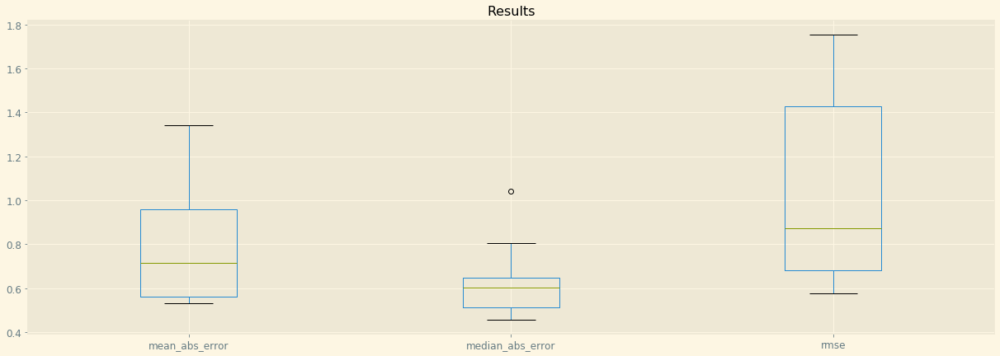

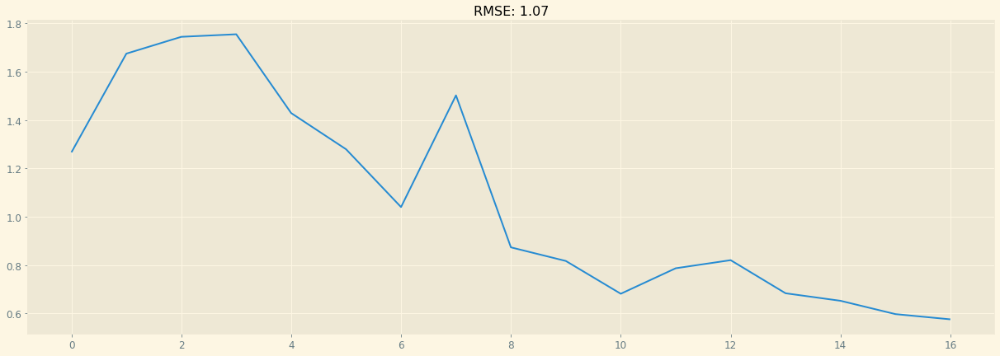

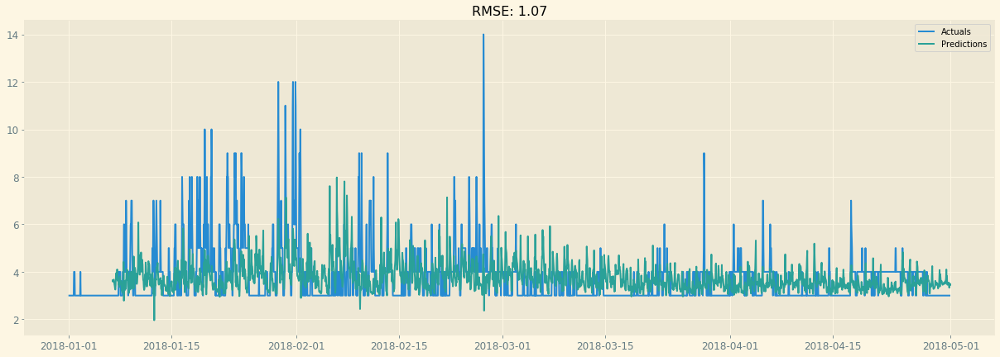

In [18]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_24 = pd.DataFrame(results_over_time)
predictions_over_time_24 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_24

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_24, results_over_time_24)

###  City average

In [ ]:
predictions_list =[predictions_over_time_08, predictions_over_time_18, predictions_over_time_35]
results_list = [results_over_time_08['rmse'], results_over_time_18['rmse'], results_over_time_35['rmse']]

predictions_final = pd.concat(predictions_list, axis=1).sort_index().mean(axis=1)
results_final = pd.concat(results_list, axis=1).sort_index().mean(axis=1)

target_mean = df_temp[particle_of_interest].groupby('date').mean()

fig, ax = plt.subplots(figsize=(21,7))
actuals = plt.plot(target_mean[min_train_date:], label='Actuals')
predictions = plt.plot(predictions_final, label='Predictions')
error = results_final.mean()
plt.legend(loc='best')
plt.title('RMSE: %.2f'% error)
plt.show()